In [1]:
# Ocean Heat Budget Analyses in the Antarctica continental shelf (WAOM)

# Fabio B Dias - 15 August 2023
# Description:
#     this script get the heat transport across 1500m calculate for individual experiments:
# WAOM10: WAOM10extend_shflim_S_0.25Q_Cross-1500m-Transport.ipynb
# WAOM4: WAOM4extend_shflim_S_0.25Q_Cross-1500m-Transport.py
# WAOM4-NOTIDE: WAOM4extend_shflim_S_0.25Q_notides_Cross-1500m-Transport.py
# WAOM2:
# and plot vertically-integrated analyses:

# Comments on versions:
# v2 included updates from Claire/Christina from the original cosima-recipes (Cross-transport...)
# v3 fixed error in the extraction (wasn't accounting mask_x/y_calculation for heat transport)
# v4 follows access-om2 calcualtions and apply Tf correction BEFORE extracting heat transport across contour 
    # (v3 were doing it after and that mess up the eddy estimations - not sure why)
    # it actually didn't fix the eddy calc; need to 


# import xarray as xr
# import xgcm
# import numpy as np
# import xroms

In [2]:
# read nc output from WAOM 10km_CF run

import xarray as xr
import pandas as p
import numpy as  np
import numpy.ma as ma
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib as mpl
# mpl.use('Agg')
import matplotlib.pyplot as plt
import matplotlib.dates as dates
from matplotlib.ticker import NullFormatter
from matplotlib.colors import LinearSegmentedColormap   # for custom colormaps

from datetime import datetime, timedelta

from netCDF4 import Dataset
from netCDF4 import num2date, date2num
from matplotlib.ticker import NullFormatter
from matplotlib.colors import LinearSegmentedColormap   # for custom colormaps
import cmocean

import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

import pyresample

import gsw


from dask.distributed import Client

import warnings
warnings.filterwarnings('ignore')

In [3]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 7
Total threads: 28,Total memory: 251.18 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:39835,Workers: 7
Dashboard: /proxy/8787/status,Total threads: 28
Started: Just now,Total memory: 251.18 GiB
Comm: tcp://127.0.0.1:33695,Total threads: 4
Dashboard: /proxy/40991/status,Memory: 35.88 GiB
Nanny: tcp://127.0.0.1:44469,


In [4]:
tmp_files_dir = '/g/data3/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/'

In [5]:
# determine constants:
# rho0 = 1025 # kg. m-3
# Cp = 3989.245 # J.kg-1.degC-1
# Tf = -1.95 # degC

# use same values as access-om2-01
rho0 = 1035 # kg. m-3
Cp = 3992.1 # J.kg-1.degC-1



In [6]:
    %%time
    
    # load waom4 3D temp field to plot some maps
    path_ECCO2_4km = '/g/data/hh5/tmp/access-om/fbd581/ROMS/OUTPUT/waom4extend_shflim_S_0.25Q/output_01-20yr/ocean_avg_00*.nc'
    
    ds = xr.open_mfdataset(paths='/g/data/hh5/tmp/access-om/fbd581/ROMS/OUTPUT/waom4extend_shflim_S_0.25Q/output_01-20yr/ocean_avg_0010.nc')#, chunks={'eta_rho': '200MB'}, parallel=True, decode_times=False)
    temp3d_4km= ds.variables["temp"]
    melt_4km= ds.variables["m"]
    ds = ds.set_coords(['Cs_r', 'Cs_w', 'hc', 'h', 'Vtransform'])
    # calc dz:
    hwater = ds.h -abs(ds.zice) # replace ds.h for hwater below
    Zo_rho = (ds.hc * ds.s_rho + ds.Cs_r * hwater) / (ds.hc + hwater)
    z_rho3d_4km = ds.zeta + (ds.zeta + hwater) * Zo_rho -abs(ds.zice)
    del Zo_rho
    ds.close()
    
    ds = xr.open_mfdataset(paths='/g/data/hh5/tmp/access-om/fbd581/ROMS/OUTPUT/waom4extend_shflim_S_0.25Q/output_01-10yr_notides/ocean_avg_0010.nc')#, chunks={'eta_rho': '200MB'}, parallel=True, decode_times=False)
    temp3d_4kmNT= ds.variables["temp"]
    melt_4kmNT= ds.variables["m"]
    ds = ds.set_coords(['Cs_r', 'Cs_w', 'hc', 'h', 'Vtransform'])
    # calc dz:
    hwater = ds.h -abs(ds.zice) # replace ds.h for hwater below
    Zo_rho = (ds.hc * ds.s_rho + ds.Cs_r * hwater) / (ds.hc + hwater)
    z_rho3d_4kmNT = ds.zeta + (ds.zeta + hwater) * Zo_rho -abs(ds.zice)
    del Zo_rho
    ds.close()
    
    ds = xr.open_mfdataset(paths='/g/data/hh5/tmp/access-om/fbd581/ROMS/OUTPUT/waom10extend_shflim_S_0.25Q/output_01-20yr/ocean_avg_0020.nc')#, chunks={'eta_rho': '200MB'}, parallel=True, decode_times=False)
    temp3d_10km= ds.variables["temp"]
    melt_10km= ds.variables["m"]
    ds = ds.set_coords(['Cs_r', 'Cs_w', 'hc', 'h', 'Vtransform'])
    # calc dz:
    hwater = ds.h -abs(ds.zice) # replace ds.h for hwater below
    Zo_rho = (ds.hc * ds.s_rho + ds.Cs_r * hwater) / (ds.hc + hwater)
    z_rho3d_10km = ds.zeta + (ds.zeta + hwater) * Zo_rho -abs(ds.zice)
    del Zo_rho
    ds.close()
    
    # read grid file for lon/lat coordinates
    dg = xr.open_dataset("/g/data3/hh5/tmp/access-om/fbd581/ROMS/waom4_frc/waom4extend_grd.nc")
    lat_rho_4km= dg.variables["lat_rho"]
    lon_rho_4km = dg.variables["lon_rho"]
    pm_4km = dg.variables["pm"]
    pn_4km = dg.variables["pn"]
    zice_4km = dg.variables["zice"]
    h_4km = dg.variables["h"]
    dg.close()
    print('Print lon/lat_rho shapes',lon_rho_4km.shape, lat_rho_4km.shape)
    print('Print lon/lat_rho shapes',lon_rho_4km[0:-1,0:-1].shape, lat_rho_4km[0:-1,0:-1].shape)
    
    dg = xr.open_dataset("/g/data3/hh5/tmp/access-om/fbd581/ROMS/waom10_frc/waom10extend_grd.nc")
    lat_rho_10km= dg.variables["lat_rho"]
    lon_rho_10km = dg.variables["lon_rho"]
    lat_u_10km= dg.variables["lat_u"]
    lon_u_10km = dg.variables["lon_u"]
    lat_v_10km= dg.variables["lat_v"]
    lon_v_10km = dg.variables["lon_v"]
    pm_10km = dg.variables["pm"]
    pn_10km = dg.variables["pn"]
    zice_10km = dg.variables["zice"]
    h_10km = dg.variables["h"]
    dg.close()
    
    temp3d_4km.load()
    z_rho3d_4km.load()
    
    temp3d_4kmNT.load()
    # z_rho3d_4km.load()
    
    temp3d_10km.load()
    z_rho3d_10km.load()

Print lon/lat_rho shapes (1400, 1575) (1400, 1575)
Print lon/lat_rho shapes (1399, 1574) (1399, 1574)
CPU times: user 19.1 s, sys: 21.7 s, total: 40.8 s
Wall time: 1min 28s


<xarray.DataArray (ocean_time: 12, eta_rho: 560, xi_rho: 630, s_rho: 31)> Size: 1GB
array([[[[-4.04414645e+03, -4.02676223e+03, -3.99135738e+03, ...,
          -2.82225396e+01, -1.47417771e+01, -4.27386332e+00],
         [-4.26838289e+03, -4.25040147e+03, -4.21334284e+03, ...,
          -2.88150559e+01, -1.49659574e+01, -4.30635711e+00],
         [-4.37797400e+03, -4.35970150e+03, -4.32183532e+03, ...,
          -2.91116069e+01, -1.50833014e+01, -4.33084103e+00],
         ...,
         [-3.12444912e+03, -3.10954576e+03, -3.08095221e+03, ...,
          -2.60611166e+01, -1.41232023e+01, -4.47413801e+00],
         [-3.05779750e+03, -3.04307637e+03, -3.01497836e+03, ...,
          -2.58723480e+01, -1.40487922e+01, -4.46170287e+00],
         [-3.20284125e+03, -3.18772411e+03, -3.15854818e+03, ...,
          -2.62811913e+01, -1.42093387e+01, -4.48796139e+00]],

        [[-4.48395334e+03, -4.46539971e+03, -4.42675281e+03, ...,
          -2.93796337e+01, -1.51784128e+01, -4.33656281e+00],
         [-4.35018710e+03, -4.33198833e+03, -4.29432681e+03, ...,
          -2.90298418e+01, -1.50469075e+01, -4.31792887e+00],
         [-4.35507773e+03, -4.33686602e+03, -4.29916854e+03, ...,
          -2.90516210e+01, -1.50607227e+01, -4.32762733e+00],
...
         [-4.54396678e+03, -4.52525835e+03, -4.48617833e+03, ...,
          -3.05509292e+01, -1.62552015e+01, -5.36537812e+00],
         [-4.56198809e+03, -4.54323191e+03, -4.50401914e+03, ...,
          -3.05906897e+01, -1.62656140e+01, -5.36065192e+00],
         [-4.61885734e+03, -4.59995061e+03, -4.56031919e+03, ...,
          -3.07385498e+01, -1.63210061e+01, -5.36840051e+00]],

        [[-4.45242806e+03, -4.43396125e+03, -4.39555330e+03, ...,
          -3.00762840e+01, -1.59289376e+01, -5.11552971e+00],
         [-4.15657499e+03, -4.13889441e+03, -4.10266698e+03, ...,
          -2.92990501e+01, -1.56359041e+01, -5.07358394e+00],
         [-4.18506943e+03, -4.16731304e+03, -4.13087562e+03, ...,
          -2.93908411e+01, -1.56809555e+01, -5.09433098e+00],
         ...,
         [-4.63395143e+03, -4.61500479e+03, -4.57526233e+03, ...,
          -3.07849015e+01, -1.63428558e+01, -5.37764057e+00],
         [-4.67109270e+03, -4.65204779e+03, -4.61203191e+03, ...,
          -3.08741179e+01, -1.63717360e+01, -5.37546655e+00],
         [-4.95408611e+03, -4.93429398e+03, -4.89219643e+03, ...,
          -3.16048494e+01, -1.66443071e+01, -5.41298380e+00]]]])
Coordinates:
    Vtransform  int32 4B 2
    hc          float64 8B 250.0
    h           (eta_rho, xi_rho) float64 3MB 4.05e+03 4.274e+03 ... 4.96e+03
    x_rho       (eta_rho, xi_rho) float64 3MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    y_rho       (eta_rho, xi_rho) float64 3MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
  * ocean_time  (ocean_time) datetime64[ns] 96B 2026-01-11T05:00:00 ... 2026-...
  * s_rho       (s_rho) float64 248B -0.9839 -0.9516 ... -0.04839 -0.01613
    Cs_r        (s_rho) float64 248B -0.9995 -0.997 ... -0.0008464 -9.329e-05
Dimensions without coordinates: eta_rho, xi_rho

### load variables (vol&heat transp, T,S, z, distance, lat/lon) along/across the contour:

#### 1500m isobath

In [98]:
# load ice draft to create masks
expt = 'WAOM10'


ds = xr.open_dataset(tmp_files_dir + expt + '_vol_trans_1500m_daily_v3_3yrs')
vol_transport_10km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_vol_trans_1500m_daily_v3')
vol_transport_10km_1yr = ds.variables["__xarray_dataarray_variable__"]
ds.close()

# ds = xr.open_dataset(tmp_files_dir + expt + '_heat_trans_1500m_daily_v3')
ds = xr.open_dataset(tmp_files_dir + expt + '_heat_trans_1500m_daily_v4_3yrs')
heat_transport_10km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_heat_trans_1500m_daily_v4')
heat_transport_10km_1yr = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_temp_1500m_daily_v3_3yrs')
temp_10km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_temp_1500m_daily_v3')
temp_10km_1yr = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_salt_1500m_daily_v3')
salt_10km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_z_rho_1500m_daily_v4')
z_rho_10km = ds.variables["__xarray_dataarray_variable__"]
ds.close() 

ds = xr.open_dataset(tmp_files_dir + expt + '_dist_along_1500m_v3')
dist_along_10km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_lon_along_1500m_v3')
lon_along_10km = ds.variables["one"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_lat_along_1500m_v3')
lat_along_10km = ds.variables["two"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_dist_indices_1500m_v3')
distance_indices_10km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

In [8]:
# # load ice draft to create masks
# expt = 'WAOM10_newcode'

# ds = xr.open_dataset(tmp_files_dir + expt + '_vol_trans_1500m_daily_v3')
# vol_transport_10kmNC = ds.variables["__xarray_dataarray_variable__"]
# ds.close()

# ds = xr.open_dataset(tmp_files_dir + expt + '_heat_trans_1500m_daily_v3')
# heat_transport_10kmNC = ds.variables["__xarray_dataarray_variable__"]
# ds.close()

# ds = xr.open_dataset(tmp_files_dir + expt + '_temp_1500m_daily_v3')
# temp_10kmNC = ds.variables["__xarray_dataarray_variable__"]
# ds.close()

# ds = xr.open_dataset(tmp_files_dir + expt + '_salt_1500m_daily_v3')
# salt_10kmNC = ds.variables["__xarray_dataarray_variable__"]
# ds.close()

# ds = xr.open_dataset(tmp_files_dir + expt + '_z_rho_1500m_daily_v3')
# z_rho_10kmNC = ds.variables["__xarray_dataarray_variable__"]
# ds.close()



In [9]:
%%time

expt = 'WAOM4'

ds = xr.open_dataset(tmp_files_dir + expt + '_vol_trans_1500m_daily_v3')
vol_transport_4km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

# ds = xr.open_dataset(tmp_files_dir + expt + '_heat_trans_1500m_daily_v3')
ds = xr.open_dataset(tmp_files_dir + expt + '_heat_trans_1500m_daily_v4')
heat_transport_4km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_temp_1500m_daily_v3')
temp_4km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_salt_1500m_daily_v3')
salt_4km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_z_rho_1500m_daily_v4') 
z_rho_4km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_dist_along_1500m_v3')
dist_along_4km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_lon_along_1500m_v3')
lon_along_4km = ds.variables["one"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_lat_along_1500m_v3')
lat_along_4km = ds.variables["two"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_dist_indices_1500m_v3')
distance_indices_4km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

CPU times: user 96.3 ms, sys: 68.5 ms, total: 165 ms
Wall time: 565 ms


In [10]:
%%time
expt = 'WAOM4_notides'

ds = xr.open_dataset(tmp_files_dir + expt + '_vol_trans_1500m_daily_v3')
vol_transport_4kmNT = ds.variables["__xarray_dataarray_variable__"]
ds.close()

#ds = xr.open_dataset(tmp_files_dir + expt + '_heat_trans_1500m_daily_v3')
ds = xr.open_dataset(tmp_files_dir + expt + '_heat_trans_1500m_daily_v4')
heat_transport_4kmNT = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_temp_1500m_daily_v3')
temp_4kmNT = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_salt_1500m_daily_v3')
salt_4kmNT = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_z_rho_1500m_daily_v4') # replace for z_rho_1500m_5daily when it finishes (9/8/23)
z_rho_4kmNT = ds.variables["__xarray_dataarray_variable__"]
ds.close()


CPU times: user 86.3 ms, sys: 64.2 ms, total: 151 ms
Wall time: 379 ms


#### Calving Front


In [11]:
# load ice draft to create masks
expt = 'WAOM10'

ds = xr.open_dataset(tmp_files_dir + expt + '_vol_trans_CF_daily_v3')
vol_transport_10km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

# ds = xr.open_dataset(tmp_files_dir + expt + '_heat_trans_CF_daily_v3')
ds = xr.open_dataset(tmp_files_dir + expt + '_heat_trans_CF_daily_v4')
heat_transport_10km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_temp_CF_daily_v3')
temp_10km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_salt_CF_daily_v3')
salt_10km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_z_rho_CF_daily_v4')
z_rho_10km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_dist_along_CF_v3')
dist_along_10km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_lon_along_CF_v3')
lon_along_10km_CF = ds.variables["one"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_lat_along_CF_v3')
lat_along_10km_CF = ds.variables["two"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_dist_indices_CF_v3')
distance_indices_10km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

In [12]:
%%time

expt = 'WAOM4'

ds = xr.open_dataset(tmp_files_dir + expt + '_vol_trans_CF_daily_v3')
vol_transport_4km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

# ds = xr.open_dataset(tmp_files_dir + expt + '_heat_trans_CF_daily_v3')
ds = xr.open_dataset(tmp_files_dir + expt + '_heat_trans_CF_daily_v4')
heat_transport_4km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_temp_CF_daily_v3')
temp_4km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_salt_CF_daily_v3')
salt_4km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_z_rho_CF_daily_v4') 
z_rho_4km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_dist_along_CF_v3')
dist_along_4km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_lon_along_CF_v3')
lon_along_4km_CF = ds.variables["one"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_lat_along_CF_v3')
lat_along_4km_CF = ds.variables["two"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_dist_indices_CF_v3')
distance_indices_4km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

CPU times: user 135 ms, sys: 59.7 ms, total: 195 ms
Wall time: 655 ms


In [13]:
%%time
expt = 'WAOM4_notides'

ds = xr.open_dataset(tmp_files_dir + expt + '_vol_trans_CF_daily_v3')
vol_transport_4kmNT_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

# ds = xr.open_dataset(tmp_files_dir + expt + '_heat_trans_CF_daily_v3')
ds = xr.open_dataset(tmp_files_dir + expt + '_heat_trans_CF_daily_v4')
heat_transport_4kmNT_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_temp_CF_daily_v3')
temp_4kmNT_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_salt_CF_daily_v3')
salt_4kmNT_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_z_rho_CF_daily_v4') 
z_rho_4kmNT_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()


CPU times: user 94.7 ms, sys: 31.8 ms, total: 127 ms
Wall time: 444 ms


### obtain area and distances

In [14]:
# define along_contour axis with same length for both resolutions:
[dist_along_axis_10km, Zaxis_10km] = np.meshgrid(dist_along_10km, np.arange(0,31))
[dist_along_axis_4km, Zaxis_4km] = np.meshgrid(dist_along_4km, np.arange(0,31))

[dist_along_axis_10km_CF, Zaxis_10k_CFm] = np.meshgrid(dist_along_10km_CF, np.arange(0,31))
[dist_along_axis_4km_CF, Zaxis_4km_CF] = np.meshgrid(dist_along_4km_CF, np.arange(0,31))

# # Obtain area of the section along the isobath contour:
# # first get the distance/dy:
# dy_10km_tmp = dist_along_axis_10km[:,1:-1] - dist_along_axis_10km[:,0:-2]
# # repeate first and last dy to match size:
# dy_10km = np.empty(dist_along_axis_10km.shape)
# dy_10km[:,1:-1] =  dy_10km_tmp
# dy_10km[:,0] =  dy_10km_tmp[:,0]
# dy_10km[:,-1] =  dy_10km_tmp[:,-1]

# # 4km: first get the distance/dy:
# dy_4km_tmp = dist_along_axis_4km[:,1:-1] - dist_along_axis_4km[:,0:-2]
# dy_4km = np.empty(dist_along_axis_4km.shape)
# dy_4km[:,1:-1] =  dy_4km_tmp
# dy_4km[:,0] =  dy_4km_tmp[:,0]
# dy_4km[:,-1] =  dy_4km_tmp[:,-1]

# # calculate area 
# area_10km = dy_10km*1e6 # convert back to meters:
# area_4km = dy_4km*1e6 # convert back to meters:


In [15]:
fig_path = '/g/data3/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/'


# Binning the HT into density classes (sigma2)

In [16]:
# rho grid for binning:
rho_grid2=np.arange(36.2,37.4,0.025) # for sigma-2
len_rho_grid2=len(rho_grid2)


In [17]:
# # use salt and temp along the contour to calculate sigma:
sigma_2_10km = gsw.rho(salt_10km[:,:],temp_10km[:,:],2000) - 1000
sigma_2_4km = gsw.rho(salt_4km[:,:],temp_4km[:,:],2000) - 1000
sigma_2_4kmNT = gsw.rho(salt_4kmNT[:,:],temp_4kmNT[:,:],2000) - 1000

In [18]:
# same but for calving front (use salt and temp along the contour to calculate sigma):
sigma_2_10km_CF = gsw.rho(salt_10km_CF[:,:],temp_10km_CF[:,:],2000) - 1000
sigma_2_4km_CF = gsw.rho(salt_4km_CF[:,:],temp_4km_CF[:,:],2000) - 1000
sigma_2_4kmNT_CF = gsw.rho(salt_4kmNT_CF[:,:],temp_4kmNT_CF[:,:],2000) - 1000


#### 1500m isobath

In [310]:
# DEFINE coldest temp along contour:

Tf_10km = temp_10km.min().values
Tf_4km = temp_4km.min().values
Tf_4kmNT = temp_4kmNT.min().values

Tf_10km_CF = temp_10km_CF.min().values
Tf_4km_CF = temp_4km_CF.min().values
Tf_4kmNT_CF = temp_4kmNT_CF.min().values

print(Tf_10km, Tf_4km, Tf_4kmNT)
print(Tf_10km_CF, Tf_4km_CF, Tf_4kmNT_CF)
# Tf=Tf_10km
Tf = Tf_4kmNT # lowest of them all
print(Tf)

-2.9893722534179688 -3.283663511276245 -3.534879684448242
-2.9521701335906982 -3.2196805477142334 -3.183741807937622
-3.534879684448242


In [328]:
%time
# WAOM10

Tf_heat_transp_10km = Tf*vol_transport_10km*rho0*Cp # it doesn't matter if the mean is done now or later; Tf is cte.
                                                    # does it should matter? If we subtract V*Tf for each grid-point at each timestep
                                                    # Tests show it doesn't matter.

Tf_heat_transp_10km_1yr = Tf*vol_transport_10km_1yr*rho0*Cp

# calculate Mean as v_bar*T_bar, vert-discretised version:
Mean_transp_10km = vol_transport_10km.mean('ocean_time')*(temp_10km.mean('ocean_time')-Tf)*rho0*Cp
Mean_transp_10km_noTfcorr = vol_transport_10km.mean('ocean_time')*(temp_10km.mean('ocean_time'))*rho0*Cp

Mean_transp_10km_1yr = vol_transport_10km_1yr.mean('ocean_time')*(temp_10km_1yr.mean('ocean_time')-Tf)*rho0*Cp

Eddy_transp_10km = np.empty((1095,31,2690)) 
for mm in np.arange(0,1095):
    Eddy_transp_10km[mm,:] = (heat_transport_10km.isel(ocean_time=mm)) - Mean_transp_10km
    

# repeat for 1yr diag:

Eddy_transp_10km_1yr = np.empty((365,31,2690)) 
for mm in np.arange(0,365):
    Eddy_transp_10km_1yr[mm,:] = (heat_transport_10km_1yr.isel(ocean_time=mm)) - Mean_transp_10km_1yr
    


CPU times: user 7 μs, sys: 4 μs, total: 11 μs
Wall time: 21.9 μs


In [21]:
%time
# WAOM10

Tf_heat_transp_10km_CF = Tf*vol_transport_10km_CF*rho0*Cp # it doesn't matter if the mean is done now or later; Tf is cte.
                                                    # does it should matter? If we subtract V*Tf for each grid-point at each timestep
                                                    # Tests show it doesn't matter.

# calculate Mean as v_bar*T_bar, vert-discretised version:
Mean_transp_10km_CF = vol_transport_10km_CF.mean('ocean_time')*(temp_10km_CF.mean('ocean_time')-Tf)*rho0*Cp

Eddy_transp_10km_CF = np.empty((365,31,3298)) 
for mm in np.arange(0,365):
    Eddy_transp_10km_CF[mm,:] = (heat_transport_10km_CF[mm,:,:]) - Mean_transp_10km_CF
    



CPU times: user 2 μs, sys: 3 μs, total: 5 μs
Wall time: 7.87 μs


In [22]:
# %time
# # WAOM10 new code

# Tf_heat_transp_10kmNC = Tf*vol_transport_10kmNC*rho0*Cp # it doesn't matter if the mean is done now or later; Tf is cte.

# heat_transp_10kmNC = heat_transport_10kmNC*rho0*Cp - Tf_heat_transp_10kmNC

# # Total HT (online diag) annual-avg:
# annual_transp_10kmNC = heat_transp_10kmNC.mean('ocean_time')*rho0*Cp

# # calculate Mean as v_bar*T_bar, vert-discretised version:
# Mean_transp_10kmNC = vol_transport_10kmNC.mean('ocean_time')*(temp_10kmNC.mean('ocean_time')-Tf)*rho0*Cp
# Mean_transp_noTf_10kmNC = vol_transport_10kmNC.mean('ocean_time')*temp_10kmNC.mean('ocean_time')*rho0*Cp

# # Eddy heat transport: total - Mean
# Eddy_transp_10kmNC = np.empty((365,31,2690)) 
# Eddy_transp_vint_10kmNC = np.empty((365,2690)) 
# for mm in np.arange(0,365):
#     # Eddy_transp_10kmNC[mm,:,:] = (heat_transport_10kmNC[mm,:,:]) - Mean_transp_10kmNC
#     Eddy_transp_10kmNC[mm,:,:] = (heat_transp_10kmNC[mm,:,:]) - Mean_transp_10kmNC #- Tf_heat_transp_10kmNC
#     Eddy_transp_vint_10kmNC[mm,:] = (heat_transp_10kmNC[mm,:].sum('s_rho')) - Mean_transp_10kmNC.sum('s_rho')
 



In [23]:
%time
# WAOM4

Tf_heat_transp_4km = Tf*vol_transport_4km*rho0*Cp # it doesn't matter if the mean is done now or later; Tf is cte.
                                                    # does it should matter? If we subtract V*Tf for each grid-point at each timestep
                                                    # Tests show it doesn't matter.

# calculate Mean as v_bar*T_bar, vert-discretised version:
Mean_transp_4km = vol_transport_4km.mean('ocean_time')*(temp_4km.mean('ocean_time')-Tf)*rho0*Cp

Eddy_transp_4km = np.empty((365,31,7056)) 
for mm in np.arange(0,365):
    Eddy_transp_4km[mm,:] = (heat_transport_4km[mm,:,:]) - Mean_transp_4km
    



CPU times: user 1e+03 ns, sys: 3 μs, total: 4 μs
Wall time: 9.06 μs


In [24]:
%time
# WAOM4

Tf_heat_transp_4km_CF = Tf*vol_transport_4km_CF*rho0*Cp # it doesn't matter if the mean is done now or later; Tf is cte.
                                                    # does it should matter? If we subtract V*Tf for each grid-point at each timestep
                                                    # Tests show it doesn't matter.

# calculate Mean as v_bar*T_bar, vert-discretised version:
Mean_transp_4km_CF = vol_transport_4km_CF.mean('ocean_time')*(temp_4km_CF.mean('ocean_time')-Tf)*rho0*Cp

Eddy_transp_4km_CF = np.empty((365,31,9018)) 
for mm in np.arange(0,365):
    Eddy_transp_4km_CF[mm,:] = (heat_transport_4km_CF[mm,:,:]) - Mean_transp_4km_CF
    



CPU times: user 2 μs, sys: 3 μs, total: 5 μs
Wall time: 8.11 μs


In [25]:
%time
# WAOM4-notides

Tf_heat_transp_4kmNT = Tf*vol_transport_4kmNT*rho0*Cp # it doesn't matter if the mean is done now or later; Tf is cte.
                                                    # does it should matter? If we subtract V*Tf for each grid-point at each timestep
                                                    # Tests show it doesn't matter.

# calculate Mean as v_bar*T_bar, vert-discretised version:
Mean_transp_4kmNT = vol_transport_4kmNT.mean('ocean_time')*(temp_4kmNT.mean('ocean_time')-Tf)*rho0*Cp

Eddy_transp_4kmNT = np.empty((365,31,7056)) 
for mm in np.arange(0,365):
    Eddy_transp_4kmNT[mm,:] = (heat_transport_4kmNT[mm,:,:]) - Mean_transp_4kmNT
    



CPU times: user 2 μs, sys: 4 μs, total: 6 μs
Wall time: 10 μs


In [26]:
%time
# WAOM4-notides

Tf_heat_transp_4kmNT_CF = Tf*vol_transport_4kmNT_CF*rho0*Cp # it doesn't matter if the mean is done now or later; Tf is cte.
                                                    # does it should matter? If we subtract V*Tf for each grid-point at each timestep
                                                    # Tests show it doesn't matter.

# calculate Mean as v_bar*T_bar, vert-discretised version:
Mean_transp_4kmNT_CF = vol_transport_4kmNT_CF.mean('ocean_time')*(temp_4kmNT_CF.mean('ocean_time')-Tf)*rho0*Cp

Eddy_transp_4kmNT_CF = np.empty((365,31,9018)) 
for mm in np.arange(0,365):
    Eddy_transp_4kmNT_CF[mm,:] = (heat_transport_4kmNT_CF[mm,:,:]) - Mean_transp_4kmNT_CF
    



CPU times: user 1 μs, sys: 3 μs, total: 4 μs
Wall time: 8.34 μs


In [27]:
## TS diagram to choose isoypcnals:
# print(sigma_2_10km.shape, temp_10km.shape, salt_10km.shape)


# make grid for density contours
smin = 30 - (0.01 * 30)    #salt_ctrl_subregR.min - (0.01 * salt_ctrl_subregR.min)
smax = 36. + (0.01 * 36.)    #salt_ctrl_subregR.max + (0.01 * salt_ctrl_subregR.max)
tmin = -4. + (0.1 * -4.)       #temp_ctrl_subregR.min - (0.1 * temp_ctrl_subregR.max)
tmax = 5 + (0.1 * 5.)       #temp_ctrl_subregR.max + (0.1 * temp_ctrl_subregR.max)
print('tmin, tmax, smin, smax sizes=,', tmin, tmax, smin, smax)
# Calculate how many gridcells we need in the x and y dimensions
xdim = 30
ydim = 20
# Create empty grid of zeros
dens = np.zeros((ydim,xdim))
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(-4,5,ydim)
si = np.linspace(30,36,xdim)

Si, Ti = np.meshgrid(si, ti, sparse=False, indexing='ij')
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        dens[j,i]=gsw.rho(si[i],ti[j],2000) # sigma-2000
# Substract 1000 to convert to sigma-2
dens = dens - 1000

tmin, tmax, smin, smax sizes=, -4.4 5.5 29.7 36.36


TS diagrams take quite a while (few hours!) 
to make; commented.

In [28]:
# fig, ax = plt.subplots(nrows=2, ncols=3, figsize = (12, 6))
# # normal isopycnals
# for aa in range(0,2):
#     for bb in range(0,3):
#         CS1 = ax[aa,bb].contour(Si,Ti,dens.transpose(), levels=np.arange(35.5,38,.1),linestyles='solid', colors=[(.8,0.8,0.8)], linewidth=0.1)
#         ax[aa,bb].clabel(CS1, CS1.levels, inline=True, fontsize=10)
#         # CS2 = ax[aa,bb].contour(Si,Ti,dens.transpose(), levels=np.arange(37.2,38,.1),linestyles='solid', colors=[(.8,0.8,0.8)], linewidth=0.1)
#         # ax[aa,bb].clabel(CS2, CS2.levels, inline=True, fontsize=10)
#         ax[aa,bb].set_xlim([33.2,35])
#         ax[aa,bb].set_ylim([-3,2])
#         ax[aa,bb].set_ylabel('Temperature')
#         ax[aa,bb].set_xlabel('Salinity')

# c = ax[0,0].scatter(salt_10km,temp_10km,
#                  c=-z_rho_10km,marker="p", s=(72./fig.dpi)**2, 
#                  label='WAOM10-1500m', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
# c = ax[0,1].scatter(salt_4km,temp_4km,
#                  c=-z_rho_4km,marker="p", s=(72./fig.dpi)**2, 
#                  label='WAOM4-1500m', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
# c = ax[0,2].scatter(salt_4kmNT,temp_4kmNT,
#                  c=-z_rho_4kmNT,marker="p", s=(72./fig.dpi)**2, 
#                  label='WAOM4NT-1500m', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
# c = ax[1,0].scatter(salt_10km_CF,temp_10km_CF,
#                  c=-z_rho_10km_CF,marker="p", s=(72./fig.dpi)**2, 
#                  label='WAOM10-CF', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
# c = ax[1,1].scatter(salt_4km_CF,temp_4km_CF,
#                  c=-z_rho_4km_CF,marker="p", s=(72./fig.dpi)**2, 
#                  label='WAOM4-CF', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
# c = ax[1,2].scatter(salt_4kmNT_CF,temp_4kmNT_CF,
#                  c=-z_rho_4kmNT_CF,marker="p", s=(72./fig.dpi)**2, 
#                  label='WAOM4NT-CF', cmap=cmocean.cm.deep, vmin=0, vmax=2000)

# cbar_ax1 = fig.add_axes([0.91, 0.12,  0.01, 0.75])
# fig.colorbar(c, cax=cbar_ax1, orientation='vertical')
# cbar_ax1.set_ylabel('Depth (m)')#, labelpad=-35)

# # 

### do some depth x longitude plots

#### CROSS-1500M

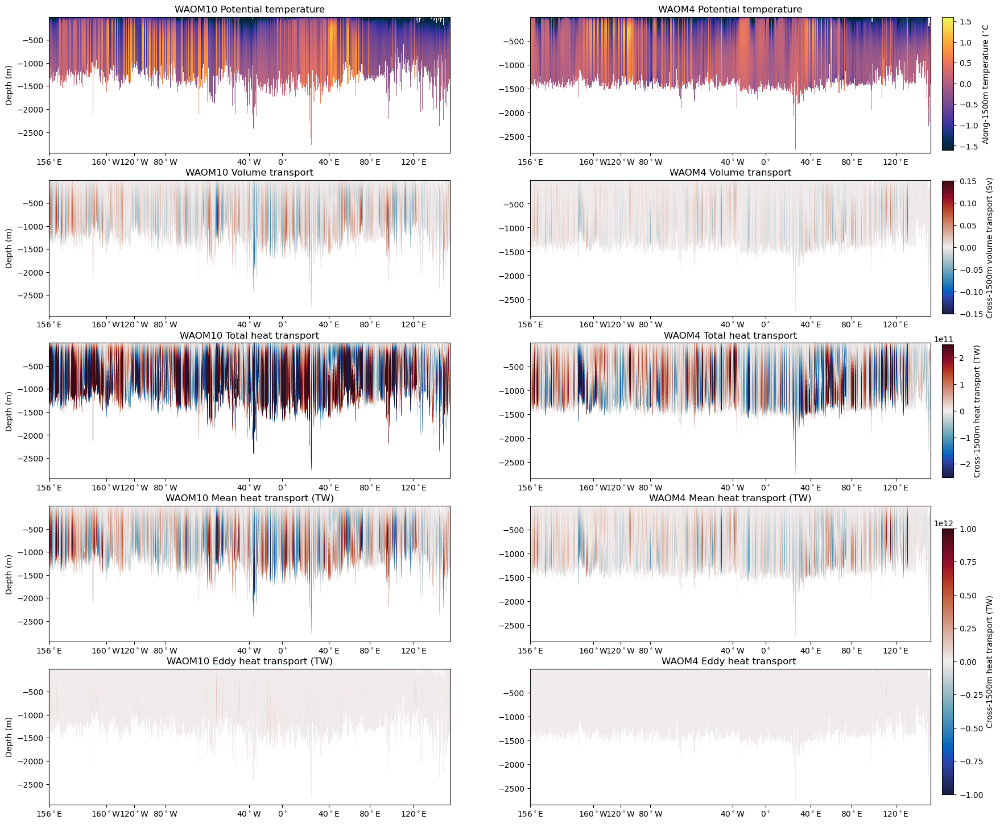

In [32]:
fig = plt.figure(figsize=(20, 18))


# --- TEMPERATURE

# WAOM10
ax1 = fig.add_subplot(521)
tp = ax1.pcolormesh(dist_along_axis_10km,z_rho_10km.mean('ocean_time'),temp_10km.mean('ocean_time'), vmin=-1.6, vmax=1.6, cmap=cmocean.cm.thermal)
# cc=plt.colorbar()
# cc.set_label('along-1500m temp. ($^{\circ}$C)')
ax1.set_title('WAOM10 Potential temperature')
ax1.set_ylabel('Depth (m)')
ax1.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km[-1])

# WAOM4
ax2 = fig.add_subplot(522)
ax2.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),temp_4km.mean('ocean_time'), vmin=-1.6, vmax=1.6, cmap=cmocean.cm.thermal)
ax2.set_title('WAOM4 Potential temperature')
# ax2.set_ylabel('Depth (m)')
ax2.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax2.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_4km[-1])

cbar_ax1= fig.add_axes([0.91, 0.75,  0.01, 0.13])
fig.colorbar(tp, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('Along-1500m temperature ($^{\circ}$C')#, labelpad=-35)

# --- VOLUME Transport
# WAOM10
ax3 = fig.add_subplot(523)
vtp = ax3.pcolormesh(dist_along_axis_10km,z_rho_10km.mean('ocean_time'),vol_transport_10km.mean('ocean_time')*1e-6 , vmin=-.15, vmax=.15, cmap=cmocean.cm.balance)
ax3.set_title('WAOM10 Volume transport')
ax3.set_ylabel('Depth (m)')
ax3.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax3.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3.set_xlim(0, dist_along_10km[-1])

# WAOM4
ax4 = fig.add_subplot(524)
ax4.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),vol_transport_4km.mean('ocean_time')*1e-6 , vmin=-.15, vmax=.15, cmap=cmocean.cm.balance)
ax4.set_title('WAOM4 Volume transport')
ax4.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax4.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax4.set_xlim(0, dist_along_4km[-1])
cbar_ax2= fig.add_axes([0.91, 0.59,  0.01, 0.13])
fig.colorbar(vtp, cax=cbar_ax2, orientation='vertical')
cbar_ax2.set_ylabel('Cross-1500m volume transport (Sv)')#, labelpad=-35)

# --- Heat transport (total)
# WAOM10
ax5 = fig.add_subplot(525)
htp = ax5.pcolormesh(dist_along_axis_10km,z_rho_10km.mean('ocean_time'),np.nanmean(heat_transport_10km, axis=0), vmin=-.25e12, vmax=.25e12, cmap=cmocean.cm.balance)
ax5.set_title('WAOM10 Total heat transport')
ax5.set_ylabel('Depth (m)')
ax5.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax5.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax5.set_xlim(0, dist_along_10km[-1])

# WAOM4
ax5 = fig.add_subplot(526)
htp = ax5.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),np.nanmean(heat_transport_4km, axis=0), vmin=-.25e12, vmax=.25e12, cmap=cmocean.cm.balance)
ax5.set_title('WAOM4 Total heat transport')
ax5.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax5.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax5.set_xlim(0, dist_along_4km[-1])

cbar_ax3= fig.add_axes([0.91, 0.43,  0.01, 0.13])
fig.colorbar(htp, cax=cbar_ax3, orientation='vertical')
cbar_ax3.set_ylabel('Cross-1500m heat transport (TW)')#, labelpad=-35)

# --- Heat transport (Mean)
# WAOM10
ax7 = fig.add_subplot(527)
htp = ax7.pcolormesh(dist_along_axis_10km,z_rho_10km.mean('ocean_time'),(Mean_transp_10km), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax7.set_title('WAOM10 Mean heat transport (TW)')
ax7.set_ylabel('Depth (m)')
ax7.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax7.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax7.set_xlim(0, dist_along_10km[-1])

# WAOM4
ax8 = fig.add_subplot(528)
ax8.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),(Mean_transp_4km), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax8.set_title('WAOM4 Mean heat transport (TW)')
ax8.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax8.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                        '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax8.set_xlim(0, dist_along_4km[-1])

# --- Heat transport (Eddy)
# WAOM10
ax9 = fig.add_subplot(529)
ax9.pcolormesh(dist_along_axis_10km,z_rho_10km.mean('ocean_time'),np.nanmean(Eddy_transp_10km, axis=0), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax9.set_title('WAOM10 Eddy heat transport (TW)')
ax9.set_ylabel('Depth (m)')
ax9.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax9.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax9.set_xlim(0, dist_along_10km[-1])

# WAOM4
ax10 = fig.add_subplot(5,2,10)
htp2 = ax10.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),np.nanmean(Eddy_transp_4km, axis=0), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax10.set_title('WAOM4 Eddy heat transport ')
ax10.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax10.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                        '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax10.set_xlim(0, dist_along_4km[-1])

cbar_ax4= fig.add_axes([0.91, 0.12,  0.01, 0.26])
fig.colorbar(htp2, cax=cbar_ax4, orientation='vertical')
cbar_ax4.set_ylabel('Cross-1500m heat transport (TW)')#, labelpad=-35)

plt.savefig(fig_path + 'WAOM10x4_Cross-1500m_byDepth_VT+HT+temp.png', bbox_inches='tight', dpi=300)
plt.show()

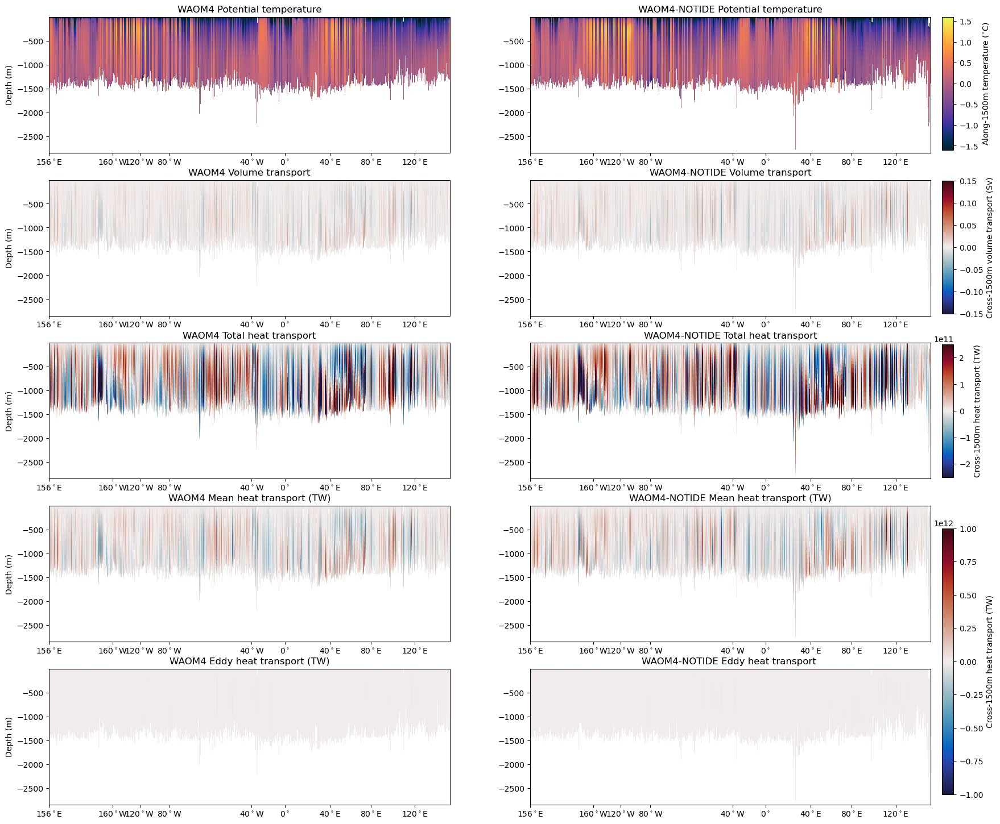

In [102]:
fig = plt.figure(figsize=(20, 18))


# --- TEMPERATURE

# WAOM4
ax1 = fig.add_subplot(521)
tp = ax1.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),temp_4km.mean('ocean_time'), vmin=-1.6, vmax=1.6, cmap=cmocean.cm.thermal)
# cc=plt.colorbar()
# cc.set_label('along-1500m temp. ($^{\circ}$C)')
ax1.set_title('WAOM4 Potential temperature')
ax1.set_ylabel('Depth (m)')
ax1.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_4km[-1])

# WAOM4
ax2 = fig.add_subplot(522)
ax2.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),temp_4kmNT.mean('ocean_time'), vmin=-1.6, vmax=1.6, cmap=cmocean.cm.thermal)
ax2.set_title('WAOM4-NOTIDE Potential temperature')
# ax2.set_ylabel('Depth (m)')
ax2.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax2.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_4km[-1])

cbar_ax1= fig.add_axes([0.91, 0.75,  0.01, 0.13])
fig.colorbar(tp, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('Along-1500m temperature ($^{\circ}$C)')#, labelpad=-35)

# --- VOLUME Transport
# WAOM4
ax3 = fig.add_subplot(523)
vtp = ax3.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),vol_transport_4km.mean('ocean_time')*1e-6 , vmin=-.15, vmax=.15, cmap=cmocean.cm.balance)
ax3.set_title('WAOM4 Volume transport')
ax3.set_ylabel('Depth (m)')
ax3.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax3.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3.set_xlim(0, dist_along_4km[-1])

# WAOM4
ax4 = fig.add_subplot(524)
ax4.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),vol_transport_4kmNT.mean('ocean_time')*1e-6 , vmin=-.15, vmax=.15, cmap=cmocean.cm.balance)
ax4.set_title('WAOM4-NOTIDE Volume transport')
ax4.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax4.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax4.set_xlim(0, dist_along_4km[-1])
cbar_ax2= fig.add_axes([0.91, 0.59,  0.01, 0.13])
fig.colorbar(vtp, cax=cbar_ax2, orientation='vertical')
cbar_ax2.set_ylabel('Cross-1500m volume transport (Sv)')#, labelpad=-35)

# --- Heat transport (total)
# WAOM4
ax5 = fig.add_subplot(525)
htp = ax5.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),np.nanmean(heat_transport_4km, axis=0), vmin=-.25e12, vmax=.25e12, cmap=cmocean.cm.balance)
ax5.set_title('WAOM4 Total heat transport')
ax5.set_ylabel('Depth (m)')
ax5.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax5.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax5.set_xlim(0, dist_along_4km[-1])

# WAOM4
ax5 = fig.add_subplot(526)
htp = ax5.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),np.nanmean(heat_transport_4kmNT, axis=0), vmin=-.25e12, vmax=.25e12, cmap=cmocean.cm.balance)
ax5.set_title('WAOM4-NOTIDE Total heat transport')
ax5.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax5.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax5.set_xlim(0, dist_along_4km[-1])

cbar_ax3= fig.add_axes([0.91, 0.43,  0.01, 0.13])
fig.colorbar(htp, cax=cbar_ax3, orientation='vertical')
cbar_ax3.set_ylabel('Cross-1500m heat transport (TW)')#, labelpad=-35)

# --- Heat transport (Mean)
# WAOM4
ax7 = fig.add_subplot(527)
htp = ax7.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),(Mean_transp_4km), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax7.set_title('WAOM4 Mean heat transport (TW)')
ax7.set_ylabel('Depth (m)')
ax7.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax7.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax7.set_xlim(0, dist_along_4km[-1])

# WAOM4
ax8 = fig.add_subplot(528)
ax8.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),(Mean_transp_4kmNT), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax8.set_title('WAOM4-NOTIDE Mean heat transport (TW)')
ax8.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax8.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                        '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax8.set_xlim(0, dist_along_4km[-1])

# --- Heat transport (Eddy)
# WAOM4
ax9 = fig.add_subplot(529)
ax9.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),np.nanmean(Eddy_transp_4km, axis=0), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax9.set_title('WAOM4 Eddy heat transport (TW)')
ax9.set_ylabel('Depth (m)')
ax9.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax9.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax9.set_xlim(0, dist_along_4km[-1])

# WAOM4
ax10 = fig.add_subplot(5,2,10)
htp2 = ax10.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),np.nanmean(Eddy_transp_4kmNT, axis=0), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax10.set_title('WAOM4-NOTIDE Eddy heat transport ')
ax10.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax10.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                        '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax10.set_xlim(0, dist_along_4km[-1])

cbar_ax4= fig.add_axes([0.91, 0.12,  0.01, 0.26])
fig.colorbar(htp2, cax=cbar_ax4, orientation='vertical')
cbar_ax4.set_ylabel('Cross-1500m heat transport (TW)')#, labelpad=-35)

plt.savefig(fig_path + 'WAOM4x4NT_Cross-1500m_byDepth_VT+HT+temp.png', bbox_inches='tight', dpi=300)
plt.show()

Text(0, 0.5, 'Along-1500m $\\sigma_2$ (kg m$^{-3}$)')

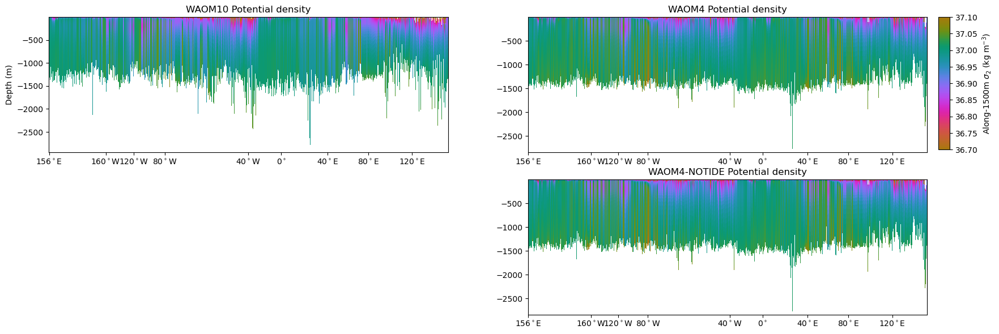

In [30]:
fig = plt.figure(figsize=(20, 18))


# --- Density

# WAOM10
ax1 = fig.add_subplot(521)
tp = ax1.pcolormesh(dist_along_axis_10km,z_rho_10km.mean('ocean_time'),sigma_2_10km.mean('ocean_time'), vmin=36.7, vmax=37.1, cmap=cmocean.cm.phase)
# cc=plt.colorbar()
# cc.set_label('along-1500m temp. ($^{\circ}$C)')
ax1.set_title('WAOM10 Potential density')
ax1.set_ylabel('Depth (m)')
ax1.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km[-1])

# WAOM4
ax2 = fig.add_subplot(522)
ax2.pcolormesh(dist_along_axis_4km,z_rho_4km.mean('ocean_time'),sigma_2_4km.mean('ocean_time'), vmin=36.7, vmax=37.1, cmap=cmocean.cm.phase)
ax2.set_title('WAOM4 Potential density')
# ax2.set_ylabel('Depth (m)')
ax2.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax2.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_4km[-1])


# WAOM4-NT
ax2 = fig.add_subplot(524)
ax2.pcolormesh(dist_along_axis_4km,z_rho_4kmNT.mean('ocean_time'),sigma_2_4kmNT.mean('ocean_time'), vmin=36.7, vmax=37.1, cmap=cmocean.cm.phase)
ax2.set_title('WAOM4-NOTIDE Potential density')
# ax2.set_ylabel('Depth (m)')
ax2.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax2.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_4km[-1])

cbar_ax1= fig.add_axes([0.91, 0.75,  0.01, 0.13])
fig.colorbar(tp, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('Along-1500m $\sigma_2$ (kg m$^{-3}$)')#, labelpad=-35)

Text(0, 0.5, 'Along-Calving front $\\sigma_2$ (kg m$^{-3}$)')

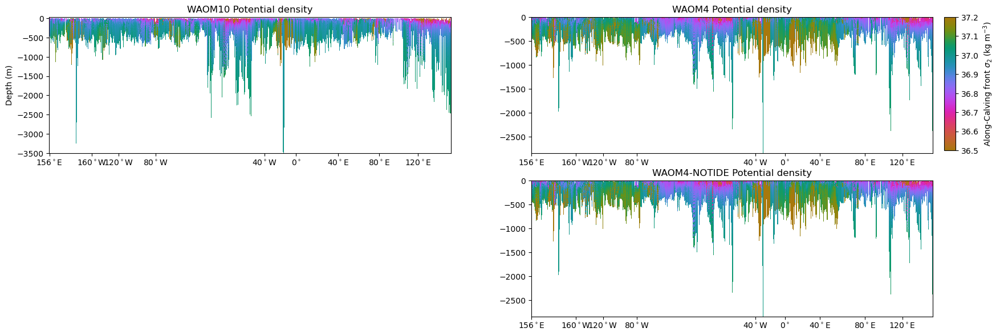

In [31]:
fig = plt.figure(figsize=(20, 18))


# --- Density

# WAOM10
ax1 = fig.add_subplot(521)
tp = ax1.pcolor(dist_along_axis_10km_CF,z_rho_10km_CF.mean('ocean_time'),sigma_2_10km_CF.mean('ocean_time'), vmin=36.5, vmax=37.2, cmap=cmocean.cm.phase)
# cc=plt.colorbar()
# cc.set_label('along-Calving front temp. ($^{\circ}$C)')
ax1.set_title('WAOM10 Potential density')
ax1.set_ylabel('Depth (m)')
ax1.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km_CF[-1])

# WAOM4
ax2 = fig.add_subplot(522)
ax2.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),sigma_2_4km_CF.mean('ocean_time'), vmin=36.5, vmax=37.2, cmap=cmocean.cm.phase)
ax2.set_title('WAOM4 Potential density')
# ax2.set_ylabel('Depth (m)')
ax2.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax2.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_4km_CF[-1])


# WAOM4-NT
ax2 = fig.add_subplot(524)
ax2.pcolor(dist_along_axis_4km_CF,z_rho_4kmNT_CF.mean('ocean_time'),sigma_2_4kmNT_CF.mean('ocean_time'), vmin=36.5, vmax=37.2, cmap=cmocean.cm.phase)
ax2.set_title('WAOM4-NOTIDE Potential density')
# ax2.set_ylabel('Depth (m)')
ax2.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax2.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_4km_CF[-1])

cbar_ax1= fig.add_axes([0.91, 0.75,  0.01, 0.13])
fig.colorbar(tp, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('Along-Calving front $\sigma_2$ (kg m$^{-3}$)')#, labelpad=-35)

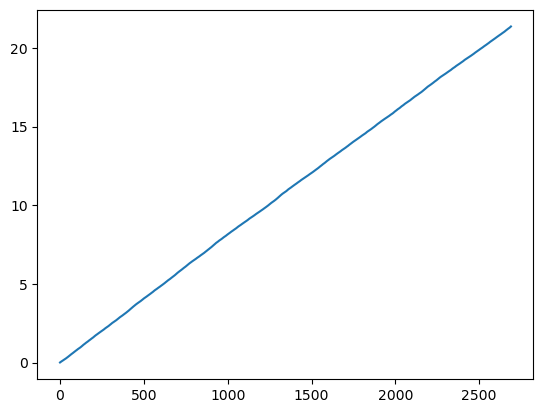

In [32]:
plt.plot(dist_along_10km)

#### CROSS-CF:

For WAOM4, currently the z_rho along contour doesn't match with other variables (like vol transp, heat transp) dimensions' sizes (9018 x 9014).
This is related to the version of the contour. I'm currently running the v3/v4 for the 4km_CF CF contour (24.6.24)

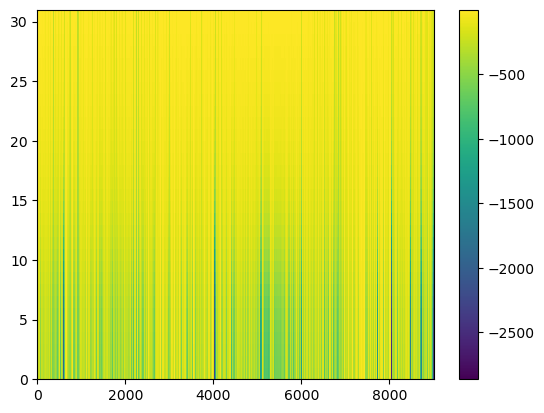

In [33]:
plt.pcolor(z_rho_4km_CF.mean('ocean_time'))
plt.colorbar()

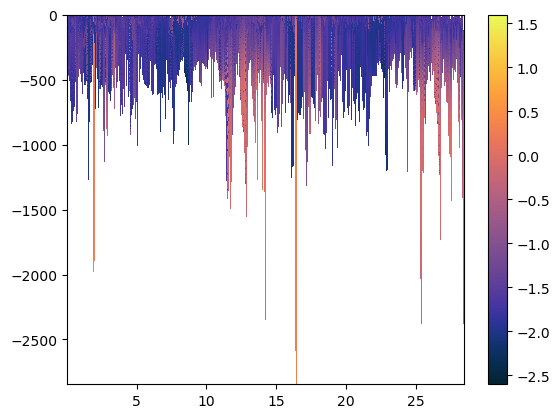

In [34]:
# plt.pcolor(temp_10km_CF.mean('ocean_time'))#, vmin=-1.6, vmax=1.6, cmap=cmocean.cm.thermal)
# plt.pcolormesh(dist_along_axis_10km_CF,z_rho_10km_CF.mean('ocean_time'),temp_10km_CF.mean('ocean_time'))#, vmin=-1.6, vmax=1.6, cmap=cmocean.cm.thermal)
plt.pcolor(dist_along_axis_4km_CF ,z_rho_4km_CF.mean('ocean_time'),temp_4km_CF.mean('ocean_time').values, vmin=-2.6, vmax=1.6, cmap=cmocean.cm.thermal)

plt.colorbar()

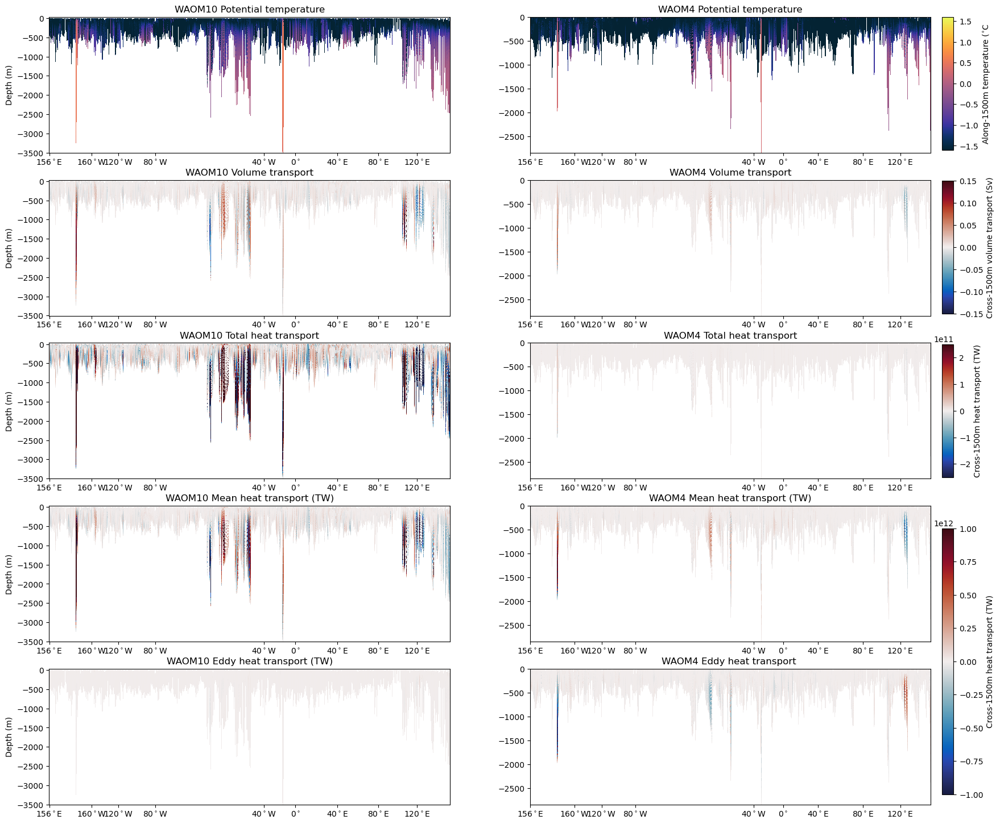

In [35]:
fig = plt.figure(figsize=(20, 18))


# --- TEMPERATURE

# WAOM10
ax1 = fig.add_subplot(521)
tp = ax1.pcolor(dist_along_axis_10km_CF,z_rho_10km_CF.mean('ocean_time'),temp_10km_CF.mean('ocean_time'), vmin=-1.6, vmax=1.6, cmap=cmocean.cm.thermal)
# cc=plt.colorbar()
# cc.set_label('along-1500m temp. ($^{\circ}$C)')
ax1.set_title('WAOM10 Potential temperature')
ax1.set_ylabel('Depth (m)')
ax1.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km_CF[-1])

# WAOM4
ax2 = fig.add_subplot(522)
ax2.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),temp_4km_CF.mean('ocean_time'), vmin=-1.6, vmax=1.6, cmap=cmocean.cm.thermal)
ax2.set_title('WAOM4 Potential temperature')
# ax2.set_ylabel('Depth (m)')
ax2.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax2.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_4km_CF[-1])

cbar_ax1= fig.add_axes([0.91, 0.75,  0.01, 0.13])
fig.colorbar(tp, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('Along-1500m temperature ($^{\circ}$C')#, labelpad=-35)

# --- VOLUME Transport
# WAOM10
ax3 = fig.add_subplot(523)
vtp = ax3.pcolor(dist_along_axis_10km_CF,z_rho_10km_CF.mean('ocean_time'),vol_transport_10km_CF.mean('ocean_time')*1e-6 , vmin=-.15, vmax=.15, cmap=cmocean.cm.balance)
ax3.set_title('WAOM10 Volume transport')
ax3.set_ylabel('Depth (m)')
ax3.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax3.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3.set_xlim(0, dist_along_10km_CF[-1])

# WAOM4
ax4 = fig.add_subplot(524)
ax4.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),vol_transport_4km_CF.mean('ocean_time')*1e-6 , vmin=-.15, vmax=.15, cmap=cmocean.cm.balance)
ax4.set_title('WAOM4 Volume transport')
ax4.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax4.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax4.set_xlim(0, dist_along_4km_CF[-1])
cbar_ax2= fig.add_axes([0.91, 0.59,  0.01, 0.13])
fig.colorbar(vtp, cax=cbar_ax2, orientation='vertical')
cbar_ax2.set_ylabel('Cross-1500m volume transport (Sv)')#, labelpad=-35)

# --- Heat transport (total)
# WAOM10
ax5 = fig.add_subplot(525)
htp = ax5.pcolor(dist_along_axis_10km_CF,z_rho_10km_CF.mean('ocean_time'),np.nanmean(heat_transport_10km_CF, axis=0), vmin=-.25e12, vmax=.25e12, cmap=cmocean.cm.balance)
ax5.set_title('WAOM10 Total heat transport')
ax5.set_ylabel('Depth (m)')
ax5.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax5.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax5.set_xlim(0, dist_along_10km_CF[-1])

# WAOM4
ax5 = fig.add_subplot(526)
htp = ax5.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),np.nanmean(heat_transport_4km_CF, axis=0), vmin=-.25e12, vmax=.25e12, cmap=cmocean.cm.balance)
ax5.set_title('WAOM4 Total heat transport')
ax5.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax5.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax5.set_xlim(0, dist_along_4km_CF[-1])

cbar_ax3= fig.add_axes([0.91, 0.43,  0.01, 0.13])
fig.colorbar(htp, cax=cbar_ax3, orientation='vertical')
cbar_ax3.set_ylabel('Cross-1500m heat transport (TW)')#, labelpad=-35)

# --- Heat transport (Mean)
# WAOM10
ax7 = fig.add_subplot(527)
htp = ax7.pcolor(dist_along_axis_10km_CF,z_rho_10km_CF.mean('ocean_time'),(Mean_transp_10km_CF), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax7.set_title('WAOM10 Mean heat transport (TW)')
ax7.set_ylabel('Depth (m)')
ax7.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax7.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax7.set_xlim(0, dist_along_10km_CF[-1])

# WAOM4
ax8 = fig.add_subplot(528)
ax8.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),(Mean_transp_4km_CF), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax8.set_title('WAOM4 Mean heat transport (TW)')
ax8.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax8.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                        '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax8.set_xlim(0, dist_along_4km_CF[-1])

# --- Heat transport (Eddy)
# WAOM10
ax9 = fig.add_subplot(529)
htp2 = ax9.pcolor(dist_along_axis_10km_CF,z_rho_10km_CF.mean('ocean_time'),np.nanmean(Eddy_transp_10km_CF, axis=0), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax9.set_title('WAOM10 Eddy heat transport (TW)')
ax9.set_ylabel('Depth (m)')
ax9.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax9.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax9.set_xlim(0, dist_along_10km_CF[-1])

# WAOM4
ax10 = fig.add_subplot(5,2,10)
htp2 = ax10.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),np.nanmean(Eddy_transp_4km_CF, axis=0), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax10.set_title('WAOM4 Eddy heat transport ')
ax10.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax10.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                        '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax10.set_xlim(0, dist_along_4km_CF[-1])

cbar_ax4= fig.add_axes([0.91, 0.12,  0.01, 0.26])
fig.colorbar(htp2, cax=cbar_ax4, orientation='vertical')
cbar_ax4.set_ylabel('Cross-1500m heat transport (TW)')#, labelpad=-35)

plt.savefig(fig_path + 'WAOM10x4_Cross-CF_byDepth_VT+HT+temp.png', bbox_inches='tight', dpi=300)
plt.show()

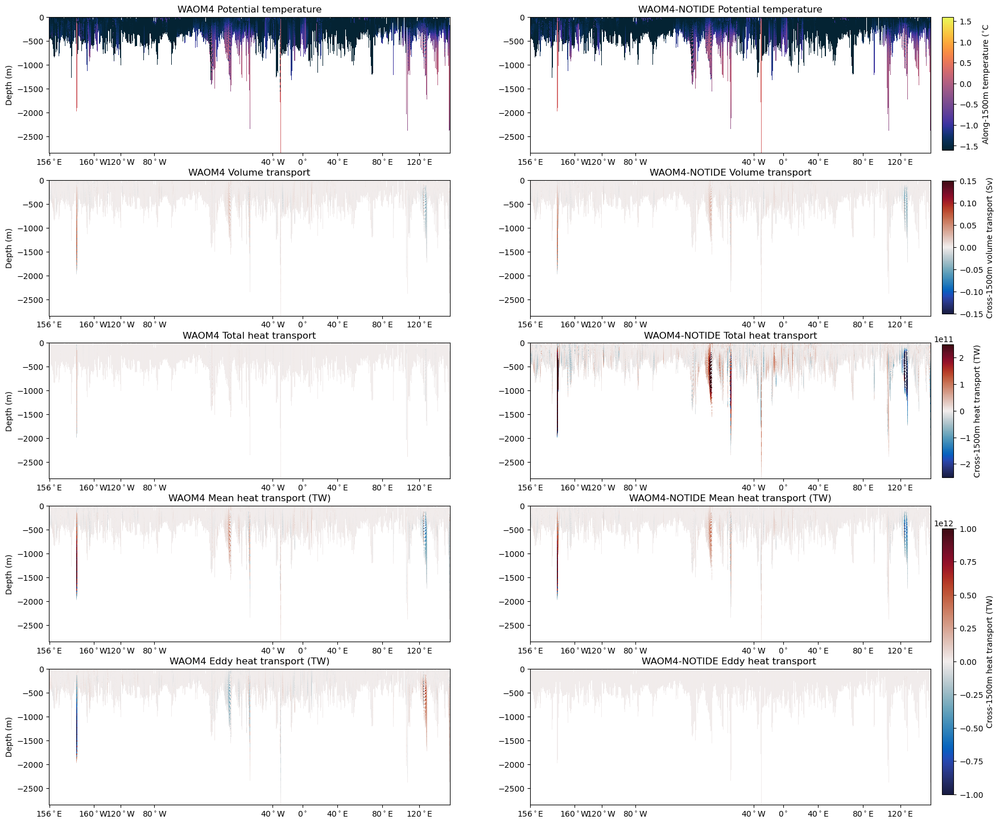

In [36]:
fig = plt.figure(figsize=(20, 18))


# --- TEMPERATURE

# WAOM4
ax1 = fig.add_subplot(521)
tp = ax1.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),temp_4km_CF.mean('ocean_time'), vmin=-1.6, vmax=1.6, cmap=cmocean.cm.thermal)
# cc=plt.colorbar()
# cc.set_label('along-1500m temp. ($^{\circ}$C)')
ax1.set_title('WAOM4 Potential temperature')
ax1.set_ylabel('Depth (m)')
ax1.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_4km_CF[-1])

# WAOM4
ax2 = fig.add_subplot(522)
ax2.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),temp_4kmNT_CF.mean('ocean_time'), vmin=-1.6, vmax=1.6, cmap=cmocean.cm.thermal)
ax2.set_title('WAOM4-NOTIDE Potential temperature')
# ax2.set_ylabel('Depth (m)')
ax2.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax2.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_4km_CF[-1])

cbar_ax1= fig.add_axes([0.91, 0.75,  0.01, 0.13])
fig.colorbar(tp, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('Along-1500m temperature ($^{\circ}$C')#, labelpad=-35)

# --- VOLUME Transport
# WAOM4
ax3 = fig.add_subplot(523)
vtp = ax3.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),np.nanmean(vol_transport_4km_CF, axis=0)*1e-6 , vmin=-.15, vmax=.15, cmap=cmocean.cm.balance)
ax3.set_title('WAOM4 Volume transport')
ax3.set_ylabel('Depth (m)')
ax3.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax3.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3.set_xlim(0, dist_along_4km_CF[-1])

# WAOM4
ax4 = fig.add_subplot(524)
ax4.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),np.nanmean(vol_transport_4kmNT_CF, axis=0)*1e-6 , vmin=-.15, vmax=.15, cmap=cmocean.cm.balance)
ax4.set_title('WAOM4-NOTIDE Volume transport')
ax4.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax4.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax4.set_xlim(0, dist_along_4km_CF[-1])
cbar_ax2= fig.add_axes([0.91, 0.59,  0.01, 0.13])
fig.colorbar(vtp, cax=cbar_ax2, orientation='vertical')
cbar_ax2.set_ylabel('Cross-1500m volume transport (Sv)')#, labelpad=-35)

# --- Heat transport (total)
# WAOM4
ax5 = fig.add_subplot(525)
htp = ax5.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),np.nanmean(heat_transport_4km_CF, axis=0), vmin=-.25e12, vmax=.25e12, cmap=cmocean.cm.balance)
ax5.set_title('WAOM4 Total heat transport')
ax5.set_ylabel('Depth (m)')
ax5.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax5.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax5.set_xlim(0, dist_along_4km_CF[-1])

# WAOM4
ax5 = fig.add_subplot(526)
htp = ax5.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),np.nanmean(heat_transport_4kmNT_CF, axis=0), vmin=-.25e12, vmax=.25e12, cmap=cmocean.cm.balance)
ax5.set_title('WAOM4-NOTIDE Total heat transport')
ax5.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax5.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax5.set_xlim(0, dist_along_4km_CF[-1])

cbar_ax3= fig.add_axes([0.91, 0.43,  0.01, 0.13])
fig.colorbar(htp, cax=cbar_ax3, orientation='vertical')
cbar_ax3.set_ylabel('Cross-1500m heat transport (TW)')#, labelpad=-35)

# --- Heat transport (Mean)
# WAOM4
ax7 = fig.add_subplot(527)
htp = ax7.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),(Mean_transp_4km_CF), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax7.set_title('WAOM4 Mean heat transport (TW)')
ax7.set_ylabel('Depth (m)')
ax7.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax7.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax7.set_xlim(0, dist_along_4km_CF[-1])

# WAOM4
ax8 = fig.add_subplot(528)
ax8.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),(Mean_transp_4kmNT_CF), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax8.set_title('WAOM4-NOTIDE Mean heat transport (TW)')
ax8.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax8.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                        '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax8.set_xlim(0, dist_along_4km_CF[-1])

# --- Heat transport (Eddy)
# WAOM4
ax9 = fig.add_subplot(529)
ax9.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),np.nanmean(Eddy_transp_4km_CF, axis=0), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax9.set_title('WAOM4 Eddy heat transport (TW)')
ax9.set_ylabel('Depth (m)')
ax9.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax9.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax9.set_xlim(0, dist_along_4km_CF[-1])

# WAOM4
ax10 = fig.add_subplot(5,2,10)
htp2 = ax10.pcolor(dist_along_axis_4km_CF,z_rho_4km_CF.mean('ocean_time'),np.nanmean(Eddy_transp_4kmNT_CF, axis=0), vmin=-1e12, vmax=1e12, cmap=cmocean.cm.balance)
ax10.set_title('WAOM4-NOTIDE Eddy heat transport ')
ax10.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax10.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                        '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax10.set_xlim(0, dist_along_4km_CF[-1])

cbar_ax4= fig.add_axes([0.91, 0.12,  0.01, 0.26])
fig.colorbar(htp2, cax=cbar_ax4, orientation='vertical')
cbar_ax4.set_ylabel('Cross-1500m heat transport (TW)')#, labelpad=-35)

plt.savefig(fig_path + 'WAOM4x4NT_Cross-CF_byDepth_VT+HT+temp.png', bbox_inches='tight', dpi=300)
plt.show()

In [291]:
print(heat_transport_10km.shape, Mean_transp_10km.shape)

eddy = np.sum(heat_transport_10km.isel(ocean_time=slice(0,1095)), axis=1) - np.sum(Mean_transp_10km, axis=0)
eddy_1yr = np.sum(heat_transport_10km_1yr.isel(ocean_time=slice(0,365)), axis=1) - np.sum(Mean_transp_10km_1yr, axis=0)

seas_jfm = np.nanmean(np.nansum(heat_transport_10km.isel(ocean_time=slice(0,92)), axis=1), axis=0) #- np.sum(Mean_transp_10km, axis=0)
seas_amj = np.nanmean(np.nansum(heat_transport_10km.isel(ocean_time=slice(93,184)), axis=1), axis=0) #- np.sum(Mean_transp_10km, axis=0)
seas_jas = np.nanmean(np.nansum(heat_transport_10km.isel(ocean_time=slice(185,276)), axis=1), axis=0) #- np.sum(Mean_transp_10km, axis=0) 
seas_ond = np.nanmean(np.nansum(heat_transport_10km.isel(ocean_time=slice(277,365)), axis=1), axis=0) #- np.sum(Mean_transp_10km, axis=0)

(1095, 31, 2690) (31, 2690)


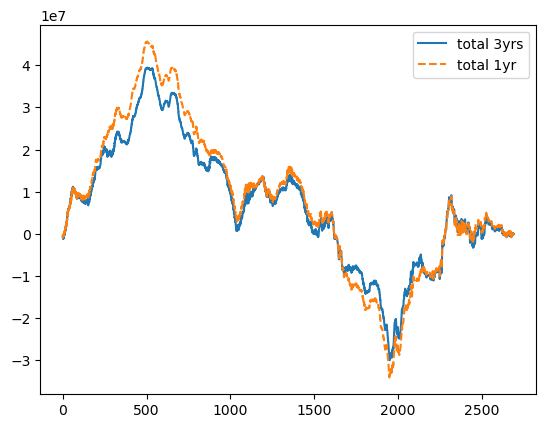

In [292]:
plt.plot(np.cumsum(np.mean(np.sum(vol_transport_10km, axis=1),axis=0)),label='total 3yrs')
plt.plot(np.cumsum(np.mean(np.sum(vol_transport_10km_1yr, axis=1),axis=0)),'--',label='total 1yr')
plt.legend()

- ok, volume transport across 1500m isobath is similar but not equal; slight stronger at 1year (still need to account for different temp_avg)
- 

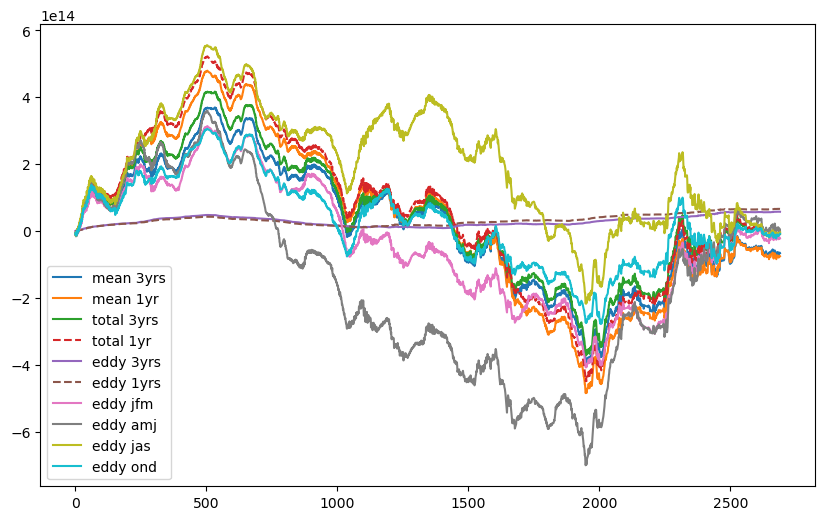

In [312]:
fig = plt.figure(figsize=(10, 6))

plt.plot(np.cumsum(np.sum(Mean_transp_10km, axis=0)),label='mean 3yrs')
plt.plot(np.cumsum(np.sum(Mean_transp_10km_1yr, axis=0)),label='mean 1yr')

plt.plot(np.cumsum(np.nanmean(np.nansum(heat_transport_10km, axis=1),axis=0)),label='total 3yrs')
plt.plot(np.cumsum(np.nanmean(np.nansum(heat_transport_10km_1yr, axis=1),axis=0)),'--',label='total 1yr')
plt.plot(np.cumsum(np.mean(np.sum(Eddy_transp_10km, axis=1),axis=0)),label='eddy 3yrs')
plt.plot(np.cumsum(np.mean(np.sum(Eddy_transp_10km_1yr, axis=1),axis=0)),'--',label='eddy 1yrs') # same as the one above!

# plt.plot(np.cumsum(np.nanmean(np.sum(heat_transport_10km.isel(ocean_time=slice(100,128)), axis=1),axis=0)),label='total')
# plt.plot(np.cumsum(np.nanmean(eddy[200:300,:],axis=0)),label='eddy')
# plt.plot(np.cumsum(np.nanmean(eddy[100:128,:],axis=0)),label='eddy')
# plt.plot(np.cumsum(np.mean(eddy,axis=0)),'--',label='eddy 3ann')
# plt.plot(np.cumsum(np.mean(eddy_1yr,axis=0)),'--',label='eddy 1ann')

plt.plot(np.cumsum(seas_jfm),label='eddy jfm')
plt.plot(np.cumsum(seas_amj),label='eddy amj')
plt.plot(np.cumsum(seas_jas),label='eddy jas')
plt.plot(np.cumsum(seas_ond),label='eddy ond')
# plt.plot(np.cumsum(np.divide((seas_jfm+seas_amj+seas_jas+seas_ond),4)),':',label='seas')
plt.legend()


- volume transp. difference is the same (as expected) in the comparison b/w mean heat transport
- the heat transport (total) carries similar difference as well
- Eddy is super-closed; indicating we may not need 3 years of diagnostics (just for the eddy).
- All eddy estimates are similar!
- Use the 3yrs diags to project the seasonal cycle in:
- 1. eddy component: use annual average Mean, and daily eddy from that
  2. mean component: calculate Mean using monthly avgs, and daily from that.
  
- PS: seasonal average (across 4 seasons) isn't exactly eqaul to the total (more close to the mean actually) - even tho the seas cycle is projected in the eddy term in this case


In [313]:
# trying seasonal decomposition:

# 1. calculate monthly averages:
# a) convert heat_transport_10km to dataArray:
months = p.date_range(start='2007-01-01', end='2009-12-30')
dht = xr.DataArray(heat_transport_10km, dims=('ocean_time', 's_rho', 'contour_index_array'), coords={'ocean_time': months})
heat_transport_10km_monthly = dht.resample(ocean_time='1M').mean()

# 2. calculate mean from that:
dt = xr.DataArray(temp_10km, dims=('ocean_time', 's_rho', 'contour_index_array'), coords={'ocean_time': months})
dv = xr.DataArray(vol_transport_10km, dims=('ocean_time', 's_rho', 'contour_index_array'), coords={'ocean_time': months})
temp_10km_monthly = dt.resample(ocean_time='1M').mean()
vol_transp_10km_monthly = dv.resample(ocean_time='1M').mean()

# 2b. calculate climatological seasonal mean
volxT_10km_season = vol_transp_10km_monthly*(temp_10km_monthly-Tf) # vT x Cp Rho0

# 3. calculate eddy term:
months=np.arange(0,365)*(1/30.41667)
months_3yrs = np.concatenate((months, np.concatenate((months+12, months+24))))
months_flr = np.floor(months_3yrs[:])

# Eddy_transp_10km_seas = np.empty((1095,31,2690)) 
# for mm in np.arange(0,36):
#     aa=np.where(mm == months_flr)
#     Eddy_transp_10km_seas[aa[0],:,:] = heat_transport_10km[aa] - volxT_10km_season[mm,:]
#     # this Eddy seas doesn't add much, it is equal to the total heat transport when plotted.

Eddy_transp_10km_monthly = np.empty((36,31,2690)) 
for mm in np.arange(0,36):
    Eddy_transp_10km_monthly[mm,:,:] = heat_transport_10km_monthly[mm] - volxT_10km_season[mm,:]*rho0*Cp
    

INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'


In [314]:
Eddy_transp_10km_seas.shape

(1095, 31, 2690)

In [315]:
print(volxT_10km_season.shape, heat_transport_10km.shape)

(36, 31, 2690) (1095, 31, 2690)


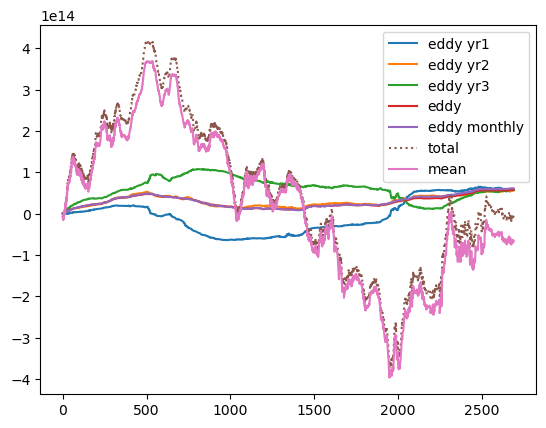

In [316]:
plt.plot(np.cumsum(np.mean(np.sum(Eddy_transp_10km[0:365], axis=1),axis=0)),label='eddy yr1')
plt.plot(np.cumsum(np.mean(np.sum(Eddy_transp_10km[365:731], axis=1),axis=0)),label='eddy yr2')
plt.plot(np.cumsum(np.mean(np.sum(Eddy_transp_10km[731:1095], axis=1),axis=0)),label='eddy yr3')
plt.plot(np.cumsum(np.mean(np.sum(Eddy_transp_10km[:], axis=1),axis=0)),label='eddy')

# plt.plot(np.cumsum(np.mean(np.sum(Eddy_transp_10km_seas, axis=1),axis=0)),'-',label='eddy seas')
plt.plot(np.cumsum(np.mean(np.sum(Eddy_transp_10km_monthly[12:24], axis=1),axis=0)),'-',label='eddy monthly')
plt.plot(np.cumsum(np.mean(np.sum(heat_transport_10km, axis=1),axis=0)),':',label='total')
plt.plot(np.cumsum(np.sum(Mean_transp_10km, axis=0)),label='mean')

plt.legend()

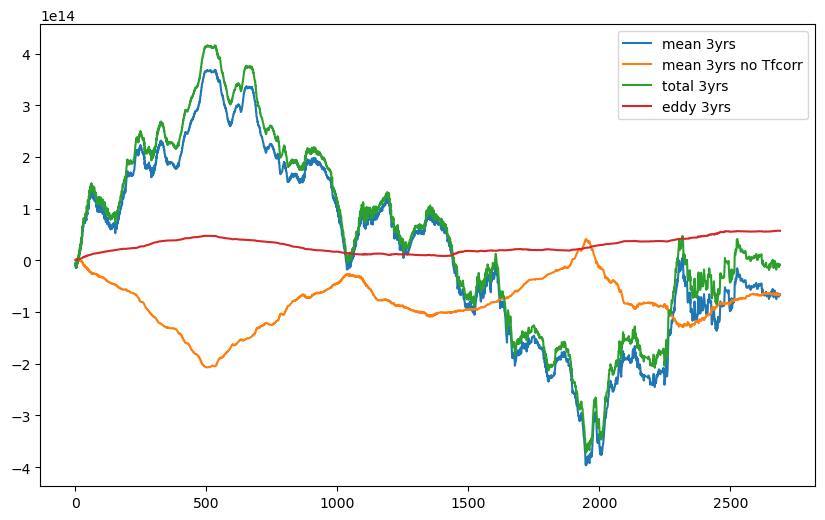

In [331]:
# plot seasonal analyses:

fig = plt.figure(figsize=(10, 6))

plt.plot(np.cumsum(np.sum(Mean_transp_10km, axis=0)),label='mean 3yrs')
plt.plot(np.cumsum(np.sum(Mean_transp_10km_noTfcorr, axis=0)),label='mean 3yrs no Tfcorr')

# plt.plot(np.cumsum(np.sum(Mean_transp_10km_1yr, axis=0)),label='mean 1yr')

plt.plot(np.cumsum(np.nanmean(np.nansum(heat_transport_10km, axis=1),axis=0)),label='total 3yrs')
# # plt.plot(np.cumsum(np.nanmean(np.nansum(heat_transport_10km_1yr, axis=1),axis=0)),'--',label='total 1yr')
plt.plot(np.cumsum(np.mean(np.sum(Eddy_transp_10km, axis=1),axis=0)),label='eddy 3yrs')
# plt.plot(np.cumsum(np.mean(np.sum(Eddy_transp_10km_1yr, axis=1) ,axis=0)),'--',label='eddy 1yrs') # same as the one above!
# plt.plot(np.cumsum(np.mean(np.sum(Eddy_transp_10km_seas, axis=1),axis=0)),':',label='eddy seas')

# plt.plot(np.cumsum(np.nanmean(np.sum(heat_transport_10km.isel(ocean_time=slice(100,128)), axis=1),axis=0)),label='total')
# plt.plot(np.cumsum(np.nanmean(eddy[200:300,:],axis=0)),label='eddy')
# plt.plot(np.cumsum(np.nanmean(eddy[100:128,:],axis=0)),label='eddy')
# plt.plot(np.cumsum(np.mean(eddy,axis=0)),'--',label='eddy 3ann')
# plt.plot(np.cumsum(np.mean(eddy_1yr,axis=0)),'--',label='eddy 1ann')

# plt.plot(np.cumsum(seas_jfm),label='eddy jfm')
# plt.plot(np.cumsum(seas_amj),label='eddy amj')
# plt.plot(np.cumsum(seas_jas),label='eddy jas')
# plt.plot(np.cumsum(seas_ond),label='eddy ond')
# # plt.plot(np.cumsum(np.divide((seas_jfm+seas_amj+seas_jas+seas_ond),4)),':',label='seas')
plt.legend()


In [318]:
Eddy_transp_10km.shape

(1095, 31, 2690)

(-220000000000000.0, 220000000000000.0)

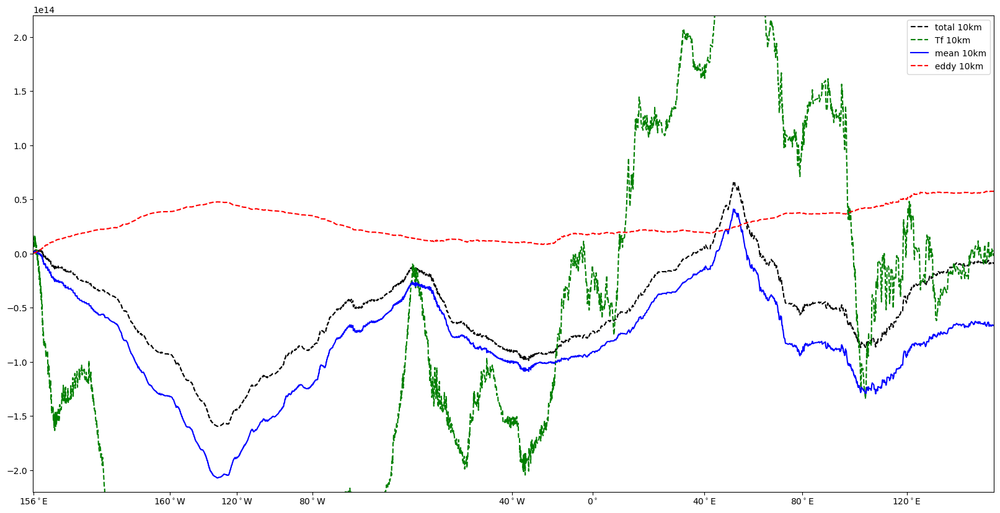

In [335]:
fig = plt.figure(figsize=(20, 10))


ax1 = fig.add_subplot(111)

ax1.plot(dist_along_10km,np.cumsum(np.nanmean(np.sum(heat_transport_10km, axis=1), axis=0),axis=-1)-
         -np.cumsum(np.nanmean(np.sum(Tf_heat_transp_10km, axis=1), axis=0),axis=-1),'--k', label='total 10km')
# ax1.plot(dist_along_10km,np.cumsum(np.nanmean(np.sum(heat_transport_10km, axis=1), axis=0),axis=-1),'--k', label='total 10km')

ax1.plot(dist_along_10km,np.cumsum(np.nanmean(np.sum(Tf_heat_transp_10km, axis=1), axis=0),axis=-1),'--g', label='Tf 10km')

ax1.plot(dist_along_10km,np.cumsum(np.sum(Mean_transp_10km, axis=0),axis=-1)-
         -np.cumsum(np.nanmean(np.sum(Tf_heat_transp_10km, axis=1), axis=0),axis=-1),'-b', label='mean 10km')
# ax1.plot(dist_along_10km,np.cumsum(np.sum(Mean_transp_10km, axis=0),axis=-1),'-b', label='mean 10km')



ax1.plot(dist_along_10km,np.cumsum(np.nanmean(np.sum(Eddy_transp_10km, axis=1), axis=0),axis=-1),'--r', label='eddy 10km')
# ax1.plot(dist_along_4km,np.cumsum(np.nanmean(np.sum(Eddy_transp_4km, axis=1), axis=0),axis=-1),':r', label='eddy 4km')
ax1.legend()

ax1.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km[-1])
ax1.set_ylim(-220e12,220e12)

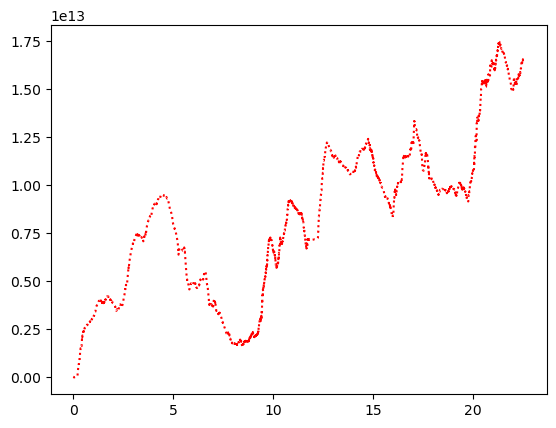

In [85]:
plt.plot(dist_along_4km,np.cumsum(np.nanmean(np.sum(Eddy_transp_4km, axis=1), axis=0),axis=-1),':r', label='eddy 4km')


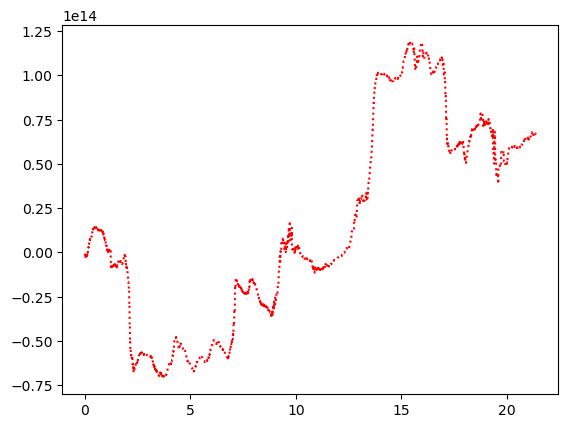

In [86]:
plt.plot(dist_along_10km,np.cumsum(np.nanmean(np.sum(Eddy_transp_10km, axis=1), axis=0),axis=-1),':r', label='eddy 10km')


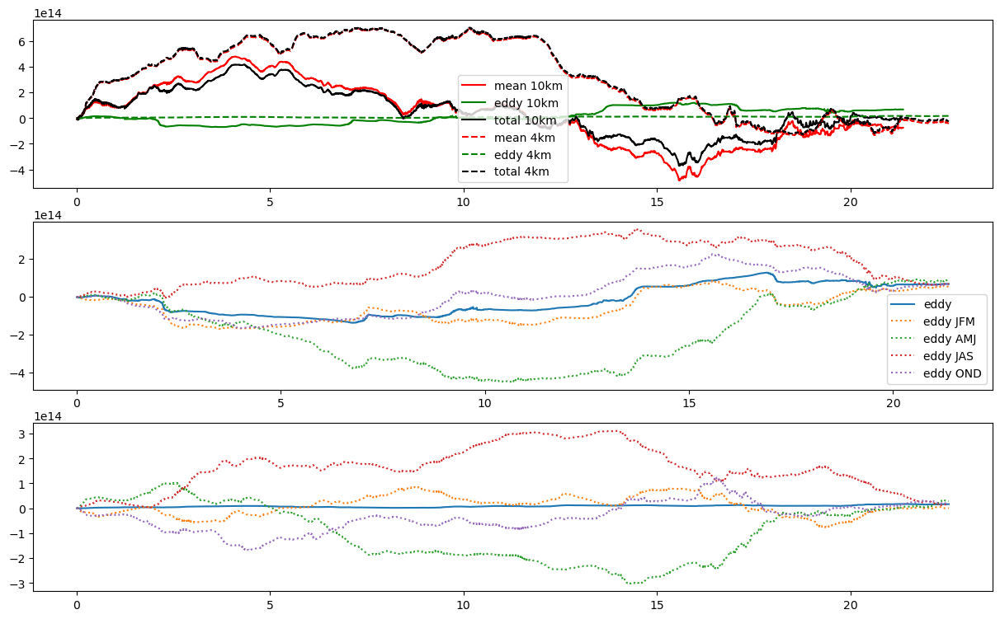

In [83]:
fig=plt.figure(figsize=(15, 9))

ax1 = fig.add_subplot(311)
ax1.plot(dist_along_10km,np.cumsum(np.sum(Mean_transp_10km, axis=0),axis=-1),'-r', label='mean 10km')
ax1.plot(dist_along_10km,np.cumsum(np.nanmean(np.sum(Eddy_transp_10km, axis=1), axis=0),axis=-1),'-g', label='eddy 10km')
ax1.plot(dist_along_10km,np.cumsum(np.nanmean(np.sum(heat_transport_10km, axis=1), axis=0),axis=-1),'-k', label='total 10km')
# ax1.plot(dist_along_10km,np.cumsum(np.nanmean(np.sum(Eddy_transp_10kmNC, axis=1), axis=0),axis=-1),':g', label='eddy 10km NC')
ax1.plot(dist_along_4km,np.cumsum(np.sum(Mean_transp_4km, axis=0),axis=-1),'--r', label='mean 4km')
ax1.plot(dist_along_4km,np.cumsum(np.nanmean(np.sum(Eddy_transp_4km, axis=1), axis=0),axis=-1),'--g', label='eddy 4km')
ax1.plot(dist_along_4km,np.cumsum(np.nanmean(np.sum(heat_transport_4km, axis=1), axis=0),axis=-1),'--k', label='total 4km')


ax1.legend()
# ax1.set_xlim(0,450)
# ax1.set_ylim(-1.5e13,1.5e13)
# ax1.set_ylim(-1.5e12,1.5e12)

ax2 = fig.add_subplot(312)
# ax2.plot(dist_along_10km,np.cumsum((np.sum(Mean_transp_10km, axis=0)-np.nanmean(np.sum(heat_transp_10km, axis=1), axis=0)), axis=-1),'--', label='mean - total')
# ax2.plot(dist_along_10km,np.cumsum((np.nanmean(np.sum(Eddy_transp_10km, axis=1), axis=0)-np.sum(Tf_heat_transp_10km, axis=0)-
#                                          np.nanmean(np.sum(heat_transp_10km, axis=1), axis=0)), axis=-1),':', label='eddy - total')

# ax2.plot(dist_along_10km,-np.cumsum(np.mean(Tf_heat_transp_10km, axis=0), axis=-1),':', label='-Tf HT')
Tf_ht=np.cumsum(np.sum(np.nanmean(Tf_heat_transp_10km, axis=0), axis=0), axis=-1)*rho0*Cp
# ax2.plot(dist_along_10km,np.cumsum(np.sum(Mean_transp_10km, axis=0),axis=-1),'--', label='mean')
ax2.plot(dist_along_10km,np.cumsum(np.nanmean(np.sum(Eddy_transp_10km_1yr, axis=1), axis=0), axis=-1),'-', label='eddy')
ax2.plot(dist_along_10km,np.cumsum(np.nanmean(np.sum(Eddy_transp_10km_1yr[0:90,:,:], axis=1), axis=0), axis=-1),':', label='eddy JFM')
ax2.plot(dist_along_10km,np.cumsum(np.nanmean(np.sum(Eddy_transp_10km_1yr[90:180,:,:], axis=1), axis=0), axis=-1),':', label='eddy AMJ')
ax2.plot(dist_along_10km,np.cumsum(np.nanmean(np.sum(Eddy_transp_10km_1yr[180:270,:,:], axis=1), axis=0), axis=-1),':', label='eddy JAS')
ax2.plot(dist_along_10km,np.cumsum(np.nanmean(np.sum(Eddy_transp_10km_1yr[270:360,:,:], axis=1), axis=0), axis=-1),':', label='eddy OND')

ax2.legend()
# ax2.set_xlim(0,4500)

ax2 = fig.add_subplot(313)
Tf_ht=np.cumsum(np.sum(Tf_heat_transp_4km, axis=0), axis=-1)*rho0*Cp
# ax2.plot(dist_along_4km,np.cumsum(np.sum(Mean_transp_4km, axis=0),axis=-1),'--', label='mean')
ax2.plot(dist_along_4km,np.cumsum(np.nanmean(np.sum(Eddy_transp_4km, axis=1), axis=0), axis=-1),'-', label='eddy')
ax2.plot(dist_along_4km,np.cumsum(np.nanmean(np.sum(Eddy_transp_4km[0:90,:,:], axis=1), axis=0), axis=-1),':', label='eddy JFM')
ax2.plot(dist_along_4km,np.cumsum(np.nanmean(np.sum(Eddy_transp_4km[90:180,:,:], axis=1), axis=0), axis=-1),':', label='eddy AMJ')
ax2.plot(dist_along_4km,np.cumsum(np.nanmean(np.sum(Eddy_transp_4km[180:270,:,:], axis=1), axis=0), axis=-1),':', label='eddy JAS')
ax2.plot(dist_along_4km,np.cumsum(np.nanmean(np.sum(Eddy_transp_4km[270:360,:,:], axis=1), axis=0), axis=-1),':', label='eddy OND')



In [81]:
print('WAOM10')
print(np.sum(np.sum(Mean_transp_10km, axis=0),axis=-1)*1e-12)
print(np.sum(np.nanmean(np.sum(Eddy_transp_10km, axis=1), axis=0),axis=-1)*1e-12)
print(np.sum(np.nanmean(np.sum(heat_transport_10km, axis=1), axis=0),axis=-1)*1e-12)

print('WAOM4')
print(np.sum(np.sum(Mean_transp_4km, axis=0),axis=-1)*1e-12)
print(np.sum(np.nanmean(np.sum(Eddy_transp_4km, axis=1), axis=0),axis=-1)*1e-12)
print(np.sum(np.nanmean(np.sum(heat_transport_4km, axis=1), axis=0),axis=-1)*1e-12)

print('WAOM4-NT')
print(np.sum(np.sum(Mean_transp_4kmNT, axis=0),axis=-1)*1e-12)
print(np.sum(np.nanmean(np.sum(Eddy_transp_4kmNT, axis=1), axis=0),axis=-1)*1e-12)
print(np.sum(np.nanmean(np.sum(heat_transport_4kmNT, axis=1), axis=0),axis=-1)*1e-12)


WAOM10
<xarray.Variable ()> Size: 8B
array(-75.38225171)
66.70611312589995
-8.676138584924406
WAOM4
<xarray.Variable ()> Size: 8B
array(-42.89928095)
16.38359121928127
-26.515689735204624
WAOM4-NT
<xarray.Variable ()> Size: 8B
array(-38.19268725)
13.981961296858575
-24.2107259484915


In [82]:
print('WAOM10')
print(np.nansum(np.sum(Mean_transp_10km_CF, axis=0),axis=-1)*1e-12)
print(np.nansum(np.nanmean(np.nansum(Eddy_transp_10km_CF, axis=1), axis=0),axis=-1)*1e-12)
print(np.nansum(np.nanmean(np.nansum(heat_transport_10km_CF, axis=1), axis=0),axis=-1)*1e-12)

print('WAOM4')
print(np.nansum(np.sum(Mean_transp_4km_CF, axis=0),axis=-1)*1e-12)
print(np.nansum(np.nanmean(np.nansum(Eddy_transp_4km_CF, axis=1), axis=0),axis=-1)*1e-12)
print(np.nansum(np.nanmean(np.nansum(heat_transport_4km_CF, axis=1), axis=0),axis=-1)*1e-12)

print('WAOM4-NT')
print(np.nansum(np.sum(Mean_transp_4kmNT_CF, axis=0),axis=-1)*1e-12)
print(np.nansum(np.nanmean(np.nansum(Eddy_transp_4kmNT_CF, axis=1), axis=0),axis=-1)*1e-12)
print(np.nansum(np.nanmean(np.nansum(heat_transport_4kmNT_CF, axis=1), axis=0),axis=-1)*1e-12)


WAOM10
-16.258304297801654
2.7192451351490674
-13.539059162652562
WAOM4
-15.491557955535493
14.308013328654376
-1.1835446268813947
WAOM4-NT
-15.70775820716164
7.364669146407735
-8.34308906075389


In [102]:
-38.19+34.63

-3.559999999999995

For the vert-discretised plots above, we can see that
- (Mean - Tf) roughly matches with vol_transport;
- (Total-Mean) yield to eddy term, which is much smaller than Mean/Total (-Tf).
- one of the reasons it's much smaller is the -Tf; if it's added to the Eddy term, it became similar order as mean/eddy.

In V4, the issue with the mean and eddy HT decomposition is solved. Now the mean and eddy HT have opposite signs & similar magnitude.

### Zonal convergence calculation:

In [ ]:
## load 180W transect:
dx = xr.open_mfdataset("/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross-1500m_transp/u_zonal_transect_bin=1.nc")
dx#.heat_transp

In [ ]:
# plt.figure(figsize=(15, 4))
# dx.dzt.mean('ocean_time').plot()

In [ ]:
# # Figure out the longitult.plot(lon_along_4km[180:250])
# plt.plot(11,180,'x')
# plt.plot(12,-180,'x')
# plt.plot(35,-180,'x')
# plt.plot(36,180,'x')
# plt.plot(45,180,'x')
# plt.plot(46,-180,'x'



In [ ]:
# Re-index my contour so the longitude is mostly monotonic:

shift_index1 = 191# np.argmax(lon_along_10km.values < 0) # = 192
# use first point after stoping going back and forth ~179E/~179W.
shift_index2=226
shift_index3=192
shift_index4=215
shift_index5=216
shift_index6=225

# Split the longitude array at the shift index and concatenate in reverse order
lon_reindexed = np.concatenate((lon_along_10km[shift_index3:shift_index4],
                                lon_along_10km[shift_index2:],
                                lon_along_10km[:shift_index1],
                                lon_along_10km[shift_index5:shift_index6]))
lat_reindexed = np.concatenate((lat_along_10km[shift_index3:shift_index4],
                                lat_along_10km[shift_index2:],
                                lat_along_10km[:shift_index1],
                                lat_along_10km[shift_index5:shift_index6]))

# Create a new xarray.DataArray with the reindexed longitudes
lon_da_10km = xr.DataArray(lon_reindexed, dims=['contour_index_array'])
lat_da_10km = xr.DataArray(lat_reindexed, dims=['contour_index_array'])

print(lon_da_10km.shape, lon_da_10km)
# Update the longitudes in your dataset with the reindexed values
# -> use lon_da_10km/lat_da_10km instead of lon_along_10km/lat_along_10km

In [ ]:
# re-index heat transport and other variables:
heat_transp_10km_reindexed = np.concatenate((heat_transp_10km[:,:,shift_index3:shift_index4],
                                heat_transp_10km[:,:,shift_index2:],
                                heat_transp_10km[:,:,:shift_index1],
                                heat_transp_10km[:,:,shift_index5:shift_index6]), axis=-1)

# Create a new xarray.DataArray with the reindexed longitudes
heat_transp_da_10km = xr.DataArray(heat_transp_10km_reindexed, dims=['ocean_time','s_rho','contour_index_array'])


heat_transp_10km_reindexed = np.concatenate((heat_transp_10km[:,:,shift_index3:shift_index4],
                                heat_transp_10km[:,:,shift_index2:],
                                heat_transp_10km[:,:,:shift_index1],
                                heat_transp_10km[:,:,shift_index5:shift_index6]), axis=-1)

# Create a new xarray.DataArray with the reindexed longitudes
heat_transp_da_10km = xr.DataArray(heat_transp_10km_reindexed, dims=['ocean_time','s_rho','contour_index_array'])


In [ ]:
%%time
# 1) bin the along contour data into larger longitude intervals:

# convert to longitude coordinate and average into 3 degree longitude bins:
# in degrees:
bin_width = 3
bin_spacing = 0.25
lon_west = -180
lon_east = 180
	
# new coordinate and midpoints of longitude bins:
full_lon_coord = np.arange(lon_west,lon_east+bin_spacing,bin_spacing)
lon_bin_midpoints = np.arange(lon_west+bin_width/2,lon_east-bin_width/2,bin_spacing)
n_bin_edges = len(full_lon_coord)
	
# sum into longitude bins:
# need to be very careful of loops, we can't just mask over longitude values, but instead pick indices 
# on the isobath contour and sum continously along contour between defined indices.
# (i.e. lon_along_contour is not monotonic)
# find points on contour to define edges of longitude bins:
bin_edge_indices = np.zeros(n_bin_edges)
for lon_bin in range(n_bin_edges-1):
    # print(lon_bin)
	# find first isobath point that has the right longitude:
    first_point = np.where(lon_da_10km>=full_lon_coord[lon_bin])[0][0]
	# then find all other isobath points with the same longitude as that first point:
    same_lon_points = np.where(lon_da_10km==lon_da_10km[first_point])[0]
	
    # print(lat_along_10km.shape, same_lon_points)
    # we want the most southerly of these points on the same longitude line:
    bin_edge_indices[lon_bin] = same_lon_points[np.argmin(lat_da_10km[same_lon_points].values)]

# define east/west edges:
bin_edge_indices = bin_edge_indices.astype(int)
bin_edge_indices_west = bin_edge_indices[:-int(bin_width/bin_spacing)-1]
bin_edge_indices_east = bin_edge_indices[int(bin_width/bin_spacing):-1]
n_bins = len(bin_edge_indices_west)
    
lat_bin_midpoints = np.zeros(n_bins)
for lon_bin in range(n_bins):
    # find nearest isobath point:
    lon_index = np.where(lon_da_10km>=lon_bin_midpoints[lon_bin])[0][0]
    lat_bin_midpoints[lon_bin] = lat_da_10km[lon_index]

In [ ]:
# sum heat transport from isobath coord into new longitude-binned coord:
cross_slope_heat_trans = np.zeros([365,31,n_bins])
for lon_bin in range(n_bins):
	heat_trans_this_bin0 = heat_transp_da_10km[:,:,bin_edge_indices_west[lon_bin]:bin_edge_indices_east[lon_bin]]
	cross_slope_heat_trans[:,:,lon_bin] = np.sum(heat_trans_this_bin0,axis=2)

In [ ]:
# given 1 longitude (which is my lon bin edge), I should construct a vector from that longitude/latitude, to the same longitude/latitude[90S].
# then, I should interp (nearest) u, v, temp, dzt into my vector.
# u/v are used to calculate V; which then is rotated using the longitude angle with 90degE.
# rotate V * temp * dzt * dxt will give me the heat transport.


#### Create meridional transect, interpolate variables (T,U/V,DZT), and rotate velocities to get ONLY zonal component

In [ ]:
# 1) Load gridded t, u, v, dzt 
ds = xr.open_mfdataset(paths='/g/data/hh5/tmp/access-om/fbd581/ROMS/OUTPUT/waom10extend_shflim_S_0.25Q/output_20yr_diag_daily/ocean_avg_00*.nc')#, chunks={'eta_rho': '200MB'}, parallel=True, decode_times=False)
temp3d_10km= ds.variables["temp"]
u3d_10km= ds.variables["u"]
v3d_10km= ds.variables["v"]
ds = ds.set_coords(['Cs_r', 'Cs_w', 'hc', 'h', 'Vtransform'])
Zo_rho = (ds.hc * ds.s_rho + ds.Cs_r * ds.h) / (ds.hc + ds.h)
z_rho3d_10km = ds.zeta + (ds.zeta + ds.h) * Zo_rho + ds.zice
del Zo_rho
ds.close()

mask_land = ma.masked_where(zice_10km<=-.1, np.ones(h_10km.shape)) # mask out where larger than zero (i.e. everywhere)
mask_shelf = ma.masked_where(h_10km>=1000, np.ones(h_10km.shape)) # masked out where h deeper than 1000m
mask_cshelf = mask_land*mask_shelf


# 2) create vector (using lat.min:lat.max; then apply mask to remove values north of the 1500m isobath)
# vector should have same resolution as the original data (to minimise errors due to non-exact zonal transect)

minlat = -90
maxlat = -60

lat_maxpts = np.ceil(30/0.091985)

lat_vector = np.linspace(minlat,maxlat,num=int(lat_maxpts))

## HERE START THE LOOP through bin edges... ==================================

lon=full_lon_coord[720] # 0 = 180W; 1080 = 90E; 720 = 0deg, 900 = 45E

lon_vector = np.linspace(lon,lon,num=int(lat_maxpts))  # replace 0 -> lon_bin looping

# Create a meshgrid from the longitude and latitude vectors
lon_mesh, lat_mesh = np.meshgrid(lon_vector, lat_vector)

# Create a new DataArray for the vector
vector_da = xr.DataArray(
    np.zeros_like(lon_mesh),  # Placeholder values (will be overwritten)
    dims=['lat_rho', 'lon_rho'],
    coords={'lat_rho': lat_vector, 'lon_rho': lon_vector}
)


In [ ]:
print('Processing transect at longitude = ', lon)

In [ ]:
%%time

##re-grid high-res zice/h to 10km grid:
w10_def = pyresample.geometry.SwathDefinition(lons=lon_rho_10km,lats=lat_rho_10km)
w10u_def = pyresample.geometry.SwathDefinition(lons=lon_u_10km,lats=lat_u_10km)
w10v_def = pyresample.geometry.SwathDefinition(lons=lon_v_10km,lats=lat_v_10km)
transect_def = pyresample.geometry.SwathDefinition(lons=vector_da.lon_rho,lats=vector_da.lat_rho)
wf = lambda r: 1/r

h_merid_transect = pyresample.kd_tree.resample_custom(w10_def,h_10km.values,transect_def,\
                                         radius_of_influence=10000,neighbours=4,weight_funcs=wf)
## Find the index of the last point before depth >= 1500m -> to plot/calc only on the shelf
last_pt_ind = np.where(h_merid_transect >= 1500)[0][0] - 1
last_pt_dep = h_merid_transect[last_pt_ind]
# The first point before depth > 500m
first_pt_ind = np.where(h_merid_transect > 500)[0][0] -1
first_pt_dep = h_merid_transect[first_pt_ind]

temp_merid_transect = np.empty((1,31,327))
Hz_merid_transect = np.empty((1,31,327))
u_merid_transect = np.empty((1,31,327))
v_merid_transect = np.empty((1,31,327))

lat_31lev = np.empty(Hz_merid_transect[0,:,:].shape)
for zz in range(31):
    lat_31lev[zz,:] = vector_da.lat_rho
lat_31lev = lat_31lev[:,first_pt_ind:last_pt_ind]

for tt in range(1):
    for zz in range(0,31):
        temp_merid_transect[tt,zz,:] = pyresample.kd_tree.resample_custom(w10_def,temp3d_10km.isel(s_rho=zz,ocean_time=tt).values,transect_def,\
                                         radius_of_influence=10000,neighbours=4,weight_funcs=wf)
        Hz_merid_transect[tt,zz,:] = pyresample.kd_tree.resample_custom(w10_def,z_rho3d_10km.isel(s_rho=zz,ocean_time=tt).values,transect_def,\
                                         radius_of_influence=10000,neighbours=4,weight_funcs=wf)
        u_merid_transect[tt,zz,:] = pyresample.kd_tree.resample_custom(w10u_def,u3d_10km.isel(s_rho=zz,ocean_time=tt).values,transect_def,\
                                         radius_of_influence=10000,neighbours=4,weight_funcs=wf)
        v_merid_transect[tt,zz,:] = pyresample.kd_tree.resample_custom(w10v_def,v3d_10km.isel(s_rho=zz,ocean_time=tt).values,transect_def,\
                                         radius_of_influence=10000,neighbours=4,weight_funcs=wf)

temp_merid_transect = temp_merid_transect[:,:,first_pt_ind:last_pt_ind]
u_merid_transect = u_merid_transect[:,:,first_pt_ind:last_pt_ind]
v_merid_transect = v_merid_transect[:,:,first_pt_ind:last_pt_ind]
Hz_merid_transect = Hz_merid_transect[:,:,first_pt_ind:last_pt_ind]


##rotate the velocities based on the angle of the meridional transect:

# Function to calculate rotation matrix for each longitude
def rotation_matrix(lon):
    angle_rot = 90-lon
    # if angle_rot <= 0: # only changes things for the 4th quadrant
    #     angle_rot = 360 + angle_rot 
    
    angle = np.radians(angle_rot)  # Calculate the angle for each longitude
    return np.array([[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]])

# Calculate the rotation matrix for each point along the longitude
rotation_matrices = rotation_matrix(lon)

U_rotated = np.empty(u_merid_transect.shape)
V_rotated = np.empty(v_merid_transect.shape)
for tt in range(1):
    for zz in range(0,31):
        U = u_merid_transect[tt,zz,:]
        V = v_merid_transect[tt,zz,:]
        # Rotate the velocity vector components
        U_rotated[tt,zz,:] = U * rotation_matrices[0, 0] - V * rotation_matrices[1, 0]
        V_rotated[tt,zz,:] = U * rotation_matrices[0, 1] - V * rotation_matrices[1, 1]

# Calculate the zonal component (U_zonal) by setting the meridional component (V_rotated) to zero
U_zonal = U_rotated
V_zonal = V_rotated

heat_transp_transect_wrong = U_zonal*(temp_merid_transect[0,:,:]-Tf)*-Hz_merid_transect[0,:,:]*10000*rho0*Cp # 10k = dxt/dyt approximately
heat_transp_transect_correct = V_zonal*(temp_merid_transect[0,:,:]-Tf)*-Hz_merid_transect[0,:,:]*10000*rho0*Cp # 10k = dxt/dyt approximately

## -Hz as the array is originally negative

In [ ]:
### # months=np.arange(0,365)*(1/30.41667)

# # testing save heat transport:
# # save mask_x/y_transport for inspection;
# # coordinatesC=dict(ocean_time=months, s_rho=(['s_rho'], np.arange(0,31)),
# coordinatesC=dict(ocean_time=0, s_rho=(['s_rho'], np.arange(0,31)),
#                   transect_lat=(['transect_lat'], np.arange(0,len(temp_merid_transect[0,0,:]))))
                  
# heat_transp_transect_xr = xr.DataArray(heat_transp_transect, coords = coordinatesC, dims = ['ocean_time','s_rho','transect_lat'])
# # rename vars:
# heat_transp_transect_xr.name = 'heat_transp'

# files_path = '/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross-1500m_transp/'

# heat_transp_transect_xr.to_netcdf(files_path + 'Int_heat_transp_transect_bin=' + str(ibin) + '.nc', mode='w', format="NETCDF4")


In [ ]:
plt.plot(h_merid_transect)
# plt.ylim(0,3000)

In [ ]:
temp_merid_transect.shape, Hz_merid_transect.shape, lat_31lev.shape

In [ ]:
plt.pcolor(ma.masked_where(np.isnan(temp_merid_transect[0,:,:]),lat_31lev),Hz_merid_transect[0,:,:],temp_merid_transect[0,:,:])

In [ ]:
fig, ax = plt.subplots(nrows=4,figsize = (12, 10))

ct=ax[0].pcolor(lat_31lev,Hz_merid_transect[0,:,:],temp_merid_transect[0,:,:])
cbar_ax0= fig.add_axes([0.91, 0.715,  0.01, 0.16])
fig.colorbar(ct, cax=cbar_ax0, orientation='vertical')
cbar_ax0.set_ylabel('degC')#, labelpad=-35)
ax[0].set_ylabel('temperature')

cH=ax[1].pcolor(lat_31lev,Hz_merid_transect[0,:,:],Hz_merid_transect[0,:,:])
cbar_ax1= fig.add_axes([0.91, 0.51,  0.01, 0.16])
fig.colorbar(cH, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('m')#, labelpad=-35)
ax[1].set_ylabel('$\sigma$-layer thickness')

cv=ax[2].pcolor(lat_31lev,Hz_merid_transect[0,:,:],V_zonal[0,:,:], vmin=-0.1, vmax=0.1, cmap='bwr')
# cv=ax[2].pcolor(lat_31lev,Hz_merid_transect[0,:,:],u_merid_transect[0,:,:], vmin=-0.1, vmax=0.1, cmap='bwr')
ax[2].set_ylabel('u-vel')
cbar_ax2= fig.add_axes([0.91, 0.31,  0.01, 0.16])
fig.colorbar(cv, cax=cbar_ax2, orientation='vertical')
cbar_ax2.set_ylabel('m/s')#, labelpad=-35)

cv=ax[3].pcolor(lat_31lev,Hz_merid_transect[0,:,:],u_merid_transect[0,:,:], vmin=-0.1, vmax=0.1, cmap='bwr')
ax[3].set_ylabel('v-vel b4 rotating')

## calculate heat transport
heat_transp_transect = V_zonal[0,:,:]*(temp_merid_transect[0,:,:]-Tf)*-Hz_merid_transect[0,:,:]*10000*rho0*Cp # 10k = dxt/dyt approximately
# cht=ax[3].pcolor(lat_31lev,Hz_merid_transect[0,:,:],heat_transp_transect*1e-12, cmap='bwr', vmin=-2, vmax=2)
# ax[3].set_ylabel('heat transport')
# cbar_ax3= fig.add_axes([0.91, 0.12,  0.01, 0.16])
# fig.colorbar(cht, cax=cbar_ax3, orientation='vertical')
# cbar_ax3.set_ylabel('TW')#, labelpad=-35)



In [ ]:
dx

In [ ]:
fig, ax = plt.subplots(nrows=2,figsize = (12, 6))

## calculo heat transport
cv=ax[0].pcolor(lat_31lev,Hz_merid_transect[0,:,:],V_zonal[0,:,:], vmin=-0.1, vmax=0.1, cmap='bwr')
ax[0].set_ylabel('heat transport')
cbar_ax1= fig.add_axes([0.91, 0.54,  0.01, 0.36])
fig.colorbar(cv, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('m/s')#, labelpad=-35)

cht=ax[1].pcolor(lat_31lev,Hz_merid_transect[0,:,:],heat_transp_transect*1e-12, cmap='bwr', vmin=-2, vmax=2)
ax[1].set_ylabel('heat transport')
cbar_ax1= fig.add_axes([0.91, 0.12,  0.01, 0.36])
fig.colorbar(cht, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('TW')#, labelpad=-35)

In [ ]:
## Vizualise the grids:

fig, ax = plt.subplots(figsize = (12, 4))

plt.plot(lon_rho_10km, lat_rho_10km,'-k')
plt.plot(lon_mesh,lat_mesh,'or')
plt.contour(lon_rho_10km, lat_rho_10km,h_10km,levels=(200,1000),color='brown')

plt.xlim(-185,-100)
plt.ylim(-77,-60)

In [ ]:
plt.plot(lon_mesh,lat_mesh,',')
plt.plot(lon_bin_midpoints,lat_bin_midpoints,':')

In [ ]:
print(z_rho3d_10km.shape, lon_rho_10km.shape, lat_rho_10km.shape)

#### Calving Front

In [ ]:
%time
# WAOM10

Tf_heat_transp_10km_CF = Tf*vol_transport_10km_CF.mean('ocean_time')

heat_transp_10km_CF = heat_transport_10km_CF - Tf_heat_transp_10km_CF

# Total HT (online diag) annual-avg:
# annual_transp_10km_CF = heat_transport_10km_CF.mean('ocean_time') - Tf_heat_transp_10km_CF # annual vT x Cp x Rho0
annual_transp_10km_CF = heat_transp_10km_CF.mean('ocean_time')

# calculate Mean as v_bar*T_bar, vert-discretised version:
Mean_transp_10km_CF = vol_transport_10km_CF.mean('ocean_time')*(temp_10km_CF.mean('ocean_time')-Tf) 

# Eddy heat transport: total - Mean
Eddy_transp_10km_CF = np.empty((365,31,3298)) 
for mm in np.arange(0,365):
    Eddy_transp_10km_CF[mm,:,:] = (heat_transp_10km_CF[mm,:,:]) - Mean_transp_10km_CF #- Tf_heat_transp_10km_CF




In [ ]:
%time
# WAOM4

Tf_heat_transp_4km_CF = Tf*vol_transport_4km_CF.mean('ocean_time')

heat_transp_4km_CF = heat_transport_4km_CF - Tf_heat_transp_4km_CF

# Total HT (online diag) annual-avg:
# annual_transp_4km_CF = heat_transport_4km_CF.mean('ocean_time') - Tf_heat_transp_4km_CF # annual vT x Cp x Rho0
annual_transp_4km_CF = heat_transp_4km_CF.mean('ocean_time')

# calculate Mean as v_bar*T_bar, vert-discretised version:
Mean_transp_4km_CF = vol_transport_4km_CF.mean('ocean_time')*(temp_4km_CF.mean('ocean_time')-Tf) 

# Eddy heat transport: total - Mean
Eddy_transp_4km_CF = np.empty((365,31,9018)) 
for mm in np.arange(0,365):
    # Eddy_transp_4km_CF[mm,:,:] = (heat_transport_4km_CF[mm,:,:]) - Mean_transp_4km_CF
    Eddy_transp_4km_CF[mm,:,:] = (heat_transp_4km_CF[mm,:,:]) - Mean_transp_4km_CF #- Tf_heat_transp_4km_CF




In [ ]:
%time
# WAOM4-NT

Tf_heat_transp_4km_CFNT_CF = Tf*vol_transport_4km_CFNT_CF.mean('ocean_time')

heat_transp_4km_CFNT_CF = heat_transport_4km_CFNT_CF - Tf_heat_transp_4km_CFNT_CF

# Total HT (online diag) annual-avg:
# annual_transp_4km_CFNT_CF = heat_transport_4km_CFNT_CF.mean('ocean_time') - Tf_heat_transp_4km_CFNT_CF # annual vT x Cp x Rho0
annual_transp_4km_CFNT_CF = heat_transp_4km_CFNT_CF.mean('ocean_time')

# calculate Mean as v_bar*T_bar, vert-discretised version:
Mean_transp_4km_CFNT_CF = vol_transport_4km_CFNT_CF.mean('ocean_time')*(temp_4km_CFNT_CF.mean('ocean_time')-Tf) 

# Eddy heat transport: total - Mean
Eddy_transp_4km_CFNT_CF = np.empty((365,31,9018)) 
for mm in np.arange(0,365):
    # Eddy_transp_4km_CFNT_CF[mm,:,:] = (heat_transport_4km_CFNT_CF[mm,:,:]) - Mean_transp_4km_CFNT_CF
    Eddy_transp_4km_CFNT_CF[mm,:,:] = (heat_transp_4km_CFNT_CF[mm,:,:]) - Mean_transp_4km_CFNT_CF #- Tf_heat_transp_4km_CFNT_CF




### do some plots

##### plots cumsum for checking:

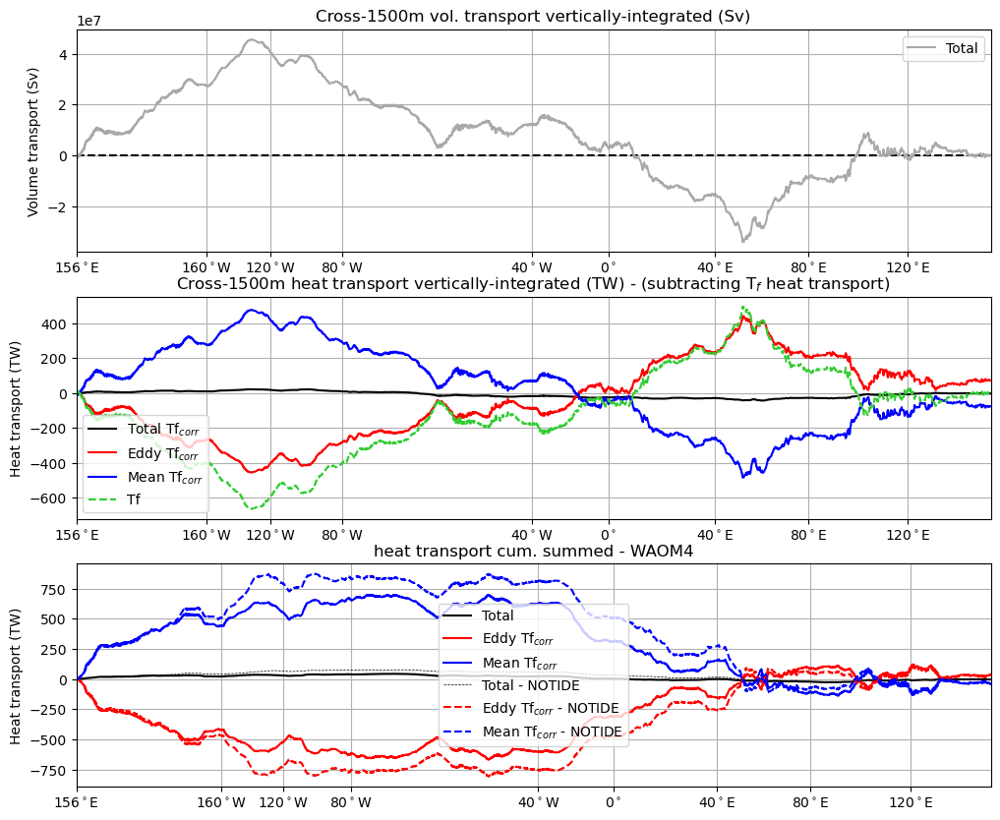

In [50]:

fig = plt.figure(figsize=(12,10))

ax1 = fig.add_subplot(311)
cumsum_total = np.cumsum((vol_transport_10km).sum('s_rho').mean('ocean_time'),axis=-1)
ax1.plot(dist_along_10km[:],cumsum_total*0,'--k')
ax1.plot(dist_along_10km[:],cumsum_total,'-',color='darkgray',label='Total')
ax1.legend()
ax1.set_title('vol transport vert-integ and cummulatively summed - WAOM10')
# ax1.set_ylim(-1000,1000)
ax1.set_ylabel('Volume transport (m s$^{-1}$)')
ax1.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km[-1])

ax1.set_title('Cross-1500m vol. transport vertically-integrated (Sv)')
ax1.set_ylabel('Volume transport (Sv)')
ax1.grid('on')

ax1 = fig.add_subplot(312)
cumsum_total = np.cumsum((heat_transport_10km).sum('s_rho').mean('ocean_time'),axis=-1)*1e-12 
cumsum_eddy = np.cumsum(np.nanmean(np.nansum(Eddy_transp_10km, axis=1),axis=0),axis=-1)*1e-12 
cumsum_mean = np.cumsum((Mean_transp_10km).sum('s_rho'),axis=-1)*1e-12 
cumsum_Tf = np.cumsum(np.nanmean(Tf_heat_transp_10km.sum('s_rho'),axis=0), axis=-1)*1e-12
# ax1.plot(dist_along_10km[:],cumsum_total*0,'--k')
# ax1.plot(dist_along_10km[:],cumsum_eddy+cumsum_Tf,'-',color='darkred',label='eddy abs')
# ax1.plot(dist_along_10km[:],cumsum_mean+cumsum_Tf,'-',color='darkblue',label='Mean abs')
ax1.plot(dist_along_10km[:],cumsum_total,'-k',label='Total Tf$_{corr}$')
# ax1.plot(dist_along_10km[:],cumsum_total_noTf,'--m',label='Total abs')
ax1.plot(dist_along_10km[:],cumsum_eddy,'-r',label='Eddy Tf$_{corr}$')
ax1.plot(dist_along_10km[:],cumsum_mean,'-b',label='Mean Tf$_{corr}$')
ax1.plot(dist_along_10km[:],cumsum_Tf,'--',color='limegreen',label='Tf')
# ax1.plot(dist_along_10km[:],(cumsum_mean+cumsum_eddy),'--y',label='Mean+Eddy Tf$_{corr}$')

ax1.legend(loc='lower left')
ax1.set_title('heat transport cum. summed - WAOM10')
# ax1.set_ylim(-1000,1000)
ax1.set_ylabel('Heat transport (TW)')
ax1.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km[-1])

ax1.set_title('Cross-1500m heat transport vertically-integrated (TW) - (subtracting T$_f$ heat transport)')
ax1.set_ylabel('Heat transport (TW)')
ax1.grid('on')

ax2 = fig.add_subplot(313)
cumsum_total = np.cumsum((heat_transport_4km).sum('s_rho').mean('ocean_time'),axis=-1)*1e-12 
cumsum_eddy = np.cumsum(np.nanmean(np.nansum(Eddy_transp_4km, axis=1),axis=0),axis=-1)*1e-12 
cumsum_mean = np.cumsum((Mean_transp_4km).sum('s_rho'),axis=-1)*1e-12 
cumsum_Tf = np.cumsum(Tf_heat_transp_4km.sum('s_rho'), axis=-1)*1e-12
# ax2.plot(dist_along_4km[:],cumsum_total*0,'--k')
ax2.plot(dist_along_4km[:],cumsum_total,'-k',label='Total')
ax2.plot(dist_along_4km[:],cumsum_eddy,'-r',label='Eddy Tf$_{corr}$')
ax2.plot(dist_along_4km[:],cumsum_mean,'-b',label='Mean Tf$_{corr}$')
# ax2.plot((cumsum_mean+cumsum_eddy),'--',label='Mean+Eddy')
ax2.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax2.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_4km[-1])

ax2.set_title('Cross-1500m heat transport vertically-integrated (TW) - (subtracting T$_f$ heat transport)')
ax2.set_ylabel('Heat transport (TW)')
cumsum_total = np.cumsum((heat_transport_4kmNT).sum('s_rho').mean('ocean_time'),axis=-1)*1e-12 
cumsum_eddy = np.cumsum(np.nanmean(np.nansum(Eddy_transp_4kmNT, axis=1),axis=0),axis=-1)*1e-12 
cumsum_mean = np.cumsum((Mean_transp_4kmNT).sum('s_rho'),axis=-1)*1e-12 
cumsum_Tf = np.cumsum(Tf_heat_transp_4kmNT.sum('s_rho'), axis=-1)*1e-12
ax2.plot(dist_along_4km[:],cumsum_total,'--k',label='Total - NOTIDE', linewidth=0.5)
ax2.plot(dist_along_4km[:],cumsum_eddy,'--r',label='Eddy Tf$_{corr}$ - NOTIDE')
ax2.plot(dist_along_4km[:],cumsum_mean,'--b',label='Mean Tf$_{corr}$ - NOTIDE')# ax2.plot(dist_along_4km[:],(cumsum_mean+cumsum_eddy),'--',label='Net 4NT')
ax2.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax2.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_4km[-1])

ax2.set_title('Cross-1500m heat transport vertically-integrated (TW) - (subtracting T$_f$ heat transport)')
ax2.set_ylabel('Heat transport (TW)')
ax2.legend()
ax2.set_title('heat transport cum. summed - WAOM4')
# ax2.set_ylim(-1000,1000)
ax2.set_ylabel('Heat transport (TW)')
ax2.grid('on')



In [51]:
heat_transport_10km.shape

(365, 31, 2690)

In [52]:
Eddy_transp_10km.shape

(365, 31, 2690)

In [53]:
print('WAOM10')
# Print values integrated circumpolar to close the budget (comparing with: WAOM10extend_shflim_S_0.25Q_OHB_shelf_budget_closure.ipynb)
print('Sum Total HT = ', np.sum(heat_transport_10km.sum('s_rho').mean('ocean_time'),axis=-1)*1e-12)
print('Sum Eddy HT = ', np.sum(np.nanmean(np.sum(Eddy_transp_10km, axis=1),axis=0),axis=-1)*1e-12)
print('Sum Mean HT = ', np.sum(Mean_transp_10km.sum('s_rho'),axis=-1)*1e-12)

WAOM10
Sum Total HT =  <xarray.Variable ()> Size: 8B
array(-2.29934058)
Sum Eddy HT =  73.0829111308723
Sum Mean HT =  <xarray.Variable ()> Size: 8B
array(-75.38225171)


In [54]:
# print('WAOM10 new code')
# # Print values integrated circumpolar to close the budget (comparing with: WAOM10extend_shflim_S_0.25Q_OHB_shelf_budget_closure.ipynb)
# print('Sum Total HT = ', np.sum(heat_transport_4kmNC.sum('s_rho').mean('ocean_time'),axis=-1)*rho0*Cp*1e-12)
# print('Sum Eddy HT = ', np.sum(np.nanmean(np.sum(Eddy_transp_4kmNC, axis=1),axis=0),axis=-1)*rho0*Cp*1e-12)
# print('Sum Mean HT = ', np.sum(Mean_transp_4kmNC.sum('s_rho'),axis=-1)*rho0*Cp*1e-12)

In [57]:
print('WAOM4')
# Print values integrated circumpolar to close the budget (comparing with: WAOM10extend_shflim_S_0.25Q_OHB_shelf_budget_closure.ipynb)
print('Sum Total HT = ', np.sum(heat_transport_4km.sum('s_rho').mean('ocean_time'),axis=-1)*1e-12)
print('Sum Eddy HT = ', np.sum(np.nanmean(np.sum(Eddy_transp_4km, axis=1),axis=0),axis=-1)*1e-12)
print('Sum Mean HT = ', np.sum(Mean_transp_4km.sum('s_rho'),axis=-1)*1e-12)

WAOM4
Sum Total HT =  <xarray.Variable ()> Size: 8B
array(-3.71490444)
Sum Eddy HT =  39.18437651428712
Sum Mean HT =  <xarray.Variable ()> Size: 8B
array(-42.89928095)


In [56]:
print('WAOM4-NOTIDE')
# Print values integrated circumpolar to close the budget (comparing with: WAOM10extend_shflim_S_0.25Q_OHB_shelf_budget_closure.ipynb)
print('Sum Total HT = ', np.sum(heat_transport_4kmNT.sum('s_rho').mean('ocean_time'),axis=-1)*1e-12)
print('Sum Eddy HT = ', np.sum(np.nanmean(np.sum(Eddy_transp_4kmNT, axis=1),axis=0),axis=-1)*1e-12)
print('Sum Mean HT = ', np.sum(Mean_transp_4kmNT.sum('s_rho'),axis=-1)*1e-12)

WAOM4-NOTIDE
Sum Total HT =  <xarray.Variable ()> Size: 8B
array(-3.55746441)
Sum Eddy HT =  34.6352228340655
Sum Mean HT =  <xarray.Variable ()> Size: 8B
array(-38.19268725)


Calving front

### Binning in density: calculate net heat transport (Abs - Tf) across contour per density bin in $\sigma_2$

##### if not run before, run to calculate and save mean and eddy componentes of the CSHT:

###### run and save tmp files for 1500m isobath

In [28]:
%%time

# WAOM10

# Eddy_transp_10km
# Mean_transp_10km

## EDDY:
Eddy_HT_10km_irho2 = np.empty((len(heat_transport_10km[:,0,0]),len_rho_grid2,len(heat_transport_10km[0,:,0]),len(heat_transport_10km[0,0,:])))

for tt in np.arange(0,len(heat_transport_10km[:,0,0])):

    for zz in np.arange(0,31):
        sigma_tmp = sigma_2_10km[tt,zz,:]
    
        # print(zz)
        for irho in np.arange(0,len_rho_grid2):

            eddy_HT_tmp = ma.masked_where(np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2))), Eddy_transp_10km[tt,zz,:])
          
            if irho == 0:
                eddy_HT_delta = eddy_HT_tmp.copy()
                eddy_HT_delta[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan

            elif irho == 1:
                eddy_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
                eddy_HT_delta = np.stack((eddy_HT_delta,eddy_HT_tmp), axis=0)
                
            else:
                eddy_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
                eddy_HT_extradim = np.expand_dims(eddy_HT_tmp, axis=0)
                eddy_HT_delta = np.concatenate((eddy_HT_delta,eddy_HT_extradim), axis=0)
        
            # print(mean_HT_delta.shape, zz, mean_HT_tmp.shape)
            del eddy_HT_tmp
    
        Eddy_HT_10km_irho2[tt,:,zz,:] = eddy_HT_delta

## MEAN:
Mean_HT_10km_irho2 = np.empty((len_rho_grid2,len(heat_transport_10km[0,:,0]),len(heat_transport_10km[0,0,:])))

for zz in np.arange(0,31):
    sigma_tmp = sigma_2_10km[tt,zz,:]

    # print(zz)
    for irho in np.arange(0,len_rho_grid2):

        mean_HT_tmp = ma.masked_where(np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2))), Mean_transp_10km[zz,:])
      
        if irho == 0:
            mean_HT_delta = mean_HT_tmp.copy()
            mean_HT_delta[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan

        elif irho == 1:
            mean_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
            mean_HT_delta = np.stack((mean_HT_delta,mean_HT_tmp), axis=0)
            
        else:
            mean_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
            mean_HT_extradim = np.expand_dims(mean_HT_tmp, axis=0)
            mean_HT_delta = np.concatenate((mean_HT_delta,mean_HT_extradim), axis=0)
    
        # print(mean_HT_delta.shape, zz, mean_HT_tmp.shape)
        del mean_HT_tmp

    Mean_HT_10km_irho2[:,zz,:] = mean_HT_delta


CPU times: user 4min 22s, sys: 14.4 s, total: 4min 36s
Wall time: 4min 21s


In [29]:
np.empty((len_rho_grid2,len(heat_transport_10km[0,:,0]),len(heat_transport_10km[0,0,:]))).shape

(48, 31, 2690)

In [30]:
%%time

# WAOM4

# Eddy_transp_4km
# Mean_transp_4km

## EDDY:
Eddy_HT_4km_irho2 = np.empty((len(heat_transport_4km[:,0,0]),len_rho_grid2,len(heat_transport_4km[0,:,0]),len(heat_transport_4km[0,0,:])))

for tt in np.arange(0,len(heat_transport_4km[:,0,0])):

    for zz in np.arange(0,31):
        sigma_tmp = sigma_2_4km[tt,zz,:]
    
        # print(zz)
        for irho in np.arange(0,len_rho_grid2):

            eddy_HT_tmp = ma.masked_where(np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2))), Eddy_transp_4km[tt,zz,:])
          
            if irho == 0:
                eddy_HT_delta = eddy_HT_tmp.copy()
                eddy_HT_delta[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan

            elif irho == 1:
                eddy_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
                eddy_HT_delta = np.stack((eddy_HT_delta,eddy_HT_tmp), axis=0)
                
            else:
                eddy_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
                eddy_HT_extradim = np.expand_dims(eddy_HT_tmp, axis=0)
                eddy_HT_delta = np.concatenate((eddy_HT_delta,eddy_HT_extradim), axis=0)
        
            # print(mean_HT_delta.shape, zz, mean_HT_tmp.shape)
            del eddy_HT_tmp
    
        Eddy_HT_4km_irho2[tt,:,zz,:] = eddy_HT_delta

## MEAN:
Mean_HT_4km_irho2 = np.empty((len_rho_grid2,len(heat_transport_4km[0,:,0]),len(heat_transport_4km[0,0,:])))

for zz in np.arange(0,31):
    sigma_tmp = sigma_2_4km[tt,zz,:]

    # print(zz)
    for irho in np.arange(0,len_rho_grid2):

        mean_HT_tmp = ma.masked_where(np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2))), Mean_transp_4km[zz,:])
      
        if irho == 0:
            mean_HT_delta = mean_HT_tmp.copy()
            mean_HT_delta[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan

        elif irho == 1:
            mean_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
            mean_HT_delta = np.stack((mean_HT_delta,mean_HT_tmp), axis=0)
            
        else:
            mean_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
            mean_HT_extradim = np.expand_dims(mean_HT_tmp, axis=0)
            mean_HT_delta = np.concatenate((mean_HT_delta,mean_HT_extradim), axis=0)
    
        # print(mean_HT_delta.shape, zz, mean_HT_tmp.shape)
        del mean_HT_tmp

    Mean_HT_4km_irho2[:,zz,:] = mean_HT_delta


CPU times: user 5min 30s, sys: 18.3 s, total: 5min 48s
Wall time: 5min 30s


In [31]:
%%time

# WAOM4-NOTIDE

Eddy_transp_4kmNT
Mean_transp_4kmNT

# EDDY:
Eddy_HT_4kmNT_irho2 = np.empty((len(heat_transport_4kmNT[:,0,0]),len_rho_grid2,len(heat_transport_4kmNT[0,:,0]),len(heat_transport_4kmNT[0,0,:])))

for tt in np.arange(0,len(heat_transport_4kmNT[:,0,0])):

    for zz in np.arange(0,31):
        sigma_tmp = sigma_2_4kmNT[tt,zz,:]
    
        # print(zz)
        for irho in np.arange(0,len_rho_grid2):

            eddy_HT_tmp = ma.masked_where(np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2))), Eddy_transp_4kmNT[tt,zz,:])
          
            if irho == 0:
                eddy_HT_delta = eddy_HT_tmp.copy()
                eddy_HT_delta[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan

            elif irho == 1:
                eddy_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
                eddy_HT_delta = np.stack((eddy_HT_delta,eddy_HT_tmp), axis=0)
                
            else:
                eddy_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
                eddy_HT_extradim = np.expand_dims(eddy_HT_tmp, axis=0)
                eddy_HT_delta = np.concatenate((eddy_HT_delta,eddy_HT_extradim), axis=0)
        
            # print(mean_HT_delta.shape, zz, mean_HT_tmp.shape)
            del eddy_HT_tmp
    
        Eddy_HT_4kmNT_irho2[tt,:,zz,:] = eddy_HT_delta

## MEAN:
Mean_HT_4kmNT_irho2 = np.empty((len_rho_grid2,len(heat_transport_4kmNT[0,:,0]),len(heat_transport_4kmNT[0,0,:])))

for zz in np.arange(0,31):
    sigma_tmp = sigma_2_4kmNT[tt,zz,:]

    # print(zz)
    for irho in np.arange(0,len_rho_grid2):

        mean_HT_tmp = ma.masked_where(np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2))), Mean_transp_4kmNT[zz,:])
      
        if irho == 0:
            mean_HT_delta = mean_HT_tmp.copy()
            mean_HT_delta[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan

        elif irho == 1:
            mean_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
            mean_HT_delta = np.stack((mean_HT_delta,mean_HT_tmp), axis=0)
            
        else:
            mean_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
            mean_HT_extradim = np.expand_dims(mean_HT_tmp, axis=0)
            mean_HT_delta = np.concatenate((mean_HT_delta,mean_HT_extradim), axis=0)
    
        # print(mean_HT_delta.shape, zz, mean_HT_tmp.shape)
        del mean_HT_tmp

    Mean_HT_4kmNT_irho2[:,zz,:] = mean_HT_delta


CPU times: user 5min 31s, sys: 19.2 s, total: 5min 50s
Wall time: 5min 33s


Save tmp files w/ Mean/Eddy_HT_4km_CF/4km_CF/4km_CFNT_irho2

In [33]:
months=np.arange(0,365)*(1/30.41667)
months_flr = np.floor(months[:])

# save to netcdf file:
files_path = '/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/'

# ## HEAT TRANSPORT:
coordinatesD=dict(ocean_time=months, rho_grid=(['rho_grid'], rho_grid2), s_rho=(['s_rho'], np.arange(0,31)),
                    contour_index_array=(['contour_index_array'], np.arange(0,len(heat_transport_10km[0,0,:]))))
coordinatesM=dict(rho_grid=(['rho_grid'], rho_grid2), s_rho=(['s_rho'], np.arange(0,31)),
                    contour_index_array=(['contour_index_array'], np.arange(0,len(heat_transport_10km[0,0,:]))))
Mean_HT_10km_irho2_xr = xr.DataArray(Mean_HT_10km_irho2, coords = coordinatesM, dims = ['rho_grid','s_rho','contour_index_array'])
Eddy_HT_10km_irho2_xr = xr.DataArray(Eddy_HT_10km_irho2, coords = coordinatesD, dims = ['ocean_time','rho_grid','s_rho','contour_index_array'])


Mean_HT_10km_irho2_xr.to_netcdf(files_path + 'WAOM10_MeanHT_1500m_daily_v4', mode='w', format="NETCDF4")
Eddy_HT_10km_irho2_xr.to_netcdf(files_path + 'WAOM10_EddyHT_1500m_daily_v4', mode='w', format="NETCDF4")

coordinatesD=dict(ocean_time=months, rho_grid=(['rho_grid'], rho_grid2), s_rho=(['s_rho'], np.arange(0,31)),
                    contour_index_array=(['contour_index_array'], np.arange(0,len(heat_transport_4km[0,0,:]))))
coordinatesM=dict(rho_grid=(['rho_grid'], rho_grid2), s_rho=(['s_rho'], np.arange(0,31)),
                    contour_index_array=(['contour_index_array'], np.arange(0,len(heat_transport_4km[0,0,:]))))
Mean_HT_4km_irho2_xr = xr.DataArray(Mean_HT_4km_irho2, coords = coordinatesM, dims = ['rho_grid','s_rho','contour_index_array'])
Eddy_HT_4km_irho2_xr = xr.DataArray(Eddy_HT_4km_irho2, coords = coordinatesD, dims = ['ocean_time','rho_grid','s_rho','contour_index_array'])


Mean_HT_4km_irho2_xr.to_netcdf(files_path + 'WAOM4_MeanHT_1500m_daily_v4', mode='w', format="NETCDF4")
Eddy_HT_4km_irho2_xr.to_netcdf(files_path + 'WAOM4_EddyHT_1500m_daily_v4', mode='w', format="NETCDF4")

coordinatesD=dict(ocean_time=months, rho_grid=(['rho_grid'], rho_grid2), s_rho=(['s_rho'], np.arange(0,31)),
                    contour_index_array=(['contour_index_array'], np.arange(0,len(heat_transport_4kmNT[0,0,:]))))
coordinatesM=dict(rho_grid=(['rho_grid'], rho_grid2), s_rho=(['s_rho'], np.arange(0,31)),
                    contour_index_array=(['contour_index_array'], np.arange(0,len(heat_transport_4kmNT[0,0,:]))))
Mean_HT_4kmNT_irho2_xr = xr.DataArray(Mean_HT_4kmNT_irho2, coords = coordinatesM, dims = ['rho_grid','s_rho','contour_index_array'])
Eddy_HT_4kmNT_irho2_xr = xr.DataArray(Eddy_HT_4kmNT_irho2, coords = coordinatesD, dims = ['ocean_time','rho_grid','s_rho','contour_index_array'])


Mean_HT_4kmNT_irho2_xr.to_netcdf(files_path + 'WAOM4_notides_MeanHT_1500m_daily_v4', mode='w', format="NETCDF4")
Eddy_HT_4kmNT_irho2_xr.to_netcdf(files_path + 'WAOM4_notides_EddyHT_1500m_daily_v4', mode='w', format="NETCDF4")



###### run and save tmp files but for Calving Front:

In [34]:
%%time

# WAOM10

# Eddy_transp_10km_CF
# Mean_transp_10km_CF

## EDDY:
Eddy_HT_10km_CF_irho2 = np.empty((len(heat_transport_10km_CF[:,0,0]),len_rho_grid2,len(heat_transport_10km_CF[0,:,0]),len(heat_transport_10km_CF[0,0,:])))

for tt in np.arange(0,len(heat_transport_10km_CF[:,0,0])):

    for zz in np.arange(0,31):
        sigma_tmp = sigma_2_10km_CF[tt,zz,:]
    
        # print(zz)
        for irho in np.arange(0,len_rho_grid2):

            eddy_HT_tmp = ma.masked_where(np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2))), Eddy_transp_10km_CF[tt,zz,:])
          
            if irho == 0:
                eddy_HT_delta = eddy_HT_tmp.copy()
                eddy_HT_delta[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan

            elif irho == 1:
                eddy_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
                eddy_HT_delta = np.stack((eddy_HT_delta,eddy_HT_tmp), axis=0)
                
            else:
                eddy_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
                eddy_HT_extradim = np.expand_dims(eddy_HT_tmp, axis=0)
                eddy_HT_delta = np.concatenate((eddy_HT_delta,eddy_HT_extradim), axis=0)
        
            # print(mean_HT_delta.shape, zz, mean_HT_tmp.shape)
            del eddy_HT_tmp
    
        Eddy_HT_10km_CF_irho2[tt,:,zz,:] = eddy_HT_delta

## MEAN:
Mean_HT_10km_CF_irho2 = np.empty((len_rho_grid2,len(heat_transport_10km_CF[0,:,0]),len(heat_transport_10km_CF[0,0,:])))

for zz in np.arange(0,31):
    sigma_tmp = sigma_2_10km_CF[tt,zz,:]

    # print(zz)
    for irho in np.arange(0,len_rho_grid2):

        mean_HT_tmp = ma.masked_where(np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2))), Mean_transp_10km_CF[zz,:])
      
        if irho == 0:
            mean_HT_delta = mean_HT_tmp.copy()
            mean_HT_delta[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan

        elif irho == 1:
            mean_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
            mean_HT_delta = np.stack((mean_HT_delta,mean_HT_tmp), axis=0)
            
        else:
            mean_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
            mean_HT_extradim = np.expand_dims(mean_HT_tmp, axis=0)
            mean_HT_delta = np.concatenate((mean_HT_delta,mean_HT_extradim), axis=0)
    
        # print(mean_HT_delta.shape, zz, mean_HT_tmp.shape)
        del mean_HT_tmp

    Mean_HT_10km_CF_irho2[:,zz,:] = mean_HT_delta


CPU times: user 4min 42s, sys: 15.5 s, total: 4min 57s
Wall time: 4min 43s


In [35]:
%%time

# WAOM4

# Eddy_transp_4km_CF
# Mean_transp_4km_CF

## EDDY:
Eddy_HT_4km_CF_irho2 = np.empty((len(heat_transport_4km_CF[:,0,0]),len_rho_grid2,len(heat_transport_4km_CF[0,:,0]),len(heat_transport_4km_CF[0,0,:])))

for tt in np.arange(0,len(heat_transport_4km_CF[:,0,0])):

    for zz in np.arange(0,31):
        sigma_tmp = sigma_2_4km_CF[tt,zz,:]
    
        # print(zz)
        for irho in np.arange(0,len_rho_grid2):

            eddy_HT_tmp = ma.masked_where(np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2))), Eddy_transp_4km_CF[tt,zz,:])
          
            if irho == 0:
                eddy_HT_delta = eddy_HT_tmp.copy()
                eddy_HT_delta[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan

            elif irho == 1:
                eddy_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
                eddy_HT_delta = np.stack((eddy_HT_delta,eddy_HT_tmp), axis=0)
                
            else:
                eddy_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
                eddy_HT_extradim = np.expand_dims(eddy_HT_tmp, axis=0)
                eddy_HT_delta = np.concatenate((eddy_HT_delta,eddy_HT_extradim), axis=0)
        
            # print(mean_HT_delta.shape, zz, mean_HT_tmp.shape)
            del eddy_HT_tmp
    
        Eddy_HT_4km_CF_irho2[tt,:,zz,:] = eddy_HT_delta

## MEAN:
Mean_HT_4km_CF_irho2 = np.empty((len_rho_grid2,len(heat_transport_4km_CF[0,:,0]),len(heat_transport_4km_CF[0,0,:])))

for zz in np.arange(0,31):
    sigma_tmp = sigma_2_4km_CF[tt,zz,:]

    # print(zz)
    for irho in np.arange(0,len_rho_grid2):

        mean_HT_tmp = ma.masked_where(np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2))), Mean_transp_4km_CF[zz,:])
      
        if irho == 0:
            mean_HT_delta = mean_HT_tmp.copy()
            mean_HT_delta[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan

        elif irho == 1:
            mean_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
            mean_HT_delta = np.stack((mean_HT_delta,mean_HT_tmp), axis=0)
            
        else:
            mean_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
            mean_HT_extradim = np.expand_dims(mean_HT_tmp, axis=0)
            mean_HT_delta = np.concatenate((mean_HT_delta,mean_HT_extradim), axis=0)
    
        # print(mean_HT_delta.shape, zz, mean_HT_tmp.shape)
        del mean_HT_tmp

    Mean_HT_4km_CF_irho2[:,zz,:] = mean_HT_delta


CPU times: user 6min 6s, sys: 24.7 s, total: 6min 30s
Wall time: 6min 9s


In [36]:
%%time

# WAOM4-NOTIDES

# Eddy_transp_4kmNT_CF
# Mean_transp_4kmNT_CF

## EDDY:
Eddy_HT_4kmNT_CF_irho2 = np.empty((len(heat_transport_4kmNT_CF[:,0,0]),len_rho_grid2,len(heat_transport_4kmNT_CF[0,:,0]),len(heat_transport_4kmNT_CF[0,0,:])))

for tt in np.arange(0,len(heat_transport_4kmNT_CF[:,0,0])):

    for zz in np.arange(0,31):
        sigma_tmp = sigma_2_4kmNT_CF[tt,zz,:]
    
        # print(zz)
        for irho in np.arange(0,len_rho_grid2):

            eddy_HT_tmp = ma.masked_where(np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2))), Eddy_transp_4kmNT_CF[tt,zz,:])
          
            if irho == 0:
                eddy_HT_delta = eddy_HT_tmp.copy()
                eddy_HT_delta[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan

            elif irho == 1:
                eddy_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
                eddy_HT_delta = np.stack((eddy_HT_delta,eddy_HT_tmp), axis=0)
                
            else:
                eddy_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
                eddy_HT_extradim = np.expand_dims(eddy_HT_tmp, axis=0)
                eddy_HT_delta = np.concatenate((eddy_HT_delta,eddy_HT_extradim), axis=0)
        
            # print(mean_HT_delta.shape, zz, mean_HT_tmp.shape)
            del eddy_HT_tmp
    
        Eddy_HT_4kmNT_CF_irho2[tt,:,zz,:] = eddy_HT_delta

## MEAN:
Mean_HT_4kmNT_CF_irho2 = np.empty((len_rho_grid2,len(heat_transport_4kmNT_CF[0,:,0]),len(heat_transport_4kmNT_CF[0,0,:])))

for zz in np.arange(0,31):
    sigma_tmp = sigma_2_4kmNT_CF[tt,zz,:]

    # print(zz)
    for irho in np.arange(0,len_rho_grid2):

        mean_HT_tmp = ma.masked_where(np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2))), Mean_transp_4kmNT_CF[zz,:])
      
        if irho == 0:
            mean_HT_delta = mean_HT_tmp.copy()
            mean_HT_delta[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan

        elif irho == 1:
            mean_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
            mean_HT_delta = np.stack((mean_HT_delta,mean_HT_tmp), axis=0)
            
        else:
            mean_HT_tmp[np.logical_or(sigma_tmp <= (rho_grid2[irho]-(0.025/2)),sigma_tmp > (rho_grid2[irho]+(0.025/2)))] = np.nan
            mean_HT_extradim = np.expand_dims(mean_HT_tmp, axis=0)
            mean_HT_delta = np.concatenate((mean_HT_delta,mean_HT_extradim), axis=0)
    
        # print(mean_HT_delta.shape, zz, mean_HT_tmp.shape)
        del mean_HT_tmp

    Mean_HT_4kmNT_CF_irho2[:,zz,:] = mean_HT_delta


CPU times: user 6min 9s, sys: 24.6 s, total: 6min 33s
Wall time: 6min 12s


In [37]:
# # save to netcdf file:
months=np.arange(0,365)*(1/30.41667)
months_flr = np.floor(months[:])
files_path = '/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/'

## HEAT TRANSPORT
coordinatesD=dict(ocean_time=months, rho_grid=(['rho_grid'], rho_grid2), s_rho=(['s_rho'], np.arange(0,31)),
                    contour_index_array=(['contour_index_array'], np.arange(0,len(heat_transport_10km_CF[0,0,:]))))
coordinatesM=dict(rho_grid=(['rho_grid'], rho_grid2), s_rho=(['s_rho'], np.arange(0,31)),
                    contour_index_array=(['contour_index_array'], np.arange(0,len(heat_transport_10km_CF[0,0,:]))))
Mean_HT_10km_CF_irho2_xr = xr.DataArray(Mean_HT_10km_CF_irho2, coords = coordinatesM, dims = ['rho_grid','s_rho','contour_index_array'])
Eddy_HT_10km_CF_irho2_xr = xr.DataArray(Eddy_HT_10km_CF_irho2, coords = coordinatesD, dims = ['ocean_time','rho_grid','s_rho','contour_index_array'])


files_path = '/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/'
Mean_HT_10km_CF_irho2_xr.to_netcdf(files_path + 'WAOM10_MeanHT_CF_daily_v4', mode='w', format="NETCDF4")
Eddy_HT_10km_CF_irho2_xr.to_netcdf(files_path + 'WAOM10_EddyHT_CF_daily_v4', mode='w', format="NETCDF4")

coordinatesD=dict(ocean_time=months, rho_grid=(['rho_grid'], rho_grid2), s_rho=(['s_rho'], np.arange(0,31)),
                    contour_index_array=(['contour_index_array'], np.arange(0,len(heat_transport_4km_CF[0,0,:]))))
coordinatesM=dict(rho_grid=(['rho_grid'], rho_grid2), s_rho=(['s_rho'], np.arange(0,31)),
                    contour_index_array=(['contour_index_array'], np.arange(0,len(heat_transport_4km_CF[0,0,:]))))
Mean_HT_4km_CF_irho2_xr = xr.DataArray(Mean_HT_4km_CF_irho2, coords = coordinatesM, dims = ['rho_grid','s_rho','contour_index_array'])
Eddy_HT_4km_CF_irho2_xr = xr.DataArray(Eddy_HT_4km_CF_irho2, coords = coordinatesD, dims = ['ocean_time','rho_grid','s_rho','contour_index_array'])


Mean_HT_4km_CF_irho2_xr.to_netcdf(files_path + 'WAOM4_MeanHT_CF_daily_v4', mode='w', format="NETCDF4")
Eddy_HT_4km_CF_irho2_xr.to_netcdf(files_path + 'WAOM4_EddyHT_CF_daily_v4', mode='w', format="NETCDF4")

coordinatesD=dict(ocean_time=months, rho_grid=(['rho_grid'], rho_grid2), s_rho=(['s_rho'], np.arange(0,31)),
                    contour_index_array=(['contour_index_array'], np.arange(0,len(heat_transport_4kmNT_CF[0,0,:]))))
coordinatesM=dict(rho_grid=(['rho_grid'], rho_grid2), s_rho=(['s_rho'], np.arange(0,31)),
                    contour_index_array=(['contour_index_array'], np.arange(0,len(heat_transport_4kmNT_CF[0,0,:]))))
Mean_HT_4kmNT_CF_irho2_xr = xr.DataArray(Mean_HT_4kmNT_CF_irho2, coords = coordinatesM, dims = ['rho_grid','s_rho','contour_index_array'])
Eddy_HT_4kmNT_CF_irho2_xr = xr.DataArray(Eddy_HT_4kmNT_CF_irho2, coords = coordinatesD, dims = ['ocean_time','rho_grid','s_rho','contour_index_array'])


Mean_HT_4kmNT_CF_irho2_xr.to_netcdf(files_path + 'WAOM4_notides_MeanHT_CF_daily_v4', mode='w', format="NETCDF4")
Eddy_HT_4kmNT_CF_irho2_xr.to_netcdf(files_path + 'WAOM4_notides_EddyHT_CF_daily_v4', mode='w', format="NETCDF4")


##### if run before, load saved mean and eddy components of the CSHT:

In [29]:
files_path = '/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/'

dx=xr.open_dataset(files_path + 'WAOM10_MeanHT_1500m_daily_v4', mode='r', format="NETCDF4")
Mean_HT_10km_irho2 = dx.variables["__xarray_dataarray_variable__"]
dx.close()
dx=xr.open_dataset(files_path + 'WAOM10_EddyHT_1500m_daily_v4', mode='r', format="NETCDF4")
Eddy_HT_10km_irho2 = dx.variables["__xarray_dataarray_variable__"]
dx.close()

dx=xr.open_dataset(files_path + 'WAOM4_MeanHT_1500m_daily_v4', mode='r', format="NETCDF4")
Mean_HT_4km_irho2 = dx.variables["__xarray_dataarray_variable__"]
dx.close()
dx=xr.open_dataset(files_path + 'WAOM4_EddyHT_1500m_daily_v4', mode='r', format="NETCDF4")
Eddy_HT_4km_irho2 = dx.variables["__xarray_dataarray_variable__"]
dx.close()

dx=xr.open_dataset(files_path + 'WAOM4_notides_MeanHT_1500m_daily_v4', mode='r', format="NETCDF4")
Mean_HT_4kmNT_irho2 = dx.variables["__xarray_dataarray_variable__"]
dx.close()
dx=xr.open_dataset(files_path + 'WAOM4_notides_EddyHT_1500m_daily_v4', mode='r', format="NETCDF4")
Eddy_HT_4kmNT_irho2 = dx.variables["__xarray_dataarray_variable__"]
dx.close()


In [30]:
Mean_HT_10km_irho2.shape

(48, 31, 2690)

In [31]:

dx=xr.open_dataset(files_path + 'WAOM10_MeanHT_CF_daily_v4', mode='r', format="NETCDF4")
Mean_HT_10km_CF_irho2 = dx.variables["__xarray_dataarray_variable__"]
dx.close()
dx=xr.open_dataset(files_path + 'WAOM10_EddyHT_CF_daily_v4', mode='r', format="NETCDF4")
Eddy_HT_10km_CF_irho2 = dx.variables["__xarray_dataarray_variable__"]
dx.close()

dx=xr.open_dataset(files_path + 'WAOM4_MeanHT_CF_daily_v4', mode='r', format="NETCDF4")
Mean_HT_4km_CF_irho2 = dx.variables["__xarray_dataarray_variable__"]
dx.close()
dx=xr.open_dataset(files_path + 'WAOM4_EddyHT_CF_daily_v4', mode='r', format="NETCDF4")
Eddy_HT_4km_CF_irho2 = dx.variables["__xarray_dataarray_variable__"]
dx.close()

dx=xr.open_dataset(files_path + 'WAOM4_notides_MeanHT_CF_daily_v4', mode='r', format="NETCDF4")
Mean_HT_4kmNT_CF_irho2 = dx.variables["__xarray_dataarray_variable__"]
dx.close()
dx=xr.open_dataset(files_path + 'WAOM4_notides_EddyHT_CF_daily_v4', mode='r', format="NETCDF4")
Eddy_HT_4kmNT_CF_irho2 = dx.variables["__xarray_dataarray_variable__"]
dx.close()


In [32]:
Mean_HT_10km_CF_irho2.shape

(48, 31, 3298)

cumsum along contour:

# Plots


In [37]:
%%time

# cumsum_total = np.cumsum(net_heat_transp_10km.mean('ocean_time').sum('s_rho'),axis=-1)*1e-12
# cumsum_eddy = np.cumsum(np.nanmean(np.nansum(Eddy_transp_10km, axis=1),axis=0),axis=-1)*1e-12
# cumsum_mean = np.cumsum(Mean_transp_10km.sum('s_rho'),axis=-1)*1e-12
# # cum sum 1500m
# # ax1.plot(-cumsum_total,'-m',label='Total')
# ax1.plot(-cumsum_eddy,'--r',label='Eddy')
# ax1.plot(-cumsum_mean,':',label='Mean')
# ax1.plot(-(cumsum_mean+cumsum_eddy),'--',label='Net')

# 1) define variable cumsum along contour:

# 1500m-isobath:
cumsum_eddy_10km = np.cumsum(np.nanmean(np.sum(Eddy_transp_10km, axis=1),axis=0),axis=-1)*1e-12
cumsum_mean_10km = np.cumsum(Mean_transp_10km.sum('s_rho'),axis=-1)*1e-12
cumsum_total_10km = np.cumsum(heat_transport_10km.mean('ocean_time').sum('s_rho'),axis=-1)*1e-12

cumsum_eddy_4km = np.cumsum(np.nanmean(np.sum(Eddy_transp_4km, axis=1),axis=0),axis=-1)*1e-12
cumsum_mean_4km = np.cumsum(Mean_transp_4km.sum('s_rho'),axis=-1)*1e-12"
cumsum_total_4km = np.cumsum(heat_transport_4km.mean('ocean_time').sum('s_rho'),axis=-1)*1e-12

cumsum_eddy_4kmNT = np.cumsum(np.nanmean(np.sum(Eddy_transp_4kmNT, axis=1),axis=0),axis=-1)*1e-12
cumsum_mean_4kmNT = np.cumsum(Mean_transp_4kmNT.sum('s_rho'),axis=-1)*1e-12
cumsum_total_4kmNT = np.cumsum(heat_transport_4kmNT.mean('ocean_time').sum('s_rho'),axis=-1)*1e-12

VT_cumsum_mean_10km = np.cumsum(vol_transport_10km.mean('ocean_time').sum('s_rho'),axis=-1)
VT_cumsum_mean_4km = np.cumsum(vol_transport_4km.mean('ocean_time').sum('s_rho'),axis=-1)
VT_cumsum_mean_4kmNT = np.cumsum(vol_transport_4kmNT.mean('ocean_time').sum('s_rho'),axis=-1)


CPU times: user 289 ms, sys: 121 ms, total: 410 ms
Wall time: 364 ms


In [34]:
print(cumsum_eddy_10km.shape, cumsum_mean_10km.shape,Tf_heat_transp_10km.shape)
print(cumsum_eddy_4km.shape, cumsum_mean_4km.shape)

(2690,) (2690,) (365, 31, 2690)
(7056,) (7056,)


In [35]:
# calving front:
cumsum_eddy_10km_CF = np.cumsum(np.nanmean(np.nansum(Eddy_transp_10km_CF, axis=1),axis=0),axis=-1)*1e-12
cumsum_mean_10km_CF = np.cumsum(Mean_transp_10km_CF.sum('s_rho'),axis=-1)*1e-12
cumsum_total_10km_CF = np.cumsum(heat_transport_10km_CF.mean('ocean_time').sum('s_rho'),axis=-1)*1e-12

cumsum_eddy_4km_CF = np.cumsum(np.nanmean(np.nansum(Eddy_transp_4km_CF, axis=1),axis=0),axis=-1)*1e-12
cumsum_mean_4km_CF = np.cumsum(Mean_transp_4km_CF.sum('s_rho'),axis=-1)*1e-12
cumsum_total_4km_CF = np.cumsum(heat_transport_4km_CF.mean('ocean_time').sum('s_rho'),axis=-1)*1e-12

cumsum_eddy_4kmNT_CF = np.cumsum(np.nanmean(np.nansum(Eddy_transp_4kmNT_CF, axis=1),axis=0),axis=-1)*1e-12
cumsum_mean_4kmNT_CF = np.cumsum(Mean_transp_4kmNT_CF.sum('s_rho'),axis=-1)*1e-12
cumsum_total_4kmNT_CF = np.cumsum(heat_transport_4kmNT_CF.mean('ocean_time').sum('s_rho'),axis=-1)*1e-12
# vol transp
VT_cumsum_mean_10km_CF = np.cumsum(vol_transport_10km_CF.mean('ocean_time').sum('s_rho'),axis=-1)
VT_cumsum_mean_4km_CF = np.cumsum(vol_transport_4km_CF.mean('ocean_time').sum('s_rho'),axis=-1)
VT_cumsum_mean_4kmNT_CF = np.cumsum(vol_transport_4kmNT_CF.mean('ocean_time').sum('s_rho'),axis=-1)

In [38]:
    %%time
    
    # 2) calculate OHC depth-integrated:
    temp3d_4km.load()
    temp3d_4km_K = temp3d_4km-Tf
    temp3d_vint_4km_annual = temp3d_4km_K.sum('s_rho').mean('ocean_time')*rho0*Cp
    print(temp3d_vint_4km_annual.shape)
    
    temp3d_4kmNT.load()
    temp3d_4kmNT_K = temp3d_4kmNT-Tf
    temp3d_vint_4kmNT_annual = temp3d_4kmNT_K.sum('s_rho').mean('ocean_time')*rho0*Cp
    print(temp3d_vint_4kmNT_annual.shape)
    
    temp3d_10km.load()
    temp3d_10km_K = temp3d_10km-Tf
    temp3d_vint_10km_annual = temp3d_10km_K.sum('s_rho').mean('ocean_time')*rho0*Cp
    print(temp3d_vint_10km_annual.shape)
    
    # 3) melt fields
    melt_4km.load()
    melt_4kmNT.load()
    melt_10km.load()

(1400, 1575)
(1400, 1575)
(560, 630)
CPU times: user 8.54 s, sys: 7.46 s, total: 16 s
Wall time: 16.1 s


<xarray.Variable (ocean_time: 12, eta_rho: 560, xi_rho: 630)> Size: 17MB
array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
...
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]], dtype=float32)
Attributes:
    long_name:  time-averaged ice shelf melt rate
    units:      meter second-1
    time:       ocean_time
    field:      melt_rate, scalar, series

In [39]:
    # re-grid high-res zice/h to 10km grid:
    w10_def = pyresample.geometry.SwathDefinition(lons=lon_rho_10km,lats=lat_rho_10km)
    w4_def = pyresample.geometry.SwathDefinition(lons=lon_rho_4km,lats=lat_rho_4km)
    
    wf = lambda r: 1/r
    
    ohc_vint_4km_i = pyresample.kd_tree.resample_custom(w4_def,temp3d_vint_4km_annual.values,w10_def,\
                                             radius_of_influence=30000,neighbours=4,weight_funcs=wf)
    ohc_vint_4kmNT_i = pyresample.kd_tree.resample_custom(w4_def,temp3d_vint_4kmNT_annual.values,w10_def,\
                                             radius_of_influence=30000,neighbours=4,weight_funcs=wf)
    
    melt_4km_i = pyresample.kd_tree.resample_custom(w4_def,melt_4km.mean('ocean_time').values,w10_def,\
                                             radius_of_influence=30000,neighbours=4,weight_funcs=wf)
    melt_4kmNT_i = pyresample.kd_tree.resample_custom(w4_def,melt_4kmNT.mean('ocean_time').values,w10_def,\
                                             radius_of_influence=30000,neighbours=4,weight_funcs=wf)


NameError: name 'lon_along_4km' is not defined

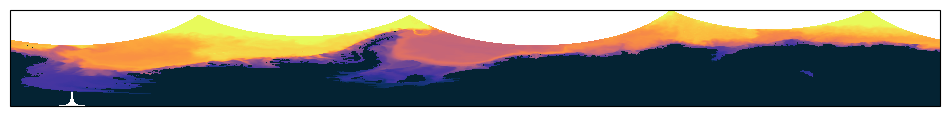

In [40]:
# Comparing OHC 10x4 km:

fig = plt.figure(figsize=(12,10.5))

# 1) map:
jst= 100
jen=-1
ist=0
ien=-1
tmin = 0
tmax = 0.5
# call cartopy projection
proj = ccrs.PlateCarree(central_longitude=-24)
ax2 = fig.add_subplot(311, projection=proj)
ct1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,temp3d_vint_4km_annual[jst:jen,ist:ien]*1e-9, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, vmin=tmin, vmax=tmax)
plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.4, color='lime',label='1500m isobath', transform=ccrs.PlateCarree()); # lime/turquoise
plt.scatter(lon_along_4km_CF,lat_along_4km_CF, s=.8, alpha=0.4, color='green',label='Calving front', transform=ccrs.PlateCarree()); # green/lightskyblue
plt.title('WAOM4, depth-integrated ocean heat content')

# ax2.gridlines(draw_labels=True,linewidth=.1)
gl = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
# gl.xlabel_style = {'size': 10, 'color': 'k'}
# gl.ylabel_style = {'size': 9, 'color': 'k'}

ax2.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
# plt.colorbar(ct1, location="right")
ax2.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .2
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

# 2) map WAOM10
jst= 40
jen=-1
ist=0
ien=-1
ax1 = fig.add_subplot(312, projection=proj)
ct1=plt.pcolormesh(lon_rho_10km[jst:jen,ist:ien].values,lat_rho_10km[jst:jen,ist:ien].values,temp3d_vint_10km_annual[jst:jen,ist:ien]*1e-9, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, vmin=tmin, vmax=tmax)
plt.scatter(lon_along_10km,lat_along_10km, s=.8, alpha=0.4, color='lime',label='1500m isobath', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF,lat_along_10km_CF, s=.8, alpha=0.4, color='green',label='Calving front', transform=ccrs.PlateCarree());
plt.title('WAOM10, depth-integrated ocean heat content')

gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

ax1.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
ax1.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .2
ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

cbar_ax1 = fig.add_axes([0.91, 0.4,  0.01, 0.44])
fig.colorbar(ct1, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('GJ')#, labelpad=-35)

### 3) difference 4km_i - 10km
jst_10= 40
jen_10=-1
ist_10=0
ien_10=-1
ax1 = fig.add_subplot(313, projection=proj)
ct1a=plt.pcolormesh(lon_rho_10km[jst_10:jen_10,ist_10:ien_10].values,lat_rho_10km[jst_10:jen_10,ist_10:ien_10].values,
                   (temp3d_vint_10km_annual[jst_10:jen_10,ist_10:ien_10] -
                   ohc_vint_4km_i[jst_10:jen_10,ist_10:ien_10])*1e-9
                    , transform=ccrs.PlateCarree(), cmap='bwr', vmin=-.25, vmax=.25)

plt.scatter(lon_along_10km,lat_along_10km, s=.8, alpha=0.4, color='lime',label='1500m isobath', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF,lat_along_10km_CF, s=.8, alpha=0.4, color='green',label='Calving front', transform=ccrs.PlateCarree());
plt.title('WAOM10 - WAOM4, depth-integrated OHC anomaly')

gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

ax1.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
ax1.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .2
ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

cbar_ax2 = fig.add_axes([0.91, 0.15,  0.01, 0.15])
fig.colorbar(ct1a, cax=cbar_ax2, orientation='vertical')
cbar_ax2.set_ylabel('GJ')#, labelpad=-35)

plt.savefig(fig_path + 'DeltaOHCvint_WAOM10-WAOM4.png', bbox_inches='tight', dpi=300)
plt.show()

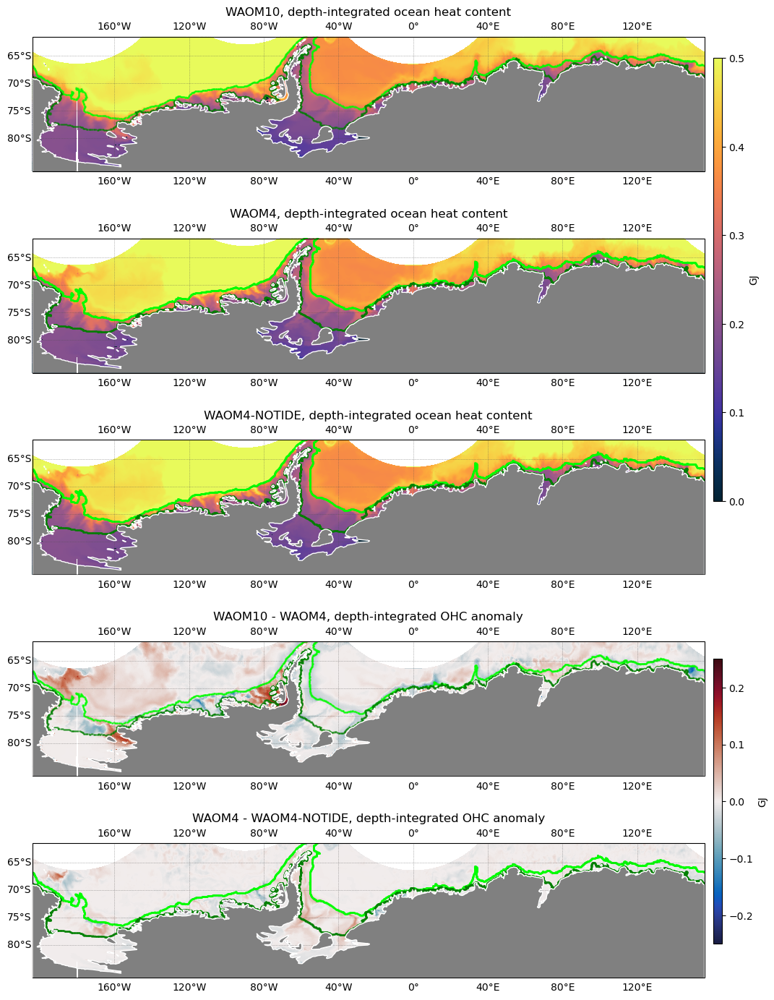

In [39]:
# Comparing OHC 10x4 km:

fig = plt.figure(figsize=(12,17.5))

# 1) map:
jst= 40
jen=-1
ist=0
ien=-1
tmin = 0
tmax = 0.5
ax1 = fig.add_subplot(511, projection=proj)
ct1=plt.pcolormesh(lon_rho_10km[jst:jen,ist:ien].values,lat_rho_10km[jst:jen,ist:ien].values,temp3d_vint_10km_annual[jst:jen,ist:ien]*1e-9, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, vmin=tmin, vmax=tmax)
plt.scatter(lon_along_10km,lat_along_10km, s=.8, alpha=0.4, color='lime',label='1500m isobath', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF,lat_along_10km_CF, s=.8, alpha=0.4, color='green',label='Calving front', transform=ccrs.PlateCarree());
plt.title('WAOM10, depth-integrated ocean heat content')

gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

ax1.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
ax1.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .2
ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

# 2) map WAOM4
jst= 100
jen=-1
ist=0
ien=-1
# call cartopy projection
proj = ccrs.PlateCarree(central_longitude=-24)
ax2 = fig.add_subplot(512, projection=proj)
ct1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,temp3d_vint_4km_annual[jst:jen,ist:ien]*1e-9, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, vmin=tmin, vmax=tmax)
plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.4, color='lime',label='1500m isobath', transform=ccrs.PlateCarree()); # lime/turquoise
plt.scatter(lon_along_4km_CF,lat_along_4km_CF, s=.8, alpha=0.4, color='green',label='Calving front', transform=ccrs.PlateCarree()); # green/lightskyblue
plt.title('WAOM4, depth-integrated ocean heat content')

# ax2.gridlines(draw_labels=True,linewidth=.1)
gl = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
# gl.xlabel_style = {'size': 10, 'color': 'k'}
# gl.ylabel_style = {'size': 9, 'color': 'k'}

ax2.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
# plt.colorbar(ct1, location="right")
ax2.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .2
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

# 4) map WAOM4-NOTIDE
jst= 100
jen=-1
ist=0
ien=-1
# call cartopy projection
proj = ccrs.PlateCarree(central_longitude=-24)
ax2 = fig.add_subplot(513, projection=proj)
ct1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,temp3d_vint_4kmNT_annual[jst:jen,ist:ien]*1e-9, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, vmin=tmin, vmax=tmax)
plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.4, color='lime',label='1500m isobath', transform=ccrs.PlateCarree()); # lime/turquoise
plt.scatter(lon_along_4km_CF,lat_along_4km_CF, s=.8, alpha=0.4, color='green',label='Calving front', transform=ccrs.PlateCarree()); # green/lightskyblue
plt.title('WAOM4-NOTIDE, depth-integrated ocean heat content')

# ax2.gridlines(draw_labels=True,linewidth=.1)
gl = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
# gl.xlabel_style = {'size': 10, 'color': 'k'}
# gl.ylabel_style = {'size': 9, 'color': 'k'}

ax2.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
# plt.colorbar(ct1, location="right")
ax2.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .2
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

cbar_ax1 = fig.add_axes([0.91, 0.5,  0.01, 0.35])
fig.colorbar(ct1, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('GJ')#, labelpad=-35)

### 3) difference 4km_i - 10km
jst_10= 40
jen_10=-1
ist_10=0
ien_10=-1
ax1 = fig.add_subplot(514, projection=proj)
ct1a=plt.pcolormesh(lon_rho_10km[jst_10:jen_10,ist_10:ien_10].values,lat_rho_10km[jst_10:jen_10,ist_10:ien_10].values,
                   (temp3d_vint_10km_annual[jst_10:jen_10,ist_10:ien_10] -
                   ohc_vint_4km_i[jst_10:jen_10,ist_10:ien_10])*1e-9
                    , transform=ccrs.PlateCarree(), cmap=cmocean.cm.balance, vmin=-.25, vmax=.25)

plt.scatter(lon_along_10km,lat_along_10km, s=.8, alpha=0.4, color='lime',label='1500m isobath', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF,lat_along_10km_CF, s=.8, alpha=0.4, color='green',label='Calving front', transform=ccrs.PlateCarree());
plt.title('WAOM10 - WAOM4, depth-integrated OHC anomaly')

gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

ax1.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
ax1.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .2
ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)


### 5) difference 4km_i - 4km

ax1 = fig.add_subplot(515, projection=proj)
ct1a=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                   (temp3d_vint_4km_annual[jst:jen,ist:ien] - temp3d_vint_4kmNT_annual[jst:jen,ist:ien])*1e-9,
                    transform=ccrs.PlateCarree(), cmap=cmocean.cm.balance, vmin=-.25, vmax=.25)
plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.4, color='lime',label='1500m isobath', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km_CF,lat_along_4km_CF, s=.8, alpha=0.4, color='green',label='Calving front', transform=ccrs.PlateCarree());
plt.title('WAOM4 - WAOM4-NOTIDE, depth-integrated OHC anomaly')

gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

ax1.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
ax1.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .2
ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

cbar_ax2 = fig.add_axes([0.91, 0.15,  0.01, 0.225])
fig.colorbar(ct1a, cax=cbar_ax2, orientation='vertical')
cbar_ax2.set_ylabel('GJ')#, labelpad=-35)

plt.savefig(fig_path + 'DeltaOHCvint_WAOM10x4x4NT.png', bbox_inches='tight', dpi=300)
plt.show()

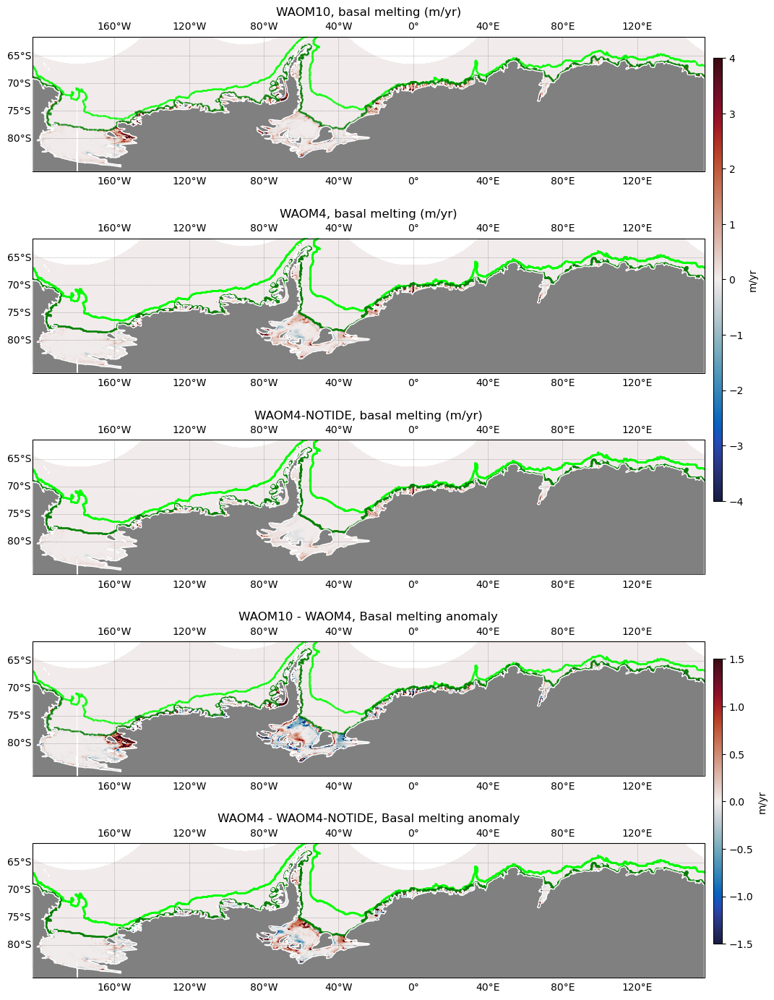

In [40]:
# Comparing OHC 10x4 km:

fig = plt.figure(figsize=(12,17.5))

Melt_fac=365.25*86400

# 1) map:
jst= 40
jen=-1
ist=0
ien=-1
tmin = -4
tmax = 4
ax1 = fig.add_subplot(511, projection=proj)
ct1=plt.pcolormesh(lon_rho_10km[jst:jen,ist:ien].values,lat_rho_10km[jst:jen,ist:ien].values,melt_10km[:,jst:jen,ist:ien].mean('ocean_time')*Melt_fac, transform=ccrs.PlateCarree(), cmap=cmocean.cm.balance, vmin=tmin, vmax=tmax)
plt.scatter(lon_along_10km,lat_along_10km, s=.8, alpha=0.4, color='lime',label='1500m isobath', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF,lat_along_10km_CF, s=.8, alpha=0.4, color='green',label='Calving front', transform=ccrs.PlateCarree());
plt.title('WAOM10, basal melting (m/yr)')

gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

ax1.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
ax1.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .2
ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

# 2) map WAOM4
jst= 100
jen=-1
ist=0
ien=-1
# call cartopy projection
proj = ccrs.PlateCarree(central_longitude=-24)
ax2 = fig.add_subplot(512, projection=proj)
ct1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,melt_4km[:,jst:jen,ist:ien].mean('ocean_time')*Melt_fac, transform=ccrs.PlateCarree(), cmap=cmocean.cm.balance, vmin=tmin, vmax=tmax)
plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.4, color='lime',label='1500m isobath', transform=ccrs.PlateCarree()); # lime/turquoise
plt.scatter(lon_along_4km_CF,lat_along_4km_CF, s=.8, alpha=0.4, color='green',label='Calving front', transform=ccrs.PlateCarree()); # green/lightskyblue
plt.title('WAOM4, basal melting (m/yr)')

# ax2.gridlines(draw_labels=True,linewidth=.1)
gl = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
# gl.xlabel_style = {'size': 10, 'color': 'k'}
# gl.ylabel_style = {'size': 9, 'color': 'k'}

ax2.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
# plt.colorbar(ct1, location="right")
ax2.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .2
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

# 4) map WAOM4-NOTIDE
jst= 100
jen=-1
ist=0
ien=-1
# call cartopy projection
proj = ccrs.PlateCarree(central_longitude=-24)
ax2 = fig.add_subplot(513, projection=proj)
ct1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,melt_4kmNT[:,jst:jen,ist:ien].mean('ocean_time')*Melt_fac, transform=ccrs.PlateCarree(), cmap=cmocean.cm.balance, vmin=tmin, vmax=tmax)
plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.4, color='lime',label='1500m isobath', transform=ccrs.PlateCarree()); # lime/turquoise
plt.scatter(lon_along_4km_CF,lat_along_4km_CF, s=.8, alpha=0.4, color='green',label='Calving front', transform=ccrs.PlateCarree()); # green/lightskyblue
plt.title('WAOM4-NOTIDE, basal melting (m/yr)')

# ax2.gridlines(draw_labels=True,linewidth=.1)
gl = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
# gl.xlabel_style = {'size': 10, 'color': 'k'}
# gl.ylabel_style = {'size': 9, 'color': 'k'}

ax2.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
# plt.colorbar(ct1, location="right")
ax2.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .2
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

cbar_ax1 = fig.add_axes([0.91, 0.5,  0.01, 0.35])
fig.colorbar(ct1, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('m/yr')#, labelpad=-35)

### 3) difference 4km_i - 10km
jst_10= 40
jen_10=-1
ist_10=0
ien_10=-1
ax1 = fig.add_subplot(514, projection=proj)
ct1a=plt.pcolormesh(lon_rho_10km[jst_10:jen_10,ist_10:ien_10].values,lat_rho_10km[jst_10:jen_10,ist_10:ien_10].values,
                   (melt_10km[:,jst_10:jen_10,ist_10:ien_10].mean('ocean_time') -
                   melt_4km_i[jst_10:jen_10,ist_10:ien_10])*Melt_fac
                    , transform=ccrs.PlateCarree(), cmap=cmocean.cm.balance, vmin=-1.5, vmax=1.5)

plt.scatter(lon_along_10km,lat_along_10km, s=.8, alpha=0.4, color='lime',label='1500m isobath', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF,lat_along_10km_CF, s=.8, alpha=0.4, color='green',label='Calving front', transform=ccrs.PlateCarree());
plt.title('WAOM10 - WAOM4, Basal melting anomaly')

gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

ax1.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
ax1.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .2
ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)


### 5) difference 4km_i - 4km

ax1 = fig.add_subplot(515, projection=proj)
ct1a=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                   (melt_4km[:,jst:jen,ist:ien].mean('ocean_time') - melt_4kmNT[:,jst:jen,ist:ien].mean('ocean_time'))*Melt_fac,
                    transform=ccrs.PlateCarree(), cmap=cmocean.cm.balance, vmin=-1.5, vmax=1.5)
plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.4, color='lime',label='1500m isobath', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km_CF,lat_along_4km_CF, s=.8, alpha=0.4, color='green',label='Calving front', transform=ccrs.PlateCarree());
plt.title('WAOM4 - WAOM4-NOTIDE, Basal melting anomaly')

gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

ax1.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
ax1.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .2
ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

cbar_ax2 = fig.add_axes([0.91, 0.15,  0.01, 0.225])
fig.colorbar(ct1a, cax=cbar_ax2, orientation='vertical')
cbar_ax2.set_ylabel('m/yr')#, labelpad=-35)

plt.savefig(fig_path + 'BasalMelt_WAOM10x4x4NT.png', bbox_inches='tight', dpi=300)
plt.show()

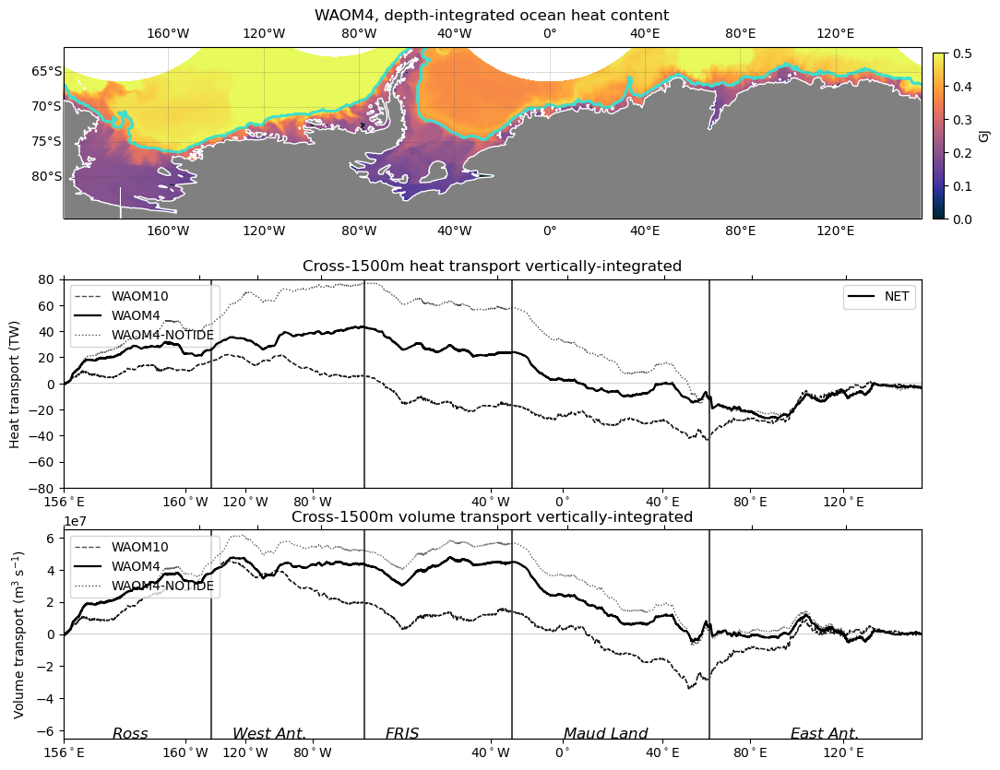

In [41]:
## paper figure with:
# 1) map of OHC depth-integrated
# 2) plot of vertically-integrated  OHT (mean+eddy) across 1500m
# 3) add OHT across CF line below.

### fig, ax = plt.subplots(nrows=2, figsize = (12, 7))
fig = plt.figure(figsize=(12,10))

# 1) map:
jst= 100
jen=-1
ist=0
ien=-1
tmin = 0
tmax = 0.5
# call cartopy projection
proj = ccrs.PlateCarree(central_longitude=-24)
ax2 = fig.add_subplot(311, projection=proj)
ct1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,temp3d_vint_4km_annual[jst:jen,ist:ien]*1e-9, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, vmin=tmin, vmax=tmax)
plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.4, color='turquoise',label='1500m isobath', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_4km_CF,lat_along_4km_CF, s=.8, alpha=0.4, color='lightskyblue',label='Calving front', transform=ccrs.PlateCarree());
plt.title('WAOM4, depth-integrated ocean heat content')

# ax2.gridlines(draw_labels=True,linewidth=.1)
gl = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
# gl.xlabel_style = {'size': 10, 'color': 'k'}
# gl.ylabel_style = {'size': 9, 'color': 'k'}

ax2.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
# plt.colorbar(ct1, location="right")
ax2.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .2
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

cbar_ax1 = fig.add_axes([0.91, 0.674,  0.01, 0.18])
fig.colorbar(ct1, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('GJ')#, labelpad=-35)

# 2) 
ax1 = fig.add_subplot(312)
# ax1.text(2,75,'Annual mean and eddy heat transport',fontsize=16)
ax1.plot(dist_along_10km[:],np.zeros(cumsum_mean_10km[:].shape),'-', color=[.7,.7,.7], linewidth=0.5)
ax1.plot(dist_along_10km[:],(cumsum_mean_10km+cumsum_eddy_10km),'--k', label='WAOM10', linewidth=1,alpha=0.7)
ax1.plot(dist_along_4km[0],(cumsum_mean_4km[0]+cumsum_eddy_4km[0]),'-k',label='WAOM4', linewidth=1.6) # plot just to add legend
ax1.plot(dist_along_4km[0],(cumsum_mean_4kmNT[0]+cumsum_eddy_4kmNT[0]),':k',label='WAOM4-NOTIDE', linewidth=1,alpha=0.7)  # plot just to add legend
ax1.legend(loc='upper left')
# ax1.plot(dist_along_10km[:],cumsum_mean_10km,'--',color='dodgerblue', linewidth=1,alpha=0.6)
# ax1.plot(dist_along_10km[:],cumsum_eddy_10km,'--',color='orangered',linewidth=1,alpha=0.6)
ax1.plot(dist_along_10km[:],(cumsum_mean_10km+cumsum_eddy_10km),'--k', linewidth=1,alpha=0.7)

ax1.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km[-1])

ax1b = ax1.twiny()
ax1b.plot(dist_along_4km[:],(cumsum_mean_4km+cumsum_eddy_4km),'-k',label='NET', linewidth=1.6)
# ax1b.plot(dist_along_4km[:],cumsum_eddy_4km,'-',label='EIT',color='orangered',linewidth=1.6)
# ax1b.plot(dist_along_4km[:],cumsum_mean_4km,'-',label='ADV',color='dodgerblue',linewidth=1.6)
ax1b.legend(loc='upper right')
ax1b.plot(dist_along_4km[:],(cumsum_mean_4kmNT+cumsum_eddy_4kmNT),':k', linewidth=1,alpha=0.7)
# ax1b.plot(dist_along_4km[:],cumsum_mean_4kmNT,':',color='dodgerblue',linewidth=1,alpha=0.6)
# ax1b.plot(dist_along_4km[:],cumsum_eddy_4kmNT,':',color='orangered',linewidth=1,alpha=0.6)
ax1b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax1b.set_xticklabels((''))
ax1b.set_xlim(0, dist_along_4km[-1])
ax1b.legend(loc='upper right')

ymin=-80
ymax=80
ax1.set_ylim(ymin,ymax)
# ax1.text(dist_along_10km[452].values-2.5,ymin-10,'$\it{Ross}$',fontsize=12, color='k')       
ax1.plot([dist_along_10km[452].values,dist_along_10km[452].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
# ax1.text(dist_along_10km[452].values+.5,ymin-10,'$\it{West\ Ant.}$',fontsize=12, color='k')             
ax1.plot([dist_along_10km[918].values,dist_along_10km[918].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
# ax1.text(dist_along_10km[918].values+.5,ymin-10,'$\it{FRIS}$',fontsize=12, color='k')        
ax1.plot([dist_along_10km[1383].values,dist_along_10km[1383].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
# ax1.text(dist_along_10km[1383].values+1.25,ymin-10,'$\it{Maud\ Land}$',fontsize=12, color='k')        
ax1.plot([dist_along_10km[2012].values,dist_along_10km[2012].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
# ax1.text(dist_along_10km[2012].values+2,ymin-10,'$\it{East\ Ant.}$',fontsize=12, color='k')   
ax1.set_title('Cross-1500m heat transport vertically-integrated')
ax1.set_ylabel('Heat transport (TW)')

# 3) Volume transp cross-1500m
ax3 = fig.add_subplot(313)
# ax3.text(2,75,'Annual mean and eddy heat transport',fontsize=16)
ax3.plot(dist_along_10km[:],np.zeros(VT_cumsum_mean_10km[:].shape),'-', color=[.7,.7,.7], linewidth=0.5)
ax3.plot(dist_along_10km[:],(VT_cumsum_mean_10km),'--k', label='WAOM10', linewidth=1,alpha=0.7)
ax3.plot(dist_along_4km[0],(VT_cumsum_mean_4km[0]),'-k',label='WAOM4', linewidth=1.6) # plot just to add legend
ax3.plot(dist_along_4km[0],(VT_cumsum_mean_4kmNT[0]),':k',label='WAOM4-NOTIDE', linewidth=1,alpha=0.7)  # plot just to add legend
ax3.legend(loc='upper left')

ax3.plot(dist_along_10km[:],(VT_cumsum_mean_10km),'--k', linewidth=1,alpha=0.7)

ax3.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax3.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3.set_xlim(0, dist_along_10km[-1])

ax3b = ax3.twiny()
ax3b.plot(dist_along_4km[:],VT_cumsum_mean_4km,'-',color='k',linewidth=1.6)
ax3b.plot(dist_along_4km[:],VT_cumsum_mean_4kmNT,':',color='k',linewidth=1,alpha=0.6)
ax3b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax3b.set_xticklabels((''))
ax3b.set_xlim(0, dist_along_4km[-1])

ymin=-6.5e7
ymax=6.5e7
ax3.set_ylim(ymin,ymax)
ax3.text(dist_along_10km[452].values-2.5,ymin+350,'$\it{Ross}$',fontsize=12, color='k')       
ax3.plot([dist_along_10km[452].values,dist_along_10km[452].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
ax3.text(dist_along_10km[452].values+.5,ymin+350,'$\it{West\ Ant.}$',fontsize=12, color='k')             
ax3.plot([dist_along_10km[918].values,dist_along_10km[918].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
ax3.text(dist_along_10km[918].values+.5,ymin+350,'$\it{FRIS}$',fontsize=12, color='k')        
ax3.plot([dist_along_10km[1383].values,dist_along_10km[1383].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
ax3.text(dist_along_10km[1383].values+1.25,ymin+350,'$\it{Maud\ Land}$',fontsize=12, color='k')        
ax3.plot([dist_along_10km[2012].values,dist_along_10km[2012].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
ax3.text(dist_along_10km[2012].values+2,ymin+350,'$\it{East\ Ant.}$',fontsize=12, color='k')   
ax3.set_title('Cross-1500m volume transport vertically-integrated')
ax3.set_ylabel('Volume transport (m$^3$ s$^{-1}$)')


plt.savefig(fig_path + 'Figure1_OHCvint+_Total_HTcumsum_cross1500m_v4.png', bbox_inches='tight', dpi=300)
# plt.savefig(fig_path + 'Figure1_OHCvint+_MeanEddy_HTcumsum_cross1500m_v3.png', bbox_inches='tight', dpi=300)
# plt.show()

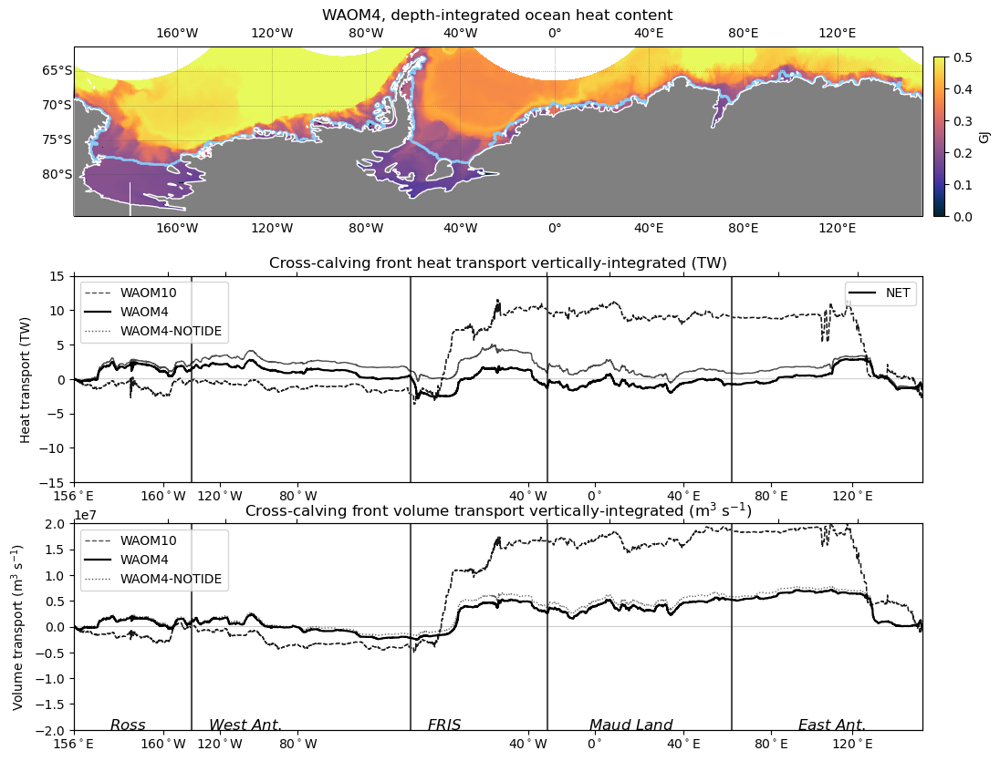

In [42]:
## paper figure with:
# 1) map of OHC depth-integrated
# 2) plot of vertically-integrated  OHT (mean+eddy) across 1500m
# 3) add OHT across CF line below.

### fig, ax = plt.subplots(nrows=2, figsize = (12, 7))
fig = plt.figure(figsize=(12,10))

# 1) map:
jst= 100
jen=-1
ist=0
ien=-1
tmin = 0
tmax = 0.5
# call cartopy projection
proj = ccrs.PlateCarree(central_longitude=-24)
ax2 = fig.add_subplot(311, projection=proj)
ct1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,temp3d_vint_4km_annual[jst:jen,ist:ien]*1e-9, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, vmin=tmin, vmax=tmax)
# plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.4, color='turquoise',label='1500m isobath', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km_CF,lat_along_4km_CF, s=.8, alpha=0.4, color='lightskyblue',label='Calving front', transform=ccrs.PlateCarree());
plt.title('WAOM4, depth-integrated ocean heat content')

# ax2.gridlines(draw_labels=True,linewidth=.1)
gl = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
# gl.xlabel_style = {'size': 10, 'color': 'k'}
# gl.ylabel_style = {'size': 9, 'color': 'k'}

ax2.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
# plt.colorbar(ct1, location="right")
ax2.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .2
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

cbar_ax1 = fig.add_axes([0.91, 0.674,  0.01, 0.175])
fig.colorbar(ct1, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('GJ')#, labelpad=-35)

# 2) 
ax1 = fig.add_subplot(312)
# ax1.text(2,75,'Annual mean and eddy heat transport',fontsize=16)
ax1.plot(dist_along_10km_CF[:],np.zeros(cumsum_mean_10km_CF[:].shape),'-', color=[.7,.7,.7], linewidth=0.5)
ax1.plot(dist_along_10km_CF[:],(cumsum_mean_10km_CF+cumsum_eddy_10km_CF),'--k', label='WAOM10', linewidth=1,alpha=0.7)
ax1.plot(dist_along_4km_CF[0],(cumsum_mean_4km_CF[0]+cumsum_eddy_4km_CF[0]),'-k',label='WAOM4', linewidth=1.6) # plot just to add legend
ax1.plot(dist_along_4km_CF[0],(cumsum_mean_4kmNT_CF[0]+cumsum_eddy_4kmNT_CF[0]),':k',label='WAOM4-NOTIDE', linewidth=1,alpha=0.7)  # plot just to add legend
ax1.legend(loc='upper left')
ax1.plot(dist_along_10km_CF[:],(cumsum_mean_10km_CF+cumsum_eddy_10km_CF),'--k', linewidth=1,alpha=0.7)

ax1.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km_CF[-1])

ax1b = ax1.twiny()
ax1b.plot(dist_along_4km_CF[:],(cumsum_mean_4km_CF+cumsum_eddy_4km_CF),'-k',label='NET', linewidth=1.6)
ax1b.legend(loc='upper right')
ax1b.plot(dist_along_4km_CF[:],(cumsum_mean_4kmNT_CF+cumsum_eddy_4kmNT_CF),'-k', linewidth=1,alpha=0.7)
ax1b.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax1b.set_xticklabels((''))
ax1b.set_xlim(0, dist_along_4km_CF[-1])
ax1b.legend(loc='upper right')

ymin=-15
ymax=15
ax1.set_ylim(ymin,ymax)
ax1.plot([dist_along_10km_CF[436].values,dist_along_10km_CF[436].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
ax1.plot([dist_along_10km_CF[1293].values,dist_along_10km_CF[1293].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
ax1.plot([dist_along_10km_CF[1826].values,dist_along_10km_CF[1826].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
ax1.plot([dist_along_10km_CF[2540].values,dist_along_10km_CF[2540].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
ax1.set_title('Cross-calving front heat transport vertically-integrated (TW)')
ax1.set_ylabel('Heat transport (TW)')

# 3) Volume transp cross-calving front
ax3 = fig.add_subplot(313)
# ax3.text(2,75,'Annual mean and eddy heat transport',fontsize=16)
ax3.plot(dist_along_10km_CF[:],np.zeros(VT_cumsum_mean_10km_CF[:].shape),'-', color=[.7,.7,.7], linewidth=0.5)
ax3.plot(dist_along_10km_CF[:],(VT_cumsum_mean_10km_CF),'--k', label='WAOM10', linewidth=1,alpha=0.7)
ax3.plot(dist_along_4km_CF[0],(VT_cumsum_mean_4km_CF[0]),'-k',label='WAOM4', linewidth=1.6) # plot just to add legend
ax3.plot(dist_along_4km_CF[0],(VT_cumsum_mean_4kmNT_CF[0]),':k',label='WAOM4-NOTIDE', linewidth=1,alpha=0.7)  # plot just to add legend
ax3.legend(loc='upper left')

ax3.plot(dist_along_10km_CF[:],(VT_cumsum_mean_10km_CF),'--k', linewidth=1,alpha=0.7)

ax3.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax3.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3.set_xlim(0, dist_along_10km_CF[-1])

ax3b = ax3.twiny()
ax3b.plot(dist_along_4km_CF[:],VT_cumsum_mean_4km_CF,'-',color='k',linewidth=1.6)
ax3b.plot(dist_along_4km_CF[:],VT_cumsum_mean_4kmNT_CF,':',color='k',linewidth=1,alpha=0.6)
ax3b.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax3b.set_xticklabels((''))
ax3b.set_xlim(0, dist_along_4km_CF[-1])

ymin=-2.e7
ymax=2.e7
ax3.set_ylim(ymin,ymax)
ax3.text(dist_along_10km_CF[436].values-2.5,ymin+150,'$\it{Ross}$',fontsize=12, color='k')       
ax3.plot([dist_along_10km_CF[436].values,dist_along_10km_CF[436].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
ax3.text(dist_along_10km_CF[436].values+.5,ymin+150,'$\it{West\ Ant.}$',fontsize=12, color='k')             
ax3.plot([dist_along_10km_CF[1293].values,dist_along_10km_CF[1293].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
ax3.text(dist_along_10km_CF[1293].values+.5,ymin+150,'$\it{FRIS}$',fontsize=12, color='k')        
ax3.plot([dist_along_10km_CF[1826].values,dist_along_10km_CF[1826].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
ax3.text(dist_along_10km_CF[1826].values+1.25,ymin+150,'$\it{Maud\ Land}$',fontsize=12, color='k')        
ax3.plot([dist_along_10km_CF[2540].values,dist_along_10km_CF[2540].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
ax3.text(dist_along_10km_CF[2540].values+2,ymin+150,'$\it{East\ Ant.}$',fontsize=12, color='k')   
ax3.set_title('Cross-calving front volume transport vertically-integrated (m$^3$ s$^{-1}$)')
ax3.set_ylabel('Volume transport (m$^3$ s$^{-1}$)')

plt.savefig(fig_path + 'Figure1_OHCvint+_Total_HTcumsum_crossCF_v4.png', bbox_inches='tight', dpi=300)
# plt.savefig(fig_path + 'Figure1_OHCvint+_MeanEddy_HTcumsum_crossCF_v3.png', bbox_inches='tight', dpi=300)
# plt.show()

In [43]:
lon_along_4km_CF

<xarray.Variable (contour_index_array: 9018)> Size: 72kB
array([154.012378, 154.05654 , 154.05654 , ..., 153.842207, 153.884402,
       153.970408])
Attributes:
    long_name:      longitude of RHO-points
    standard_name:  longitude
    units:          degree_east

In [ ]:
# lon_along_4km[2012]

In [ ]:
## paper figure with:
# 1) map of Delta OHC depth-integrated (yr10 - yr9)
# 2) plot of vertically-integrated  OHT (mean+eddy) across 1500m
# 3) add OHT across CF line below.

fig = plt.figure(figsize=(12,7))
# 1)
ax1 = fig.add_subplot(212)
# ax1.text(2,75,'Annual mean and eddy heat transport',fontsize=16)
ax1.plot(dist_along_10km[:],np.zeros(cumsum_mean_10km[:].shape),'-', color=[.7,.7,.7], linewidth=0.5)
ax1.plot(dist_along_10km[:],cumsum_mean_10km+cumsum_eddy_10km,'--k', label='WAOM10', linewidth=1,alpha=0.7)
ax1.plot(dist_along_4km[0],cumsum_mean_4km[0]+cumsum_eddy_4km[0],'-k',label='WAOM4', linewidth=1.6) # plot just to add legend
# ax1.plot(dist_along_4km[0],cumsum_mean_4kmNT[0]+cumsum_eddy_4kmNT[0],':k',label='WAOM4-NOTIDE', linewidth=1,alpha=0.7)  # plot just to add legend
ax1.legend(loc='upper left')
ax1.plot(dist_along_10km[:],cumsum_mean_10km,'--',color='dodgerblue', linewidth=1,alpha=0.6)
ax1.plot(dist_along_10km[:],cumsum_eddy_10km,'--',color='orangered',linewidth=1,alpha=0.6)
ax1.plot(dist_along_10km[:],cumsum_mean_10km+cumsum_eddy_10km,'--k', linewidth=1,alpha=0.7)

ax1.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km[-1])

ax1b = ax1.twiny()
ax1b.plot(dist_along_4km[:],cumsum_mean_4km+cumsum_eddy_4km,'-k',label='NET', linewidth=1.6)
ax1b.plot(dist_along_4km[:],cumsum_eddy_4km,'-',label='EIT',color='orangered',linewidth=1.6)
ax1b.plot(dist_along_4km[:],cumsum_mean_4km,'-',label='ADV',color='dodgerblue',linewidth=1.6)
ax1b.legend(loc='upper right')
# ax1b.plot(dist_along_4km[:],cumsum_mean_4kmNT+cumsum_eddy_4kmNT,'-k', linewidth=1,alpha=0.7)
# ax1b.plot(dist_along_4km[:],cumsum_mean_4kmNT,':',color='dodgerblue',linewidth=1,alpha=0.6)
# ax1b.plot(dist_along_4km[:],cumsum_eddy_4kmNT,':',color='orangered',linewidth=1,alpha=0.6)
ax1b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax1b.set_xticklabels((''))
ax1b.set_xlim(0, dist_along_4km[-1])
ax1b.legend(loc='upper right')

# ax1.set_ylim(-450,450)
# ax1.text(2.895576e+00-1.5,-400,'Ross',fontsize=13, color='k')         # 4) Mask Ross (140W : 160E, lat < -60)
# ax1.plot([3.634185,3.634185],[-600,600],'-', color=[.3,.3,.3])                 
# ax1.text(4.1,-400,'West Ant.',fontsize=13, color='k')           # 5) Mask West Antarctica (150W : 90W, lat < -65)
# ax1.plot([8,8],[-600,600],'-', color=[.3,.3,.3])                                # 1) Mask Weddell (90W : 25W, lat < -75, 65W : 25W, lat <= -75)
# ax1.text(9,-400,'Weddell',fontsize=13, color='k')
# ax1.plot([11.5,11.5],[-600,600],'-', color=[.3,.3,.3])     
# ax1.text(12,-400,'Maud Land',fontsize=13, color='k')                  # 2) Mask Maud Land (25W : 60E, lat < -60)
# ax1.plot([15,15],[-600,600],'-', color=[.3,.3,.3])      
# ax1.text(17,-400,'East Ant.',fontsize=13, color='k')            # 3) Mask East Antarctica (60E : 160E, lat < -60)
ax1.set_title('Cross-CF heat transport vertically-integrated (TW)')
ax1.set_ylabel('Heat transport (TW)')

# map:
# call cartopy projection
proj = ccrs.PlateCarree(central_longitude=-24)
ax2 = fig.add_subplot(211, projection=proj)
ct1a=plt.pcolormesh(lon_rho_10km[jst_10:jen_10,ist_10:ien_10].values,lat_rho_10km[jst_10:jen_10,ist_10:ien_10].values,
                   (temp3d_vint_10km_annual[jst_10:jen_10,ist_10:ien_10] -
                   ohc_vint_4km_i[jst_10:jen_10,ist_10:ien_10])*1e-9
                    , transform=ccrs.PlateCarree(), cmap='bwr', vmin=-.25, vmax=.25)
plt.scatter(lon_along_4km_CF,lat_along_4km_CF, s=.8, alpha=0.2, color='lime',label='Calving front', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='green',label='1500m isobath', transform=ccrs.PlateCarree());
plt.title('Ocean heat content depth-integrated')

ax2.gridlines(draw_labels=True,linewidth=.1)
ax2.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
ax2.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .2
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

cbar_ax1 = fig.add_axes([0.91, 0.575,  0.01, 0.26])
fig.colorbar(ct1a, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('GJ')#, labelpad=-35)

plt.savefig(fig_path + 'Figure1_OHCvint+_MeanEddy_HTcumsum_cross1500m_v4.png', bbox_inches='tight', dpi=300)
plt.show()

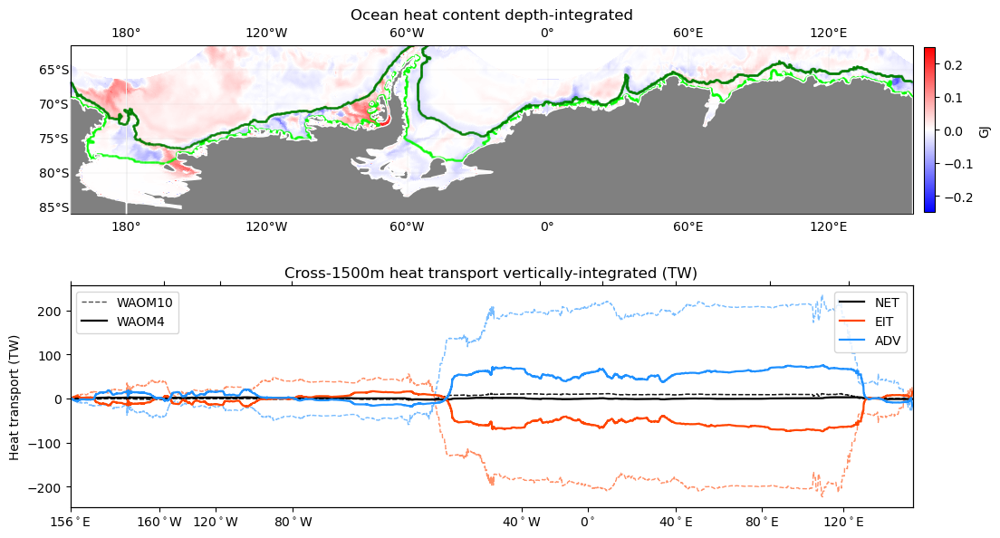

In [44]:
## paper figure with:
# 1) map of Delta OHC depth-integrated (yr10 - yr9)
# 2) plot of vertically-integrated  OHT (mean+eddy) across 1500m
# 3) add OHT across CF line below.

fig = plt.figure(figsize=(12,7))
# 1)
ax1 = fig.add_subplot(212)
# ax1.text(2,75,'Annual mean and eddy heat transport',fontsize=16)
ax1.plot(dist_along_10km_CF[:],np.zeros(cumsum_mean_10km_CF[:].shape),'-', color=[.7,.7,.7], linewidth=0.5)
ax1.plot(dist_along_10km_CF[:],cumsum_mean_10km_CF+cumsum_eddy_10km_CF,'--k', label='WAOM10', linewidth=1,alpha=0.7)
ax1.plot(dist_along_4km_CF[0],cumsum_mean_4km_CF[0]+cumsum_eddy_4km_CF[0],'-k',label='WAOM4', linewidth=1.6) # plot just to add legend
# ax1.plot(dist_along_4km_CF[0],cumsum_mean_4kmNT_C[0]+cumsum_eddy_4kmNT_C[0],':k',label='WAOM4-NOTIDE', linewidth=1,alpha=0.7)  # plot just to add legend
ax1.legend(loc='upper left')
ax1.plot(dist_along_10km_CF[:],cumsum_mean_10km_CF,'--',color='dodgerblue', linewidth=1,alpha=0.6)
ax1.plot(dist_along_10km_CF[:],cumsum_eddy_10km_CF,'--',color='orangered',linewidth=1,alpha=0.6)
ax1.plot(dist_along_10km_CF[:],cumsum_mean_10km_CF+cumsum_eddy_10km_CF,'--k', linewidth=1,alpha=0.7)

ax1.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km_CF[-1])

ax1b = ax1.twiny()
ax1b.plot(dist_along_4km_CF[:],cumsum_mean_4km_CF+cumsum_eddy_4km_CF,'-k',label='NET', linewidth=1.6)
ax1b.plot(dist_along_4km_CF[:],cumsum_eddy_4km_CF,'-',label='EIT',color='orangered',linewidth=1.6)
ax1b.plot(dist_along_4km_CF[:],cumsum_mean_4km_CF,'-',label='ADV',color='dodgerblue',linewidth=1.6)
ax1b.legend(loc='upper right')
# ax1b.plot(dist_along_4km_CF[:],cumsum_mean_4kmNT_C+cumsum_eddy_4kmNT_C,'-k', linewidth=1,alpha=0.7)
# ax1b.plot(dist_along_4km_CF[:],cumsum_mean_4kmNT_C,':',color='dodgerblue',linewidth=1,alpha=0.6)
# ax1b.plot(dist_along_4km_CF[:],cumsum_eddy_4kmNT_C,':',color='orangered',linewidth=1,alpha=0.6)
ax1b.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax1b.set_xticklabels((''))
ax1b.set_xlim(0, dist_along_4km_CF[-1])
ax1b.legend(loc='upper right')

# ax1.set_ylim(-450,450)
# ax1.text(2.895576e+00-1.5,-400,'Ross',fontsize=13, color='k')         # 4) Mask Ross (140W : 160E, lat < -60)
# ax1.plot([3.634185,3.634185],[-600,600],'-', color=[.3,.3,.3])                 
# ax1.text(4.1,-400,'West Ant.',fontsize=13, color='k')           # 5) Mask West Antarctica (150W : 90W, lat < -65)
# ax1.plot([8,8],[-600,600],'-', color=[.3,.3,.3])                                # 1) Mask Weddell (90W : 25W, lat < -75, 65W : 25W, lat <= -75)
# ax1.text(9,-400,'Weddell',fontsize=13, color='k')
# ax1.plot([11.5,11.5],[-600,600],'-', color=[.3,.3,.3])     
# ax1.text(12,-400,'Maud Land',fontsize=13, color='k')                  # 2) Mask Maud Land (25W : 60E, lat < -60)
# ax1.plot([15,15],[-600,600],'-', color=[.3,.3,.3])      
# ax1.text(17,-400,'East Ant.',fontsize=13, color='k')            # 3) Mask East Antarctica (60E : 160E, lat < -60)
ax1.set_title('Cross-1500m heat transport vertically-integrated (TW)')
ax1.set_ylabel('Heat transport (TW)')

# map:
# call cartopy projection
proj = ccrs.PlateCarree(central_longitude=-24)
ax2 = fig.add_subplot(211, projection=proj)
ct1a=plt.pcolormesh(lon_rho_10km[jst_10:jen_10,ist_10:ien_10].values,lat_rho_10km[jst_10:jen_10,ist_10:ien_10].values,
                   (temp3d_vint_10km_annual[jst_10:jen_10,ist_10:ien_10] -
                   ohc_vint_4km_i[jst_10:jen_10,ist_10:ien_10])*1e-9
                    , transform=ccrs.PlateCarree(), cmap='bwr', vmin=-.25, vmax=.25)
plt.scatter(lon_along_4km_CF,lat_along_4km_CF, s=.8, alpha=0.2, color='lime',label='Calving front', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='green',label='1500m isobath', transform=ccrs.PlateCarree());
plt.title('Ocean heat content depth-integrated')

ax2.gridlines(draw_labels=True,linewidth=.1)
ax2.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
ax2.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .2
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

cbar_ax1 = fig.add_axes([0.91, 0.575,  0.01, 0.26])
fig.colorbar(ct1a, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('GJ')#, labelpad=-35)

plt.savefig(fig_path + 'Figure1_OHCvint+_MeanEddy_HTcumsum_crossCF_v4.png', bbox_inches='tight', dpi=300)
plt.show()

In [45]:
## plot for COSIMA poster:
files_path = '/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/'

contour_masked_above = np.load(files_path + 'WAOM10_contour_masked_above_1500m_v3', allow_pickle=True)
contour_masked_above_CF = np.load(files_path + 'WAOM10_contour_masked_above_CF_v3', allow_pickle=True)
# contour_masked_above_4km = np.load(files_path + 'WAOM4_contour_masked_above_1500m_v3', allow_pickle=True)
# contour_masked_above_4km_CF = np.load(files_path + 'WAOM4_contour_masked_above_CF_v3', allow_pickle=True)

6 rows:

##### 1st : OHC + basal melting
##### 2nd : OHC anomaly WAOM10 - WAOM4/4NT
##### 3rd : Total HT Cross-1500 comparison
##### 4th : Decomp. mean-eddy HT Cross-1500 comparison
##### 5th : Total HT Cross-Calv Front comparison
##### 6th : Decomp. mean-eddy HT Cross-Calv Front comparison



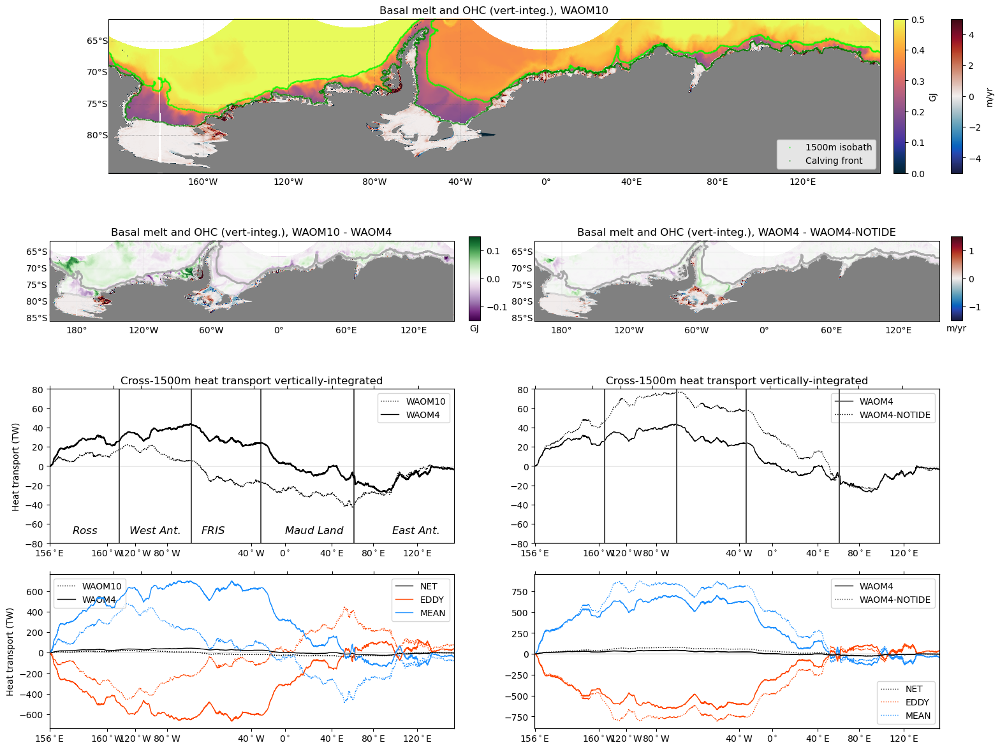

In [114]:
#
fig = plt.figure(figsize=(18,22))

Melt_fac=365.25*86400

#  ============ 1st line:
jst= 40
jen=-1
ist=0
ien=-1
tmin = 0
tmax = 0.5
ax1 = fig.add_subplot(6,1,1, projection=proj)
ct1=plt.pcolormesh(lon_rho_10km[jst:jen,ist:ien].values,lat_rho_10km[jst:jen,ist:ien].values,temp3d_vint_10km_annual[jst:jen,ist:ien]*1e-9, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, vmin=tmin, vmax=tmax)
cm1=plt.pcolormesh(lon_rho_10km[jst:jen,ist:ien].values,lat_rho_10km[jst:jen,ist:ien].values,
                   ma.masked_where(contour_masked_above_CF[jst:jen,ist:ien] == -1000, melt_10km[:,jst:jen,ist:ien].mean('ocean_time'))*Melt_fac,
                   transform=ccrs.PlateCarree(), cmap=cmocean.cm.balance, vmin=-5, vmax=5)
plt.scatter(lon_along_10km,lat_along_10km, s=.8, alpha=0.4, color='lime',label='1500m isobath', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF,lat_along_10km_CF, s=.8, alpha=0.4, color='green',label='Calving front', transform=ccrs.PlateCarree());
### plot colorfull sections:
# plt.scatter(lon_along_10km,lat_along_10km, s=.8, alpha=0.2, color='k', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km[0:390],lat_along_10km[0:390], s=.2, alpha=.3, color='magenta',label='ROSS', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km[391:650],lat_along_10km[391:650], s=.2, alpha=.3, color='red',label='AMUDS', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km[651:850],lat_along_10km[651:850], s=.2, alpha=.3, color='lavenderblush',label='BELLS', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km[851:1240],lat_along_10km[851:1240], s=.2, alpha=.3, color='deeppink',label='EAP', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km[1241:1360],lat_along_10km[1241:1360], s=.2, alpha=.3, color='darkgreen',label='FRIS', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km[1361:2000],lat_along_10km[1361:2000], s=.2, alpha=.3, color='limegreen',label='MAUD', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km[2001:2360],lat_along_10km[2001:2360], s=.2, alpha=.3, color='aqua',label='PRY-SHA', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km[2361:2689],lat_along_10km[2361:2689], s=.2, alpha=.3, color='dodgerblue',label='TOT-MER', transform=ccrs.PlateCarree());
# - calving front selection:
# plt.scatter(lon_along_10km_CF,lat_along_10km_CF, s=.8, alpha=0.2, color='k', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[5:350],lat_along_10km_CF[5:350], s=.2, alpha=.3, color='magenta', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[351:730],lat_along_10km_CF[351:730], s=.2, alpha=.3, color='red', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[731:1220],lat_along_10km_CF[731:1220], s=.2, alpha=.3, color='lavenderblush', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[1221:1600],lat_along_10km_CF[1221:1600], s=.2, alpha=.3, color='deeppink', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[1601:1790],lat_along_10km_CF[1601:1790], s=.2, alpha=.3, color='darkgreen', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[1791:2515],lat_along_10km_CF[1791:2515], s=.2, alpha=.3, color='limegreen', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[2516:2940],lat_along_10km_CF[2516:2940], s=.2, alpha=.3, color='aqua', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[2941:3297],lat_along_10km_CF[2941:3297], s=.2, alpha=.3, color='dodgerblue', transform=ccrs.PlateCarree());
plt.legend(loc='lower right')
plt.title('Basal melt and OHC (vert-integ.), WAOM10')

gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlines = True
gl.top_labels=False   # suppress top labels
gl.xlabels_bottom = True
gl.ylabels_left = True
gl.xlocator = mticker.FixedLocator([-160, -120, -80, -40, 0, 40, 80, 120, 156])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER


ax1.add_feature(cfeature.LAND, zorder=3, facecolor='gray') # , edgecolor='white', 
ax1.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .2
ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
cbar_ax0 = fig.add_axes([0.86, 0.77,  0.01, 0.11])
fig.colorbar(ct1, cax=cbar_ax0, orientation='vertical')
cbar_ax0.set_ylabel('GJ')#, labelpad=-35)
cbar_ax1 = fig.add_axes([0.91, 0.77,  0.01, 0.11])
fig.colorbar(cm1, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('m/yr')#, labelpad=-35)

#  ============ 2nd line:
ax2 = fig.add_subplot(6,2,3, projection=proj)
ct1a=plt.pcolormesh(lon_rho_10km[jst_10:jen_10,ist_10:ien_10].values,lat_rho_10km[jst_10:jen_10,ist_10:ien_10].values,
                   (temp3d_vint_10km_annual[jst_10:jen_10,ist_10:ien_10] -
                   ohc_vint_4km_i[jst_10:jen_10,ist_10:ien_10])*1e-9
                    , transform=ccrs.PlateCarree(), cmap='PRGn', vmin=-.15, vmax=.15)
cm1a=plt.pcolormesh(lon_rho_10km[jst_10:jen_10,ist_10:ien_10].values,lat_rho_10km[jst_10:jen_10,ist_10:ien_10].values,
                    ma.masked_where(contour_masked_above_CF[jst:jen,ist:ien] == -1000, 
                    (melt_10km[:,jst_10:jen_10,ist_10:ien_10].mean('ocean_time') - melt_4km_i[jst_10:jen_10,ist_10:ien_10]))*Melt_fac,
                    transform=ccrs.PlateCarree(), cmap=cmocean.cm.balance, vmin=-1.5, vmax=1.5)          
                   
plt.scatter(lon_along_4km_CF,lat_along_4km_CF, s=.8, alpha=0.2, color='lightgray',label='Calving front', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='darkgray',label='1500m isobath', transform=ccrs.PlateCarree());
plt.title('Basal melt and OHC (vert-integ.), WAOM10 - WAOM4')

gl=ax2.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False   # suppress top labels
ax2.add_feature(cfeature.LAND, zorder=3, facecolor='gray') # , edgecolor='white', 
ax2.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())

x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .2
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)


jst= 100
jen=-1
ist=0
ien=-1
ax3 = fig.add_subplot(6,2,4, projection=proj)
ct1a=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                   (temp3d_vint_4km_annual[jst:jen,ist:ien] -
                   temp3d_vint_4kmNT_annual[jst:jen,ist:ien])*1e-9
                    , transform=ccrs.PlateCarree(), cmap='PRGn', vmin=-.15, vmax=.15)
cm1a=plt.pcolormesh(lon_rho_10km[jst_10:jen_10,ist_10:ien_10].values,lat_rho_10km[jst_10:jen_10,ist_10:ien_10].values,
                    ma.masked_where(contour_masked_above_CF[jst_10:jen_10,ist_10:ien_10] == -1000, 
                    (melt_4km_i[jst_10:jen_10,ist_10:ien_10] - melt_4kmNT_i[jst_10:jen_10,ist_10:ien_10]))*Melt_fac,
                    transform=ccrs.PlateCarree(), cmap=cmocean.cm.balance, vmin=-1.5, vmax=1.5)          
                   
plt.scatter(lon_along_4km_CF,lat_along_4km_CF, s=.8, alpha=0.2, color='lightgray',label='Calving front', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='darkgray',label='1500m isobath', transform=ccrs.PlateCarree());
plt.title('Basal melt and OHC (vert-integ.), WAOM4 - WAOM4-NOTIDE')

gl=ax3.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False   # suppress top labels
ax3.add_feature(cfeature.LAND, zorder=3, facecolor='gray') # , edgecolor='white', 
ax3.set_extent([-180-24, 155, -86, -61.5], crs=ccrs.PlateCarree())

x_left, x_right = ax3.get_xlim()
y_low, y_high = ax3.get_ylim()
ratio = .2
ax3.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

cbar_ax2 = fig.add_axes([0.49, 0.665,  0.01, 0.06])
fig.colorbar(ct1a, cax=cbar_ax2, orientation='vertical')
cbar_ax2.set_xlabel('GJ')#, labelpad=-35)

cbar_ax3 = fig.add_axes([0.91, 0.665,  0.01, 0.06])
fig.colorbar(cm1a, cax=cbar_ax3, orientation='vertical')
cbar_ax3.set_xlabel('m/yr')#, labelpad=-35)

## =========== 3rd line (total HT):
# 1) 
ax4 = fig.add_subplot(6,2,5)
ax4.plot(dist_along_10km[:],np.zeros(cumsum_mean_10km[:].shape),'-', color=[.7,.7,.7], linewidth=0.5)
ax4.plot(dist_along_10km[:],(cumsum_mean_10km+cumsum_eddy_10km),':k', label='WAOM10', linewidth=1.,alpha=1)
ax4.plot(dist_along_4km[0],(cumsum_mean_4km[0]+cumsum_eddy_4km[0]),'-k',label='WAOM4', linewidth=1.) # plot just to add legend
ax4.legend(loc='upper right')
ax4.plot(dist_along_10km[:],(cumsum_mean_10km+cumsum_eddy_10km),':k', linewidth=1,alpha=0.7)

ax4.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax4.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax4.set_xlim(0, dist_along_10km[-1])

ax4b = ax4.twiny()
ax4b.plot(dist_along_4km[:],(cumsum_mean_4km+cumsum_eddy_4km),'-k',label='NET', linewidth=1.6)
ax4b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax4b.set_xticklabels((''))
ax4b.set_xlim(0, dist_along_4km[-1])

ymin=-80
ymax=80
ax4.set_ylim(ymin,ymax)
ax4.text(dist_along_10km[452].values-2.5,ymin+10,'$\it{Ross}$',fontsize=12, color='k')       
ax4.plot([dist_along_10km[452].values,dist_along_10km[452].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
ax4.text(dist_along_10km[452].values+.5,ymin+10,'$\it{West\ Ant.}$',fontsize=12, color='k')             
ax4.plot([dist_along_10km[918].values,dist_along_10km[918].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
ax4.text(dist_along_10km[918].values+.5,ymin+10,'$\it{FRIS}$',fontsize=12, color='k')        
ax4.plot([dist_along_10km[1383].values,dist_along_10km[1383].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
ax4.text(dist_along_10km[1383].values+1.25,ymin+10,'$\it{Maud\ Land}$',fontsize=12, color='k')        
ax4.plot([dist_along_10km[2012].values,dist_along_10km[2012].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
ax4.text(dist_along_10km[2012].values+2,ymin+10,'$\it{East\ Ant.}$',fontsize=12, color='k')   
ax4.set_title('Cross-1500m heat transport vertically-integrated')
ax4.set_ylabel('Heat transport (TW)')

# 2) 
ax5 = fig.add_subplot(6,2,6)
ax5.plot(dist_along_4km[:],np.zeros(cumsum_mean_4km[:].shape),'-', color=[.7,.7,.7], linewidth=0.5)
ax5.plot(dist_along_4km[:],(cumsum_mean_4km+cumsum_eddy_4km),'-k',label='WAOM4', linewidth=1.) # plot just to add legend
ax5.plot(dist_along_4km[:],(cumsum_mean_4kmNT[:]+cumsum_eddy_4kmNT[:]),':k', label='WAOM4-NOTIDE', linewidth=1.,alpha=1)
ax5.legend(loc='upper right')

ax5.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax5.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax5.set_xlim(0, dist_along_4km[-1])

ax5b = ax5.twiny()
ax5b.plot(dist_along_10km[0],(cumsum_mean_10km[0]+cumsum_eddy_10km[0]))
ax5b.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax5b.set_xticklabels((''))
ax5b.set_xlim(0, dist_along_10km[-1])

ymin=-80
ymax=80
ax5b.set_ylim(ymin,ymax)
ax5b.plot([dist_along_10km[452].values,dist_along_10km[452].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
ax5b.plot([dist_along_10km[918].values,dist_along_10km[918].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
ax5b.plot([dist_along_10km[1383].values,dist_along_10km[1383].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
ax5b.plot([dist_along_10km[2012].values,dist_along_10km[2012].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
ax5b.set_title('Cross-1500m heat transport vertically-integrated')
ax5b.set_ylabel('Heat transport (TW)')

## ============= 4th line

# 1)
ax8 = fig.add_subplot(6,2,7)
ax8.plot(dist_along_10km[:],np.zeros(cumsum_mean_10km[:].shape),'-', color=[.7,.7,.7], linewidth=0.5)
ax8.plot(dist_along_10km[:],cumsum_mean_10km+cumsum_eddy_10km,':k', label='WAOM10', linewidth=1)
ax8.plot(dist_along_4km[0],cumsum_mean_4km[0]+cumsum_eddy_4km[0],'-k',label='WAOM4', linewidth=1.) # plot just to add legend
ax8.legend(loc='upper left')
ax8.plot(dist_along_10km[:],cumsum_mean_10km,':',color='dodgerblue', linewidth=1)
ax8.plot(dist_along_10km[:],cumsum_eddy_10km,':',color='orangered',linewidth=1)
ax8.plot(dist_along_10km[:],cumsum_mean_10km+cumsum_eddy_10km,':k', linewidth=1)

ax8.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax8.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax8.set_xlim(0, dist_along_10km[-1])

ax8b = ax8.twiny()
ax8b.plot(dist_along_4km[:],cumsum_mean_4km+cumsum_eddy_4km,'-k',label='NET', linewidth=1.)
ax8b.plot(dist_along_4km[:],cumsum_eddy_4km,'-',label='EDDY',color='orangered',linewidth=1.)
ax8b.plot(dist_along_4km[:],cumsum_mean_4km,'-',label='MEAN',color='dodgerblue',linewidth=1.)
ax8b.legend(loc='upper right')
ax8b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax8b.set_xticklabels((''))
ax8b.set_xlim(0, dist_along_4km[-1])

# ax8.set_title('Cross-CF heat transport vertically-integrated (TW)')
ax8.set_ylabel('Heat transport (TW)')

# 2)
ax9 = fig.add_subplot(6,2,8)
ax9.plot(dist_along_4km[:],np.zeros(cumsum_mean_4km[:].shape),'-', color=[.7,.7,.7], linewidth=0.5)
ax9.plot(dist_along_4km,cumsum_mean_4km+cumsum_eddy_4km,'-k',label='WAOM4', linewidth=1.) # plot just to add legend
ax9.plot(dist_along_4km[0],cumsum_mean_4kmNT[0]+cumsum_eddy_4kmNT[0],':k', label='WAOM4-NOTIDE', linewidth=1,alpha=0.7)
ax9.legend(loc='upper right')


ax9b = ax9.twiny()
ax9b.plot(dist_along_4km[:],cumsum_mean_4kmNT+cumsum_eddy_4kmNT,':k',label='NET', linewidth=1.)
ax9b.plot(dist_along_4km[:],cumsum_eddy_4kmNT,':',label='EDDY',color='orangered',linewidth=1.)
ax9b.plot(dist_along_4km[:],cumsum_mean_4kmNT,':',label='MEAN',color='dodgerblue',linewidth=1.)
ax9b.legend(loc='lower right')
ax9b.plot(dist_along_4km[:],cumsum_mean_4km,'-',color='dodgerblue', linewidth=1)
ax9b.plot(dist_along_4km[:],cumsum_eddy_4km,'-',color='orangered',linewidth=1)
ax9b.plot(dist_along_4km[:],cumsum_mean_4km+cumsum_eddy_4km,'-k', linewidth=1)
ax9.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax9.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax9.set_xlim(0, dist_along_4km[-1])
ax9b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax9b.set_xticklabels((''))
ax9b.set_xlim(0, dist_along_4km[-1])

ax9b.set_ylabel('Heat transport (TW)')

plt.savefig(fig_path + 'Figure_PosterCOSIMA_OHC_HT_cross1500m_v4.png', bbox_inches='tight', dpi=300)


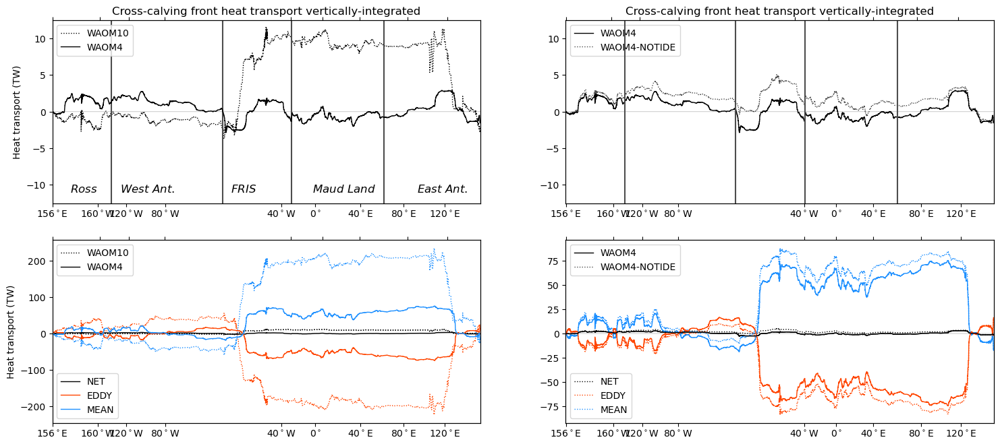

In [116]:
# same as above but just for Calving Front:
fig = plt.figure(figsize=(18,12))
#  ============ 1st line:

# 1) 
ax4 = fig.add_subplot(3,2,1)
ax4.plot(dist_along_10km_CF[:],np.zeros(cumsum_mean_10km_CF[:].shape),'-', color=[.7,.7,.7], linewidth=0.5)
ax4.plot(dist_along_10km_CF[:],(cumsum_mean_10km_CF+cumsum_eddy_10km_CF),':k', label='WAOM10', linewidth=1.)
ax4.plot(dist_along_4km_CF[0],(cumsum_mean_4km_CF[0]+cumsum_eddy_4km_CF[0]),'-k',label='WAOM4', linewidth=1.) # plot just to add legend
ax4.legend(loc='upper left')

ax4.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax4.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax4.set_xlim(0, dist_along_10km_CF[-1])

ymin=-12.5
ymax=12.5
ax4.set_ylim(ymin,ymax)
ax4.text(dist_along_10km_CF[436].values-2.5,ymin+1.5,'$\it{Ross}$',fontsize=12, color='k')       
ax4.plot([dist_along_10km_CF[436].values,dist_along_10km_CF[436].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
ax4.text(dist_along_10km_CF[436].values+.5,ymin+1.5,'$\it{West\ Ant.}$',fontsize=12, color='k')             
ax4.plot([dist_along_10km_CF[1293].values,dist_along_10km_CF[1293].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
ax4.text(dist_along_10km_CF[1293].values+.5,ymin+1.5,'$\it{FRIS}$',fontsize=12, color='k')        
ax4.plot([dist_along_10km_CF[1826].values,dist_along_10km_CF[1826].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
ax4.text(dist_along_10km_CF[1826].values+1.25,ymin+1.5,'$\it{Maud\ Land}$',fontsize=12, color='k')        
ax4.plot([dist_along_10km_CF[2540].values,dist_along_10km_CF[2540].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
ax4.text(dist_along_10km_CF[2540].values+2,ymin+1.5,'$\it{East\ Ant.}$',fontsize=12, color='k')   
ax4.set_title('Cross-calving front heat transport vertically-integrated')
ax4.set_ylabel('Heat transport (TW)')

ax4b = ax4.twiny()
ax4b.plot(dist_along_4km_CF[:],(cumsum_mean_4km_CF+cumsum_eddy_4km_CF),'-k',label='NET', linewidth=1.)
ax4b.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax4b.set_xticklabels((''))
ax4b.set_xlim(0, dist_along_4km_CF[-1])

# 2) 
ax5 = fig.add_subplot(3,2,2)
ax5.plot(dist_along_4km_CF[:],np.zeros(cumsum_mean_4km_CF[:].shape),'-', color=[.7,.7,.7], linewidth=0.5)
ax5.plot(dist_along_4km_CF[:],(cumsum_mean_4km_CF+cumsum_eddy_4km_CF),'-k',label='WAOM4', linewidth=1.) # plot just to add legend
ax5.plot(dist_along_4km_CF[:],(cumsum_mean_4kmNT_CF+cumsum_eddy_4kmNT_CF),':k', label='WAOM4-NOTIDE', linewidth=1.,alpha=0.7)
ax5.legend(loc='upper left')

ax5.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax5.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax5.set_xlim(0, dist_along_4km_CF[-1])
3
ax5b = ax5.twiny()
ax5b.plot(dist_along_10km_CF[0],(cumsum_mean_10km_CF[0]+cumsum_eddy_10km_CF[0]),'-k',label='NET', linewidth=1.)
ax5b.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax5b.set_xticklabels((''))
ax5b.set_xlim(0, dist_along_10km_CF[-1])

ymin=-12.5
ymax=12.5
ax5b.set_ylim(ymin,ymax)
ax5b.plot([dist_along_10km_CF[436].values,dist_along_10km_CF[436].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
ax5b.plot([dist_along_10km_CF[1293].values,dist_along_10km_CF[1293].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
ax5b.plot([dist_along_10km_CF[1826].values,dist_along_10km_CF[1826].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
ax5b.plot([dist_along_10km_CF[2540].values,dist_along_10km_CF[2540].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
ax5b.set_title('Cross-calving front heat transport vertically-integrated')
ax5b.set_ylabel('Heat transport (TW)')

## ============= 4th line

# 1)
ax8 = fig.add_subplot(3,2,3)
ax8.plot(dist_along_10km_CF[:],np.zeros(cumsum_mean_10km_CF[:].shape),'-', color=[.7,.7,.7], linewidth=0.5)
ax8.plot(dist_along_10km_CF[:],cumsum_mean_10km_CF+cumsum_eddy_10km_CF,':k', label='WAOM10', linewidth=1)
ax8.plot(dist_along_4km_CF[0],cumsum_mean_4km_CF[0]+cumsum_eddy_4km_CF[0],'-k', label='WAOM4', linewidth=1)
ax8.legend(loc='upper left')
ax8.plot(dist_along_10km_CF[:],cumsum_mean_10km_CF+cumsum_eddy_10km_CF,':k',label='NET', linewidth=1.)
ax8.plot(dist_along_10km_CF[:],cumsum_eddy_10km_CF,':',label='EDDY',color='orangered',linewidth=1.)
ax8.plot(dist_along_10km_CF[:],cumsum_mean_10km_CF,':',label='MEAN',color='dodgerblue',linewidth=1.)

ax8.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax8.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax8.set_xlim(0, dist_along_10km_CF[-1])

ax8b = ax8.twiny()
ax8b.plot(dist_along_4km_CF[:],cumsum_mean_4km_CF+cumsum_eddy_4km_CF,'-k',label='NET', linewidth=1.)
ax8b.plot(dist_along_4km_CF[:],cumsum_eddy_4km_CF,'-',label='EDDY',color='orangered',linewidth=1.)
ax8b.plot(dist_along_4km_CF[:],cumsum_mean_4km_CF,'',label='MEAN',color='dodgerblue',linewidth=1.)
ax8b.legend(loc='lower left')
ax8b.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax8b.set_xticklabels((''))
ax8b.set_xlim(0, dist_along_4km_CF[-1])

# ax8.set_title('Cross-CF heat transport vertically-integrated (TW)')
ax8.set_ylabel('Heat transport (TW)')

# 2)
ax9 = fig.add_subplot(3,2,4)
ax9.plot(dist_along_4km_CF[:],np.zeros(cumsum_mean_4km_CF[:].shape),'-', color=[.7,.7,.7], linewidth=0.5)
ax9.plot(dist_along_4km_CF,cumsum_mean_4km_CF+cumsum_eddy_4km_CF,'-k',label='WAOM4', linewidth=1.) # plot just to add legend
ax9.plot(dist_along_4km_CF[0],cumsum_mean_4kmNT_CF[0]+cumsum_eddy_4kmNT_CF[0],':k', label='WAOM4-NOTIDE', linewidth=1,alpha=0.7)
ax9.legend(loc='upper left')


ax9b = ax9.twiny()
ax9b.plot(dist_along_4km_CF[:],cumsum_mean_4kmNT_CF+cumsum_eddy_4kmNT_CF,':k',label='NET', linewidth=1.)
ax9b.plot(dist_along_4km_CF[:],cumsum_eddy_4kmNT_CF,':',label='EDDY',color='orangered',linewidth=1.)
ax9b.plot(dist_along_4km_CF[:],cumsum_mean_4kmNT_CF,':',label='MEAN',color='dodgerblue',linewidth=1.)
ax9b.legend(loc='lower left')
ax9b.plot(dist_along_4km_CF[:],cumsum_mean_4km_CF,'-',color='dodgerblue', linewidth=1)
ax9b.plot(dist_along_4km_CF[:],cumsum_eddy_4km_CF,'-',color='orangered',linewidth=1)
ax9b.plot(dist_along_4km_CF[:],cumsum_mean_4km_CF+cumsum_eddy_4km_CF,'-k', linewidth=1)
ax9.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax9.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax9.set_xlim(0, dist_along_4km_CF[-1])
ax9b.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax9b.set_xticklabels((''))
ax9b.set_xlim(0, dist_along_4km_CF[-1])

ax9b.set_ylabel('Heat transport (TW)')

plt.savefig(fig_path + 'Figure_PosterCOSIMA_OHC_HT_crossCF_v4.png', bbox_inches='tight', dpi=300)


In [ ]:
# testing calc of average cross-1500m HT:

# print(np.nanmean(np.nanmean(np.sum(Eddy_transp_10km_CFp[], axis=1),axis=0),axis=-1)*1e-12)


In [49]:
print(heat_transport_10km.shape, Mean_transp_10km.shape)

(365, 31, 2690) (31, 2690)


WAOM10 - 1500m
Ross
total (TW) = 9.84747063205398
mean (TW) = 281.4582194880018
eddy (TW) = -271.6107488559466
AMUDS
total (TW) = 11.265614203542613
mean (TW) = 157.12359857163912
eddy (TW) = -145.85798436809634
BELLS
total (TW) = -15.34169189047178
mean (TW) = -201.2836072983199
eddy (TW) = 185.94191540784786
EAP
total (TW) = -25.796579179578487
mean (TW) = -200.10691059480158
eddy (TW) = 174.31033141522295
FRIS
total (TW) = 3.8583375282978487
mean (TW) = 58.7375844844146
eddy (TW) = -54.87924695611656
MAU
total (TW) = -25.124905514053726
mean (TW) = -539.3232971476758
eddy (TW) = 514.1983916336212
EANT1
total (TW) = 29.414005264510653
mean (TW) = 297.17489761371127
eddy (TW) = -267.76089234920096
EANT2
total (TW) = 10.072260294396823
mean (TW) = 74.51995018322009
eddy (TW) = -64.44768988882383


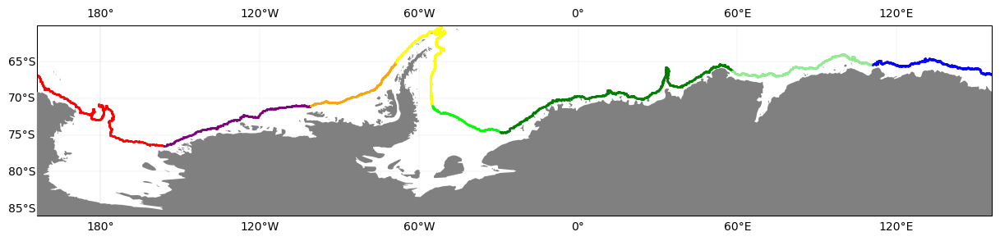

In [72]:
#WAOM10-1500M
#ROSS: 30:390
#AMUDS: 391:650
#BELLS: 651:950
#FRIS: 951:1380
#MAUD: 1381:2000
#EANT: 2001:2689

fig = plt.figure(figsize=(15,8))
ax1 = fig.add_subplot(1,1,1, projection=proj)

plt.scatter(lon_along_10km,lat_along_10km, s=.8, alpha=0.2, color='k',label='Calving front', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[0:390],lat_along_10km[0:390], s=1, alpha=1, color='red',label='ROSS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[391:650],lat_along_10km[391:650], s=1, alpha=1, color='purple',label='AMUDS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[651:850],lat_along_10km[651:850], s=1, alpha=1, color='orange',label='BELLS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[851:1240],lat_along_10km[851:1240], s=1, alpha=1, color='yellow',label='EAP', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[1241:1360],lat_along_10km[1241:1360], s=1, alpha=1, color='lime',label='FRIS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[1361:2000],lat_along_10km[1361:2000], s=1, alpha=1, color='green',label='MAUD', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[2001:2360],lat_along_10km[2001:2360], s=1, alpha=1, color='lightgreen',label='PRY-SHA', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[2361:2689],lat_along_10km[2361:2689], s=1, alpha=1, color='blue',label='TOT-MER', transform=ccrs.PlateCarree());
ax1.gridlines(draw_labels=True,linewidth=.1)
ax1.add_feature(cfeature.LAND, zorder=3, facecolor='gray') # , edgecolor='white', 
ax1.set_extent([-180-24, 155, -86, -60.], crs=ccrs.PlateCarree())

x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .2
ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)


print('WAOM10 - 1500m')
Lmin=0
Lmax=390
print('Ross')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=391
Lmax=650
print('AMUDS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=651
Lmax=850
print('BELLS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)


Lmin=851
Lmax=1240
print('EAP')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=1241
Lmax=1360
print('FRIS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=1361
Lmax=2000
print('MAU')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=2001
Lmax=2360
print('EANT1')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=2360
Lmax=2689
print('EANT2')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)


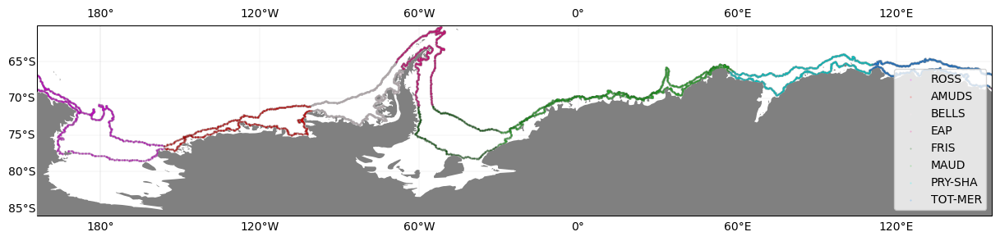

In [43]:
#WAOM10-1500M
#ROSS: 30:390
#AMUDS: 391:650
#BELLS: 651:950
#FRIS: 951:1380
#MAUD: 1381:2000
#EANT: 2001:2689

fig = plt.figure(figsize=(15,8))
ax1 = fig.add_subplot(1,1,1, projection=proj)
plt.scatter(lon_along_10km,lat_along_10km, s=.8, alpha=0.2, color='k', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[0:390],lat_along_10km[0:390], s=.2, alpha=.3, color='magenta',label='ROSS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[391:650],lat_along_10km[391:650], s=.2, alpha=.3, color='red',label='AMUDS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[651:850],lat_along_10km[651:850], s=.2, alpha=.3, color='lavenderblush',label='BELLS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[851:1240],lat_along_10km[851:1240], s=.2, alpha=.3, color='deeppink',label='EAP', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[1241:1360],lat_along_10km[1241:1360], s=.2, alpha=.3, color='darkgreen',label='FRIS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[1361:2000],lat_along_10km[1361:2000], s=.2, alpha=.3, color='limegreen',label='MAUD', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[2001:2360],lat_along_10km[2001:2360], s=.2, alpha=.3, color='aqua',label='PRY-SHA', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km[2361:2689],lat_along_10km[2361:2689], s=.2, alpha=.3, color='dodgerblue',label='TOT-MER', transform=ccrs.PlateCarree());
# - calving front selection:
plt.scatter(lon_along_10km_CF,lat_along_10km_CF, s=.8, alpha=0.2, color='k', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF[5:350],lat_along_10km_CF[5:350], s=.2, alpha=.3, color='magenta', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF[351:730],lat_along_10km_CF[351:730], s=.2, alpha=.3, color='red', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF[731:1220],lat_along_10km_CF[731:1220], s=.2, alpha=.3, color='lavenderblush', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF[1221:1600],lat_along_10km_CF[1221:1600], s=.2, alpha=.3, color='deeppink', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF[1601:1790],lat_along_10km_CF[1601:1790], s=.2, alpha=.3, color='darkgreen', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF[1791:2515],lat_along_10km_CF[1791:2515], s=.2, alpha=.3, color='limegreen', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF[2516:2940],lat_along_10km_CF[2516:2940], s=.2, alpha=.3, color='aqua', transform=ccrs.PlateCarree());
plt.scatter(lon_along_10km_CF[2941:3297],lat_along_10km_CF[2941:3297], s=.2, alpha=.3, color='dodgerblue', transform=ccrs.PlateCarree());

ax1.gridlines(draw_labels=True,linewidth=.1)
ax1.add_feature(cfeature.LAND, zorder=3, facecolor='gray') # , edgecolor='white', 
ax1.set_extent([-180-24, 155, -86, -60.], crs=ccrs.PlateCarree())

x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .2
ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

plt.legend(loc='lower right')




In [73]:
# plt.scatter(lon_along_10km_CF[5:350],lat_along_10km_CF[5:350], s=1, alpha=1, color='red', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[351:730],lat_along_10km_CF[351:730], s=1, alpha=1, color='purple', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[731:1220],lat_along_10km_CF[731:1220], s=1, alpha=1, color='orange', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[1221:1600],lat_along_10km_CF[1221:1600], s=1, alpha=1, color='yellow', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[1601:1790],lat_along_10km_CF[1601:1790], s=1, alpha=1, color='lime', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[1791:2515],lat_along_10km_CF[1791:2515], s=1, alpha=1, color='green', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[2516:2940],lat_along_10km_CF[2516:2940], s=1, alpha=1, color='lightgreen', transform=ccrs.PlateCarree());
# plt.scatter(lon_along_10km_CF[2941:3297],lat_along_10km_CF[2941:3297], s=1, alpha=1, color='blue', transform=ccrs.PlateCarree());


print('WAOM10 - Calving Front')
Lmin=5
Lmax=350
print('Ross')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=351
Lmax=730
print('AMUDS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=731
Lmax=1220
print('BELLS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=1221
Lmax=1600
print('EAP')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=1601
Lmax=1790
print('FRIS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=1381
Lmax=2515
print('MAU')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=2516
Lmax=2940
print('EANT1')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=2941
Lmax=3297
print('EANT2')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_10km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_10km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)



WAOM10 - Calving Front
Ross
total (TW) = -2.124240004190686
mean (TW) = -38.51425581206722
eddy (TW) = 36.39001580787643
AMUDS
total (TW) = 0.8881909818682937
mean (TW) = 0.20904028711209374
eddy (TW) = 0.6791506947561523
BELLS
total (TW) = -0.1125863094390465
mean (TW) = -4.24737645790852
eddy (TW) = 4.134790148469553
EAP
total (TW) = 8.667503330565374
mean (TW) = 184.9263319297186
eddy (TW) = -176.25882859915293
FRIS
total (TW) = 3.2965903414579216
mean (TW) = 54.791200239619684
eddy (TW) = -51.49460989816197
MAU
total (TW) = 11.823910272636672
mean (TW) = 252.9643661234343
eddy (TW) = -241.1404558507977
EANT1
total (TW) = 1.7845350562950217
mean (TW) = 21.84725618880261
eddy (TW) = -20.06272113250777
EANT2
total (TW) = -12.885389225831776
mean (TW) = -243.52084870976103
eddy (TW) = 230.63545948392945


In [59]:
heat_transport_10km_CF.shape

(365, 31, 3298)

WAOM4 - 1500m
Ross
total (TW) = 23.257557296979016
mean (TW) = 468.5994474078267
eddy (TW) = -445.34189011084743
AMUDS
total (TW) = 15.466202737937751
mean (TW) = 187.03476082650087
eddy (TW) = -171.56855808856312
BELLS
total (TW) = 2.668832689113578
mean (TW) = 27.444203625913154
eddy (TW) = -24.775370936799696
EAP
total (TW) = -19.222579952206615
mean (TW) = -64.43196553252409
eddy (TW) = 45.2093855803175
FRIS
total (TW) = 1.4223295502081499
mean (TW) = 10.022017119192306
eddy (TW) = -8.599687568984072
MAU
total (TW) = -32.675693253175474
mean (TW) = -593.8874561849992
eddy (TW) = 561.2117629318243
EANT1
total (TW) = -4.789047797452278
mean (TW) = -97.32012212331884
eddy (TW) = 92.53107432586678
EANT2
total (TW) = 9.613494591953945
mean (TW) = 10.12167817056582
eddy (TW) = -0.5081835786123594


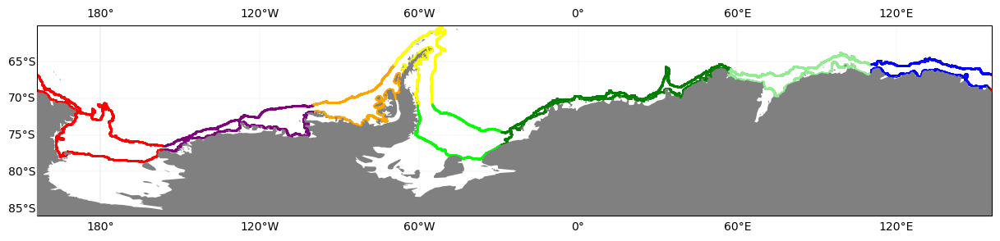

In [79]:
## WAOM4-1500M
#ROSS: 0:1135
#AMUDS: 1136:1800
#BELLS: 1801:2550
#EAP: 2551:3095
#FRIS: 3095:3690
#MAUD: 3691:5240
#EANT1: 5241:6210
#EANT2: 6211:7055

fig = plt.figure(figsize=(15,8))
ax1 = fig.add_subplot(1,1,1, projection=proj)

plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='k',label='Calving front', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km[0:1142],lat_along_4km[0:1142], s=1, alpha=1, color='red',label='ROSS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km[1143:1820],lat_along_4km[1143:1820], s=1, alpha=1, color='purple',label='AMUDS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km[1821:2290],lat_along_4km[1821:2290], s=1, alpha=1, color='orange',label='BELLS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km[2291:3330],lat_along_4km[2291:3330], s=1, alpha=1, color='yellow',label='EAP', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km[3331:3645],lat_along_4km[3331:3645], s=1, alpha=1, color='lime',label='FRIS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km[3646:5240],lat_along_4km[3646:5240], s=1, alpha=1, color='green',label='MAUD', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km[5241:6210],lat_along_4km[5241:6210], s=1, alpha=1, color='lightgreen',label='PRY-SHA', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km[6211:7055],lat_along_4km[6211:7055], s=1, alpha=1, color='blue',label='TOT-MER', transform=ccrs.PlateCarree());

plt.scatter(lon_along_4km_CF,lat_along_4km_CF, s=.8, alpha=0.2, color='k',label='Calving front', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km_CF[30:1020],lat_along_4km_CF[30:1020], s=1, alpha=1, color='red',label='ROSS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km_CF[1021:2020],lat_along_4km_CF[1021:2020], s=1, alpha=1, color='purple',label='AMUDS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km_CF[2021:3290],lat_along_4km_CF[2021:3290], s=1, alpha=1, color='orange',label='BELLS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km_CF[3291:4600],lat_along_4km_CF[3291:4600], s=1, alpha=1, color='yellow',label='EAP', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km_CF[4601:5120],lat_along_4km_CF[4601:5120], s=1, alpha=1, color='lime',label='FRIS', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km_CF[5121:6960],lat_along_4km_CF[5121:6960], s=1, alpha=1, color='green',label='MAUD', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km_CF[6961:8150],lat_along_4km_CF[6961:8150], s=1, alpha=1, color='lightgreen',label='PRY-SHA', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km_CF[8151:9017],lat_along_4km_CF[8151:9017], s=1, alpha=1, color='blue',label='TOT-MER', transform=ccrs.PlateCarree());

ax1.gridlines(draw_labels=True,linewidth=.1)
ax1.add_feature(cfeature.LAND, zorder=3, facecolor='gray') # , edgecolor='white', 
ax1.set_extent([-180-24, 155, -86, -60.], crs=ccrs.PlateCarree())

x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .2
ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

print('WAOM4 - 1500m')

Lmin=0
Lmax=1142
print('Ross')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)


Lmin=1143
Lmax=1820
print('AMUDS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)


Lmin=1821
Lmax=2290
print('BELLS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)


Lmin=2291
Lmax=3330
print('EAP')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)


Lmin=3331
Lmax=3645
print('FRIS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)


Lmin=3646
Lmax=5240
print('MAU')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=5241
Lmax=6210
print('EANT1')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=6211
Lmax=-1
print('EANT2')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)


In [75]:
print('WAOM4 - Calving front')

Lmin=30
Lmax=1020
print('Ross')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=1021
Lmax=2020
print('AMUDS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=2021
Lmax=3290
print('BELLS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=3291
Lmax=4600
print('EAP')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=4601
Lmax=5120
print('FRIS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=5121
Lmax=6960
print('MAU')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=6961
Lmax=8150
print('EANT1')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=8151
Lmax=9017
print('EANT2')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4km_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4km_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)



WAOM4 - Calving front
Ross
total (TW) = 0.8967523642296527
mean (TW) = 2.854095677488324
eddy (TW) = -1.9573433132583418
AMUDS
total (TW) = 0.5569344759238012
mean (TW) = 2.241236904594584
eddy (TW) = -1.684302428670789
BELLS
total (TW) = -1.2122508789945168
mean (TW) = -16.75304785310258
eddy (TW) = 15.540796974108067
EAP
total (TW) = 1.3474310038145279
mean (TW) = 82.83140224592867
eddy (TW) = -81.48397124211422
FRIS
total (TW) = -1.9360371575523134
mean (TW) = -16.250292660017557
eddy (TW) = 14.314255502465219
MAU
total (TW) = -0.3189428568713158
mean (TW) = 7.788158402955082
eddy (TW) = -8.107101259826415
EANT1
total (TW) = 3.4023541065665888
mean (TW) = 8.462074121178432
eddy (TW) = -5.059720014611885
EANT2
total (TW) = -4.1650141291689655
mean (TW) = -85.6846611673125
eddy (TW) = 81.51964703814369


In [76]:
print('WAOM4-NOTIDE - 1500m')

Lmin=0
Lmax=1142
print('Ross')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=1143
Lmax=1820
print('AMUDS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=1821
Lmax=2290
print('BELLS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=2291
Lmax=3330
print('EAP')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=3331
Lmax=3645
print('FRIS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=3646
Lmax=5240
print('MAU')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=5241
Lmax=6210
print('EANT1')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=6211
Lmax=7055
print('EANT2')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)


WAOM4-NOTIDE - 1500m
Ross
total (TW) = 42.11590440541238
mean (TW) = 545.0675906424543
eddy (TW) = -502.9516862370421
AMUDS
total (TW) = 29.87947835213248
mean (TW) = 327.004804294181
eddy (TW) = -297.12532594204856
BELLS
total (TW) = 2.9423180223305425
mean (TW) = -39.692550841739106
eddy (TW) = 42.6348688640699
EAP
total (TW) = -17.737908506513598
mean (TW) = -37.21232625038446
eddy (TW) = 19.47441774387142
FRIS
total (TW) = 0.43877927628607655
mean (TW) = 16.3540328663112
eddy (TW) = -15.915253590025156
MAU
total (TW) = -69.24600458612414
mean (TW) = -828.380584255298
eddy (TW) = 759.134579669174
EANT1
total (TW) = -1.756739641360082
mean (TW) = -28.332127437625672
eddy (TW) = 26.575387796265954
EANT2
total (TW) = 9.29853777206579
mean (TW) = -2.930134284572293
eddy (TW) = 12.228672056638786


In [77]:
print('WAOM4-NOTIDE - Calving front')

Lmin=30
Lmax=1020
print('Ross')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=1021
Lmax=2020
print('AMUDS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)


Lmin=2021
Lmax=3290
print('BELLS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)


Lmin=3291
Lmax=4600
print('EAP')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)


Lmin=4601
Lmax=5120
print('FRIS')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)


Lmin=5121
Lmax=6960
print('MAU')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)

Lmin=6961
Lmax=8150
print('EANT1')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)


Lmin=8151
Lmax=9017
print('EANT2')
print('total (TW) =',np.nansum(np.nanmean(np.sum(heat_transport_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)
print('mean (TW) =',np.nansum(np.sum(Mean_transp_4kmNT_CF[:,Lmin:Lmax],axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.sum(Eddy_transp_4kmNT_CF[:,:,Lmin:Lmax], axis=1),axis=0),axis=-1)*1e-12)



WAOM4-NOTIDE - Calving front
Ross
total (TW) = 1.5878297011129106
mean (TW) = 5.327624243350172
eddy (TW) = -3.7397945422371737
AMUDS
total (TW) = 1.070823050480192
mean (TW) = 3.0379792766103986
eddy (TW) = -1.9671562261302031
BELLS
total (TW) = -0.7827552331150538
mean (TW) = -12.666795291605377
eddy (TW) = 11.884040058490335
EAP
total (TW) = 2.387109372983616
mean (TW) = 89.94182320174471
eddy (TW) = -87.55471382876098
FRIS
total (TW) = -2.2436609871914697
mean (TW) = -17.33952938083095
eddy (TW) = 15.09586839363943
MAU
total (TW) = -1.057578219662653
mean (TW) = 3.818486828138707
eddy (TW) = -4.87606504780136
EANT1
total (TW) = 2.2545709997231183
mean (TW) = 6.597755659916645
eddy (TW) = -4.343184660193534
EANT2
total (TW) = -4.09640078383341
mean (TW) = -93.62958265260151
eddy (TW) = 89.53318186876812


## TO-DO for poster:

1 - find the limits between sectors; I need the point along contour for (a) WAOM10-1500m, (b) WAOM4-1500m, (c) WAOM10-CF, (d) WAOM4-CF.
2 - integrated the total, eddy and mean components (vint) for each sectors and put in a table

3 - TS-diagram 1500m x CF
4 - choose isopycnal intervals and integrated density-binned Cross-contour HT
                                                                                

In [38]:
# define dist and z coordinates for pcolormesh plot:
[dist_along_axis_10km, Zaxis_10km] = np.meshgrid(dist_along_10km, np.arange(0,31))
[dist_along_axis_4km, Zaxis_4km] = np.meshgrid(dist_along_4km, np.arange(0,31))


In [39]:
rho_grid2_01 = np.arange(36.2,37.4,0.025) # for sigma-2
print(rho_grid2[np.arange(32,34)])

[37.    37.025]


In [40]:
ll=np.arange(26,28)
print(rho_grid2_01[20])
print(rho_grid2_01[20:29])
print(rho_grid2_01[29:33])
print(rho_grid2_01[33:-1])

print(Mean_HT_10km_irho2.shape, Eddy_HT_10km_irho2.shape)

36.699999999999974
[36.7   36.725 36.75  36.775 36.8   36.825 36.85  36.875 36.9  ]
[36.925 36.95  36.975 37.   ]
[37.025 37.05  37.075 37.1   37.125 37.15  37.175 37.2   37.225 37.25
 37.275 37.3   37.325 37.35 ]
(48, 31, 2690) (365, 48, 31, 2690)


In [42]:
print(rho_grid2_01[20])
print(rho_grid2_01[20:29])
print(rho_grid2_01[29:33])
print(rho_grid2_01[33:-1])

36.699999999999974
[36.7   36.725 36.75  36.775 36.8   36.825 36.85  36.875 36.9  ]
[36.925 36.95  36.975 37.   ]
[37.025 37.05  37.075 37.1   37.125 37.15  37.175 37.2   37.225 37.25
 37.275 37.3   37.325 37.35 ]


In [106]:
# -b : deepskyblue
# -y : royalblue
# -g : blue
# -r : navy

Mean_HT_4km_irho2.shape

(48, 31, 7056)

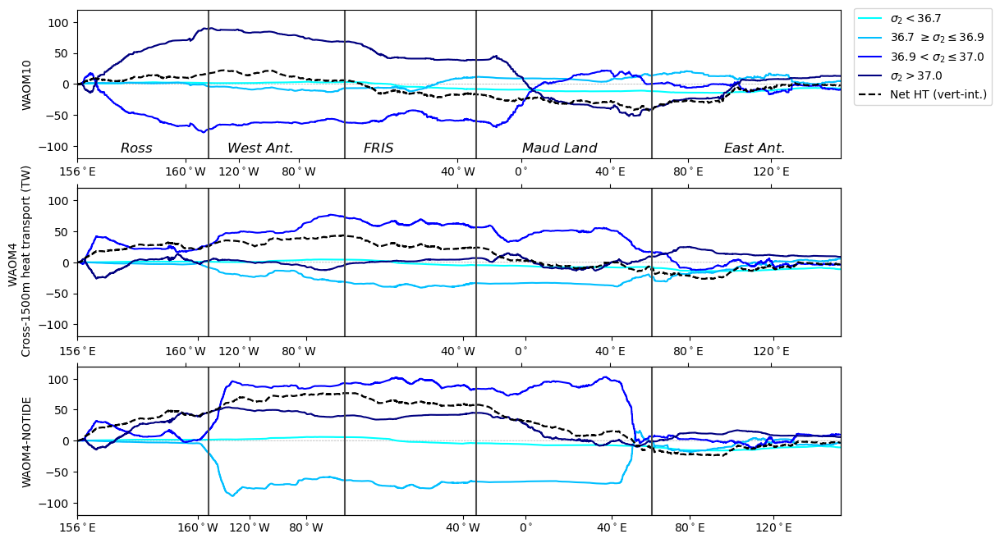

In [47]:
#### Plot vertical integrated but for density intervals:
fig = plt.figure(figsize=(12,8))
#  ============ 1st line:

# 1) 
ymin=-120
ymax=120

ax1 = fig.add_subplot(3,1,1)
ax1.plot(dist_along_10km[:],np.zeros((2690)),'--',color='darkgray',linewidth=0.5) 
ax1.plot(dist_along_10km[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_10km_irho2[:20,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,:20,:,:], axis=2),axis=1),axis=0)))*1e-12
                  ,'-',color='cyan', label='$\sigma_2 < $36.7') # all lighter than 36.7 = AASW
ax1.plot(dist_along_10km[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_10km_irho2[20:29,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,20:29,:,:], axis=2),axis=1),axis=0)))*1e-12
                  ,'-',color='deepskyblue', label='36.7 $\geq \sigma_2 \leq $36.9') # 36.7:36.875 = CDW
ax1.plot(dist_along_10km[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_10km_irho2[29:33,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,29:33,:,:], axis=2),axis=1),axis=0)))*1e-12
                 ,'-',color='blue', label='36.9 < $\sigma_2 \leq $37.0') # 36.925:37 = AABW
ax1.plot(dist_along_10km[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_10km_irho2[33:-1,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,33:-1,:,:], axis=2),axis=1),axis=0)))*1e-12
                 ,'-',color='navy', label='$\sigma_2 > $37.0') # >= 37.05 = DSW
ax1.plot(dist_along_10km[:],(cumsum_mean_10km+cumsum_eddy_10km),'--k', label='Net HT (vert-int.)', linewidth=1.6)

ax1.legend(bbox_to_anchor=(1.01, 1.05))
ax1.set_ylim(ymin,ymax)
ax1.set_ylabel('WAOM10')# \n Cross-1500m heat transport (TW)')
ax1.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km[-1])


# plot sub-sectors lines & names:
ax1.text(dist_along_10km[452].values-2.5,ymin+10,'$\it{Ross}$',fontsize=12, color='k')       
ax1.plot([dist_along_10km[452].values,dist_along_10km[452].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
ax1.text(dist_along_10km[452].values+.5,ymin+10,'$\it{West\ Ant.}$',fontsize=12, color='k')             
ax1.plot([dist_along_10km[918].values,dist_along_10km[918].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
ax1.text(dist_along_10km[918].values+.5,ymin+10,'$\it{FRIS}$',fontsize=12, color='k')        
ax1.plot([dist_along_10km[1383].values,dist_along_10km[1383].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
ax1.text(dist_along_10km[1383].values+1.25,ymin+10,'$\it{Maud\ Land}$',fontsize=12, color='k')        
ax1.plot([dist_along_10km[2012].values,dist_along_10km[2012].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
ax1.text(dist_along_10km[2012].values+2,ymin+10,'$\it{East\ Ant.}$',fontsize=12, color='k')   

ax2 = fig.add_subplot(3,1,2)
ax2.plot(dist_along_4km[:],np.zeros((7056)),'--',color='darkgray',linewidth=0.5)
ax2.plot(dist_along_4km[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[:20,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,:20,:,:], axis=2),axis=1),axis=0)))*1e-12
                  ,'-',color='cyan', label='WAOM4, AASW ($\sigma_2 < $36.7)') # all lighter than 36.7 = AASW
ax2.plot(dist_along_4km[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[20:29,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,20:29,:,:], axis=2),axis=1),axis=0)))*1e-12
                  ,'-',color='deepskyblue', label='WAOM4, CDW (36.7 <= $\sigma_2 <= $36.9)') # 36.7:36.875 = CDW
ax2.plot(dist_along_4km[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:33,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,29:33,:,:], axis=2),axis=1),axis=0)))*1e-12
                 ,'-',color='blue', label='WAOM4, DSW (36.9 < $\sigma_2 <= $37.)') # 36.925:37 = AABW
ax2.plot(dist_along_4km[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[33:-1,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,33:-1,:,:], axis=2),axis=1),axis=0)))*1e-12
                 ,'-',color='navy', label='WAOM4, HSSW ($\sigma_2 > $37.)') # >= 37.05 = DSW
ax2.plot(dist_along_4km[:],(cumsum_mean_4km+cumsum_eddy_4km),'--k', label='Net HT (vert-int.)', linewidth=1.6)

ax2.set_ylim(ymin,ymax)
ax2.set_ylabel('WAOM4 \n Cross-1500m heat transport (TW)')
ax2.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax2.set_xticklabels((''))#156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          #'40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_4km[-1])

ax2b = ax2.twiny()
ax2b.set_ylim(ymin,ymax)
ax2b.plot([dist_along_10km[452].values,dist_along_10km[452].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
ax2b.plot([dist_along_10km[918].values,dist_along_10km[918].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
ax2b.plot([dist_along_10km[1383].values,dist_along_10km[1383].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
ax2b.plot([dist_along_10km[2012].values,dist_along_10km[2012].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
ax2b.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax2b.set_xticklabels((''))#156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          #'40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2b.set_xlim(0, dist_along_10km[-1])


ax3 = fig.add_subplot(3,1,3)
ax3.plot(dist_along_4km[:],np.zeros((7056)),'--',color='darkgray',linewidth=0.5)
ax3.plot(dist_along_4km[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[:20,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,:20,:,:], axis=2),axis=1),axis=0)))*1e-12
                  ,'-',color='cyan', label='WAOM4-NOTIDE, AASW ($\sigma_2 < $36.7)') # all lighter than 36.7 = AASW
ax3.plot(dist_along_4km[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[20:29,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,20:29,:,:], axis=2),axis=1),axis=0)))*1e-12
                  ,'-',color='deepskyblue', label='WAOM4-NOTIDE, CDW (36.7 <= $\sigma_2 <= $36.9)') # 36.7:36.875 = CDW
ax3.plot(dist_along_4km[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,29:33,:,:], axis=2),axis=1),axis=0)))*1e-12
                 ,'-',color='blue', label='WAOM4-NOTIDE, DSW (36.9 < $\sigma_2 <= $37.)') # 36.925:37 = AABW
ax3.plot(dist_along_4km[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[33:-1,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,33:-1,:,:], axis=2),axis=1),axis=0)))*1e-12
                 ,'-',color='navy', label='WAOM4-NOTIDE, HSSW ($\sigma_2 > $37.)') # >= 37.05 = DSW
ax3.plot(dist_along_4km[:],(cumsum_mean_4kmNT+cumsum_eddy_4kmNT),'--k', label='Net HT (vert-int.)', linewidth=1.6)

ax3.set_ylim(ymin,ymax)
ax3.set_ylabel('WAOM4-NOTIDE')# \n Cross-1500m heat transport (TW)')
ax3.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax3.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3.set_xlim(0, dist_along_4km[-1])

ax3b = ax3.twiny()
ax3b.set_ylim(ymin,ymax)
ax3b.plot([dist_along_10km[452].values,dist_along_10km[452].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
ax3b.plot([dist_along_10km[918].values,dist_along_10km[918].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
ax3b.plot([dist_along_10km[1383].values,dist_along_10km[1383].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
ax3b.plot([dist_along_10km[2012].values,dist_along_10km[2012].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
ax3b.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax3b.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3b.set_xlim(0, dist_along_10km[-1])

plt.savefig(fig_path + 'waom10x4x4NT_Cross-1500m_NetHT_Dens-binned.png', bbox_inches='tight', dpi=300)
plt.show()


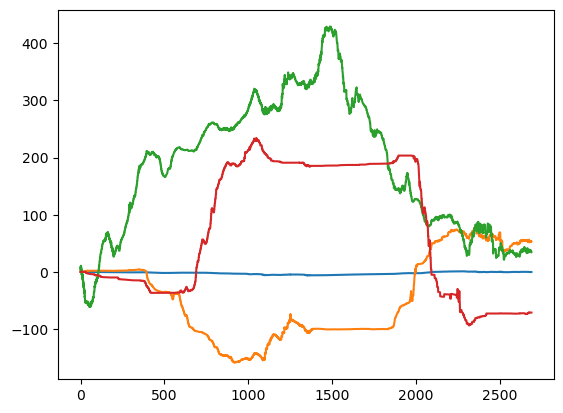

In [53]:
plt.plot(np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,:20,:,:], axis=2),axis=1),axis=0))*1e-12, label='AASW') # all lighter than 36.7 = AASW
plt.plot(np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,21:29,:,:], axis=2),axis=1),axis=0))*1e-12, label='CDW') # 36.7:36.875 = CDW
plt.plot(np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,30:33,:,:], axis=2),axis=1),axis=0))*1e-12, label='AABW') # 36.925:37 = AABW
plt.plot(np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,34:-1,:,:], axis=2),axis=1),axis=0))*1e-12, label='DSW') # >= 37.05 = DSW


In [123]:
Mean_HT_4km_CF_irho2.shape

(48, 31, 9018)

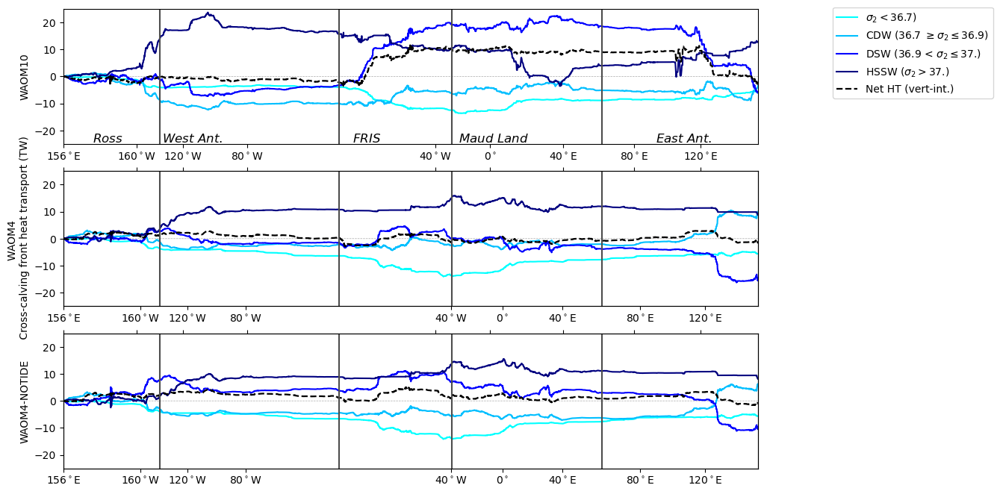

In [48]:
#### Plot vertical integrated but for density intervals:
fig = plt.figure(figsize=(12,8))
#  ============ 1st line:

# 1) 
ymin=-25
ymax=25

ax1 = fig.add_subplot(3,1,1)
ax1.plot(dist_along_10km_CF[:],np.zeros((3298)),'--',color='darkgray',linewidth=0.5) 
ax1.plot(dist_along_10km_CF[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_10km_CF_irho2[:20,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_CF_irho2[:,:20,:,:], axis=2),axis=1),axis=0)))*1e-12
                  ,'-',color='cyan', label='$\sigma_2 < $36.7)') # all lighter than 36.7 = AASW
ax1.plot(dist_along_10km_CF[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_10km_CF_irho2[20:29,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_CF_irho2[:,20:29,:,:], axis=2),axis=1),axis=0)))*1e-12
                  ,'-',color='deepskyblue', label='CDW (36.7 $\geq \sigma_2 \leq $36.9)') # 36.7:36.875 = CDW
ax1.plot(dist_along_10km_CF[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_10km_CF_irho2[29:33,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_CF_irho2[:,29:33,:,:], axis=2),axis=1),axis=0)))*1e-12
                 ,'-',color='blue', label='DSW (36.9 < $\sigma_2 \leq $37.)') # 36.925:37 = AABW
ax1.plot(dist_along_10km_CF[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_10km_CF_irho2[33:-1,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_CF_irho2[:,33:-1,:,:], axis=2),axis=1),axis=0)))*1e-12
                 ,'-',color='navy', label='HSSW ($\sigma_2 > $37.)') # >= 37.05 = DSW
ax1.plot(dist_along_10km_CF[:],(cumsum_mean_10km_CF+cumsum_eddy_10km_CF),'--k', label='Net HT (vert-int.)', linewidth=1.6)

# plt.legend(loc='lower right')
ax1.legend(bbox_to_anchor=(1.1, 1.05))
ax1.set_ylim(ymin,ymax)
ax1.set_ylabel('WAOM10')# \n Cross-calving front heat transport (TW)')
ax1.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km_CF[-1])
# plot sub-sections lines & names:
ax1.text(dist_along_10km_CF[436].values-2.5,ymin+.5,'$\it{Ross}$',fontsize=12, color='k')       
ax1.plot([dist_along_10km_CF[436].values,dist_along_10km_CF[436].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
ax1.text(dist_along_10km_CF[436].values+.1,ymin+.5,'$\it{West\ Ant.}$',fontsize=12, color='k')             
ax1.plot([dist_along_10km_CF[1293].values,dist_along_10km_CF[1293].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
ax1.text(dist_along_10km_CF[1293].values+.5,ymin+.5,'$\it{FRIS}$',fontsize=12, color='k')        
ax1.plot([dist_along_10km_CF[1826].values,dist_along_10km_CF[1826].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
ax1.text(dist_along_10km_CF[1826].values+.25,ymin+.5,'$\it{Maud\ Land}$',fontsize=12, color='k')        
ax1.plot([dist_along_10km_CF[2540].values,dist_along_10km_CF[2540].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
ax1.text(dist_along_10km_CF[2540].values+2,ymin+.5,'$\it{East\ Ant.}$',fontsize=12, color='k')   

ax2 = fig.add_subplot(3,1,2)
ax2.plot(dist_along_4km_CF[:],np.zeros((9018)),'--',color='darkgray',linewidth=0.5) 
ax2.plot(dist_along_4km_CF[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4km_CF_irho2[:20,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_CF_irho2[:,:20,:,:], axis=2),axis=1),axis=0)))*1e-12
                  ,'-',color='cyan', label='WAOM4, AASW ($\sigma_2 < $36.7)') # all lighter than 36.7 = AASW
ax2.plot(dist_along_4km_CF[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4km_CF_irho2[20:29,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_CF_irho2[:,20:29,:,:], axis=2),axis=1),axis=0)))*1e-12
                  ,'-',color='deepskyblue', label='WAOM4, CDW (36.7 <= $\sigma_2 <= $36.9)') # 36.7:36.875 = CDW
ax2.plot(dist_along_4km_CF[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4km_CF_irho2[29:33,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_CF_irho2[:,29:33,:,:], axis=2),axis=1),axis=0)))*1e-12
                 ,'-',color='blue', label='WAOM4, DSW (36.9 < $\sigma_2 <= $37.)') # 36.925:37 = AABW
ax2.plot(dist_along_4km_CF[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4km_CF_irho2[33:-1,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_CF_irho2[:,33:-1,:,:], axis=2),axis=1),axis=0)))*1e-12
                 ,'-',color='navy', label='WAOM4, HSSW ($\sigma_2 > $37.)') # >= 37.05 = DSW
ax2.plot(dist_along_4km_CF[:],(cumsum_mean_4km_CF+cumsum_eddy_4km_CF),'--k', label='Net HT (vert-int.)', linewidth=1.6)

ax2.set_ylabel('WAOM4 \n Cross-calving front heat transport (TW)')
ax2.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax2.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_4km_CF[-1])

ax2b = ax2.twiny()
ax2b.set_ylim(ymin,ymax)
ax2b.plot([dist_along_10km_CF[436].values,dist_along_10km_CF[436].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
ax2b.plot([dist_along_10km_CF[1293].values,dist_along_10km_CF[1293].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
ax2b.plot([dist_along_10km_CF[1826].values,dist_along_10km_CF[1826].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
ax2b.plot([dist_along_10km_CF[2540].values,dist_along_10km_CF[2540].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
ax2b.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax2b.set_xticklabels((''))#156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          #'40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2b.set_xlim(0, dist_along_10km_CF[-1])

ax3 = fig.add_subplot(3,1,3)
ax3.plot(dist_along_4km_CF[:],np.zeros((9018)),'--',color='darkgray',linewidth=0.5) 
ax3.plot(dist_along_4km_CF[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2[:20,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_CF_irho2[:,:20,:,:], axis=2),axis=1),axis=0)))*1e-12
                  ,'-',color='cyan', label='WAOM4-NOTIDE, AASW ($\sigma_2 < $36.7)') # all lighter than 36.7 = AASW
ax3.plot(dist_along_4km_CF[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2[20:29,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_CF_irho2[:,20:29,:,:], axis=2),axis=1),axis=0)))*1e-12
                  ,'-',color='deepskyblue', label='WAOM4-NOTIDE, CDW (36.7 <= $\sigma_2 <= $36.9)') # 36.7:36.875 = CDW
ax3.plot(dist_along_4km_CF[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2[29:33,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_CF_irho2[:,29:33,:,:], axis=2),axis=1),axis=0)))*1e-12
                 ,'-',color='blue', label='WAOM4-NOTIDE, DSW (36.9 < $\sigma_2 <= $37.)') # 36.925:37 = AABW
ax3.plot(dist_along_4km_CF[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2[33:-1,:,:], axis=1),axis=0))+
                  np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_CF_irho2[:,33:-1,:,:], axis=2),axis=1),axis=0)))*1e-12
                 ,'-',color='navy', label='WAOM4-NOTIDE, HSSW ($\sigma_2 > $37.)') # >= 37.05 = DSW
ax3.plot(dist_along_4km_CF[:],(cumsum_mean_4kmNT_CF+cumsum_eddy_4kmNT_CF),'--k', label='Net HT (vert-int.)', linewidth=1.6)

ax3.set_ylabel('WAOM4-NOTIDE')# \n Cross-calving front heat transport (TW)')
ax3.set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
ax3.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3.set_xlim(0, dist_along_4km_CF[-1])

ax3b = ax3.twiny()
ax3b.set_ylim(ymin,ymax)
ax3b.plot([dist_along_10km_CF[436].values,dist_along_10km_CF[436].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
ax3b.plot([dist_along_10km_CF[1293].values,dist_along_10km_CF[1293].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
ax3b.plot([dist_along_10km_CF[1826].values,dist_along_10km_CF[1826].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
ax3b.plot([dist_along_10km_CF[2540].values,dist_along_10km_CF[2540].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
ax3b.set_xticks(dist_along_10km_CF[distance_indices_10km_CF.astype(int)[:]])
ax3b.set_xticklabels((''))#156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          #'40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3b.set_xlim(0, dist_along_10km_CF[-1])

plt.savefig(fig_path + 'waom10x4x4NT_Cross-CF_NetHT_Dens-binned.png', bbox_inches='tight', dpi=300)
plt.show()

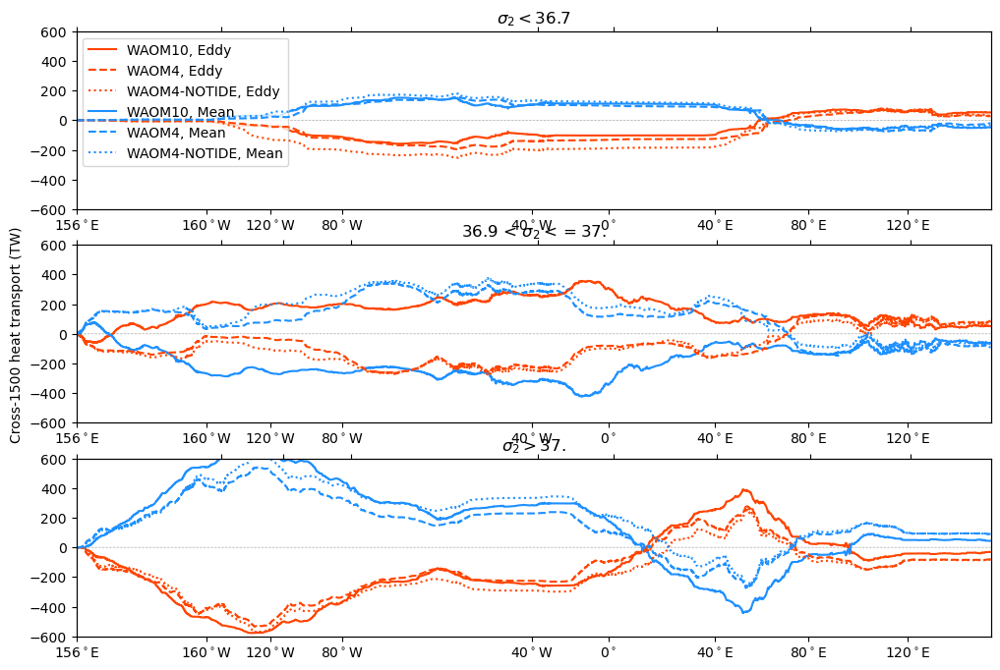

In [135]:
# 3 subplots rows: 1 per water mass interval. each with all eddy HT

#### Plot vertical integrated but for density intervals:
fig = plt.figure(figsize=(12,8))
#  ============ 1st line:

# 1) 
ymin=-600
ymax=600

ax1 = fig.add_subplot(3,1,1)
ax1.plot(dist_along_10km[:],np.zeros((2690)),'--',color='darkgray',linewidth=0.5) 
ax1.plot(dist_along_10km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,20:29,:,:], axis=2),axis=1),axis=0))*1e-12,'-',color='orangered', label='WAOM10, Eddy ')
ax1.plot(dist_along_4km[0],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,20:29,:,0], axis=2),axis=1),axis=0))*1e-12,'--',color='orangered', label='WAOM4, Eddy') # 36.7:36.875 = CDW
ax1.plot(dist_along_4km[0],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,20:29,:,0], axis=2),axis=1),axis=0))*1e-12,':',color='orangered', label='WAOM4-NOTIDE, Eddy') # 36.7:36.875 = CDW
ax1.plot(dist_along_10km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_10km_irho2[20:29,:,:], axis=1),axis=0),axis=-1)*1e-12,'-',color='dodgerblue', label='WAOM10, Mean ')
ax1.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[20:29,:,0], axis=1),axis=0),axis=-1)*1e-12,'--',color='dodgerblue', label='WAOM4, Mean') # 36.7:36.875 = CDW
ax1.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[20:29,:,0], axis=1),axis=0),axis=-1)*1e-12,':',color='dodgerblue', label='WAOM4-NOTIDE, Mean') # 36.7:36.875 = CDW

ax1.legend(loc='upper left')#bbox_to_anchor=(1.03, 1.05))
ax1.set_ylim(ymin,ymax)
# ax1.set_ylabel('Cross-1500 heat transport (TW)')
ax1.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km[-1])
ax1.set_title('$\sigma_2 < $36.7')

ax1b = ax1.twiny()
ax1b.plot(dist_along_4km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,20:29,:,:], axis=2),axis=1),axis=0))*1e-12,'--',color='orangered', label='WAOM4') # 36.7:36.875 = CDW
ax1b.plot(dist_along_4km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,20:29,:,:], axis=2),axis=1),axis=0))*1e-12,':',color='orangered', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax1b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[20:29,:,:], axis=1),axis=0),axis=-1)*1e-12,'--',color='dodgerblue', label='WAOM4') # 36.7:36.875 = CDW
ax1b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[20:29,:,:], axis=1),axis=0),axis=-1)*1e-12,':',color='dodgerblue', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax1b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax1b.set_xticklabels((''))#156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          #'40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1b.set_xlim(0, dist_along_4km[-1])

# plot sub-sectors lines & names:
# ax1.text(dist_along_10km[452].values-2.5,ymin+10,'$\it{Ross}$',fontsize=12, color='k')       
# ax1.plot([dist_along_10km[452].values,dist_along_10km[452].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
# ax1.text(dist_along_10km[452].values+.5,ymin+10,'$\it{West\ Ant.}$',fontsize=12, color='k')             
# ax1.plot([dist_along_10km[918].values,dist_along_10km[918].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
# ax1.text(dist_along_10km[918].values+.5,ymin+10,'$\it{FRIS}$',fontsize=12, color='k')        
# ax1.plot([dist_along_10km[1383].values,dist_along_10km[1383].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
# ax1.text(dist_along_10km[1383].values+1.25,ymin+10,'$\it{Maud\ Land}$',fontsize=12, color='k')        
# ax1.plot([dist_along_10km[2012].values,dist_along_10km[2012].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
# ax1.text(dist_along_10km[2012].values+2,ymin+10,'$\it{East\ Ant.}$',fontsize=12, color='k')   

ax2 = fig.add_subplot(3,1,2)
ax2.plot(dist_along_10km[:],np.zeros((2690)),'--',color='darkgray',linewidth=0.5) 
ax2.plot(dist_along_10km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,29:33,:,:], axis=2),axis=1),axis=0))*1e-12,'-',color='orangered', label='WAOM10, Eddy ')
ax2.plot(dist_along_4km[0],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,29:33,:,0], axis=2),axis=1),axis=0))*1e-12,'--',color='orangered', label='WAOM4, Eddy') # 36.7:36.875 = CDW
ax2.plot(dist_along_4km[0],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,29:33,:,0], axis=2),axis=1),axis=0))*1e-12,':',color='orangered', label='WAOM4-NOTIDE, Eddy') # 36.7:36.875 = CDW
ax2.plot(dist_along_10km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_10km_irho2[29:33,:,:], axis=1),axis=0),axis=-1)*1e-12,'-',color='dodgerblue', label='WAOM10, Mean ')
ax2.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:33,:,0], axis=1),axis=0),axis=-1)*1e-12,'--',color='dodgerblue', label='WAOM4, Mean') # 36.7:36.875 = CDW
ax2.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,0], axis=1),axis=0),axis=-1)*1e-12,':',color='dodgerblue', label='WAOM4-NOTIDE, Mean') # 36.7:36.875 = CDW
# ax2.legend(loc='upper left')#bbox_to_anchor=(1.03, 1.05))
ax2.set_ylim(ymin,ymax)
ax2.set_ylabel('Cross-1500 heat transport (TW)')
ax2.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax2.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_10km[-1])
ax2.set_title('36.9 < $\sigma_2 <= $37.')

ax2b = ax2.twiny()
ax2b.plot(dist_along_4km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,29:33,:,:], axis=2),axis=1),axis=0))*1e-12,'--',color='orangered', label='WAOM4') # 36.7:36.875 = CDW
ax2b.plot(dist_along_4km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,29:33,:,:], axis=2),axis=1),axis=0))*1e-12,':',color='orangered', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax2b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:33,:,:], axis=1),axis=0),axis=-1)*1e-12,'--',color='dodgerblue', label='WAOM4') # 36.7:36.875 = CDW
ax2b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,:], axis=1),axis=0),axis=-1)*1e-12,':',color='dodgerblue', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax2b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax2b.set_xticklabels((''))#156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          #'40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2b.set_xlim(0, dist_along_4km[-1])



ax3 = fig.add_subplot(3,1,3)
ax3.plot(dist_along_10km[:],np.zeros((2690)),'--',color='darkgray',linewidth=0.5) 
ax3.plot(dist_along_10km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,33:,:,:], axis=2),axis=1),axis=0))*1e-12,'-',color='orangered', label='WAOM10, Eddy ')
ax3.plot(dist_along_4km[0],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,33:,:,0], axis=2),axis=1),axis=0))*1e-12,'--',color='orangered', label='WAOM4, Eddy') # 36.7:36.875 = CDW
ax3.plot(dist_along_4km[0],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,33:,:,0], axis=2),axis=1),axis=0))*1e-12,':',color='orangered', label='WAOM4-NOTIDE, Eddy') # 36.7:36.875 = CDW
ax3.plot(dist_along_10km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_10km_irho2[33:,:,:], axis=1),axis=0),axis=-1)*1e-12,'-',color='dodgerblue', label='WAOM10, Mean ')
ax3.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[33:,:,0], axis=1),axis=0),axis=-1)*1e-12,'--',color='dodgerblue', label='WAOM4, Mean') # 36.7:36.875 = CDW
ax3.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[33:,:,0], axis=1),axis=0),axis=-1)*1e-12,':',color='dodgerblue', label='WAOM4-NOTIDE, Mean') # 36.7:36.875 = CDW
# ax3.legend(bbox_to_anchor=(1.03, 1.05))
ax3.set_ylim(ymin,ymax)
# ax3.set_ylabel('Cross-1500 heat transport (TW)')
ax3.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax3.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3.set_xlim(0, dist_along_10km[-1])
ax3.set_title('$\sigma_2 > $37.')

ax3b = ax3.twiny()
ax3b.plot(dist_along_4km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,33:,:,:], axis=2),axis=1),axis=0))*1e-12,'--',color='orangered', label='WAOM4') # 36.7:36.875 = CDW
ax3b.plot(dist_along_4km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,33:,:,:], axis=2),axis=1),axis=0))*1e-12,':',color='orangered', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax3b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[33:,:,:], axis=1),axis=0),axis=-1)*1e-12,'--',color='dodgerblue', label='WAOM4') # 36.7:36.875 = CDW
ax3b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[33:,:,:], axis=1),axis=0),axis=-1)*1e-12,':',color='dodgerblue', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax3b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax3b.set_xticklabels((''))
ax3b.set_xlim(0, dist_along_4km[-1])

plt.savefig(fig_path + 'waom10x4x4NT_Cross-1500m_EddyHT_Dens-binned.png', bbox_inches='tight', dpi=300)
plt.show()


In [130]:
Mean_HT_10km_irho2.shape

(48, 31, 2690)

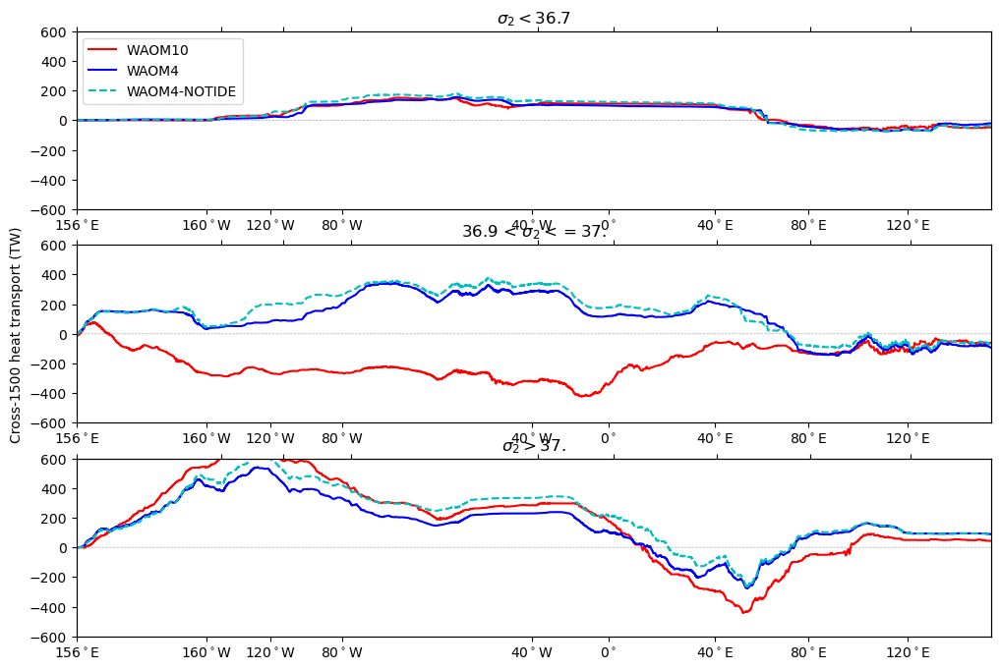

In [132]:
# 3 subplots rows: 1 per water mass interval. each with all eddy HT

#### Plot vertical integrated but for density intervals:
fig = plt.figure(figsize=(12,8))
#  ============ 1st line:

# 1) 
ymin=-600
ymax=600

ax1 = fig.add_subplot(3,1,1)
ax1.plot(dist_along_10km[:],np.zeros((2690)),'--',color='darkgray',linewidth=0.5) 
ax1.plot(dist_along_10km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_10km_irho2[20:29,:,:], axis=1),axis=0),axis=-1)*1e-12,'-',color='r', label='WAOM10 ')
ax1.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[20:29,:,0], axis=1),axis=0),axis=-1)*1e-12,'-',color='b', label='WAOM4') # 36.7:36.875 = CDW
ax1.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[20:29,:,0], axis=1),axis=0),axis=-1)*1e-12,'--',color='c', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax1.legend(loc='upper left')#bbox_to_anchor=(1.03, 1.05))
ax1.set_ylim(ymin,ymax)
# ax1.set_ylabel('Cross-1500 heat transport (TW)')
ax1.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km[-1])
ax1.set_title('$\sigma_2 < $36.7')

ax1b = ax1.twiny()
ax1b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[20:29,:,:], axis=1),axis=0),axis=-1)*1e-12,'-',color='b', label='WAOM4') # 36.7:36.875 = CDW
ax1b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[20:29,:,:], axis=1),axis=0),axis=-1)*1e-12,'--',color='c', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax1b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax1b.set_xticklabels((''))#156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          #'40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1b.set_xlim(0, dist_along_4km[-1])

# plot sub-sectors lines & names:
# ax1.text(dist_along_10km[452].values-2.5,ymin+10,'$\it{Ross}$',fontsize=12, color='k')       
# ax1.plot([dist_along_10km[452].values,dist_along_10km[452].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
# ax1.text(dist_along_10km[452].values+.5,ymin+10,'$\it{West\ Ant.}$',fontsize=12, color='k')             
# ax1.plot([dist_along_10km[918].values,dist_along_10km[918].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
# ax1.text(dist_along_10km[918].values+.5,ymin+10,'$\it{FRIS}$',fontsize=12, color='k')        
# ax1.plot([dist_along_10km[1383].values,dist_along_10km[1383].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
# ax1.text(dist_along_10km[1383].values+1.25,ymin+10,'$\it{Maud\ Land}$',fontsize=12, color='k')        
# ax1.plot([dist_along_10km[2012].values,dist_along_10km[2012].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
# ax1.text(dist_along_10km[2012].values+2,ymin+10,'$\it{East\ Ant.}$',fontsize=12, color='k')   

ax2 = fig.add_subplot(3,1,2)
ax2.plot(dist_along_10km[:],np.zeros((2690)),'--',color='darkgray',linewidth=0.5) 
ax2.plot(dist_along_10km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_10km_irho2[29:33,:,:], axis=1),axis=0),axis=-1)*1e-12,'-',color='r', label='WAOM10 ')
ax2.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:3,:,0], axis=1),axis=0),axis=-1)*1e-12,'-',color='b', label='WAOM4') # 36.7:36.875 = CDW
ax2.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,0], axis=1),axis=0),axis=-1)*1e-12,'--',color='c', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
# ax2.legend(loc='upper left')#bbox_to_anchor=(1.03, 1.05))
ax2.set_ylim(ymin,ymax)
ax2.set_ylabel('Cross-1500 heat transport (TW)')
ax2.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax2.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_10km[-1])
ax2.set_title('36.9 < $\sigma_2 <= $37.')

ax2b = ax2.twiny()
ax2b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:33,:,:], axis=1),axis=0),axis=-1)*1e-12,'-',color='b', label='WAOM4') # 36.7:36.875 = CDW
ax2b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,:], axis=1),axis=0),axis=-1)*1e-12,'--',color='c', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax2b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax2b.set_xticklabels((''))#156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          #'40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2b.set_xlim(0, dist_along_4km[-1])



ax3 = fig.add_subplot(3,1,3)
ax3.plot(dist_along_10km[:],np.zeros((2690)),'--',color='darkgray',linewidth=0.5) 
ax3.plot(dist_along_10km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_10km_irho2[33:,:,:], axis=1),axis=0),axis=-1)*1e-12,'-',color='r', label='WAOM10 ')
ax3.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[33:,:,0], axis=1),axis=0),axis=-1)*1e-12,'-',color='b', label='WAOM4') # 36.7:36.875 = CDW
ax3.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[33:,:,0], axis=1),axis=0),axis=-1)*1e-12,'--',color='c', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
# ax3.legend(bbox_to_anchor=(1.03, 1.05))
ax3.set_ylim(ymin,ymax)
# ax3.set_ylabel('Cross-1500 heat transport (TW)')
ax3.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax3.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3.set_xlim(0, dist_along_10km[-1])
ax3.set_title('$\sigma_2 > $37.')

ax3b = ax3.twiny()
ax3b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[33:,:,:], axis=1),axis=0),axis=-1)*1e-12,'-',color='b', label='WAOM4') # 36.7:36.875 = CDW
ax3b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[33:,:,:], axis=1),axis=0),axis=-1)*1e-12,'--',color='c', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax3b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax3b.set_xticklabels((''))
ax3b.set_xlim(0, dist_along_4km[-1])

plt.savefig(fig_path + 'waom10x4x4NT_Cross-1500m_MeanHT_Dens-binned.png', bbox_inches='tight', dpi=300)
plt.show()


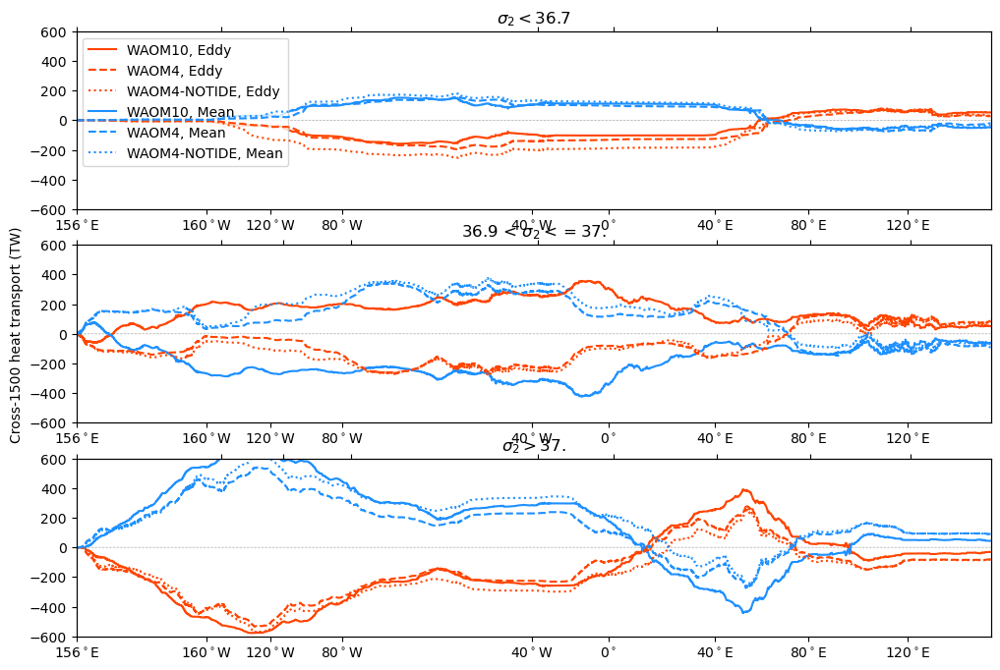

In [135]:
# 3 subplots rows: 1 per water mass interval. each with all eddy HT

#### Plot vertical integrated but for density intervals:
fig = plt.figure(figsize=(12,8))
#  ============ 1st line:

# 1) 
ymin=-600
ymax=600

ax1 = fig.add_subplot(3,1,1)
ax1.plot(dist_along_10km[:],np.zeros((2690)),'--',color='darkgray',linewidth=0.5) 
ax1.plot(dist_along_10km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,20:29,:,:], axis=2),axis=1),axis=0))*1e-12,'-',color='orangered', label='WAOM10, Eddy ')
ax1.plot(dist_along_4km[0],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,20:29,:,0], axis=2),axis=1),axis=0))*1e-12,'--',color='orangered', label='WAOM4, Eddy') # 36.7:36.875 = CDW
ax1.plot(dist_along_4km[0],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,20:29,:,0], axis=2),axis=1),axis=0))*1e-12,':',color='orangered', label='WAOM4-NOTIDE, Eddy') # 36.7:36.875 = CDW
ax1.plot(dist_along_10km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_10km_irho2[20:29,:,:], axis=1),axis=0),axis=-1)*1e-12,'-',color='dodgerblue', label='WAOM10, Mean ')
ax1.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[20:29,:,0], axis=1),axis=0),axis=-1)*1e-12,'--',color='dodgerblue', label='WAOM4, Mean') # 36.7:36.875 = CDW
ax1.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[20:29,:,0], axis=1),axis=0),axis=-1)*1e-12,':',color='dodgerblue', label='WAOM4-NOTIDE, Mean') # 36.7:36.875 = CDW

ax1.legend(loc='upper left')#bbox_to_anchor=(1.03, 1.05))
ax1.set_ylim(ymin,ymax)
# ax1.set_ylabel('Cross-1500 heat transport (TW)')
ax1.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax1.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1.set_xlim(0, dist_along_10km[-1])
ax1.set_title('$\sigma_2 < $36.7')

ax1b = ax1.twiny()
ax1b.plot(dist_along_4km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,20:29,:,:], axis=2),axis=1),axis=0))*1e-12,'--',color='orangered', label='WAOM4') # 36.7:36.875 = CDW
ax1b.plot(dist_along_4km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,20:29,:,:], axis=2),axis=1),axis=0))*1e-12,':',color='orangered', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax1b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[20:29,:,:], axis=1),axis=0),axis=-1)*1e-12,'--',color='dodgerblue', label='WAOM4') # 36.7:36.875 = CDW
ax1b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[20:29,:,:], axis=1),axis=0),axis=-1)*1e-12,':',color='dodgerblue', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax1b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax1b.set_xticklabels((''))#156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          #'40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax1b.set_xlim(0, dist_along_4km[-1])

# plot sub-sectors lines & names:
# ax1.text(dist_along_10km[452].values-2.5,ymin+10,'$\it{Ross}$',fontsize=12, color='k')       
# ax1.plot([dist_along_10km[452].values,dist_along_10km[452].values],[ymin,ymax],'-', color=[.3,.3,.3])     #140W    
# ax1.text(dist_along_10km[452].values+.5,ymin+10,'$\it{West\ Ant.}$',fontsize=12, color='k')             
# ax1.plot([dist_along_10km[918].values,dist_along_10km[918].values],[ymin,ymax],'-', color=[.3,.3,.3])   # 60W                         
# ax1.text(dist_along_10km[918].values+.5,ymin+10,'$\it{FRIS}$',fontsize=12, color='k')        
# ax1.plot([dist_along_10km[1383].values,dist_along_10km[1383].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 25W
# ax1.text(dist_along_10km[1383].values+1.25,ymin+10,'$\it{Maud\ Land}$',fontsize=12, color='k')        
# ax1.plot([dist_along_10km[2012].values,dist_along_10km[2012].values],[ymin,ymax],'-', color=[.3,.3,.3])     # 60E 
# ax1.text(dist_along_10km[2012].values+2,ymin+10,'$\it{East\ Ant.}$',fontsize=12, color='k')   

ax2 = fig.add_subplot(3,1,2)
ax2.plot(dist_along_10km[:],np.zeros((2690)),'--',color='darkgray',linewidth=0.5) 
ax2.plot(dist_along_10km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,29:33,:,:], axis=2),axis=1),axis=0))*1e-12,'-',color='orangered', label='WAOM10, Eddy ')
ax2.plot(dist_along_4km[0],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,29:33,:,0], axis=2),axis=1),axis=0))*1e-12,'--',color='orangered', label='WAOM4, Eddy') # 36.7:36.875 = CDW
ax2.plot(dist_along_4km[0],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,29:33,:,0], axis=2),axis=1),axis=0))*1e-12,':',color='orangered', label='WAOM4-NOTIDE, Eddy') # 36.7:36.875 = CDW
ax2.plot(dist_along_10km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_10km_irho2[29:33,:,:], axis=1),axis=0),axis=-1)*1e-12,'-',color='dodgerblue', label='WAOM10, Mean ')
ax2.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:33,:,0], axis=1),axis=0),axis=-1)*1e-12,'--',color='dodgerblue', label='WAOM4, Mean') # 36.7:36.875 = CDW
ax2.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,0], axis=1),axis=0),axis=-1)*1e-12,':',color='dodgerblue', label='WAOM4-NOTIDE, Mean') # 36.7:36.875 = CDW
# ax2.legend(loc='upper left')#bbox_to_anchor=(1.03, 1.05))
ax2.set_ylim(ymin,ymax)
ax2.set_ylabel('Cross-1500 heat transport (TW)')
ax2.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax2.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2.set_xlim(0, dist_along_10km[-1])
ax2.set_title('36.9 < $\sigma_2 <= $37.')

ax2b = ax2.twiny()
ax2b.plot(dist_along_4km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,29:33,:,:], axis=2),axis=1),axis=0))*1e-12,'--',color='orangered', label='WAOM4') # 36.7:36.875 = CDW
ax2b.plot(dist_along_4km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,29:33,:,:], axis=2),axis=1),axis=0))*1e-12,':',color='orangered', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax2b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:33,:,:], axis=1),axis=0),axis=-1)*1e-12,'--',color='dodgerblue', label='WAOM4') # 36.7:36.875 = CDW
ax2b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,:], axis=1),axis=0),axis=-1)*1e-12,':',color='dodgerblue', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax2b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax2b.set_xticklabels((''))#156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          #'40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax2b.set_xlim(0, dist_along_4km[-1])



ax3 = fig.add_subplot(3,1,3)
ax3.plot(dist_along_10km[:],np.zeros((2690)),'--',color='darkgray',linewidth=0.5) 
ax3.plot(dist_along_10km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,33:,:,:], axis=2),axis=1),axis=0))*1e-12,'-',color='orangered', label='WAOM10, Eddy ')
ax3.plot(dist_along_4km[0],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,33:,:,0], axis=2),axis=1),axis=0))*1e-12,'--',color='orangered', label='WAOM4, Eddy') # 36.7:36.875 = CDW
ax3.plot(dist_along_4km[0],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,33:,:,0], axis=2),axis=1),axis=0))*1e-12,':',color='orangered', label='WAOM4-NOTIDE, Eddy') # 36.7:36.875 = CDW
ax3.plot(dist_along_10km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_10km_irho2[33:,:,:], axis=1),axis=0),axis=-1)*1e-12,'-',color='dodgerblue', label='WAOM10, Mean ')
ax3.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[33:,:,0], axis=1),axis=0),axis=-1)*1e-12,'--',color='dodgerblue', label='WAOM4, Mean') # 36.7:36.875 = CDW
ax3.plot(dist_along_4km[0],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[33:,:,0], axis=1),axis=0),axis=-1)*1e-12,':',color='dodgerblue', label='WAOM4-NOTIDE, Mean') # 36.7:36.875 = CDW
# ax3.legend(bbox_to_anchor=(1.03, 1.05))
ax3.set_ylim(ymin,ymax)
# ax3.set_ylabel('Cross-1500 heat transport (TW)')
ax3.set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax3.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3.set_xlim(0, dist_along_10km[-1])
ax3.set_title('$\sigma_2 > $37.')

ax3b = ax3.twiny()
ax3b.plot(dist_along_4km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,33:,:,:], axis=2),axis=1),axis=0))*1e-12,'--',color='orangered', label='WAOM4') # 36.7:36.875 = CDW
ax3b.plot(dist_along_4km[:],np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,33:,:,:], axis=2),axis=1),axis=0))*1e-12,':',color='orangered', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax3b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4km_irho2[33:,:,:], axis=1),axis=0),axis=-1)*1e-12,'--',color='dodgerblue', label='WAOM4') # 36.7:36.875 = CDW
ax3b.plot(dist_along_4km[:],np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[33:,:,:], axis=1),axis=0),axis=-1)*1e-12,':',color='dodgerblue', label='WAOM4-NOTIDE') # 36.7:36.875 = CDW
ax3b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax3b.set_xticklabels((''))
ax3b.set_xlim(0, dist_along_4km[-1])

plt.savefig(fig_path + 'waom10x4x4NT_Cross-1500m_EddyHT_Dens-binned.png', bbox_inches='tight', dpi=300)
plt.show()


In [146]:
Lmin=0
Lmax=390
print('Ross')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,29:33,:Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)



Ross
mean (TW) = -277.0477508536845
eddy (TW) = 0.0


In [147]:

print('WAOM10 - 1500m')
Lmin=0
Lmax=390
print('Ross')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=391
Lmax=650
print('AMUDS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=651
Lmax=850
print('BELLS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)


Lmin=851
Lmax=1240
print('EAP')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=1241
Lmax=1360
print('FRIS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=1361
Lmax=2000
print('MAU')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=2001
Lmax=2360
print('EANT1')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=2360
Lmax=2689
print('EANT2')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

print('WAOM10 - Calving Front')
Lmin=5
Lmax=350
print('Ross')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=351
Lmax=730
print('AMUDS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=731
Lmax=1220
print('BELLS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=1221
Lmax=1600
print('EAP')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=1601
Lmax=1790
print('FRIS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)

print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=1381
Lmax=2515
print('MAU')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)


Lmin=2516
Lmax=2940
print('EANT1')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=2941
Lmax=3297
print('EANT2')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_10km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_10km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)


WAOM10 - 1500m
Ross
mean (TW) = -277.0477508536845
eddy (TW) = 208.5728308994328
AMUDS
mean (TW) = 35.348821871453474
eddy (TW) = -29.603589954868152
BELLS
mean (TW) = 13.582016044254773
eddy (TW) = -9.936268741601301
EAP
mean (TW) = -106.06962394303606
eddy (TW) = 109.13588869033569
FRIS
mean (TW) = 19.03683214471574
eddy (TW) = -22.141146006335703
MAU
mean (TW) = 214.6574119024843
eddy (TW) = -157.18397869471193
EANT1
mean (TW) = -39.372512665812415
eddy (TW) = 27.191301152580735
EANT2
mean (TW) = 78.12916425598429
eddy (TW) = -74.628220882279
WAOM10 - Calving Front
Ross
mean (TW) = -31.112977289110194
eddy (TW) = 30.21269026841428
AMUDS
mean (TW) = 5.750698308841496
eddy (TW) = -10.73501234704067
BELLS
mean (TW) = 7.0788982124679265
eddy (TW) = -4.032892323919875
EAP
mean (TW) = 116.12007663408625
eddy (TW) = -99.03401837476831
FRIS
mean (TW) = 27.36619053076281
eddy (TW) = -21.614867750682603
MAU
mean (TW) = 131.60164046941665
eddy (TW) = -110.88049791659192
EANT1
mean (TW) = -5.14

In [148]:
print('WAOM4 - 1500m')

Lmin=0
Lmax=1142
print('Ross')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=1143
Lmax=1820
print('AMUDS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=1821
Lmax=2290
print('BELLS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=2291
Lmax=3330
print('EAP')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=3331
Lmax=3645
print('FRIS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=3646
Lmax=5240
print('MAU')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=5241
Lmax=6210
print('EANT1')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=6211
Lmax=-1
print('EANT2')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

print('WAOM4 - Calving front')

Lmin=30
Lmax=1020
print('Ross')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=1021
Lmax=2020
print('AMUDS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=2021
Lmax=3290
print('BELLS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=3291
Lmax=4600
print('EAP')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=4601
Lmax=5120
print('FRIS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=5121
Lmax=6960
print('MAU')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=6961
Lmax=8150
print('EANT1')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=8151
Lmax=9017
print('EANT2')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4km_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4km_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)


WAOM4 - 1500m
Ross
mean (TW) = 49.44085271533462
eddy (TW) = -25.154317014198046
AMUDS
mean (TW) = 104.58277603533753
eddy (TW) = -82.1166488993972
BELLS
mean (TW) = 177.31107840633544
eddy (TW) = -148.4934604749136
EAP
mean (TW) = -52.83070946332052
eddy (TW) = 37.926963324312176
FRIS
mean (TW) = 7.837818476576592
eddy (TW) = -12.478302545249422
MAU
mean (TW) = -156.11356888872692
eddy (TW) = 116.28475598083696
EANT1
mean (TW) = -235.37660279280388
eddy (TW) = 213.04723815699876
EANT2
mean (TW) = 8.125379005828846
eddy (TW) = -6.560824328511674
WAOM4 - Calving front
Ross
mean (TW) = -0.158502770178927
eddy (TW) = 1.0919346039360147
AMUDS
mean (TW) = 1.550369970617588
eddy (TW) = -4.086075347352354
BELLS
mean (TW) = -2.4939081448832683
eddy (TW) = 3.1112737342192083
EAP
mean (TW) = 39.08484359398305
eddy (TW) = -35.77417128515368
FRIS
mean (TW) = -4.076590233123544
eddy (TW) = 2.226473666746797
MAU
mean (TW) = -4.198046010406073
eddy (TW) = 0.34612035298916793
EANT1
mean (TW) = -5.8034

In [149]:
print('WAOM4-NOTIDE - 1500m')

Lmin=0
Lmax=1142
print('Ross')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=1143
Lmax=1820
print('AMUDS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=1821
Lmax=2290
print('BELLS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=2291
Lmax=3330
print('EAP')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=3331
Lmax=3645
print('FRIS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=3646
Lmax=5240
print('MAU')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=5241
Lmax=6210
print('EANT1')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=6211
Lmax=-1
print('EANT2')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

print('WAOM4-NOTIDE - Calving front')

Lmin=30
Lmax=1020
print('Ross')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=1021
Lmax=2020
print('AMUDS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=2021
Lmax=3290
print('BELLS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=3291
Lmax=4600
print('EAP')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=4601
Lmax=5120
print('FRIS')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=5121
Lmax=6960
print('MAU')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=6961
Lmax=8150
print('EANT1')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)

Lmin=8151
Lmax=9017
print('EANT2')
print('mean (TW) =',np.nansum(np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2[29:33,:,Lmin:Lmax], axis=1), axis=0),axis=-1)*1e-12)
print('eddy (TW) =',np.nansum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_CF_irho2[:,29:33,:,Lmin:Lmax], axis=2),axis=1),axis=0),axis=-1)*1e-12)


WAOM4-NOTIDE - 1500m
Ross
mean (TW) = 57.97518925194223
eddy (TW) = -54.822894816010965
AMUDS
mean (TW) = 205.50209195591327
eddy (TW) = -121.54359760227263
BELLS
mean (TW) = 80.88724028804491
eddy (TW) = -80.8510910356904
EAP
mean (TW) = -19.021252366027838
eddy (TW) = 18.875480512203556
FRIS
mean (TW) = 10.441968405747163
eddy (TW) = -14.092139633219155
MAU
mean (TW) = -260.4438417206394
eddy (TW) = 179.77073010041863
EANT1
mean (TW) = -163.08964566103012
eddy (TW) = 148.99308906218016
EANT2
mean (TW) = 12.058924424190353
eddy (TW) = 8.476499640867921
WAOM4-NOTIDE - Calving front
Ross
mean (TW) = 6.120054600135789
eddy (TW) = -0.32412276401190915
AMUDS
mean (TW) = 3.573126131676451
eddy (TW) = -5.746648611028684
BELLS
mean (TW) = 1.6350698022582104
eddy (TW) = -0.3564107354358252
EAP
mean (TW) = 42.5426453567664
eddy (TW) = -37.91151849857907
FRIS
mean (TW) = -4.920396080185817
eddy (TW) = 2.551402708998259
MAU
mean (TW) = -9.232010591673422
eddy (TW) = 5.5200580885385175
EANT1
mean 

# integrated over circumpolar domain per density classes:

In [49]:
print(Mean_HT_4kmNT_irho2.shape, Eddy_HT_4kmNT_irho2.shape)

(48, 31, 7056) (365, 48, 31, 7056)


In [ ]:
%%time

# ax3.plot(dist_along_4km[:],(np.cumsum(np.nansum(np.nansum(Mean_HT_4kmNT_irho2[:20,:,:], axis=1),axis=0))+
#                   np.cumsum(np.nanmean(np.nansum(np.nansum(Eddy_HT_4kmNT_irho2[:,:20,:,:], axis=2),axis=1),axis=0)))*1e-12

Sum_MeanHT_10km = np.nansum(np.nansum(Mean_HT_10km_irho2, axis=1),axis=-1)
Sum_EddyHT_10km = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_irho2, axis=2),axis=0), axis=-1)
Sum_MeanHT_4km = np.nansum(np.nansum(Mean_HT_4km_irho2, axis=1),axis=-1)
Sum_EddyHT_4km = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_irho2, axis=2),axis=0), axis=-1)
Sum_MeanHT_4kmNT = np.nansum(np.nansum(Mean_HT_4kmNT_irho2, axis=1),axis=-1)
Sum_EddyHT_4kmNT = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2, axis=2),axis=0), axis=-1)


In [ ]:
%%time
# calving front
Sum_MeanHT_10km_CF = np.nansum(np.nansum(Mean_HT_10km_CF_irho2, axis=1),axis=-1)
Sum_EddyHT_10km_CF = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_CF_irho2, axis=2),axis=0), axis=-1)
Sum_MeanHT_4km_CF = np.nansum(np.nansum(Mean_HT_4km_CF_irho2, axis=1),axis=-1)
Sum_EddyHT_4km_CF = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_CF_irho2, axis=2),axis=0), axis=-1)
Sum_MeanHT_4kmNT_CF = np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2, axis=1),axis=-1)
Sum_EddyHT_4kmNT_CF = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_CF_irho2, axis=2),axis=0), axis=-1)


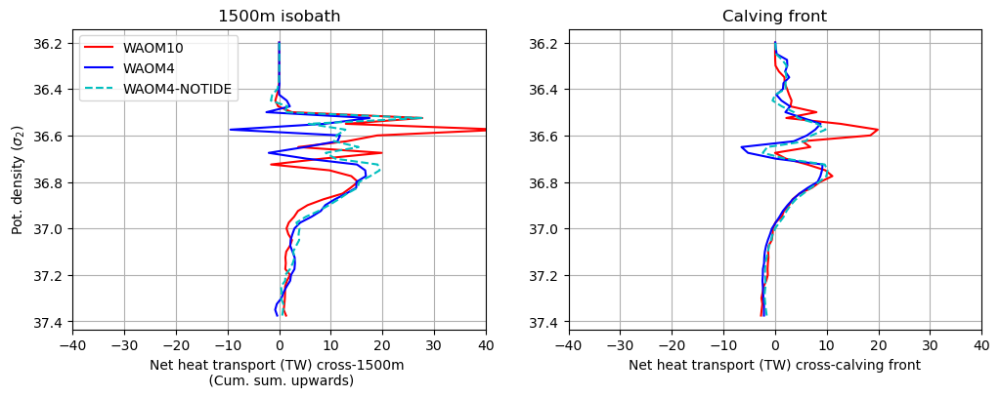

In [58]:
## plot cumsum

Sum_NetHT_10km = Sum_MeanHT_10km+Sum_EddyHT_10km
Sum_NetHT_4km = Sum_MeanHT_4km+Sum_EddyHT_4km
Sum_NetHT_4kmNT = Sum_MeanHT_4kmNT+Sum_EddyHT_4kmNT

Sum_NetHT_10km_CF = Sum_MeanHT_10km_CF+Sum_EddyHT_10km_CF
Sum_NetHT_4km_CF = Sum_MeanHT_4km_CF+Sum_EddyHT_4km_CF
Sum_NetHT_4kmNT_CF = Sum_MeanHT_4kmNT_CF+Sum_EddyHT_4kmNT_CF

fig, ax = plt.subplots(ncols=2, figsize = (12, 4))

ax[0].plot(np.cumsum(Sum_NetHT_10km[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[0].plot(np.cumsum(Sum_NetHT_4km[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[0].plot(np.cumsum(Sum_NetHT_4kmNT[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
ax[0].legend(loc='upper left')
ax[0].grid()
# ax[0].set_xlim(36.6,37.35)
ax[0].set_xlim(-40,40)
ax[0].set_xlabel('Net heat transport (TW) cross-1500m \n (Cum. sum. upwards)')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[0].set_ylabel('Pot. density ($\sigma_2$)')
ax[0].set_title('1500m isobath')
ax[0].invert_yaxis()

ax[1].plot(np.cumsum(Sum_NetHT_10km_CF[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[1].plot(np.cumsum(Sum_NetHT_4km_CF[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[1].plot(np.cumsum(Sum_NetHT_4kmNT_CF[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
ax[1].grid()
# ax[1].set_xlim(36.6,37.35)
ax[1].set_xlim(-40,40)
ax[1].set_title('Calving front')
ax[1].set_xlabel('Net heat transport (TW) cross-calving front')# \n (Cum. sum. upwards)')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[1].invert_yaxis()

name_fig='WAOM10x4x4NT_Cross-1500m+CF_cumsum_MeanEddyHT_vint_annual_v4.png'
plt.savefig(fig_path + name_fig, bbox_inches='tight', dpi=300)
plt.show()

### REPEAT THIS PLOTS + TS DIAGRAMS FOR each subregion



In [59]:
%%time
Sum_MeanHT_10km_ROS = np.nansum(np.nansum(Mean_HT_10km_irho2.isel(contour_index_array=slice(0,390)), axis=1),axis=-1)
Sum_EddyHT_10km_ROS = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_irho2.isel(contour_index_array=slice(0,390)), axis=2),axis=0), axis=-1)
NetHT_10km_ROS = Sum_MeanHT_10km_ROS+Sum_EddyHT_10km_ROS

Sum_MeanHT_10km_AMU = np.nansum(np.nansum(Mean_HT_10km_irho2.isel(contour_index_array=slice(391,650)), axis=1),axis=-1)
Sum_EddyHT_10km_AMU = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_irho2.isel(contour_index_array=slice(391,650)), axis=2),axis=0), axis=-1)
NetHT_10km_AMU = Sum_MeanHT_10km_AMU+Sum_EddyHT_10km_AMU

Sum_MeanHT_10km_BEL = np.nansum(np.nansum(Mean_HT_10km_irho2.isel(contour_index_array=slice(651,850)), axis=1),axis=-1)
Sum_EddyHT_10km_BEL = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_irho2.isel(contour_index_array=slice(651,850)), axis=2),axis=0), axis=-1)
NetHT_10km_BEL = Sum_MeanHT_10km_BEL+Sum_EddyHT_10km_BEL

Sum_MeanHT_10km_EAP = np.nansum(np.nansum(Mean_HT_10km_irho2.isel(contour_index_array=slice(851,1240)), axis=1),axis=-1)
Sum_EddyHT_10km_EAP = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_irho2.isel(contour_index_array=slice(851,1240)), axis=2),axis=0), axis=-1)
NetHT_10km_EAP = Sum_MeanHT_10km_EAP+Sum_EddyHT_10km_EAP

Sum_MeanHT_10km_FRI = np.nansum(np.nansum(Mean_HT_10km_irho2.isel(contour_index_array=slice(1241,1360)), axis=1),axis=-1)
Sum_EddyHT_10km_FRI = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_irho2.isel(contour_index_array=slice(1241,1360)), axis=2),axis=0), axis=-1)
NetHT_10km_FRI = Sum_MeanHT_10km_FRI+Sum_EddyHT_10km_FRI

Sum_MeanHT_10km_MAU = np.nansum(np.nansum(Mean_HT_10km_irho2.isel(contour_index_array=slice(1361,2000)), axis=1),axis=-1)
Sum_EddyHT_10km_MAU = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_irho2.isel(contour_index_array=slice(1361,2000)), axis=2),axis=0), axis=-1)
NetHT_10km_MAU = Sum_MeanHT_10km_MAU+Sum_EddyHT_10km_MAU

Sum_MeanHT_10km_PRY = np.nansum(np.nansum(Mean_HT_10km_irho2.isel(contour_index_array=slice(2001,2360)), axis=1),axis=-1)
Sum_EddyHT_10km_PRY = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_irho2.isel(contour_index_array=slice(2001,2360)), axis=2),axis=0), axis=-1)
NetHT_10km_PRY = Sum_MeanHT_10km_PRY+Sum_EddyHT_10km_PRY

Sum_MeanHT_10km_TOT = np.nansum(np.nansum(Mean_HT_10km_irho2.isel(contour_index_array=slice(2361,2689)), axis=1),axis=-1)
Sum_EddyHT_10km_TOT = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_irho2.isel(contour_index_array=slice(2361,2689)), axis=2),axis=0), axis=-1)
NetHT_10km_TOT = Sum_MeanHT_10km_TOT+Sum_EddyHT_10km_TOT

CPU times: user 8.36 s, sys: 3.27 s, total: 11.6 s
Wall time: 10.4 s


In [60]:
%%time
Sum_MeanHT_10km_CF_ROS = np.nansum(np.nansum(Mean_HT_10km_CF_irho2.isel(contour_index_array=slice(5,350)), axis=1),axis=-1)
Sum_EddyHT_10km_CF_ROS = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_CF_irho2.isel(contour_index_array=slice(5,350)), axis=2),axis=0), axis=-1)
NetHT_10km_CF_ROS = Sum_MeanHT_10km_CF_ROS+Sum_EddyHT_10km_CF_ROS

Sum_MeanHT_10km_CF_AMU = np.nansum(np.nansum(Mean_HT_10km_CF_irho2.isel(contour_index_array=slice(351,730)), axis=1),axis=-1)
Sum_EddyHT_10km_CF_AMU = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_CF_irho2.isel(contour_index_array=slice(351,730)), axis=2),axis=0), axis=-1)
NetHT_10km_CF_AMU = Sum_MeanHT_10km_CF_AMU+Sum_EddyHT_10km_CF_AMU

Sum_MeanHT_10km_CF_BEL = np.nansum(np.nansum(Mean_HT_10km_CF_irho2.isel(contour_index_array=slice(731,1220)), axis=1),axis=-1)
Sum_EddyHT_10km_CF_BEL = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_CF_irho2.isel(contour_index_array=slice(731,1220)), axis=2),axis=0), axis=-1)
NetHT_10km_CF_BEL = Sum_MeanHT_10km_CF_BEL+Sum_EddyHT_10km_CF_BEL

Sum_MeanHT_10km_CF_EAP = np.nansum(np.nansum(Mean_HT_10km_CF_irho2.isel(contour_index_array=slice(1221,1600)), axis=1),axis=-1)
Sum_EddyHT_10km_CF_EAP = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_CF_irho2.isel(contour_index_array=slice(851,1600)), axis=2),axis=0), axis=-1)
NetHT_10km_CF_EAP = Sum_MeanHT_10km_CF_EAP+Sum_EddyHT_10km_CF_EAP

Sum_MeanHT_10km_CF_FRI = np.nansum(np.nansum(Mean_HT_10km_CF_irho2.isel(contour_index_array=slice(1601,1790)), axis=1),axis=-1)
Sum_EddyHT_10km_CF_FRI = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_CF_irho2.isel(contour_index_array=slice(1601,1790)), axis=2),axis=0), axis=-1)
NetHT_10km_CF_FRI = Sum_MeanHT_10km_CF_FRI+Sum_EddyHT_10km_CF_FRI

Sum_MeanHT_10km_CF_MAU = np.nansum(np.nansum(Mean_HT_10km_CF_irho2.isel(contour_index_array=slice(1791,2515)), axis=1),axis=-1)
Sum_EddyHT_10km_CF_MAU = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_CF_irho2.isel(contour_index_array=slice(1791,2515)), axis=2),axis=0), axis=-1)
NetHT_10km_CF_MAU = Sum_MeanHT_10km_CF_MAU+Sum_EddyHT_10km_CF_MAU

Sum_MeanHT_10km_CF_PRY = np.nansum(np.nansum(Mean_HT_10km_CF_irho2.isel(contour_index_array=slice(2516,2940)), axis=1),axis=-1)
Sum_EddyHT_10km_CF_PRY = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_CF_irho2.isel(contour_index_array=slice(2516,2940)), axis=2),axis=0), axis=-1)
NetHT_10km_CF_PRY = Sum_MeanHT_10km_CF_PRY+Sum_EddyHT_10km_CF_PRY

Sum_MeanHT_10km_CF_TOT = np.nansum(np.nansum(Mean_HT_10km_CF_irho2.isel(contour_index_array=slice(2941,3297)), axis=1),axis=-1)
Sum_EddyHT_10km_CF_TOT = np.nansum(np.nanmean(np.nansum(Eddy_HT_10km_CF_irho2.isel(contour_index_array=slice(2941,3297)), axis=2),axis=0), axis=-1)
NetHT_10km_CF_TOT = Sum_MeanHT_10km_CF_TOT+Sum_EddyHT_10km_CF_TOT

CPU times: user 10.9 s, sys: 4.54 s, total: 15.5 s
Wall time: 13.8 s


In [61]:
%%time
Sum_MeanHT_4km_ROS = np.nansum(np.nansum(Mean_HT_4km_irho2.isel(contour_index_array=slice(0,1142)), axis=1),axis=-1)
Sum_EddyHT_4km_ROS = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_irho2.isel(contour_index_array=slice(0,1142)), axis=2),axis=0), axis=-1)
NetHT_4km_ROS = Sum_MeanHT_4km_ROS+Sum_EddyHT_4km_ROS

Sum_MeanHT_4km_AMU = np.nansum(np.nansum(Mean_HT_4km_irho2.isel(contour_index_array=slice(1143,1820)), axis=1),axis=-1)
Sum_EddyHT_4km_AMU = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_irho2.isel(contour_index_array=slice(1143,1820)), axis=2),axis=0), axis=-1)
NetHT_4km_AMU = Sum_MeanHT_4km_AMU+Sum_EddyHT_4km_AMU

Sum_MeanHT_4km_BEL = np.nansum(np.nansum(Mean_HT_4km_irho2.isel(contour_index_array=slice(1821,2290)), axis=1),axis=-1)
Sum_EddyHT_4km_BEL = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_irho2.isel(contour_index_array=slice(1821,2290)), axis=2),axis=0), axis=-1)
NetHT_4km_BEL = Sum_MeanHT_4km_BEL+Sum_EddyHT_4km_BEL

Sum_MeanHT_4km_EAP = np.nansum(np.nansum(Mean_HT_4km_irho2.isel(contour_index_array=slice(2291,3330)), axis=1),axis=-1)
Sum_EddyHT_4km_EAP = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_irho2.isel(contour_index_array=slice(2291,3330)), axis=2),axis=0), axis=-1)
NetHT_4km_EAP = Sum_MeanHT_4km_EAP+Sum_EddyHT_4km_EAP

Sum_MeanHT_4km_FRI = np.nansum(np.nansum(Mean_HT_4km_irho2.isel(contour_index_array=slice(3331,3645)), axis=1),axis=-1)
Sum_EddyHT_4km_FRI = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_irho2.isel(contour_index_array=slice(3331,3645)), axis=2),axis=0), axis=-1)
NetHT_4km_FRI = Sum_MeanHT_4km_FRI+Sum_EddyHT_4km_FRI

Sum_MeanHT_4km_MAU = np.nansum(np.nansum(Mean_HT_4km_irho2.isel(contour_index_array=slice(3646,5240)), axis=1),axis=-1)
Sum_EddyHT_4km_MAU = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_irho2.isel(contour_index_array=slice(3646,5240)), axis=2),axis=0), axis=-1)
NetHT_4km_MAU = Sum_MeanHT_4km_MAU+Sum_EddyHT_4km_MAU

Sum_MeanHT_4km_PRY = np.nansum(np.nansum(Mean_HT_4km_irho2.isel(contour_index_array=slice(5241,6210)), axis=1),axis=-1)
Sum_EddyHT_4km_PRY = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_irho2.isel(contour_index_array=slice(5241,6210)), axis=2),axis=0), axis=-1)
NetHT_4km_PRY = Sum_MeanHT_4km_PRY+Sum_EddyHT_4km_PRY

Sum_MeanHT_4km_TOT = np.nansum(np.nansum(Mean_HT_4km_irho2.isel(contour_index_array=slice(6211,7055)), axis=1),axis=-1)
Sum_EddyHT_4km_TOT = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_irho2.isel(contour_index_array=slice(6211,7055)), axis=2),axis=0), axis=-1)
NetHT_4km_TOT = Sum_MeanHT_4km_TOT+Sum_EddyHT_4km_TOT

CPU times: user 20 s, sys: 8.96 s, total: 29 s
Wall time: 25.8 s


In [62]:
%%time
Sum_MeanHT_4km_CF_ROS = np.nansum(np.nansum(Mean_HT_4km_CF_irho2.isel(contour_index_array=slice(30,1020)), axis=1),axis=-1)
Sum_EddyHT_4km_CF_ROS = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_CF_irho2.isel(contour_index_array=slice(30,1020)), axis=2),axis=0), axis=-1)
NetHT_4km_CF_ROS = Sum_MeanHT_4km_CF_ROS+Sum_EddyHT_4km_CF_ROS

Sum_MeanHT_4km_CF_AMU = np.nansum(np.nansum(Mean_HT_4km_CF_irho2.isel(contour_index_array=slice(1021,2020)), axis=1),axis=-1)
Sum_EddyHT_4km_CF_AMU = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_CF_irho2.isel(contour_index_array=slice(1021,2020)), axis=2),axis=0), axis=-1)
NetHT_4km_CF_AMU = Sum_MeanHT_4km_CF_AMU+Sum_EddyHT_4km_CF_AMU

Sum_MeanHT_4km_CF_BEL = np.nansum(np.nansum(Mean_HT_4km_CF_irho2.isel(contour_index_array=slice(2021,3290)), axis=1),axis=-1)
Sum_EddyHT_4km_CF_BEL = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_CF_irho2.isel(contour_index_array=slice(2021,3290)), axis=2),axis=0), axis=-1)
NetHT_4km_CF_BEL = Sum_MeanHT_4km_CF_BEL+Sum_EddyHT_4km_CF_BEL

Sum_MeanHT_4km_CF_EAP = np.nansum(np.nansum(Mean_HT_4km_CF_irho2.isel(contour_index_array=slice(3291,4600)), axis=1),axis=-1)
Sum_EddyHT_4km_CF_EAP = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_CF_irho2.isel(contour_index_array=slice(3291,4600)), axis=2),axis=0), axis=-1)
NetHT_4km_CF_EAP = Sum_MeanHT_4km_CF_EAP+Sum_EddyHT_4km_CF_EAP

Sum_MeanHT_4km_CF_FRI = np.nansum(np.nansum(Mean_HT_4km_CF_irho2.isel(contour_index_array=slice(4601,5120)), axis=1),axis=-1)
Sum_EddyHT_4km_CF_FRI = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_CF_irho2.isel(contour_index_array=slice(4601,5120)), axis=2),axis=0), axis=-1)
NetHT_4km_CF_FRI = Sum_MeanHT_4km_CF_FRI+Sum_EddyHT_4km_CF_FRI

Sum_MeanHT_4km_CF_MAU = np.nansum(np.nansum(Mean_HT_4km_CF_irho2.isel(contour_index_array=slice(5121,6960)), axis=1),axis=-1)
Sum_EddyHT_4km_CF_MAU = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_CF_irho2.isel(contour_index_array=slice(5121,6960)), axis=2),axis=0), axis=-1)
NetHT_4km_CF_MAU = Sum_MeanHT_4km_CF_MAU+Sum_EddyHT_4km_CF_MAU

Sum_MeanHT_4km_CF_PRY = np.nansum(np.nansum(Mean_HT_4km_CF_irho2.isel(contour_index_array=slice(6961,8150)), axis=1),axis=-1)
Sum_EddyHT_4km_CF_PRY = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_CF_irho2.isel(contour_index_array=slice(6961,8150)), axis=2),axis=0), axis=-1)
NetHT_4km_CF_PRY = Sum_MeanHT_4km_CF_PRY+Sum_EddyHT_4km_CF_PRY

Sum_MeanHT_4km_CF_TOT = np.nansum(np.nansum(Mean_HT_4km_CF_irho2.isel(contour_index_array=slice(8151,9017)), axis=1),axis=-1)
Sum_EddyHT_4km_CF_TOT = np.nansum(np.nanmean(np.nansum(Eddy_HT_4km_CF_irho2.isel(contour_index_array=slice(8151,9017)), axis=2),axis=0), axis=-1)
NetHT_4km_CF_TOT = Sum_MeanHT_4km_CF_TOT+Sum_EddyHT_4km_CF_TOT

CPU times: user 24.8 s, sys: 11.4 s, total: 36.2 s
Wall time: 32.2 s


In [63]:
%%time
Sum_MeanHT_4kmNT_ROS = np.nansum(np.nansum(Mean_HT_4kmNT_irho2.isel(contour_index_array=slice(0,1142)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_ROS = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2.isel(contour_index_array=slice(0,1142)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_ROS = Sum_MeanHT_4kmNT_ROS+Sum_EddyHT_4kmNT_ROS

Sum_MeanHT_4kmNT_AMU = np.nansum(np.nansum(Mean_HT_4kmNT_irho2.isel(contour_index_array=slice(1143,1820)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_AMU = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2.isel(contour_index_array=slice(1143,1820)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_AMU = Sum_MeanHT_4kmNT_AMU+Sum_EddyHT_4kmNT_AMU

Sum_MeanHT_4kmNT_BEL = np.nansum(np.nansum(Mean_HT_4kmNT_irho2.isel(contour_index_array=slice(1821,2290)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_BEL = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2.isel(contour_index_array=slice(1821,2290)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_BEL = Sum_MeanHT_4kmNT_BEL+Sum_EddyHT_4kmNT_BEL

Sum_MeanHT_4kmNT_EAP = np.nansum(np.nansum(Mean_HT_4kmNT_irho2.isel(contour_index_array=slice(2291,3330)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_EAP = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2.isel(contour_index_array=slice(2291,3330)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_EAP = Sum_MeanHT_4kmNT_EAP+Sum_EddyHT_4kmNT_EAP

Sum_MeanHT_4kmNT_FRI = np.nansum(np.nansum(Mean_HT_4kmNT_irho2.isel(contour_index_array=slice(3331,3645)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_FRI = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2.isel(contour_index_array=slice(3331,3645)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_FRI = Sum_MeanHT_4kmNT_FRI+Sum_EddyHT_4kmNT_FRI

Sum_MeanHT_4kmNT_MAU = np.nansum(np.nansum(Mean_HT_4kmNT_irho2.isel(contour_index_array=slice(3646,5240)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_MAU = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2.isel(contour_index_array=slice(3646,5240)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_MAU = Sum_MeanHT_4kmNT_MAU+Sum_EddyHT_4kmNT_MAU

Sum_MeanHT_4kmNT_PRY = np.nansum(np.nansum(Mean_HT_4kmNT_irho2.isel(contour_index_array=slice(5241,6210)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_PRY = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2.isel(contour_index_array=slice(5241,6210)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_PRY = Sum_MeanHT_4kmNT_PRY+Sum_EddyHT_4kmNT_PRY

Sum_MeanHT_4kmNT_TOT = np.nansum(np.nansum(Mean_HT_4kmNT_irho2.isel(contour_index_array=slice(6211,7055)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_TOT = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2.isel(contour_index_array=slice(6211,7055)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_TOT = Sum_MeanHT_4kmNT_TOT+Sum_EddyHT_4kmNT_TOT

CPU times: user 21.9 s, sys: 9.05 s, total: 31 s
Wall time: 27.5 s


In [64]:
%%time
Sum_MeanHT_4kmNT_CF_ROS = np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(30,1020)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_CF_ROS = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(30,1020)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_CF_ROS = Sum_MeanHT_4kmNT_CF_ROS+Sum_EddyHT_4kmNT_CF_ROS

Sum_MeanHT_4kmNT_CF_AMU = np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(1021,2020)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_CF_AMU = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(1021,2020)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_CF_AMU = Sum_MeanHT_4kmNT_CF_AMU+Sum_EddyHT_4kmNT_CF_AMU

Sum_MeanHT_4kmNT_CF_BEL = np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(2021,3290)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_CF_BEL = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(2021,3290)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_CF_BEL = Sum_MeanHT_4kmNT_CF_BEL+Sum_EddyHT_4kmNT_CF_BEL

Sum_MeanHT_4kmNT_CF_EAP = np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(3291,4600)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_CF_EAP = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(3291,4600)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_CF_EAP = Sum_MeanHT_4kmNT_CF_EAP+Sum_EddyHT_4kmNT_CF_EAP

Sum_MeanHT_4kmNT_CF_FRI = np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(4601,5120)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_CF_FRI = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(4601,5120)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_CF_FRI = Sum_MeanHT_4kmNT_CF_FRI+Sum_EddyHT_4kmNT_CF_FRI

Sum_MeanHT_4kmNT_CF_MAU = np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(5121,6960)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_CF_MAU = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(5121,6960)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_CF_MAU = Sum_MeanHT_4kmNT_CF_MAU+Sum_EddyHT_4kmNT_CF_MAU

Sum_MeanHT_4kmNT_CF_PRY = np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(6961,8150)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_CF_PRY = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(6961,8150)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_CF_PRY = Sum_MeanHT_4kmNT_CF_PRY+Sum_EddyHT_4kmNT_CF_PRY

Sum_MeanHT_4kmNT_CF_TOT = np.nansum(np.nansum(Mean_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(8151,9017)), axis=1),axis=-1)
Sum_EddyHT_4kmNT_CF_TOT = np.nansum(np.nanmean(np.nansum(Eddy_HT_4kmNT_CF_irho2.isel(contour_index_array=slice(8151,9017)), axis=2),axis=0), axis=-1)
NetHT_4kmNT_CF_TOT = Sum_MeanHT_4kmNT_CF_TOT+Sum_EddyHT_4kmNT_CF_TOT

CPU times: user 25.1 s, sys: 11.5 s, total: 36.6 s
Wall time: 32.4 s


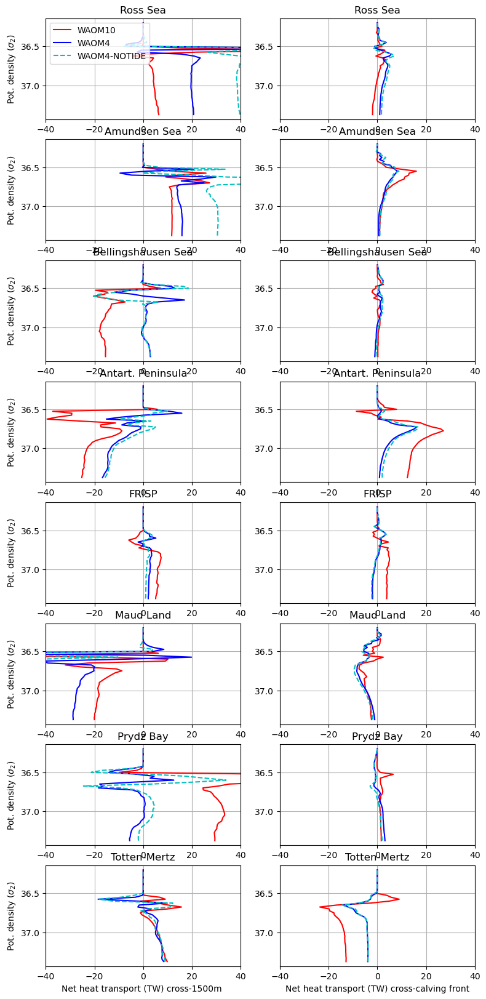

In [78]:
# all subregions in one plot:

fig, ax = plt.subplots(nrows=8, ncols=2, figsize = (9, 20))

ax[0,0].plot(np.cumsum(NetHT_10km_ROS[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[0,0].plot(np.cumsum(NetHT_4km_ROS[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[0,0].plot(np.cumsum(NetHT_4kmNT_ROS[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
ax[0,0].legend(loc='upper left')
ax[0,0].grid()
# ax[0,0].set_xlim(36.6,37.35)
ax[0,0].set_xlim(-40,40)
# ax[0,0].set_xlabel('Net heat transport (TW) cross-1500m ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[0,0].set_ylabel('Pot. density ($\sigma_2$)')
ax[0,0].set_title('Ross Sea')
ax[0,0].invert_yaxis()

ax[0,1].plot(np.cumsum(NetHT_10km_CF_ROS[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[0,1].plot(np.cumsum(NetHT_4km_CF_ROS[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[0,1].plot(np.cumsum(NetHT_4kmNT_CF_ROS[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
ax[0,1].grid()
# ax[0,1].set_xlim(36.6,37.35)
ax[0,1].set_xlim(-40,40)
ax[0,1].set_title('Ross Sea')
# ax[0,1].set_xlabel('Net heat transport (TW) cross-calving front')# ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[0,1].invert_yaxis()

ax[1,0].plot(np.cumsum(NetHT_10km_AMU[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[1,0].plot(np.cumsum(NetHT_4km_AMU[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[1,0].plot(np.cumsum(NetHT_4kmNT_AMU[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
# ax[1,0].legend(loc='upper left')
ax[1,0].grid()
# ax[1,0].set_xlim(36.6,37.35)
ax[1,0].set_xlim(-40,40)
# ax[1,0].set_xlabel('Net heat transport (TW) cross-1500m ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[1,0].set_ylabel('Pot. density ($\sigma_2$)')
ax[1,0].set_title('Amundsen Sea')
ax[1,0].invert_yaxis()

ax[1,1].plot(np.cumsum(NetHT_10km_CF_AMU[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[1,1].plot(np.cumsum(NetHT_4km_CF_AMU[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[1,1].plot(np.cumsum(NetHT_4kmNT_CF_AMU[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
ax[1,1].grid()
# ax[1,1].set_xlim(36.6,37.35)
ax[1,1].set_xlim(-40,40)
ax[1,1].set_title('Amundsen Sea')
# ax[1,1].set_xlabel('Net heat transport (TW) cross-calving front')# ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[1,1].invert_yaxis()


ax[2,0].plot(np.cumsum(NetHT_10km_BEL[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[2,0].plot(np.cumsum(NetHT_4km_BEL[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[2,0].plot(np.cumsum(NetHT_4kmNT_BEL[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
# ax[2,0].legend(loc='upper left')
ax[2,0].grid()
# ax[2,0].set_xlim(36.6,37.35)
ax[2,0].set_xlim(-40,40)
# ax[2,0].set_xlabel('Net heat transport (TW) cross-1500m ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[2,0].set_ylabel('Pot. density ($\sigma_2$)')
ax[2,0].set_title('Bellingshausen Sea')
ax[2,0].invert_yaxis()

ax[2,1].plot(np.cumsum(NetHT_10km_CF_BEL[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[2,1].plot(np.cumsum(NetHT_4km_CF_BEL[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[2,1].plot(np.cumsum(NetHT_4kmNT_CF_BEL[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
ax[2,1].grid()
# ax[2,1].set_xlim(36.6,37.35)
ax[2,1].set_xlim(-40,40)
ax[2,1].set_title('Bellingshausen Sea')
# ax[2,1].set_xlabel('Net heat transport (TW) cross-calving front')# ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[2,1].invert_yaxis()

ax[3,0].plot(np.cumsum(NetHT_10km_EAP[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[3,0].plot(np.cumsum(NetHT_4km_EAP[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[3,0].plot(np.cumsum(NetHT_4kmNT_EAP[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
# ax[3,0].legend(loc='upper left')
ax[3,0].grid()
# ax[3,0].set_xlim(36.6,37.35)
ax[3,0].set_xlim(-40,40)
# ax[3,0].set_xlabel('Net heat transport (TW) cross-1500m ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[3,0].set_ylabel('Pot. density ($\sigma_2$)')
ax[3,0].set_title('Antart. Peninsula')
ax[3,0].invert_yaxis()

ax[3,1].plot(np.cumsum(NetHT_10km_CF_EAP[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[3,1].plot(np.cumsum(NetHT_4km_CF_EAP[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[3,1].plot(np.cumsum(NetHT_4kmNT_CF_EAP[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
ax[3,1].grid()
# ax[3,1].set_xlim(36.6,37.35)
ax[3,1].set_xlim(-40,40)
ax[3,1].set_title('Antart. Peninsula')
# ax[3,1].set_xlabel('Net heat transport (TW) cross-calving front')# ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[3,1].invert_yaxis()

ax[4,0].plot(np.cumsum(NetHT_10km_FRI[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[4,0].plot(np.cumsum(NetHT_4km_FRI[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[4,0].plot(np.cumsum(NetHT_4kmNT_FRI[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
# ax[4,0].legend(loc='upper left')
ax[4,0].grid()
# ax[4,0].set_xlim(36.6,37.35)
ax[4,0].set_xlim(-40,40)
# ax[4,0].set_xlabel('Net heat transport (TW) cross-1500m ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[4,0].set_ylabel('Pot. density ($\sigma_2$)')
ax[4,0].set_title('FRISP')
ax[4,0].invert_yaxis()

ax[4,1].plot(np.cumsum(NetHT_10km_CF_FRI[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[4,1].plot(np.cumsum(NetHT_4km_CF_FRI[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[4,1].plot(np.cumsum(NetHT_4kmNT_CF_FRI[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
ax[4,1].grid()
# ax[4,1].set_xlim(36.6,37.35)
ax[4,1].set_xlim(-40,40)
ax[4,1].set_title('FRISP')
# ax[4,1].set_xlabel('Net heat transport (TW) cross-calving front')# ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[4,1].invert_yaxis()

ax[5,0].plot(np.cumsum(NetHT_10km_MAU[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[5,0].plot(np.cumsum(NetHT_4km_MAU[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[5,0].plot(np.cumsum(NetHT_4kmNT_MAU[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
# ax[5,0].legend(loc='upper left')
ax[5,0].grid()
# ax[5,0].set_xlim(36.6,37.35)
ax[5,0].set_xlim(-40,40)
# ax[5,0].set_xlabel('Net heat transport (TW) cross-1500m ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[5,0].set_ylabel('Pot. density ($\sigma_2$)')
ax[5,0].set_title('Maud Land')
ax[5,0].invert_yaxis()

ax[5,1].plot(np.cumsum(NetHT_10km_CF_MAU[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[5,1].plot(np.cumsum(NetHT_4km_CF_MAU[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[5,1].plot(np.cumsum(NetHT_4kmNT_CF_MAU[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
ax[5,1].grid()
# ax[5,1].set_xlim(36.6,37.35)
ax[5,1].set_xlim(-40,40)
ax[5,1].set_title('Maud Land')
# ax[5,1].set_xlabel('Net heat transport (TW) cross-calving front')# ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[5,1].invert_yaxis()


ax[6,0].plot(np.cumsum(NetHT_10km_PRY[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[6,0].plot(np.cumsum(NetHT_4km_PRY[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[6,0].plot(np.cumsum(NetHT_4kmNT_PRY[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
# ax[6,0].legend(loc='upper left')
ax[6,0].grid()
# ax[6,0].set_xlim(36.6,37.35)
ax[6,0].set_xlim(-40,40)
# ax[6,0].set_xlabel('Net heat transport (TW) cross-1500m ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[6,0].set_ylabel('Pot. density ($\sigma_2$)')
ax[6,0].set_title('Prydz Bay')
ax[6,0].invert_yaxis()

ax[6,1].plot(np.cumsum(NetHT_10km_CF_PRY[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[6,1].plot(np.cumsum(NetHT_4km_CF_PRY[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[6,1].plot(np.cumsum(NetHT_4kmNT_CF_PRY[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
ax[6,1].grid()
# ax[6,1].set_xlim(36.6,37.35)
ax[6,1].set_xlim(-40,40)
ax[6,1].set_title('Prydz Bay')
# ax[6,1].set_xlabel('Net heat transport (TW) cross-calving front')# ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[6,1].invert_yaxis()

ax[7,0].plot(np.cumsum(NetHT_10km_TOT[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[7,0].plot(np.cumsum(NetHT_4km_TOT[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[7,0].plot(np.cumsum(NetHT_4kmNT_TOT[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
# ax[7,0].legend(loc='upper left')
ax[7,0].grid()
# ax[7,0].set_xlim(36.6,37.35)
ax[7,0].set_xlim(-40,40)
ax[7,0].set_xlabel('Net heat transport (TW) cross-1500m ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[7,0].set_ylabel('Pot. density ($\sigma_2$)')
ax[7,0].set_title('Totten-Mertz')
ax[7,0].invert_yaxis()

ax[7,1].plot(np.cumsum(NetHT_10km_CF_TOT[::-1])[::-1]*1e-12,rho_grid2[::-1],'-r', label='WAOM10')
ax[7,1].plot(np.cumsum(NetHT_4km_CF_TOT[::-1])[::-1]*1e-12,rho_grid2[::-1],'-b', label='WAOM4')
ax[7,1].plot(np.cumsum(NetHT_4kmNT_CF_TOT[::-1])[::-1]*1e-12,rho_grid2[::-1],'--c', label='WAOM4-NOTIDE')
ax[7,1].grid()
# ax[7,1].set_xlim(36.6,37.35)
ax[7,1].set_xlim(-40,40)
ax[7,1].set_title('Totten-Mertz')
ax[7,1].set_xlabel('Net heat transport (TW) cross-calving front')# ')# (Abs-T$_{f}$, 10$^{15}$W'])
ax[7,1].invert_yaxis()

name_fig='WAOM10x4x4NT_Cross-1500m+CF_cumsum_MeanEddyHT_vint_annual_v4_subregions.png'
plt.savefig(fig_path + name_fig, bbox_inches='tight', dpi=300)
plt.show()

### plot mean, eddy, and mean-eddy sections (depth x along_contour), binned & integrated over some density bins

## Plot section WAOM10

#### WAOM 10, MEAN HT

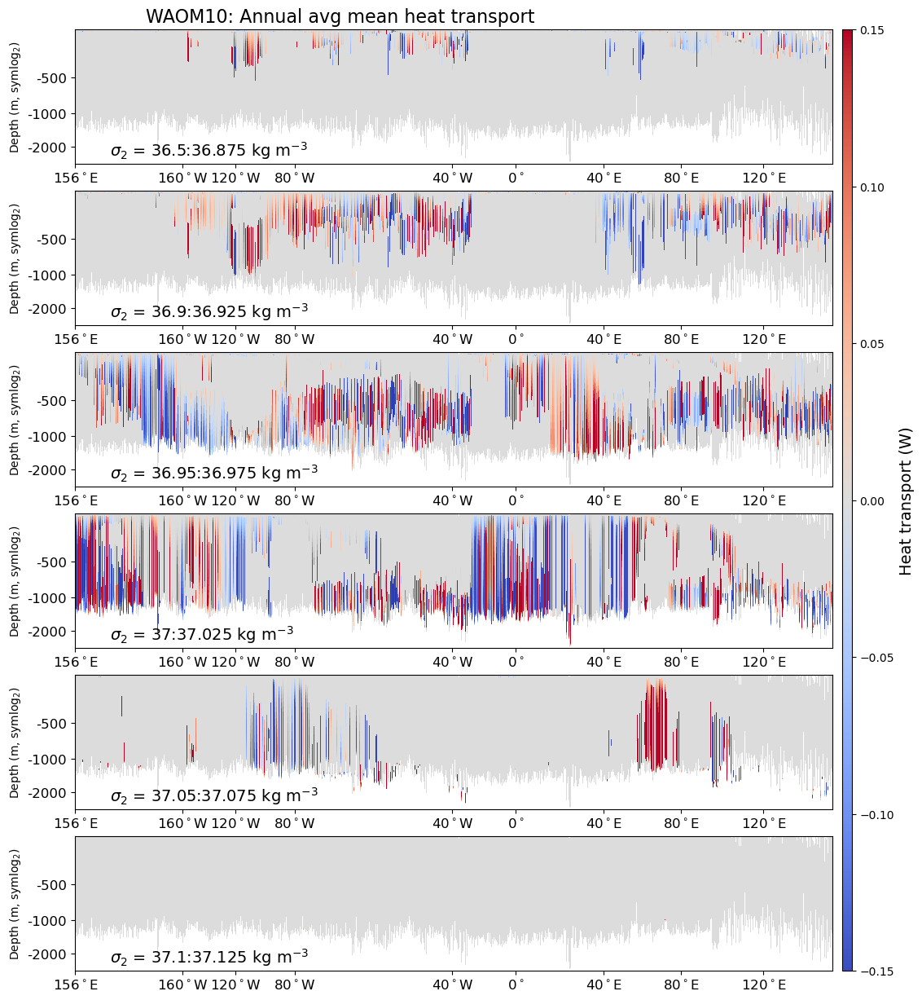

In [34]:
# Annual average for density-cross-1500m transports:
# WAOM10
fig, ax = plt.subplots(nrows=6, figsize = (12, 15))
#ax[0].text(17,75,'Day = ' + str(tt*5),fontsize=12)
## ax[0].text(2,75,'$\sigma_{\Theta}$ = ' +  str(round(rho_grid2[ll],2)),fontsize=12)
ax[0].text(2,75,'WAOM10: Annual avg mean heat transport',fontsize=16)

ll=np.arange(26,28) #17 # 
cht = ax[0].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),np.nansum(Mean_HT_10km_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[0].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[0].set_xlim(0, dist_along_10km[-1])
# ax[0].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
ax[0].text(1,-2500,'$\sigma_{2}$ = 36.5:36.875 kg m$^{-3}$',fontsize=14)
ax[0].set_yscale('symlog',base = 2, linthresh=700)
ax[0].set_ylabel('Depth (m, symlog$_2$)')
ax[0].set_yticklabels(['-2000','-1000','-500'])
ax[0].set_aspect('auto')
ax[0].tick_params(labelsize=12)

ll=np.arange(28,30) #18
cht = ax[1].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),np.nansum(Mean_HT_10km_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[1].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[1].set_xlim(0, dist_along_10km[-1])
ax[1].text(1,-2500,'$\sigma_{2}$ = 36.9:36.925 kg m$^{-3}$',fontsize=14)
ax[1].set_yscale('symlog',base = 2, linthresh=700)
ax[1].set_ylabel('Depth (m, symlog$_2$)')
ax[1].set_yticklabels(['-2000','-1000','-500'])
ax[1].set_aspect('auto')
ax[1].tick_params(labelsize=12)

ll=np.arange(30,32) #19
cht = ax[2].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),np.nansum(Mean_HT_10km_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[2].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[2].set_xlim(0, dist_along_10km[-1])
ax[2].text(1,-2500,'$\sigma_{2}$ = 36.95:36.975 kg m$^{-3}$',fontsize=14)
ax[2].set_yscale('symlog',base = 2, linthresh=700)
ax[2].set_ylabel('Depth (m, symlog$_2$)')
ax[2].set_yticklabels(['-2000','-1000','-500'])
ax[2].set_aspect('auto')
ax[2].tick_params(labelsize=12)

ll=np.arange(32,34) #20
cht = ax[3].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),np.nansum(Mean_HT_10km_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[3].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[3].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                            '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[3].set_xlim(0, dist_along_10km[-1])
ax[3].text(1,-2500,'$\sigma_{2}$ = 37:37.025 kg m$^{-3}$',fontsize=14)
ax[3].set_yscale('symlog',base = 2, linthresh=700)
ax[3].set_ylabel('Depth (m, symlog$_2$)')
ax[3].set_yticklabels(['-2000','-1000','-500'])
ax[3].set_aspect('auto')
ax[3].tick_params(labelsize=12)

ll=np.arange(34,36) #21
cht = ax[4].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),np.nansum(Mean_HT_10km_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[4].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[4].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[4].set_xlim(0, dist_along_10km[-1])
ax[4].text(1,-2500,'$\sigma_{2}$ = 37.05:37.075 kg m$^{-3}$',fontsize=14)
ax[4].set_yscale('symlog',base = 2, linthresh=700)
ax[4].set_ylabel('Depth (m, symlog$_2$)')
ax[4].set_yticklabels(['-2000','-1000','-500'])
ax[4].set_aspect('auto')
ax[4].tick_params(labelsize=12)
 
ll=np.arange(36,38) #22
cht = ax[5].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),np.nansum(Mean_HT_10km_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[5].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[5].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[5].set_xlim(0, dist_along_10km[-1])
ax[5].text(1,-2500,'$\sigma_{2}$ = 37.1:37.125 kg m$^{-3}$',fontsize=14)
ax[5].set_yscale('symlog',base = 2, linthresh=700)
ax[5].set_ylabel('Depth (m, symlog$_2$)')
ax[5].set_yticklabels(['-2000','-1000','-500'])
ax[5].set_aspect('auto')
ax[5].tick_params(labelsize=12)
 
cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
cb = plt.colorbar(cht, cax=cax1, orientation='vertical')
cb.ax.set_ylabel('Heat transport (W)', fontsize=14)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom10_Mean_HT_cross1500m_rho2_annual_v4.png"
plt.savefig(name_fig, dpi=300)


#### WAOM 10, EDDY HT

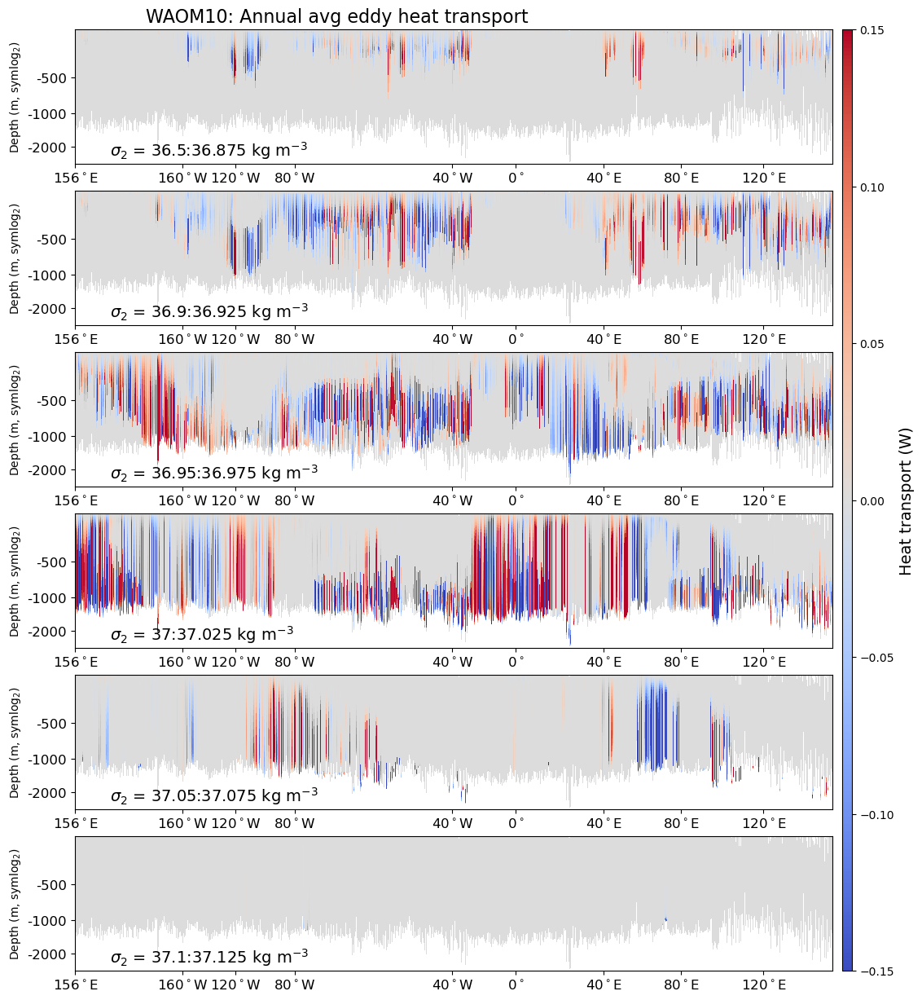

In [35]:
# Annual average for density-cross-1500m transports:
# WAOM10
fig, ax = plt.subplots(nrows=6, figsize = (12, 15))
#ax[0].text(17,75,'Day = ' + str(tt*5),fontsize=12)
## ax[0].text(2,75,'$\sigma_{\Theta}$ = ' +  str(round(rho_grid2[ll],2)),fontsize=12)
ax[0].text(2,75,'WAOM10: Annual avg eddy heat transport',fontsize=16)

ll=np.arange(26,28) #17 # 
cht = ax[0].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),np.nanmean(np.nansum(Eddy_HT_10km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[0].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[0].set_xlim(0, dist_along_10km[-1])
# ax[0].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
ax[0].text(1,-2500,'$\sigma_{2}$ = 36.5:36.875 kg m$^{-3}$',fontsize=14)
ax[0].set_yscale('symlog',base = 2, linthresh=700)
ax[0].set_ylabel('Depth (m, symlog$_2$)')
ax[0].set_yticklabels(['-2000','-1000','-500'])
ax[0].set_aspect('auto')
ax[0].tick_params(labelsize=12)

ll=np.arange(28,30) #18
cht = ax[1].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),np.nanmean(np.nansum(Eddy_HT_10km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[1].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[1].set_xlim(0, dist_along_10km[-1])
ax[1].text(1,-2500,'$\sigma_{2}$ = 36.9:36.925 kg m$^{-3}$',fontsize=14)
ax[1].set_yscale('symlog',base = 2, linthresh=700)
ax[1].set_ylabel('Depth (m, symlog$_2$)')
ax[1].set_yticklabels(['-2000','-1000','-500'])
ax[1].set_aspect('auto')
ax[1].tick_params(labelsize=12)

ll=np.arange(30,32) #19
cht = ax[2].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),np.nanmean(np.nansum(Eddy_HT_10km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[2].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[2].set_xlim(0, dist_along_10km[-1])
ax[2].text(1,-2500,'$\sigma_{2}$ = 36.95:36.975 kg m$^{-3}$',fontsize=14)
ax[2].set_yscale('symlog',base = 2, linthresh=700)
ax[2].set_ylabel('Depth (m, symlog$_2$)')
ax[2].set_yticklabels(['-2000','-1000','-500'])
ax[2].set_aspect('auto')
ax[2].tick_params(labelsize=12)

ll=np.arange(32,34) #20
cht = ax[3].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),np.nanmean(np.nansum(Eddy_HT_10km_irho2[:,ll,:,:], axis=1)*1e-12, axis=0), vmin=-.15, vmax=.15, cmap='coolwarm')
ax[3].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[3].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                            '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[3].set_xlim(0, dist_along_10km[-1])
ax[3].text(1,-2500,'$\sigma_{2}$ = 37:37.025 kg m$^{-3}$',fontsize=14)
ax[3].set_yscale('symlog',base = 2, linthresh=700)
ax[3].set_ylabel('Depth (m, symlog$_2$)')
ax[3].set_yticklabels(['-2000','-1000','-500'])
ax[3].set_aspect('auto')
ax[3].tick_params(labelsize=12)

ll=np.arange(34,36) #21
cht = ax[4].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),np.nanmean(np.nansum(Eddy_HT_10km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[4].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[4].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[4].set_xlim(0, dist_along_10km[-1])
ax[4].text(1,-2500,'$\sigma_{2}$ = 37.05:37.075 kg m$^{-3}$',fontsize=14)
ax[4].set_yscale('symlog',base = 2, linthresh=700)
ax[4].set_ylabel('Depth (m, symlog$_2$)')
ax[4].set_yticklabels(['-2000','-1000','-500'])
ax[4].set_aspect('auto')
ax[4].tick_params(labelsize=12)
 
ll=np.arange(36,38) #22
cht = ax[5].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),np.nanmean(np.nansum(Eddy_HT_10km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[5].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[5].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[5].set_xlim(0, dist_along_10km[-1])
ax[5].text(1,-2500,'$\sigma_{2}$ = 37.1:37.125 kg m$^{-3}$',fontsize=14)
ax[5].set_yscale('symlog',base = 2, linthresh=700)
ax[5].set_ylabel('Depth (m, symlog$_2$)')
ax[5].set_yticklabels(['-2000','-1000','-500'])
ax[5].set_aspect('auto')
ax[5].tick_params(labelsize=12)
 
cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
cb = plt.colorbar(cht, cax=cax1, orientation='vertical')
cb.ax.set_ylabel('Heat transport (W)', fontsize=14)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom10_Eddy_HT_cross1500m_rho2_annual_v4.png"
plt.savefig(name_fig, dpi=300)


#### WAOM 10, MEAN+EDDY HT

In [41]:
Net_HT_10km_irho2 = Mean_HT_10km_irho2 + Eddy_HT_10km_irho2
Net_HT_10km_irho2 = Net_HT_10km_irho2.transpose('ocean_time','rho_grid','s_rho','contour_index_array')

print(Net_HT_10km_irho2.shape)
# print(np.nanmean(np.nansum(Net_HT_10km_irho2[:,ll,:,:], axis=1), axis=0).shape)
#nansum = z-axis, nanmean(time-axis)

(365, 48, 31, 2690)


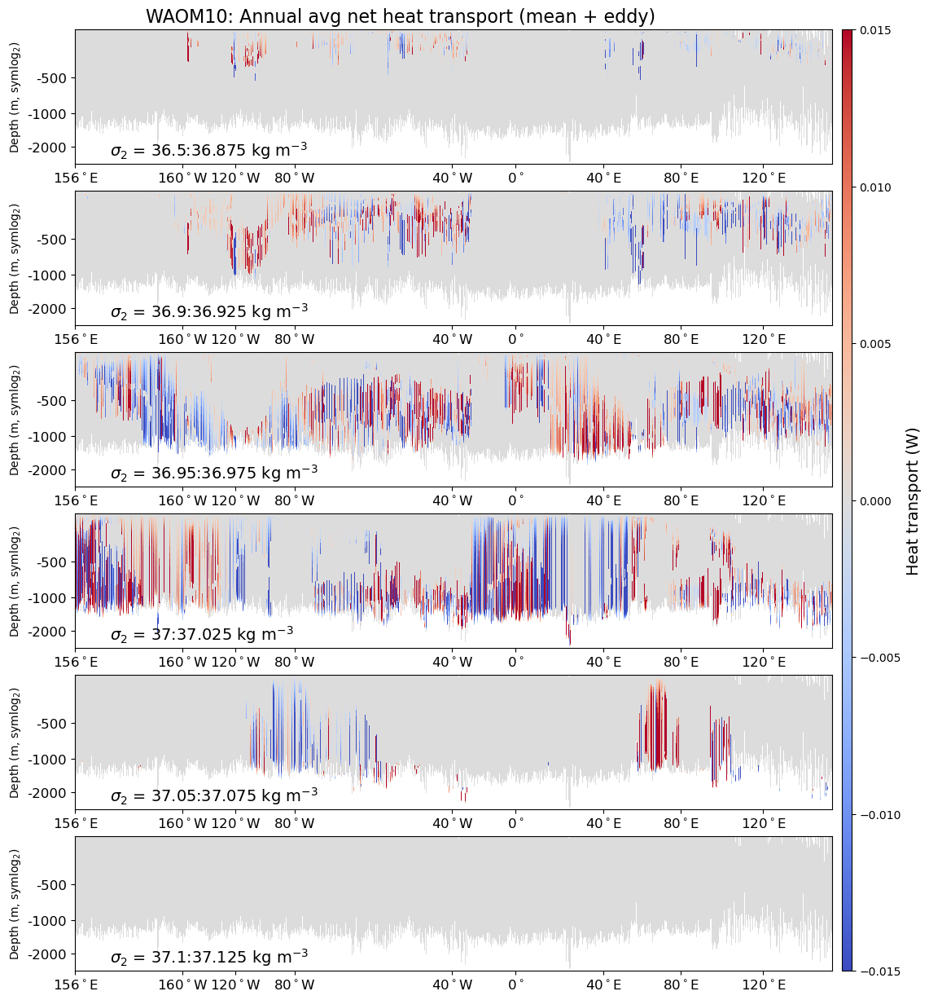

In [42]:
Net_HT_10km_irho2 = Mean_HT_10km_irho2 + Eddy_HT_10km_irho2
Net_HT_10km_irho2 = Net_HT_10km_irho2.transpose('ocean_time','rho_grid','s_rho','contour_index_array')

# Annual average for density-cross-1500m transports:
# WAOM10
fig, ax = plt.subplots(nrows=6, figsize = (12, 15))
#ax[0].text(17,75,'Day = ' + str(tt*5),fontsize=12)
## ax[0].text(2,75,'$\sigma_{\Theta}$ = ' +  str(round(rho_grid2[ll],2)),fontsize=12)
ax[0].text(2,75,'WAOM10: Annual avg net heat transport (mean + eddy)',fontsize=16)

ll=np.arange(26,28) #17 # 
cht = ax[0].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),\
                        np.nanmean(np.nansum(Net_HT_10km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015)
ax[0].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[0].set_xlim(0, dist_along_10km[-1])
# ax[0].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
ax[0].text(1,-2500,'$\sigma_{2}$ = 36.5:36.875 kg m$^{-3}$',fontsize=14)
ax[0].set_yscale('symlog',base = 2, linthresh=700)
ax[0].set_ylabel('Depth (m, symlog$_2$)')
ax[0].set_yticklabels(['-2000','-1000','-500'])
ax[0].set_aspect('auto')
ax[0].tick_params(labelsize=12)

ll=np.arange(28,30) #18
cht = ax[1].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),\
                        np.nanmean(np.nansum(Net_HT_10km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015)
ax[1].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[1].set_xlim(0, dist_along_10km[-1])
ax[1].text(1,-2500,'$\sigma_{2}$ = 36.9:36.925 kg m$^{-3}$',fontsize=14)
ax[1].set_yscale('symlog',base = 2, linthresh=700)
ax[1].set_ylabel('Depth (m, symlog$_2$)')
ax[1].set_yticklabels(['-2000','-1000','-500'])
ax[1].set_aspect('auto')
ax[1].tick_params(labelsize=12)

ll=np.arange(30,32) #19
cht = ax[2].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),\
                        np.nanmean(np.nansum(Net_HT_10km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015)
ax[2].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[2].set_xlim(0, dist_along_10km[-1])
ax[2].text(1,-2500,'$\sigma_{2}$ = 36.95:36.975 kg m$^{-3}$',fontsize=14)
ax[2].set_yscale('symlog',base = 2, linthresh=700)
ax[2].set_ylabel('Depth (m, symlog$_2$)')
ax[2].set_yticklabels(['-2000','-1000','-500'])
ax[2].set_aspect('auto')
ax[2].tick_params(labelsize=12)

ll=np.arange(32,34) #20
cht = ax[3].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),\
                        np.nanmean(np.nansum(Net_HT_10km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015)
ax[3].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[3].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                            '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[3].set_xlim(0, dist_along_10km[-1])
ax[3].text(1,-2500,'$\sigma_{2}$ = 37:37.025 kg m$^{-3}$',fontsize=14)
ax[3].set_yscale('symlog',base = 2, linthresh=700)
ax[3].set_ylabel('Depth (m, symlog$_2$)')
ax[3].set_yticklabels(['-2000','-1000','-500'])
ax[3].set_aspect('auto')
ax[3].tick_params(labelsize=12)

ll=np.arange(34,36) #21
cht = ax[4].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),\
                        np.nanmean(np.nansum(Net_HT_10km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015)
ax[4].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[4].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[4].set_xlim(0, dist_along_10km[-1])
ax[4].text(1,-2500,'$\sigma_{2}$ = 37.05:37.075 kg m$^{-3}$',fontsize=14)
ax[4].set_yscale('symlog',base = 2, linthresh=700)
ax[4].set_ylabel('Depth (m, symlog$_2$)')
ax[4].set_yticklabels(['-2000','-1000','-500'])
ax[4].set_aspect('auto')
ax[4].tick_params(labelsize=12)
 
ll=np.arange(36,38) #22
cht = ax[5].pcolormesh(dist_along_axis_10km,np.nanmean(z_rho_10km, axis=0),\
                        np.nanmean(np.nansum(Net_HT_10km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015)
ax[5].set_xticks(dist_along_10km[distance_indices_10km.astype(int)[:]])
ax[5].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[5].set_xlim(0, dist_along_10km[-1])
ax[5].text(1,-2500,'$\sigma_{2}$ = 37.1:37.125 kg m$^{-3}$',fontsize=14)
ax[5].set_yscale('symlog',base = 2, linthresh=700)
ax[5].set_ylabel('Depth (m, symlog$_2$)')
ax[5].set_yticklabels(['-2000','-1000','-500'])
ax[5].set_aspect('auto')
ax[5].tick_params(labelsize=12)
 
cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
cb = plt.colorbar(cht, cax=cax1, orientation='vertical')
cb.ax.set_ylabel('Heat transport (W)', fontsize=14)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom10_Net_HT_cross1500m_rho2_annual_v4.png"
plt.savefig(name_fig, dpi=300)


## Plot section WAOM4

#### WAOM 4, MEAN HT

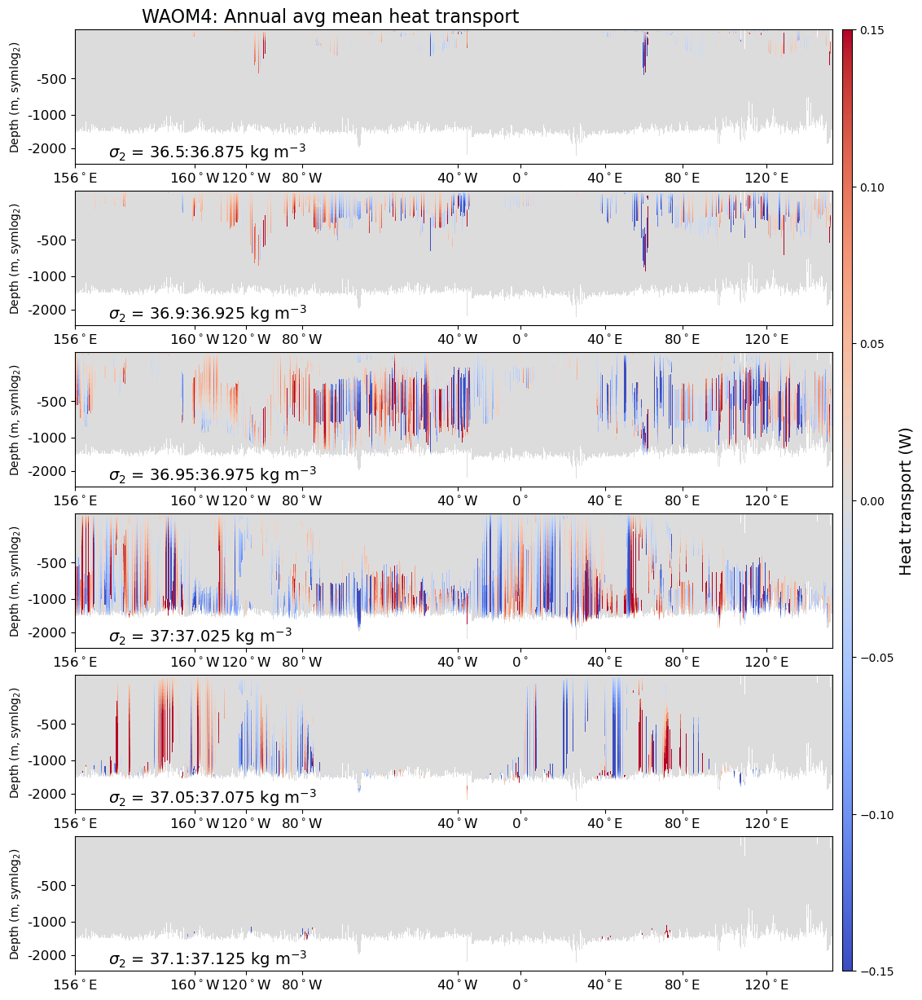

In [43]:
# Annual average for density-cross-1500m transports:
# WAOM4
fig, ax = plt.subplots(nrows=6, figsize = (12, 15))
#ax[0].text(17,75,'Day = ' + str(tt*5),fontsize=12)
## ax[0].text(2,75,'$\sigma_{\Theta}$ = ' +  str(round(rho_grid2[ll],2)),fontsize=12)
ax[0].text(2,75,'WAOM4: Annual avg mean heat transport',fontsize=16)

ll=np.arange(26,28) #17 # 
cht = ax[0].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),np.nansum(Mean_HT_4km_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[0].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[0].set_xlim(0, dist_along_4km[-1])
# ax[0].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
ax[0].text(1,-2500,'$\sigma_{2}$ = 36.5:36.875 kg m$^{-3}$',fontsize=14)
ax[0].set_yscale('symlog',base = 2, linthresh=700)
ax[0].set_ylabel('Depth (m, symlog$_2$)')
ax[0].set_yticklabels(['-2000','-1000','-500'])
ax[0].set_aspect('auto')
ax[0].tick_params(labelsize=12)

ll=np.arange(28,30) #18
cht = ax[1].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),np.nansum(Mean_HT_4km_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[1].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[1].set_xlim(0, dist_along_4km[-1])
ax[1].text(1,-2500,'$\sigma_{2}$ = 36.9:36.925 kg m$^{-3}$',fontsize=14)
ax[1].set_yscale('symlog',base = 2, linthresh=700)
ax[1].set_ylabel('Depth (m, symlog$_2$)')
ax[1].set_yticklabels(['-2000','-1000','-500'])
ax[1].set_aspect('auto')
ax[1].tick_params(labelsize=12)

ll=np.arange(30,32) #19
cht = ax[2].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),np.nansum(Mean_HT_4km_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[2].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[2].set_xlim(0, dist_along_4km[-1])
ax[2].text(1,-2500,'$\sigma_{2}$ = 36.95:36.975 kg m$^{-3}$',fontsize=14)
ax[2].set_yscale('symlog',base = 2, linthresh=700)
ax[2].set_ylabel('Depth (m, symlog$_2$)')
ax[2].set_yticklabels(['-2000','-1000','-500'])
ax[2].set_aspect('auto')
ax[2].tick_params(labelsize=12)

ll=np.arange(32,34) #20
cht = ax[3].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),np.nansum(Mean_HT_4km_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[3].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[3].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                            '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[3].set_xlim(0, dist_along_4km[-1])
ax[3].text(1,-2500,'$\sigma_{2}$ = 37:37.025 kg m$^{-3}$',fontsize=14)
ax[3].set_yscale('symlog',base = 2, linthresh=700)
ax[3].set_ylabel('Depth (m, symlog$_2$)')
ax[3].set_yticklabels(['-2000','-1000','-500'])
ax[3].set_aspect('auto')
ax[3].tick_params(labelsize=12)

ll=np.arange(34,36) #21
cht = ax[4].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),np.nansum(Mean_HT_4km_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[4].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[4].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[4].set_xlim(0, dist_along_4km[-1])
ax[4].text(1,-2500,'$\sigma_{2}$ = 37.05:37.075 kg m$^{-3}$',fontsize=14)
ax[4].set_yscale('symlog',base = 2, linthresh=700)
ax[4].set_ylabel('Depth (m, symlog$_2$)')
ax[4].set_yticklabels(['-2000','-1000','-500'])
ax[4].set_aspect('auto')
ax[4].tick_params(labelsize=12)
 
ll=np.arange(36,38) #22
cht = ax[5].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),np.nansum(Mean_HT_4km_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[5].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[5].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[5].set_xlim(0, dist_along_4km[-1])
ax[5].text(1,-2500,'$\sigma_{2}$ = 37.1:37.125 kg m$^{-3}$',fontsize=14)
ax[5].set_yscale('symlog',base = 2, linthresh=700)
ax[5].set_ylabel('Depth (m, symlog$_2$)')
ax[5].set_yticklabels(['-2000','-1000','-500'])
ax[5].set_aspect('auto')
ax[5].tick_params(labelsize=12)
 
cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
cb = plt.colorbar(cht, cax=cax1, orientation='vertical')
cb.ax.set_ylabel('Heat transport (W)', fontsize=14)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom4_Mean_HT_cross1500m_rho2_annual_v4.png"
plt.savefig(name_fig, dpi=300)


#### WAOM 4, EDDY HT

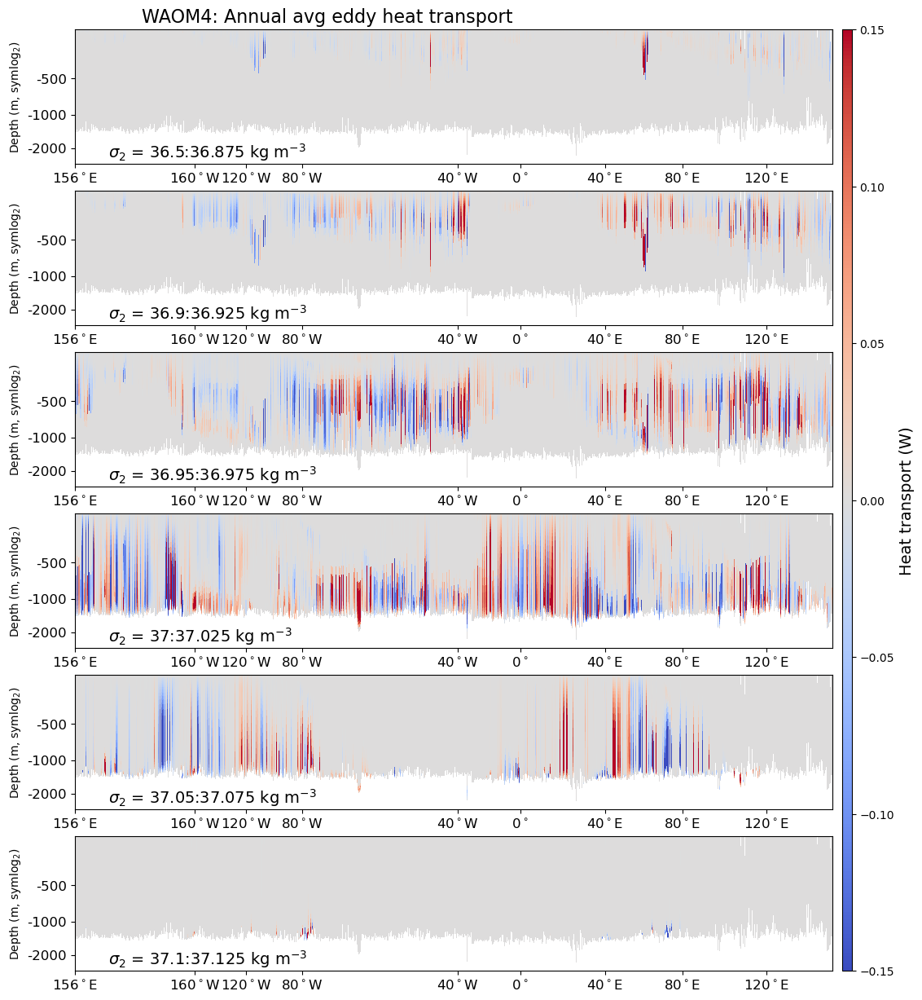

In [50]:
# Annual average for density-cross-1500m transports:
# WAOM4
fig, ax = plt.subplots(nrows=6, figsize = (12, 15))
#ax[0].text(17,75,'Day = ' + str(tt*5),fontsize=12)
## ax[0].text(2,75,'$\sigma_{\Theta}$ = ' +  str(round(rho_grid2[ll],2)),fontsize=12)
ax[0].text(2,75,'WAOM4: Annual avg eddy heat transport',fontsize=16)

ll=np.arange(26,28) #17 # 
cht = ax[0].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),np.nanmean(np.nansum(Eddy_HT_4km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[0].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[0].set_xlim(0, dist_along_4km[-1])
# ax[0].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
ax[0].text(1,-2500,'$\sigma_{2}$ = 36.5:36.875 kg m$^{-3}$',fontsize=14)
ax[0].set_yscale('symlog',base = 2, linthresh=700)
ax[0].set_ylabel('Depth (m, symlog$_2$)')
ax[0].set_yticklabels(['-2000','-1000','-500'])
ax[0].set_aspect('auto')
ax[0].tick_params(labelsize=12)

ll=np.arange(28,30) #18
cht = ax[1].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),np.nanmean(np.nansum(Eddy_HT_4km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[1].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[1].set_xlim(0, dist_along_4km[-1])
ax[1].text(1,-2500,'$\sigma_{2}$ = 36.9:36.925 kg m$^{-3}$',fontsize=14)
ax[1].set_yscale('symlog',base = 2, linthresh=700)
ax[1].set_ylabel('Depth (m, symlog$_2$)')
ax[1].set_yticklabels(['-2000','-1000','-500'])
ax[1].set_aspect('auto')
ax[1].tick_params(labelsize=12)

ll=np.arange(30,32) #19
cht = ax[2].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),np.nanmean(np.nansum(Eddy_HT_4km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[2].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[2].set_xlim(0, dist_along_4km[-1])
ax[2].text(1,-2500,'$\sigma_{2}$ = 36.95:36.975 kg m$^{-3}$',fontsize=14)
ax[2].set_yscale('symlog',base = 2, linthresh=700)
ax[2].set_ylabel('Depth (m, symlog$_2$)')
ax[2].set_yticklabels(['-2000','-1000','-500'])
ax[2].set_aspect('auto')
ax[2].tick_params(labelsize=12)

ll=np.arange(32,34) #20
cht = ax[3].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),np.nanmean(np.nansum(Eddy_HT_4km_irho2[:,ll,:,:], axis=1)*1e-12, axis=0), vmin=-.15, vmax=.15, cmap='coolwarm')
ax[3].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[3].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                            '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[3].set_xlim(0, dist_along_4km[-1])
ax[3].text(1,-2500,'$\sigma_{2}$ = 37:37.025 kg m$^{-3}$',fontsize=14)
ax[3].set_yscale('symlog',base = 2, linthresh=700)
ax[3].set_ylabel('Depth (m, symlog$_2$)')
ax[3].set_yticklabels(['-2000','-1000','-500'])
ax[3].set_aspect('auto')
ax[3].tick_params(labelsize=12)

ll=np.arange(34,36) #21
cht = ax[4].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),np.nanmean(np.nansum(Eddy_HT_4km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[4].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[4].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[4].set_xlim(0, dist_along_4km[-1])
ax[4].text(1,-2500,'$\sigma_{2}$ = 37.05:37.075 kg m$^{-3}$',fontsize=14)
ax[4].set_yscale('symlog',base = 2, linthresh=700)
ax[4].set_ylabel('Depth (m, symlog$_2$)')
ax[4].set_yticklabels(['-2000','-1000','-500'])
ax[4].set_aspect('auto')
ax[4].tick_params(labelsize=12)
 
ll=np.arange(36,38) #22
cht = ax[5].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),np.nanmean(np.nansum(Eddy_HT_4km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[5].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[5].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[5].set_xlim(0, dist_along_4km[-1])
ax[5].text(1,-2500,'$\sigma_{2}$ = 37.1:37.125 kg m$^{-3}$',fontsize=14)
ax[5].set_yscale('symlog',base = 2, linthresh=700)
ax[5].set_ylabel('Depth (m, symlog$_2$)')
ax[5].set_yticklabels(['-2000','-1000','-500'])
ax[5].set_aspect('auto')
ax[5].tick_params(labelsize=12)
 
cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
cb = plt.colorbar(cht, cax=cax1, orientation='vertical')
cb.ax.set_ylabel('Heat transport (W)', fontsize=14)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom4_Eddy_HT_cross1500m_rho2_annual_v4.png"
plt.savefig(name_fig, dpi=300)


#### WAOM 4, MEAN+EDDY HT

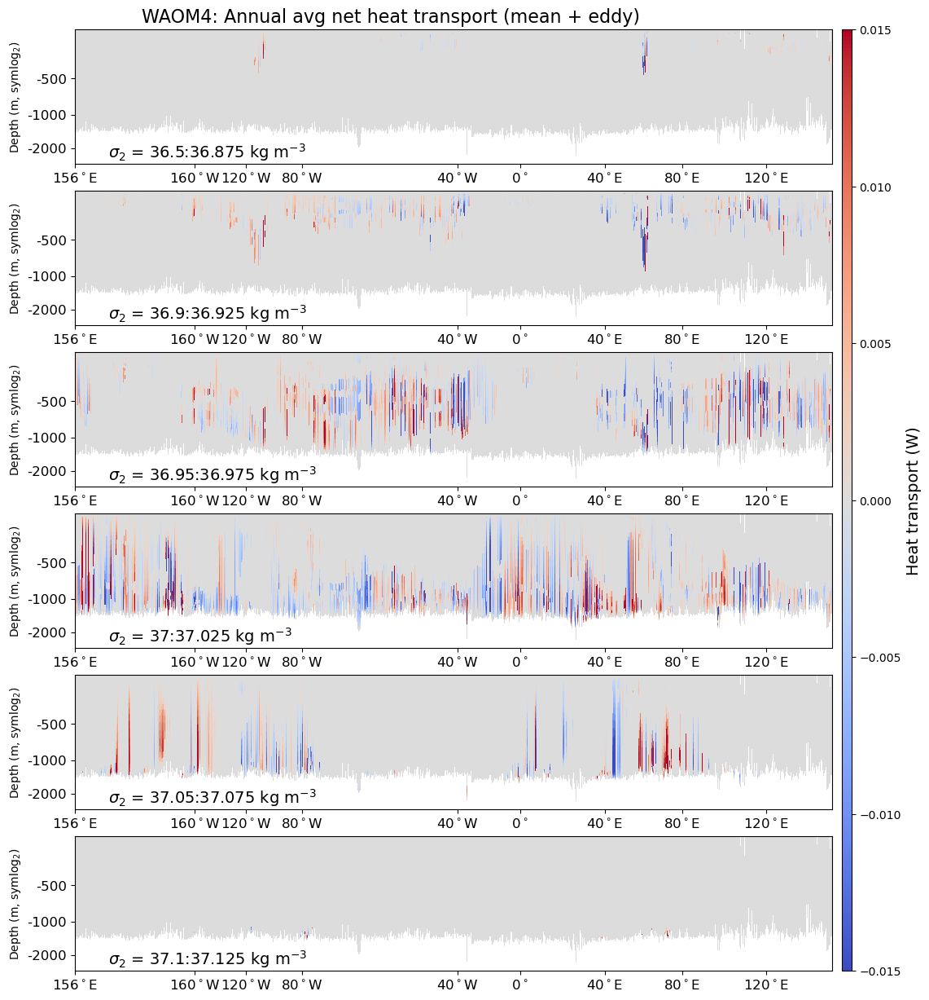

In [47]:
Net_HT_4km_irho2 = Mean_HT_4km_irho2 + Eddy_HT_4km_irho2
Net_HT_4km_irho2 = Net_HT_4km_irho2.transpose('ocean_time','rho_grid','s_rho','contour_index_array')

# Annual average for density-cross-1500m transports:
# WAOM10
fig, ax = plt.subplots(nrows=6, figsize = (12, 15))
#ax[0].text(17,75,'Day = ' + str(tt*5),fontsize=12)
## ax[0].text(2,75,'$\sigma_{\Theta}$ = ' +  str(round(rho_grid2[ll],2)),fontsize=12)
ax[0].text(2,75,'WAOM4: Annual avg net heat transport (mean + eddy)',fontsize=16)

ll=np.arange(26,28) #17 # 
cht = ax[0].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),\
                        np.nanmean(np.nansum(Net_HT_4km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015, cmap='coolwarm'))
ax[0].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[0].set_xlim(0, dist_along_4km[-1])
# ax[0].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
ax[0].text(1,-2500,'$\sigma_{2}$ = 36.5:36.875 kg m$^{-3}$',fontsize=14)
ax[0].set_yscale('symlog',base = 2, linthresh=700)
ax[0].set_ylabel('Depth (m, symlog$_2$)')
ax[0].set_yticklabels(['-2000','-1000','-500'])
ax[0].set_aspect('auto')
ax[0].tick_params(labelsize=12)

ll=np.arange(28,30) #18
cht = ax[1].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),\
                        np.nanmean(np.nansum(Net_HT_4km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015, cmap='coolwarm'))
ax[1].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[1].set_xlim(0, dist_along_4km[-1])
ax[1].text(1,-2500,'$\sigma_{2}$ = 36.9:36.925 kg m$^{-3}$',fontsize=14)
ax[1].set_yscale('symlog',base = 2, linthresh=700)
ax[1].set_ylabel('Depth (m, symlog$_2$)')
ax[1].set_yticklabels(['-2000','-1000','-500'])
ax[1].set_aspect('auto')
ax[1].tick_params(labelsize=12)

ll=np.arange(30,32) #19
cht = ax[2].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),\
                        np.nanmean(np.nansum(Net_HT_4km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015, cmap='coolwarm'))
ax[2].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[2].set_xlim(0, dist_along_4km[-1])
ax[2].text(1,-2500,'$\sigma_{2}$ = 36.95:36.975 kg m$^{-3}$',fontsize=14)
ax[2].set_yscale('symlog',base = 2, linthresh=700)
ax[2].set_ylabel('Depth (m, symlog$_2$)')
ax[2].set_yticklabels(['-2000','-1000','-500'])
ax[2].set_aspect('auto')
ax[2].tick_params(labelsize=12)

ll=np.arange(32,34) #20
cht = ax[3].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),\
                        np.nanmean(np.nansum(Net_HT_4km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015, cmap='coolwarm'))
ax[3].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[3].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                            '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[3].set_xlim(0, dist_along_4km[-1])
ax[3].text(1,-2500,'$\sigma_{2}$ = 37:37.025 kg m$^{-3}$',fontsize=14)
ax[3].set_yscale('symlog',base = 2, linthresh=700)
ax[3].set_ylabel('Depth (m, symlog$_2$)')
ax[3].set_yticklabels(['-2000','-1000','-500'])
ax[3].set_aspect('auto')
ax[3].tick_params(labelsize=12)

ll=np.arange(34,36) #21
cht = ax[4].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),\
                        np.nanmean(np.nansum(Net_HT_4km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015, cmap='coolwarm'))
ax[4].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[4].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[4].set_xlim(0, dist_along_4km[-1])
ax[4].text(1,-2500,'$\sigma_{2}$ = 37.05:37.075 kg m$^{-3}$',fontsize=14)
ax[4].set_yscale('symlog',base = 2, linthresh=700)
ax[4].set_ylabel('Depth (m, symlog$_2$)')
ax[4].set_yticklabels(['-2000','-1000','-500'])
ax[4].set_aspect('auto')
ax[4].tick_params(labelsize=12)
 
ll=np.arange(36,38) #22
cht = ax[5].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),\
                        np.nanmean(np.nansum(Net_HT_4km_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015, cmap='coolwarm'))
ax[5].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[5].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[5].set_xlim(0, dist_along_4km[-1])
ax[5].text(1,-2500,'$\sigma_{2}$ = 37.1:37.125 kg m$^{-3}$',fontsize=14)
ax[5].set_yscale('symlog',base = 2, linthresh=700)
ax[5].set_ylabel('Depth (m, symlog$_2$)')
ax[5].set_yticklabels(['-2000','-1000','-500'])
ax[5].set_aspect('auto')
ax[5].tick_params(labelsize=12)
 
cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
cb = plt.colorbar(cht, cax=cax1, orientation='vertical')
cb.ax.set_ylabel('Heat transport (W)', fontsize=14)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom4_Net_HT_cross1500m_rho2_annual_v4.png"
plt.savefig(name_fig, dpi=300)


## Plot section WAOM4-NOTIDE

#### WAOM 4, MEAN HT

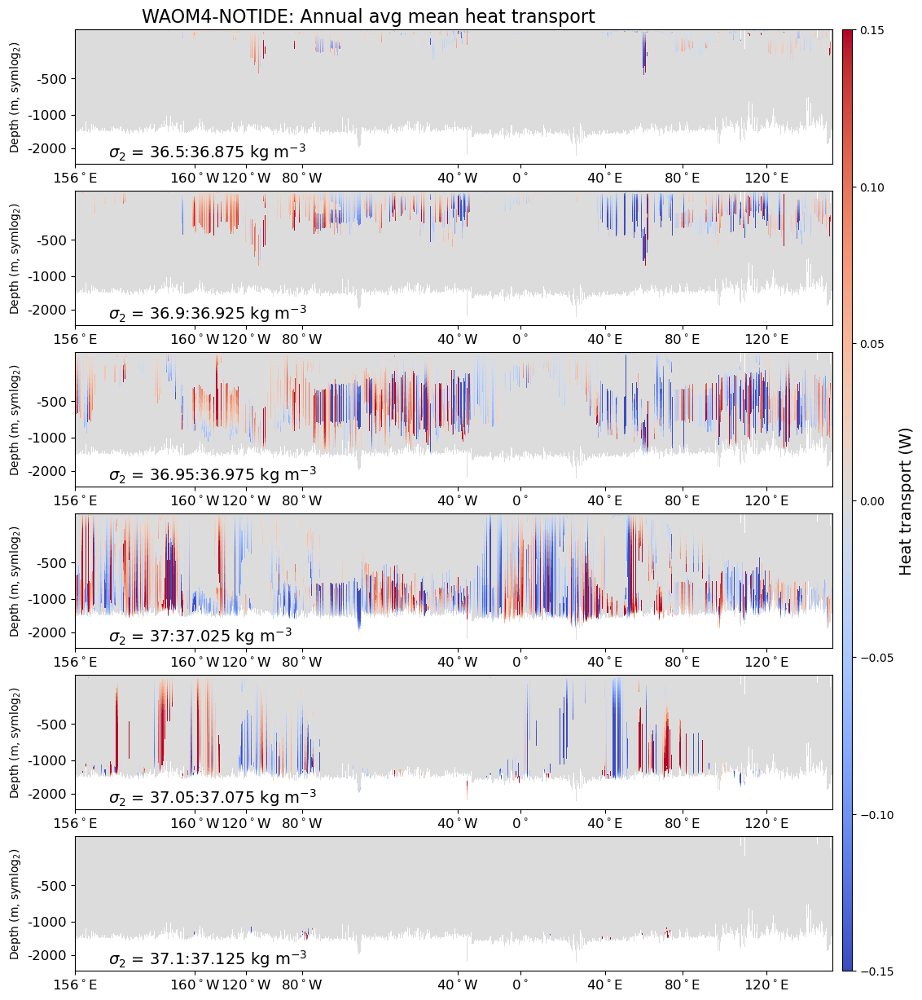

In [55]:
# Annual average for density-cross-1500m transports:
# WAOM4
fig, ax = plt.subplots(nrows=6, figsize = (12, 15))
#ax[0].text(17,75,'Day = ' + str(tt*5),fontsize=12)
## ax[0].text(2,75,'$\sigma_{\Theta}$ = ' +  str(round(rho_grid2[ll],2)),fontsize=12)
ax[0].text(2,75,'WAOM4-NOTIDE: Annual avg mean heat transport',fontsize=16)

ll=np.arange(26,28) #17 # 
cht = ax[0].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),np.nansum(Mean_HT_4kmNT_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[0].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[0].set_xlim(0, dist_along_4km[-1])
# ax[0].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
ax[0].text(1,-2500,'$\sigma_{2}$ = 36.5:36.875 kg m$^{-3}$',fontsize=14)
ax[0].set_yscale('symlog',base = 2, linthresh=700)
ax[0].set_ylabel('Depth (m, symlog$_2$)')
ax[0].set_yticklabels(['-2000','-1000','-500'])
ax[0].set_aspect('auto')
ax[0].tick_params(labelsize=12)

ll=np.arange(28,30) #18
cht = ax[1].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),np.nansum(Mean_HT_4kmNT_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[1].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[1].set_xlim(0, dist_along_4km[-1])
ax[1].text(1,-2500,'$\sigma_{2}$ = 36.9:36.925 kg m$^{-3}$',fontsize=14)
ax[1].set_yscale('symlog',base = 2, linthresh=700)
ax[1].set_ylabel('Depth (m, symlog$_2$)')
ax[1].set_yticklabels(['-2000','-1000','-500'])
ax[1].set_aspect('auto')
ax[1].tick_params(labelsize=12)

ll=np.arange(30,32) #19
cht = ax[2].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),np.nansum(Mean_HT_4kmNT_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[2].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[2].set_xlim(0, dist_along_4km[-1])
ax[2].text(1,-2500,'$\sigma_{2}$ = 36.95:36.975 kg m$^{-3}$',fontsize=14)
ax[2].set_yscale('symlog',base = 2, linthresh=700)
ax[2].set_ylabel('Depth (m, symlog$_2$)')
ax[2].set_yticklabels(['-2000','-1000','-500'])
ax[2].set_aspect('auto')
ax[2].tick_params(labelsize=12)

ll=np.arange(32,34) #20
cht = ax[3].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),np.nansum(Mean_HT_4kmNT_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[3].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[3].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                            '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[3].set_xlim(0, dist_along_4km[-1])
ax[3].text(1,-2500,'$\sigma_{2}$ = 37:37.025 kg m$^{-3}$',fontsize=14)
ax[3].set_yscale('symlog',base = 2, linthresh=700)
ax[3].set_ylabel('Depth (m, symlog$_2$)')
ax[3].set_yticklabels(['-2000','-1000','-500'])
ax[3].set_aspect('auto')
ax[3].tick_params(labelsize=12)

ll=np.arange(34,36) #21
cht = ax[4].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),np.nansum(Mean_HT_4kmNT_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[4].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[4].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[4].set_xlim(0, dist_along_4km[-1])
ax[4].text(1,-2500,'$\sigma_{2}$ = 37.05:37.075 kg m$^{-3}$',fontsize=14)
ax[4].set_yscale('symlog',base = 2, linthresh=700)
ax[4].set_ylabel('Depth (m, symlog$_2$)')
ax[4].set_yticklabels(['-2000','-1000','-500'])
ax[4].set_aspect('auto')
ax[4].tick_params(labelsize=12)
 
ll=np.arange(36,38) #22
cht = ax[5].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),np.nansum(Mean_HT_4kmNT_irho2[ll,:,:],  axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[5].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[5].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[5].set_xlim(0, dist_along_4km[-1])
ax[5].text(1,-2500,'$\sigma_{2}$ = 37.1:37.125 kg m$^{-3}$',fontsize=14)
ax[5].set_yscale('symlog',base = 2, linthresh=700)
ax[5].set_ylabel('Depth (m, symlog$_2$)')
ax[5].set_yticklabels(['-2000','-1000','-500'])
ax[5].set_aspect('auto')
ax[5].tick_params(labelsize=12)
 
cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
cb = plt.colorbar(cht, cax=cax1, orientation='vertical')
cb.ax.set_ylabel('Heat transport (W)', fontsize=14)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom4_notides_Mean_HT_cross1500m_rho2_annual_v4.png"
plt.savefig(name_fig, dpi=300)


#### WAOM 4, EDDY HT

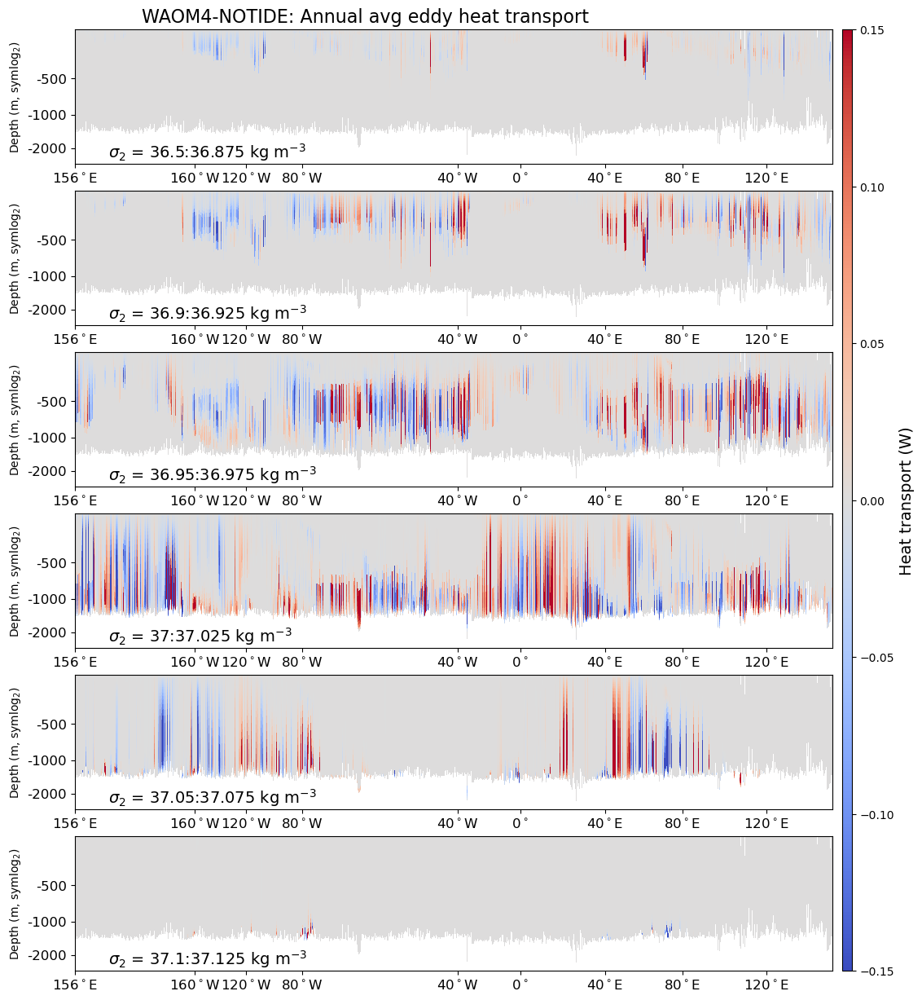

In [59]:
# Annual average for density-cross-1500m transports:
# WAOM4
fig, ax = plt.subplots(nrows=6, figsize = (12, 15))
#ax[0].text(17,75,'Day = ' + str(tt*5),fontsize=12)
## ax[0].text(2,75,'$\sigma_{\Theta}$ = ' +  str(round(rho_grid2[ll],2)),fontsize=12)
ax[0].text(2,75,'WAOM4-NOTIDE: Annual avg eddy heat transport',fontsize=16)

ll=np.arange(26,28) #17 # 
cht = ax[0].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[0].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[0].set_xlim(0, dist_along_4km[-1])
# ax[0].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
ax[0].text(1,-2500,'$\sigma_{2}$ = 36.5:36.875 kg m$^{-3}$',fontsize=14)
ax[0].set_yscale('symlog',base = 2, linthresh=700)
ax[0].set_ylabel('Depth (m, symlog$_2$)')
ax[0].set_yticklabels(['-2000','-1000','-500'])
ax[0].set_aspect('auto')
ax[0].tick_params(labelsize=12)

ll=np.arange(28,30) #18
cht = ax[1].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[1].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[1].set_xlim(0, dist_along_4km[-1])
ax[1].text(1,-2500,'$\sigma_{2}$ = 36.9:36.925 kg m$^{-3}$',fontsize=14)
ax[1].set_yscale('symlog',base = 2, linthresh=700)
ax[1].set_ylabel('Depth (m, symlog$_2$)')
ax[1].set_yticklabels(['-2000','-1000','-500'])
ax[1].set_aspect('auto')
ax[1].tick_params(labelsize=12)

ll=np.arange(30,32) #19
cht = ax[2].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[2].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[2].set_xlim(0, dist_along_4km[-1])
ax[2].text(1,-2500,'$\sigma_{2}$ = 36.95:36.975 kg m$^{-3}$',fontsize=14)
ax[2].set_yscale('symlog',base = 2, linthresh=700)
ax[2].set_ylabel('Depth (m, symlog$_2$)')
ax[2].set_yticklabels(['-2000','-1000','-500'])
ax[2].set_aspect('auto')
ax[2].tick_params(labelsize=12)

ll=np.arange(32,34) #20
cht = ax[3].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2[:,ll,:,:], axis=1)*1e-12, axis=0), vmin=-.15, vmax=.15, cmap='coolwarm')
ax[3].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[3].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                            '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[3].set_xlim(0, dist_along_4km[-1])
ax[3].text(1,-2500,'$\sigma_{2}$ = 37:37.025 kg m$^{-3}$',fontsize=14)
ax[3].set_yscale('symlog',base = 2, linthresh=700)
ax[3].set_ylabel('Depth (m, symlog$_2$)')
ax[3].set_yticklabels(['-2000','-1000','-500'])
ax[3].set_aspect('auto')
ax[3].tick_params(labelsize=12)

ll=np.arange(34,36) #21
cht = ax[4].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[4].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[4].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[4].set_xlim(0, dist_along_4km[-1])
ax[4].text(1,-2500,'$\sigma_{2}$ = 37.05:37.075 kg m$^{-3}$',fontsize=14)
ax[4].set_yscale('symlog',base = 2, linthresh=700)
ax[4].set_ylabel('Depth (m, symlog$_2$)')
ax[4].set_yticklabels(['-2000','-1000','-500'])
ax[4].set_aspect('auto')
ax[4].tick_params(labelsize=12)
 
ll=np.arange(36,38) #22
cht = ax[5].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),np.nanmean(np.nansum(Eddy_HT_4kmNT_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, vmin=-.15, vmax=.15, cmap='coolwarm')
ax[5].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[5].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[5].set_xlim(0, dist_along_4km[-1])
ax[5].text(1,-2500,'$\sigma_{2}$ = 37.1:37.125 kg m$^{-3}$',fontsize=14)
ax[5].set_yscale('symlog',base = 2, linthresh=700)
ax[5].set_ylabel('Depth (m, symlog$_2$)')
ax[5].set_yticklabels(['-2000','-1000','-500'])
ax[5].set_aspect('auto')
ax[5].tick_params(labelsize=12)
 
cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
cb = plt.colorbar(cht, cax=cax1, orientation='vertical')
cb.ax.set_ylabel('Heat transport (W)', fontsize=14)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom4-notides_Eddy_HT_cross1500m_rho2_annual_v4.png"
plt.savefig(name_fig, dpi=300)


#### WAOM 4, MEAN+EDDY HT

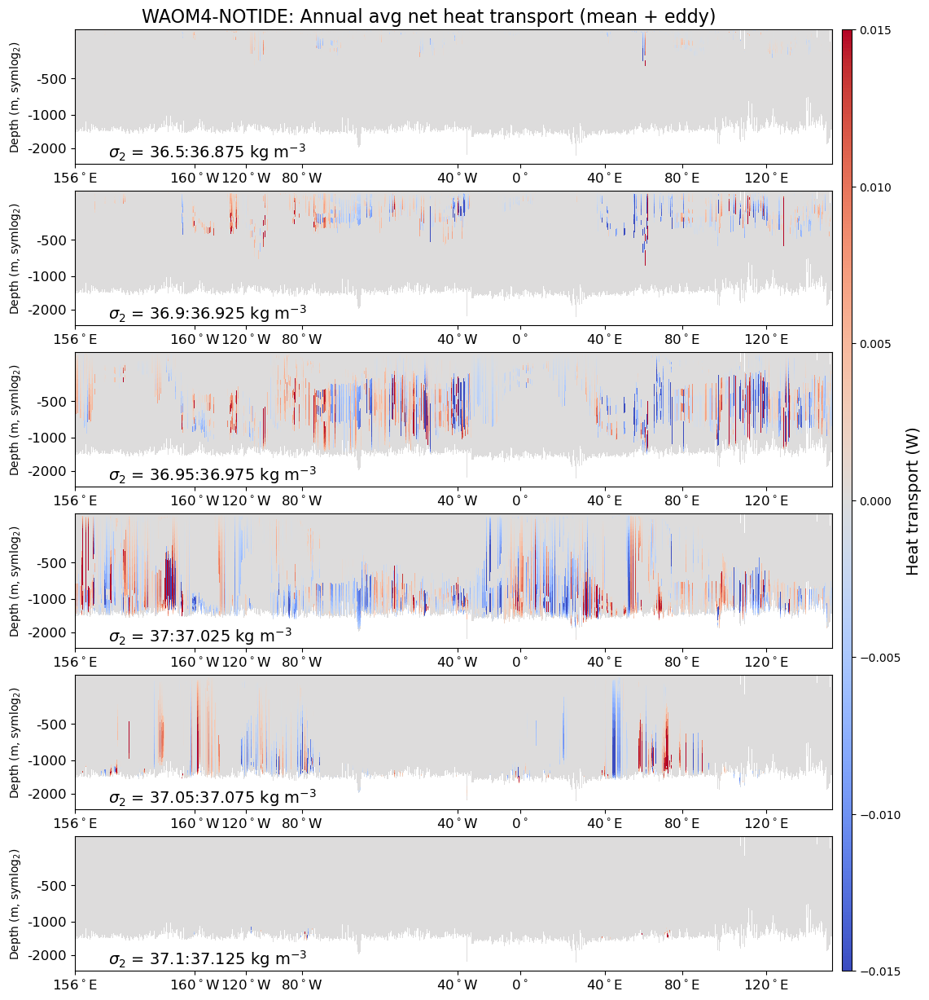

In [58]:
Net_HT_4kmNT_irho2 = Mean_HT_4kmNT_irho2 + Eddy_HT_4kmNT_irho2
Net_HT_4kmNT_irho2 = Net_HT_4kmNT_irho2.transpose('ocean_time','rho_grid','s_rho','contour_index_array')

# Annual average for density-cross-1500m transports:
# WAOM10
fig, ax = plt.subplots(nrows=6, figsize = (12, 15))
#ax[0].text(17,75,'Day = ' + str(tt*5),fontsize=12)
## ax[0].text(2,75,'$\sigma_{\Theta}$ = ' +  str(round(rho_grid2[ll],2)),fontsize=12)
ax[0].text(2,75,'WAOM4-NOTIDE: Annual avg net heat transport (mean + eddy)',fontsize=16)

ll=np.arange(26,28) #17 # 
cht = ax[0].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),\
                        np.nanmean(np.nansum(Net_HT_4kmNT_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015)
ax[0].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[0].set_xlim(0, dist_along_4km[-1])
# ax[0].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
ax[0].text(1,-2500,'$\sigma_{2}$ = 36.5:36.875 kg m$^{-3}$',fontsize=14)
ax[0].set_yscale('symlog',base = 2, linthresh=700)
ax[0].set_ylabel('Depth (m, symlog$_2$)')
ax[0].set_yticklabels(['-2000','-1000','-500'])
ax[0].set_aspect('auto')
ax[0].tick_params(labelsize=12)

ll=np.arange(28,30) #18
cht = ax[1].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),\
                        np.nanmean(np.nansum(Net_HT_4kmNT_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015)
ax[1].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[1].set_xlim(0, dist_along_4km[-1])
ax[1].text(1,-2500,'$\sigma_{2}$ = 36.9:36.925 kg m$^{-3}$',fontsize=14)
ax[1].set_yscale('symlog',base = 2, linthresh=700)
ax[1].set_ylabel('Depth (m, symlog$_2$)')
ax[1].set_yticklabels(['-2000','-1000','-500'])
ax[1].set_aspect('auto')
ax[1].tick_params(labelsize=12)

ll=np.arange(30,32) #19
cht = ax[2].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),\
                        np.nanmean(np.nansum(Net_HT_4kmNT_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015)
ax[2].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[2].set_xlim(0, dist_along_4km[-1])
ax[2].text(1,-2500,'$\sigma_{2}$ = 36.95:36.975 kg m$^{-3}$',fontsize=14)
ax[2].set_yscale('symlog',base = 2, linthresh=700)
ax[2].set_ylabel('Depth (m, symlog$_2$)')
ax[2].set_yticklabels(['-2000','-1000','-500'])
ax[2].set_aspect('auto')
ax[2].tick_params(labelsize=12)

ll=np.arange(32,34) #20
cht = ax[3].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),\
                        np.nanmean(np.nansum(Net_HT_4kmNT_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015)
ax[3].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[3].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                            '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[3].set_xlim(0, dist_along_4km[-1])
ax[3].text(1,-2500,'$\sigma_{2}$ = 37:37.025 kg m$^{-3}$',fontsize=14)
ax[3].set_yscale('symlog',base = 2, linthresh=700)
ax[3].set_ylabel('Depth (m, symlog$_2$)')
ax[3].set_yticklabels(['-2000','-1000','-500'])
ax[3].set_aspect('auto')
ax[3].tick_params(labelsize=12)

ll=np.arange(34,36) #21
cht = ax[4].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),\
                        np.nanmean(np.nansum(Net_HT_4kmNT_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015)
ax[4].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[4].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[4].set_xlim(0, dist_along_4km[-1])
ax[4].text(1,-2500,'$\sigma_{2}$ = 37.05:37.075 kg m$^{-3}$',fontsize=14)
ax[4].set_yscale('symlog',base = 2, linthresh=700)
ax[4].set_ylabel('Depth (m, symlog$_2$)')
ax[4].set_yticklabels(['-2000','-1000','-500'])
ax[4].set_aspect('auto')
ax[4].tick_params(labelsize=12)
 
ll=np.arange(36,38) #22
cht = ax[5].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4kmNT, axis=0),\
                        np.nanmean(np.nansum(Net_HT_4kmNT_irho2[:,ll,:,:], axis=1), axis=0)*1e-12, cmap='coolwarm',vmin=-.015, vmax=.015)
ax[5].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax[5].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                          '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax[5].set_xlim(0, dist_along_4km[-1])
ax[5].text(1,-2500,'$\sigma_{2}$ = 37.1:37.125 kg m$^{-3}$',fontsize=14)
ax[5].set_yscale('symlog',base = 2, linthresh=700)
ax[5].set_ylabel('Depth (m, symlog$_2$)')
ax[5].set_yticklabels(['-2000','-1000','-500'])
ax[5].set_aspect('auto')
ax[5].tick_params(labelsize=12)
 
cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
cb = plt.colorbar(cht, cax=cax1, orientation='vertical')
cb.ax.set_ylabel('Heat transport (W)', fontsize=14)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom4-notides_Net_HT_cross1500m_rho2_annual_v4.png"
plt.savefig(name_fig, dpi=300)


## Movies with different isopycnals:


### - WAOM10:

In [ ]:
# # Annual average for density-cross-1500m transports:
# # WAOM10

# for tt in range(0,365):
#     fig, ax = plt.subplots(nrows=6, figsize = (12, 15))
#     ax[0].text(17,75,'Day = ' + str(tt),fontsize=12)
#     ax[0].text(2,75,'Daily mean net heat transport (absolute - T$_f$)')

#     ll=17 # 
#     cht = ax[0].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),Net_heat_transport_4km_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[0].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[0].set_xlim(0, dist_along_4km[-1])
#     ax[0].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[0].set_yscale('symlog',base = 2, linthresh=700)
#     ax[0].set_ylabel('Depth (m, symlog$_2$)')
#     ax[0].set_yticklabels(['-2000','-1000','-500'])
#     ax[0].set_aspect('auto')
#     ax[0].tick_params(labelsize=12)

#     ll=18
#     cht = ax[1].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),Net_heat_transport_4km_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[1].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[1].set_xlim(0, dist_along_4km[-1])
#     ax[1].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[1].set_yscale('symlog',base = 2, linthresh=700)
#     ax[1].set_ylabel('Depth (m, symlog$_2$)')
#     ax[1].set_yticklabels(['-2000','-1000','-500'])
#     ax[1].set_aspect('auto')
#     ax[1].tick_params(labelsize=12)

#     ll=19
#     cht = ax[2].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),Net_heat_transport_4km_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[2].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[2].set_xlim(0, dist_along_4km[-1])
#     ax[2].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[2].set_yscale('symlog',base = 2, linthresh=700)
#     ax[2].set_ylabel('Depth (m, symlog$_2$)')
#     ax[2].set_yticklabels(['-2000','-1000','-500'])
#     ax[2].set_aspect('auto')
#     ax[2].tick_params(labelsize=12)

#     ll=20
#     cht = ax[3].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),Net_heat_transport_4km_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[3].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[3].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                                 '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[3].set_xlim(0, dist_along_4km[-1])
#     ax[3].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[3].set_yscale('symlog',base = 2, linthresh=700)
#     ax[3].set_ylabel('Depth (m, symlog$_2$)')
#     ax[3].set_yticklabels(['-2000','-1000','-500'])
#     ax[3].set_aspect('auto')
#     ax[3].tick_params(labelsize=12)

#     ll=21
#     cht = ax[4].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),Net_heat_transport_4km_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[4].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[4].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[4].set_xlim(0, dist_along_4km[-1])
#     ax[4].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[4].set_yscale('symlog',base = 2, linthresh=700)
#     ax[4].set_ylabel('Depth (m, symlog$_2$)')
#     ax[4].set_yticklabels(['-2000','-1000','-500'])
#     ax[4].set_aspect('auto')
#     ax[4].tick_params(labelsize=12)
 
#     ll=22
#     cht = ax[5].pcolormesh(dist_along_axis_4km,np.nanmean(z_rho_4km, axis=0),Net_heat_transport_4km_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[5].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[5].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[5].set_xlim(0, dist_along_4km[-1])
#     ax[5].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[5].set_yscale('symlog',base = 2, linthresh=700)
#     ax[5].set_ylabel('Depth (m, symlog$_2$)')
#     ax[5].set_yticklabels(['-2000','-1000','-500'])
#     ax[5].set_aspect('auto')
#     ax[5].tick_params(labelsize=12)
 
#     cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
#     cb = plt.colorbar(cht, cax=cax1, orientation='vertical')
#     cb.ax.set_ylabel('Heat transport (W)', fontsize=14)

#     name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom10_Net_heat_transp_rho2_tt=" + str(tt) + ".png"
#     plt.savefig(name_fig, dpi=300)
#     plt.close()

### - WAOM4:

In [29]:
# # Annual average for density-cross-1500m transports:
# # WAOM4

# for tt in range(0,365):
#     fig, ax = plt.subplots(nrows=6, figsize = (12, 15))
#     ax[0].text(17,75,'Day = ' + str(tt),fontsize=12)
#     ax[0].text(2,75,'Daily mean net heat transport (absolute - T$_f$)')

#     ll=17 # 
#     cht = ax[0].pcolormesh(dist_along_axis_4km,z_rho_4km,Net_heat_transport_4km_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[0].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[0].set_xlim(0, dist_along_4km[-1])
#     ax[0].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[0].set_yscale('symlog',base = 2, linthresh=700)
#     ax[0].set_ylabel('Depth (m, symlog$_2$)')
#     ax[0].set_yticklabels(['-2000','-1000','-500'])
#     ax[0].set_aspect('auto')
#     ax[0].tick_params(labelsize=12)

#     ll=18
#     cht = ax[1].pcolormesh(dist_along_axis_4km,z_rho_4km,Net_heat_transport_4km_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[1].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[1].set_xlim(0, dist_along_4km[-1])
#     ax[1].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[1].set_yscale('symlog',base = 2, linthresh=700)
#     ax[1].set_ylabel('Depth (m, symlog$_2$)')
#     ax[1].set_yticklabels(['-2000','-1000','-500'])
#     ax[1].set_aspect('auto')
#     ax[1].tick_params(labelsize=12)

#     ll=19
#     cht = ax[2].pcolormesh(dist_along_axis_4km,z_rho_4km,Net_heat_transport_4km_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[2].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[2].set_xlim(0, dist_along_4km[-1])
#     ax[2].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[2].set_yscale('symlog',base = 2, linthresh=700)
#     ax[2].set_ylabel('Depth (m, symlog$_2$)')
#     ax[2].set_yticklabels(['-2000','-1000','-500'])
#     ax[2].set_aspect('auto')
#     ax[2].tick_params(labelsize=12)

#     ll=20
#     cht = ax[3].pcolormesh(dist_along_axis_4km,z_rho_4km,Net_heat_transport_4km_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[3].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[3].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                                 '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[3].set_xlim(0, dist_along_4km[-1])
#     ax[3].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[3].set_yscale('symlog',base = 2, linthresh=700)
#     ax[3].set_ylabel('Depth (m, symlog$_2$)')
#     ax[3].set_yticklabels(['-2000','-1000','-500'])
#     ax[3].set_aspect('auto')
#     ax[3].tick_params(labelsize=12)

#     ll=21
#     cht = ax[4].pcolormesh(dist_along_axis_4km,z_rho_4km,Net_heat_transport_4km_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[4].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[4].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[4].set_xlim(0, dist_along_4km[-1])
#     ax[4].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[4].set_yscale('symlog',base = 2, linthresh=700)
#     ax[4].set_ylabel('Depth (m, symlog$_2$)')
#     ax[4].set_yticklabels(['-2000','-1000','-500'])
#     ax[4].set_aspect('auto')
#     ax[4].tick_params(labelsize=12)
 
#     ll=22
#     cht = ax[5].pcolormesh(dist_along_axis_4km,z_rho_4km,Net_heat_transport_4km_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[5].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[5].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[5].set_xlim(0, dist_along_4km[-1])
#     ax[5].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[5].set_yscale('symlog',base = 2, linthresh=700)
#     ax[5].set_ylabel('Depth (m, symlog$_2$)')
#     ax[5].set_yticklabels(['-2000','-1000','-500'])
#     ax[5].set_aspect('auto')
#     ax[5].tick_params(labelsize=12)
 
#     cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
#     cb = plt.colorbar(cht, cax=cax1, orientation='vertical')
#     cb.ax.set_ylabel('Heat transport (W)', fontsize=14)

#     name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom4_Net_heat_transp_rho2_tt=" + str(tt) + ".png"
#     plt.savefig(name_fig, dpi=300)
#     plt.close()

### - WAOM4-NOTIDE:

In [30]:
# # Annual average for density-cross-1500m transports:
# # WAOM4-NOTIDE

# for tt in range(0,365):
#     fig, ax = plt.subplots(nrows=6, figsize = (12, 15))
#     ax[0].text(17,75,'Day = ' + str(tt),fontsize=12)
#     ax[0].text(2,75,'Daily mean net heat transport (absolute - T$_f$)')

#     ll=17 # 
#     cht = ax[0].pcolormesh(dist_along_axis_4km,z_rho_4km,Net_heat_transport_4kmNT_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[0].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[0].set_xlim(0, dist_along_4km[-1])
#     ax[0].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[0].set_yscale('symlog',base = 2, linthresh=700)
#     ax[0].set_ylabel('Depth (m, symlog$_2$)')
#     ax[0].set_yticklabels(['-2000','-1000','-500'])
#     ax[0].set_aspect('auto')
#     ax[0].tick_params(labelsize=12)

#     ll=18
#     cht = ax[1].pcolormesh(dist_along_axis_4km,z_rho_4km,Net_heat_transport_4kmNT_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[1].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[1].set_xlim(0, dist_along_4km[-1])
#     ax[1].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[1].set_yscale('symlog',base = 2, linthresh=700)
#     ax[1].set_ylabel('Depth (m, symlog$_2$)')
#     ax[1].set_yticklabels(['-2000','-1000','-500'])
#     ax[1].set_aspect('auto')
#     ax[1].tick_params(labelsize=12)

#     ll=19
#     cht = ax[2].pcolormesh(dist_along_axis_4km,z_rho_4km,Net_heat_transport_4kmNT_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[2].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[2].set_xlim(0, dist_along_4km[-1])
#     ax[2].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[2].set_yscale('symlog',base = 2, linthresh=700)
#     ax[2].set_ylabel('Depth (m, symlog$_2$)')
#     ax[2].set_yticklabels(['-2000','-1000','-500'])
#     ax[2].set_aspect('auto')
#     ax[2].tick_params(labelsize=12)

#     ll=20
#     cht = ax[3].pcolormesh(dist_along_axis_4km,z_rho_4km,Net_heat_transport_4kmNT_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[3].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[3].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                                 '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[3].set_xlim(0, dist_along_4km[-1])
#     ax[3].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[3].set_yscale('symlog',base = 2, linthresh=700)
#     ax[3].set_ylabel('Depth (m, symlog$_2$)')
#     ax[3].set_yticklabels(['-2000','-1000','-500'])
#     ax[3].set_aspect('auto')
#     ax[3].tick_params(labelsize=12)

#     ll=21
#     cht = ax[4].pcolormesh(dist_along_axis_4km,z_rho_4km,Net_heat_transport_4kmNT_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[4].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[4].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[4].set_xlim(0, dist_along_4km[-1])
#     ax[4].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[4].set_yscale('symlog',base = 2, linthresh=700)
#     ax[4].set_ylabel('Depth (m, symlog$_2$)')
#     ax[4].set_yticklabels(['-2000','-1000','-500'])
#     ax[4].set_aspect('auto')
#     ax[4].tick_params(labelsize=12)
 
#     ll=22
#     cht = ax[5].pcolormesh(dist_along_axis_4km,z_rho_4km,Net_heat_transport_4kmNT_irho2[tt,ll,:,:], vmin=-.5e12 , vmax=.5e12, cmap='coolwarm')
#     ax[5].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[5].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[5].set_xlim(0, dist_along_4km[-1])
#     ax[5].text(1,-2500,'$\sigma_{2} = $' +  str(round(rho_grid2[ll],2)) + ' kg m$^{-3}$',fontsize=14)
#     ax[5].set_yscale('symlog',base = 2, linthresh=700)
#     ax[5].set_ylabel('Depth (m, symlog$_2$)')
#     ax[5].set_yticklabels(['-2000','-1000','-500'])
#     ax[5].set_aspect('auto')
#     ax[5].tick_params(labelsize=12)
 
#     cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
#     cb = plt.colorbar(cht, cax=cax1, orientation='vertical')
#     cb.ax.set_ylabel('Heat transport (W)', fontsize=14)

#     name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom4-notides_Net_heat_transp_rho2_tt=" + str(tt) + ".png"
#     plt.savefig(name_fig, dpi=300)
#     plt.close()

### movies for T/S/dens sections:

In [31]:
# %%time
# # Movie for density/temperature/salinity: WAOM10

# for tt in np.arange(0,365):
#     fig, ax = plt.subplots(nrows=3, figsize = (12, 9))

#     ax[0].text(17,75,'Day = ' + str(tt),fontsize=12)
        
#     cst = ax[0].pcolormesh(dist_along_axis_4km,z_rho_4km[tt,:,:],sigma_2_4km[tt,:,:], vmin=36.7 , vmax=37.1, cmap='tab20c')
#     ax[0].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$','40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[0].set_xlim(0, dist_along_4km[-1])
#     ax[0].text(1,-2500,'Pot. density ($\sigma_{2}$)',fontsize=14)
#     fig.colorbar(cst, ax=ax[0])
#     ax[0].set_yscale('symlog',base = 2, linthresh=700)
#     ax[0].set_ylabel('Depth (m, symlog$_2$)',fontsize=12)
#     ax[0].set_yticklabels(['-2000','-1000','-500'])
#     ax[0].set_aspect('auto')
#     ax[0].tick_params(labelsize=12)

#     ct = ax[1].pcolormesh(dist_along_axis_4km,z_rho_4km[tt,:,:],temp_4km[tt,:,:], vmin=-2 , vmax=2, cmap='tab20c')
#     ax[1].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$','40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[1].set_xlim(0, dist_along_4km[-1])
#     ax[1].text(1,-2500,'Pot. temperature',fontsize=14)
#     fig.colorbar(ct, ax=ax[1])
#     ax[1].set_yscale('symlog',base = 2, linthresh=700)
#     ax[1].set_ylabel('Depth (m, symlog$_2$)',fontsize=12)
#     ax[1].set_yticklabels(['-2000','-1000','-500'])
#     ax[1].set_aspect('auto')
#     ax[1].tick_params(labelsize=12)

#     cs = ax[2].pcolormesh(dist_along_axis_4km,z_rho_4km[tt,:,:],salt_4km[tt,:,:], vmin=34 , vmax=35, cmap='tab20c')
#     ax[2].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$','40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[2].set_xlim(0, dist_along_4km[-1])
#     ax[2].text(1,-2500,'Salinity',fontsize=14)
#     fig.colorbar(cs, ax=ax[2])
#     ax[2].set_yscale('symlog',base = 2, linthresh=700)
#     ax[2].set_ylabel('Depth (m, symlog$_2$)',fontsize=12)
#     ax[2].set_yticklabels(['-2000','-1000','-500'])
#     ax[2].set_aspect('auto')
#     ax[2].tick_params(labelsize=12)

#     name_fig="/g/data3/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom10_sig2_temp_salt_tt=" + str(tt) + ".png"
#     plt.savefig(name_fig, dpi=300)
#     plt.close()

In [32]:
# %%time
# # Movie for density/temperature/salinity: WAOM4

# for tt in np.arange(0,365):
#     fig, ax = plt.subplots(nrows=3, figsize = (12, 9))

#     ax[0].text(17,75,'Day = ' + str(tt),fontsize=12)
        
#     cst = ax[0].pcolormesh(dist_along_axis_4km,z_rho_4km,sigma_2_4km[tt,:,:], vmin=36.7 , vmax=37.1, cmap='tab20c')
#     ax[0].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$','40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[0].set_xlim(0, dist_along_4km[-1])
#     ax[0].text(1,-2500,'Pot. density ($\sigma_{2}$)',fontsize=14)
#     fig.colorbar(cst, ax=ax[0])
#     ax[0].set_yscale('symlog',base = 2, linthresh=700)
#     ax[0].set_ylabel('Depth (m, symlog$_2$)',fontsize=12)
#     ax[0].set_yticklabels(['-2000','-1000','-500'])
#     ax[0].set_aspect('auto')
#     ax[0].tick_params(labelsize=12)

#     ct = ax[1].pcolormesh(dist_along_axis_4km,z_rho_4km,temp_4km[tt,:,:], vmin=-2 , vmax=2, cmap='tab20c')
#     ax[1].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$','40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[1].set_xlim(0, dist_along_4km[-1])
#     ax[1].text(1,-2500,'Pot. temperature',fontsize=14)
#     fig.colorbar(ct, ax=ax[1])
#     ax[1].set_yscale('symlog',base = 2, linthresh=700)
#     ax[1].set_ylabel('Depth (m, symlog$_2$)',fontsize=12)
#     ax[1].set_yticklabels(['-2000','-1000','-500'])
#     ax[1].set_aspect('auto')
#     ax[1].tick_params(labelsize=12)

#     cs = ax[2].pcolormesh(dist_along_axis_4km,z_rho_4km,salt_4km[tt,:,:], vmin=34 , vmax=35, cmap='tab20c')
#     ax[2].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$','40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[2].set_xlim(0, dist_along_4km[-1])
#     ax[2].text(1,-2500,'Salinity',fontsize=14)
#     fig.colorbar(cs, ax=ax[2])
#     ax[2].set_yscale('symlog',base = 2, linthresh=700)
#     ax[2].set_ylabel('Depth (m, symlog$_2$)',fontsize=12)
#     ax[2].set_yticklabels(['-2000','-1000','-500'])
#     ax[2].set_aspect('auto')
#     ax[2].tick_params(labelsize=12)

#     name_fig="/g/data3/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom4_sig2_temp_salt_tt=" + str(tt) + ".png"
#     plt.savefig(name_fig, dpi=300)
#     plt.close()

In [33]:
# %%time
# # Movie for density/temperature/salinity: WAOM4-NOTIDE

# for tt in np.arange(0,365):
#     fig, ax = plt.subplots(nrows=3, figsize = (12, 9))

#     ax[0].text(17,75,'Day = ' + str(tt),fontsize=12)
        
#     cst = ax[0].pcolormesh(dist_along_axis_4km,z_rho_4km,sigma_2_4kmNT[tt,:,:], vmin=36.7 , vmax=37.1, cmap='tab20c')
#     ax[0].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[0].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$','40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[0].set_xlim(0, dist_along_4km[-1])
#     ax[0].text(1,-2500,'Pot. density ($\sigma_{2}$)',fontsize=14)
#     fig.colorbar(cst, ax=ax[0])
#     ax[0].set_yscale('symlog',base = 2, linthresh=700)
#     ax[0].set_ylabel('Depth (m, symlog$_2$)',fontsize=12)
#     ax[0].set_yticklabels(['-2000','-1000','-500'])
#     ax[0].set_aspect('auto')
#     ax[0].tick_params(labelsize=12)

#     ct = ax[1].pcolormesh(dist_along_axis_4km,z_rho_4km,temp_4kmNT[tt,:,:], vmin=-2 , vmax=2, cmap='tab20c')
#     ax[1].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[1].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$','40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[1].set_xlim(0, dist_along_4km[-1])
#     ax[1].text(1,-2500,'Pot. temperature',fontsize=14)
#     fig.colorbar(ct, ax=ax[1])
#     ax[1].set_yscale('symlog',base = 2, linthresh=700)
#     ax[1].set_ylabel('Depth (m, symlog$_2$)',fontsize=12)
#     ax[1].set_yticklabels(['-2000','-1000','-500'])
#     ax[1].set_aspect('auto')
#     ax[1].tick_params(labelsize=12)

#     cs = ax[2].pcolormesh(dist_along_axis_4km,z_rho_4km,salt_4kmNT[tt,:,:], vmin=34 , vmax=35, cmap='tab20c')
#     ax[2].set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
#     ax[2].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$','40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[2].set_xlim(0, dist_along_4km[-1])
#     ax[2].text(1,-2500,'Salinity',fontsize=14)
#     fig.colorbar(cs, ax=ax[2])
#     ax[2].set_yscale('symlog',base = 2, linthresh=700)
#     ax[2].set_ylabel('Depth (m, symlog$_2$)',fontsize=12)
#     ax[2].set_yticklabels(['-2000','-1000','-500'])
#     ax[2].set_aspect('auto')
#     ax[2].tick_params(labelsize=12)

#     name_fig="/g/data3/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom4-notides_sig2_temp_salt_tt=" + str(tt) + ".png"
#     plt.savefig(name_fig, dpi=300)
#     plt.close()

## Doing some TS-diagrams:

In [118]:
# make grid for density contours
smin = 30 - (0.01 * 30)    #salt_ctrl_subregR.min - (0.01 * salt_ctrl_subregR.min)
smax = 36. + (0.01 * 36.)    #salt_ctrl_subregR.max + (0.01 * salt_ctrl_subregR.max)
tmin = -4. + (0.1 * -4.)       #temp_ctrl_subregR.min - (0.1 * temp_ctrl_subregR.max)
tmax = 5 + (0.1 * 5.)       #temp_ctrl_subregR.max + (0.1 * temp_ctrl_subregR.max)
print('tmin, tmax, smin, smax sizes=,', tmin, tmax, smin, smax)
# Calculate how many gridcells we need in the x and y dimensions
xdim = 30
ydim = 20
# Create empty grid of zeros
dens = np.zeros((ydim,xdim))
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(-4,5,ydim)
si = np.linspace(30,36,xdim)

Si, Ti = np.meshgrid(si, ti, sparse=False, indexing='ij')
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        dens[j,i]=gsw.rho(si[i],ti[j],2000) # sigma-2000
# Substract 1000 to convert to sigma-2
dens = dens - 1000

tmin, tmax, smin, smax sizes=, -4.4 5.5 29.7 36.36


ValueError: 'c' argument has 79782065 elements, which is inconsistent with 'x' and 'y' with size 218581.

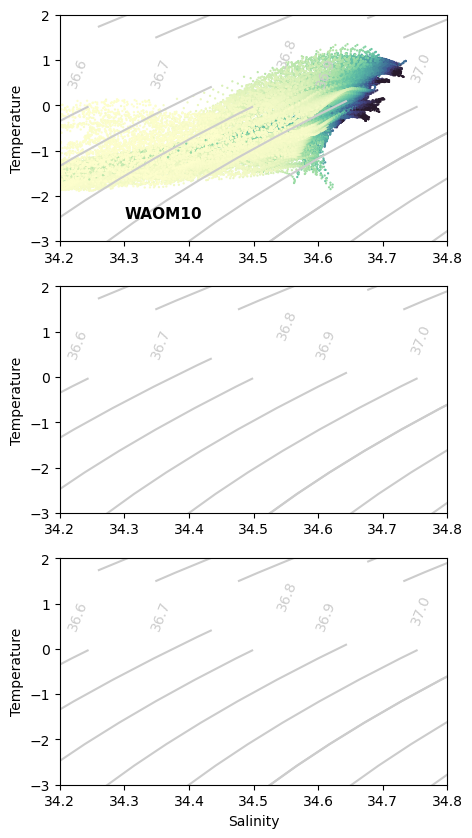

In [119]:
import cmocean

fig, ax = plt.subplots(nrows=3, figsize = (5, 10))
# normal isopycnals
for aa in range(0,3):
    CS1 = ax[aa].contour(Si,Ti,dens.transpose(), levels=np.arange(35.5,37.2,.1),linestyles='solid', colors=[(.8,0.8,0.8)], linewidth=0.1)
    ax[aa].clabel(CS1, CS1.levels, inline=True, fontsize=10)
    CS2 = ax[aa].contour(Si,Ti,dens.transpose(), levels=np.arange(37.2,38,.1),linestyles='solid', colors=[(.8,0.8,0.8)], linewidth=0.1)
    ax[aa].clabel(CS2, CS2.levels, inline=True, fontsize=10)
    # specific isopycnals
    # cc1 = ax[aa].contour(Si,Ti,dens.transpose(), levels=[36.85],linestyles='solid', colors='darkgrey', linewidth=0.1)
    # ax[aa].clabel(cc1, cc1.levels, inline=True, fontsize=10)
    # cc2 = ax[aa].contour(Si,Ti,dens.transpose(), levels=[36.9],linestyles='solid', colors='khaki', linewidth=0.1)
    # ax[aa].clabel(cc2, cc2.levels, inline=True, fontsize=10)
    # cc3 = ax[aa].contour(Si,Ti,dens.transpose(), levels=[36.95],linestyles='solid', colors='aqua', linewidth=0.1)
    # ax[aa].clabel(cc3, cc3.levels, inline=True, fontsize=10)
    # cc4 = ax[aa].contour(Si,Ti,dens.transpose(), levels=[37.0],linestyles='solid', colors='steelblue', linewidth=0.1)
    # ax[aa].clabel(cc4, cc4.levels, inline=True, fontsize=10)
    # cc5 = ax[aa].contour(Si,Ti,dens.transpose(), levels=[37.05],linestyles='solid', colors='darkorange', linewidth=0.1)
    # ax[aa].clabel(cc5, cc5.levels, inline=True, fontsize=10)
    # cc6 = ax[aa].contour(Si,Ti,dens.transpose(), levels=[37.1],linestyles='solid', colors='limegreen', linewidth=0.1)
    # ax[aa].clabel(cc6, cc6.levels, inline=True, fontsize=10)
    ax[aa].set_xlim([34.2,34.8])
    ax[aa].set_ylim([-3,2])
    ax[aa].set_ylabel('Temperature')
    if aa == 2:
        ax[aa].set_xlabel('Salinity')
        
sc = ax[0].scatter(np.nanmean(salt_4km,axis=0),np.nanmean(temp_4km,axis=0),
                 c=-np.nanmean(z_rho_4km,axis=0),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[0].text(34.3,-2.5,'WAOM10', fontsize=11, fontweight='bold')

sc = ax[1].scatter(np.nanmean(salt_4km,axis=0),np.nanmean(temp_4km,axis=0),
                 c=-z_rho_4km,marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[1].text(34.3,-2.5,'WAOM4', fontsize=11, fontweight='bold')

sc = ax[2].scatter(np.nanmean(salt_4kmNT,axis=0),np.nanmean(temp_4kmNT,axis=0),
                 c=-z_rho_4km,marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[2].text(34.3,-2.5,'WAOM4-NOTIDE', fontsize=11, fontweight='bold')

# - cbar horiz
# cbar_ax1 = fig.add_axes([0.12, 0.005, 0.785, 0.01])
# fig.colorbar(sc, cax=cbar_ax1, orientation='horizontal')
# cbar_ax1.set_xlabel('Depth (m)')
# - cbar vert
cbar_ax1 = fig.add_axes([0.8, 0.3, 0.01, 0.6])
fig.colorbar(sc, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('Depth (m)')

plt.subplots_adjust(left=0.25, right=0.75, bottom=0.3, top=0.9)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom10x4x4NT_TSdiag_1500m_rho2_annnual.png"
plt.savefig(name_fig, bbox_inches='tight', dpi=300)

In [120]:
Mean_HT_4km_irho2.shape

(365, 48, 31, 2688)

In [53]:
print(fig_path)

/g/data3/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/


NameError: name 'Sum_MeanHT_4km_CF_sigma2' is not defined

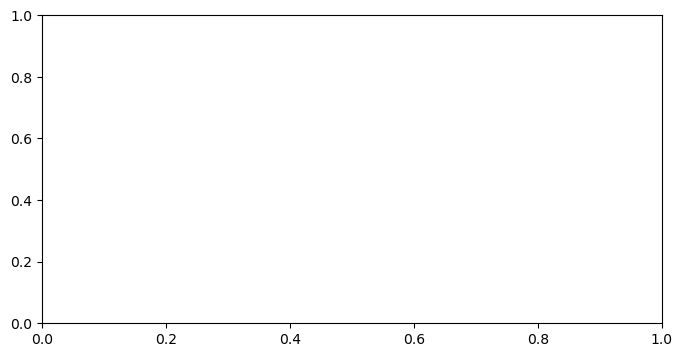

In [62]:
fig, ax = plt.subplots(ncols=1, figsize = (8, 4))

# multiplying by -1 to match vol transp
ax.plot(rho_grid2,-Sum_MeanHT_4km_CF_sigma2*rho0*Cp*1e-12,'--r', label='WAOM10')
ax.plot(rho_grid2,-Sum_MeanHT_4km_CF_sigma2*rho0*Cp*1e-12,'--b', label='WAOM4')
ax.plot(rho_grid2,-Sum_MeanHT_4kmNT_CF_sigma2*rho0*Cp*1e-12,'--c', label='WAOM4-NOTIDE')
ax.legend()
ax.plot(rho_grid2,-Sum_EddyHT_4km_CF_sigma2*rho0*Cp*1e-12,':r', label='WAOM10')
ax.plot(rho_grid2,-Sum_EddyHT_4km_CF_sigma2*rho0*Cp*1e-12,':b', label='WAOM4')
ax.plot(rho_grid2,-Sum_EddyHT_4kmNT_CF_sigma2*rho0*Cp*1e-12,':c', label='WAOM4-NOTIDE')
ax.plot(rho_grid2,-(Sum_MeanHT_4km_CF_sigma2+Sum_EddyHT_4km_sigma2)*rho0*Cp*1e-12,'-r', label='WAOM10')
ax.plot(rho_grid2,-(Sum_MeanHT_4km_CF_sigma2+Sum_EddyHT_4km_sigma2)*rho0*Cp*1e-12,'-b', label='WAOM4')
ax.plot(rho_grid2,-(Sum_MeanHT_4kmNT_CF_sigma2+Sum_EddyHT_4kmNT_sigma2)*rho0*Cp*1e-12,'-c', label='WAOM4-NOTIDE')
ax.grid()
ax.set_xlim(36.6,37.35)
ax.set_ylim(-25,25)

ax.set_ylabel('Net heat transport (TW)')# (Abs-T$_{f}$, 10$^{15}$W'])
ax.set_xlabel('Pot. density ($\sigma_2$)')

name_fig='WAOM10x4x4NT_Cross-CF_sumtransport_Sigma2bin_MeanEddyHT_vint_annual_v2.png'
plt.savefig(fig_path + name_fig, bbox_inches='tight', dpi=300)
plt.show()


In [ ]:
np.around(rho_grid2[33],2)


In [ ]:
rho_grid2

NameError: name 'Sum_MeanHT_10km_sigma2' is not defined

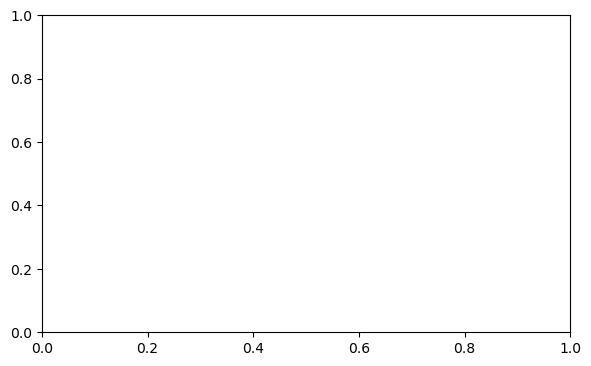

In [85]:
# FIGURE 2: CROSS-1500M HEAT TRANSPORT PER DENSITY! 2 rows, 3 columns
# 1) Circum-Ant. Cross-1500m heat transport per density classes (row 1, col 1)
# 2) TS-diagram WAOM4 (row 1, col 2)
# 3) net cross-1500 HT integrated for densities >= 37 sig2 (row 2, col 1:2)
# 4) mean/eddy decom. cross-1500 HT depth-int. for densities >= 37 sig2 (row 3, col 1:2)

fig = plt.figure(figsize=(15,14))

# 
# 1)
# NET
ax1 = fig.add_subplot(3,2,1)
ax1.plot(rho_grid2,(Sum_MeanHT_4km_sigma2+Sum_EddyHT_4km_sigma2)* rho0*Cp*1e-12,'--k', label='WAOM10',linewidth=1,alpha=.7)
ax1.plot(rho_grid2,(Sum_MeanHT_4km_sigma2+Sum_EddyHT_4km_sigma2)* rho0*Cp*1e-12,'-k', label='WAOM4',linewidth=1.6)
ax1.plot(rho_grid2,(Sum_MeanHT_4kmNT_sigma2+Sum_EddyHT_4kmNT_sigma2)* rho0*Cp*1e-12,':k', label='WAOM4-NOTIDE',linewidth=1,alpha=.7)
ax1.legend(loc='upper left')
ax1b = ax1.twiny()
ax1b.plot(rho_grid2[0],(Sum_MeanHT_4km_sigma2[0]+Sum_EddyHT_4km_sigma2[0])* rho0*Cp*1e-12,'-k', label='NET',linewidth=1.6)
ax1b.plot(rho_grid2,Sum_MeanHT_4km_sigma2* rho0*Cp*1e-12,'-',color='dodgerblue', label='ADV',linewidth=1.6)
ax1b.plot(rho_grid2,Sum_EddyHT_4km_sigma2* rho0*Cp*1e-12,'-', color='orangered', label='EIT',linewidth=1.6)

ax1b.plot(rho_grid2,Sum_MeanHT_4km_sigma2* rho0*Cp*1e-12,'--',color='dodgerblue',linewidth=1,alpha=.6)
ax1b.plot(rho_grid2,Sum_EddyHT_4km_sigma2* rho0*Cp*1e-12,'--',color='orangered',linewidth=1,alpha=.6)
ax1b.plot(rho_grid2,Sum_MeanHT_4kmNT_sigma2* rho0*Cp*1e-12,':',color='dodgerblue',linewidth=1,alpha=.6)
ax1b.plot(rho_grid2,Sum_EddyHT_4kmNT_sigma2* rho0*Cp*1e-12,':', color='orangered',linewidth=1,alpha=.6)
# line at 37.02 sig2
ax1.plot(np.around(rho_grid2[33],2)*np.ones(np.arange(-100,100).shape)\
          ,np.arange(-100,100),'-', color='gold',linewidth=2,alpha=0.75)

ax1b.legend(loc='lower left')
ax1.grid()
ax1b.set_xlim(36.7,37.2)
ax1b.set_ylim(-100,100)
ax1b.set_xticklabels((''))
ax1.set_ylabel('Heat transport (TW)')
ax1.set_xlabel('Potential density ($\sigma_2$)')

# 2) TS-diagram
ax2 = fig.add_subplot(3,2,2)
CS1 = ax2.contour(Si,Ti,dens.transpose(), levels=np.arange(35.5,37.2,.1),linestyles='solid', colors=[(.5,0.5,0.5)], linewidth=0.1)
ax2.clabel(CS1, CS1.levels, inline=True, fontsize=10)
CS2 = ax2.contour(Si,Ti,dens.transpose(), levels=np.arange(37.2,38,.1),linestyles='solid', colors=[(.5,0.5,0.5)], linewidth=0.1)
ax2.clabel(CS2, CS2.levels, inline=True, fontsize=10)
# specific isopycnals
cc1 = ax2.contour(Si,Ti,dens.transpose(), levels=[37.02],linestyles='solid', colors='gold',linewidth=0.2)
ax2.clabel(cc1, cc1.levels, inline=True, fontsize=10)
ax2.set_xlim([34.2,34.8])
ax2.set_ylim([-2.5,1.5])
ax2.set_ylabel('Potential temperature (degC)')
ax2.set_xlabel('Salinity')
sc = ax2.scatter(np.nanmean(salt_4km,axis=0),np.nanmean(temp_4km,axis=0),
                 c=-z_rho_4km,marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax2.text(34.21,-2.3,'WAOM4', fontsize=12)#, fontweight='bold')
cbar_ax1 = fig.add_axes([0.76, 0.73, 0.01, 0.16])
fig.colorbar(sc, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('Depth (m)')

# 3)
ax3 = fig.add_subplot(3,1,2)
ll=np.arange(33,38) #20
cht = ax3.pcolormesh(dist_along_axis_4km,z_rho_4km,(\
                     np.nanmean(np.nansum(Mean_HT_4km_irho2[:,ll,:,:], axis=1), axis=0) +
                     np.nanmean(np.nansum(Eddy_HT_4km_irho2[:,ll,:,:], axis=1), axis=0))*rho0*Cp*1e-12, cmap='coolwarm', vmin=-.1, vmax=.1)
ax3.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax3.set_xticklabels((''))#156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                            # '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3.set_xlim(0, dist_along_4km[-1])
ax3.text(1,-2500,'Cross-1500m heat transport due to NET, $\sigma_{2}$ $\geq$ ' + str(np.around(rho_grid2[ll[0]],2)) + ' kg m$^{-3}$',fontsize=12)
ax3.plot([3.634185,3.634185],[-2000,0],'-', color=[.6,.6,.6])                 
ax3.plot([8,8],[-2000,0],'-', color=[.6,.6,.6])                                # 1) Mask Weddell (90W : 25W, lat < -75, 65W : 25W, lat <= -75)
ax3.plot([11.5,11.5],[-2000,0],'-', color=[.6,.6,.6])     
ax3.plot([15,15],[-2000,0],'-', color=[.6,.6,.6])      
ax3.set_yscale('symlog',base = 2, linthresh=700)
ax3.set_ylabel('Depth (m, log$_2$)')
ax3.set_yticklabels(['-2000','-1000','-500'])
# ax3.set_ylim(-2000,0)
ax3.set_aspect('auto')

# ax3.tick_params(labelsize=12)
cbar_ax2 = fig.add_axes([0.76, 0.52, 0.01, 0.16])
fig.colorbar(cht, cax=cbar_ax2, orientation='vertical')
cbar_ax2.set_ylabel('Heat transport (TW)')

# 4)
ax4 = fig.add_subplot(3,1,3)
cht1 = ax4.plot(dist_along_4km[:],(np.nansum(Cumsum_MeanHT_4km_sigma2[ll,:],axis=0) + np.nansum(Cumsum_EddyHT_4km_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,'-k', label='NET',linewidth=1.6)
cht1 = ax4.plot(dist_along_4km[:],(np.nansum(Cumsum_MeanHT_4km_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,'-',color='dodgerblue', label='ADV',linewidth=1.6)
cht1 = ax4.plot(dist_along_4km[:],(np.nansum(Cumsum_EddyHT_4km_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,'-',color='orangered', label='EIT',linewidth=1.6)
cht2 = ax4.plot(dist_along_4km[:],(np.nansum(Cumsum_MeanHT_4kmNT_sigma2[ll,:],axis=0) + np.nansum(Cumsum_EddyHT_4kmNT_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,':k',linewidth=1.,alpha=0.7)
cht2 = ax4.plot(dist_along_4km[:],(np.nansum(Cumsum_MeanHT_4kmNT_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,':',color='dodgerblue',linewidth=1.,alpha=0.6)
cht2 = ax4.plot(dist_along_4km[:],(np.nansum(Cumsum_EddyHT_4kmNT_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,':',color='orangered',linewidth=1.,alpha=0.6)
ax4.legend(loc='lower left')
ax4.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax4.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                            '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax4.set_xlim(0, dist_along_4km[-1])
ax4.legend(loc='upper left')

ax4.set_ylim(-300,300)
ax4.text(2.895576e+00-1.5,-290,'Ross',fontsize=13, color='k')         # 4) Mask Ross (140W : 160E, lat < -60)
ax4.plot([3.634185,3.634185],[-600,600],'-', color=[.6,.6,.6])                 
ax4.text(4.1,-290,'West Ant.',fontsize=13, color='k')           # 5) Mask West Antarctica (150W : 90W, lat < -65)
ax4.plot([8,8],[-600,600],'-', color=[.6,.6,.6])                                # 1) Mask Weddell (90W : 25W, lat < -75, 65W : 25W, lat <= -75)
ax4.text(9,-290,'Weddell',fontsize=13, color='k')
ax4.plot([11.5,11.5],[-600,600],'-', color=[.6,.6,.6])     
ax4.text(12,-290,'Maud Land',fontsize=13, color='k')                  # 2) Mask Maud Land (25W : 60E, lat < -60)
ax4.plot([15,15],[-600,600],'-', color=[.6,.6,.6])      
ax4.text(17,-290,'East Ant.',fontsize=13, color='k')            # 3) Mask East Antarctica (60E : 160E, lat < -60)
ax4.set_title('Cross-1500m heat transport due to NET vertically-integrated, $\sigma_{2}$ $\geq$ ' + str(np.around(rho_grid2[ll[0]],2)) + 'kg m$^{-3}$')
ax4.set_ylabel('Heat transport (TW)')

ax4b = ax4.twiny() # to plot 10km together
cht1b = ax4b.plot(dist_along_4km[:],(np.nansum(Cumsum_MeanHT_4km_sigma2[ll,:],axis=0) + np.nansum(Cumsum_EddyHT_4km_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,'--k', label='WAOM10',linewidth=1.,alpha=0.6)
cht1b = ax4b.plot(dist_along_4km[0],(np.nansum(Cumsum_MeanHT_4km_sigma2[ll,0],axis=0) + np.nansum(Cumsum_EddyHT_4km_sigma2[ll,0],axis=0))*rho0*Cp*1e-12,'-k', label='WAOM4',linewidth=1.6)
cht1b = ax4b.plot(dist_along_4km[0],(np.nansum(Cumsum_MeanHT_4kmNT_sigma2[ll,0],axis=0) + np.nansum(Cumsum_EddyHT_4kmNT_sigma2[ll,0],axis=0))*rho0*Cp*1e-12,':k', label='WAOM4-NOTIDE',linewidth=1.6)
ax4b.legend(loc='upper right')
cht1b = ax4b.plot(dist_along_4km[:],(np.nansum(Cumsum_MeanHT_4km_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,'--',color='dodgerblue',linewidth=1.,alpha=0.6)
cht1b = ax4b.plot(dist_along_4km[:],(np.nansum(Cumsum_EddyHT_4km_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,'--',color='orangered',linewidth=1.,alpha=0.6)
ax4b.set_xticklabels((''))
ax4b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax4b.set_xlim(0, dist_along_4km[-1])

plt.subplots_adjust(left=0.25, right=0.75, bottom=0.3, top=0.9)

name_fig='Figure2_Cross-1500m_sumtransport_Sig2_gt37.02_MeanEddyHT_v4.png'
plt.savefig(fig_path + name_fig, bbox_inches='tight', dpi=300)
plt.show()



NameError: name 'Sum_MeanHT_4km_sigma2' is not defined

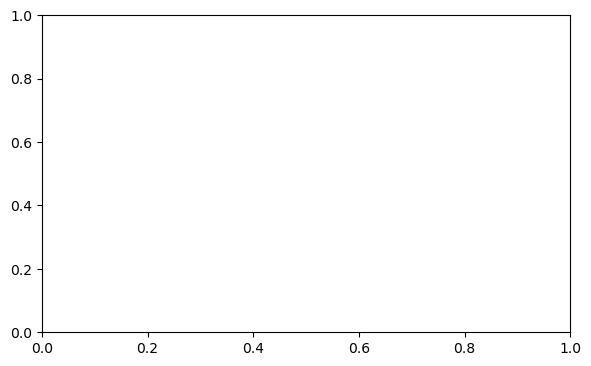

In [41]:
# FIGURE 2: CROSS-1500M HEAT TRANSPORT PER DENSITY! 2 rows, 3 columns
# 1) Circum-Ant. Cross-1500m heat transport per density classes (row 1, col 1)
# 2) TS-diagram WAOM4 (row 1, col 2)
# 3) net cross-1500 HT integrated for densities >= 37 sig2 (row 2, col 1:2)
# 4) mean/eddy decom. cross-1500 HT depth-int. for densities >= 37 sig2 (row 3, col 1:2)

fig = plt.figure(figsize=(15,14))

# 
# 1)
# NET
ax1 = fig.add_subplot(3,2,1)
ax1.plot(rho_grid2,(Sum_MeanHT_4km_sigma2+Sum_EddyHT_4km_sigma2)* rho0*Cp*1e-12,'--k', label='WAOM10',linewidth=1,alpha=.7)
ax1.plot(rho_grid2,(Sum_MeanHT_4km_sigma2+Sum_EddyHT_4km_sigma2)* rho0*Cp*1e-12,'-k', label='WAOM4',linewidth=1.6)
ax1.plot(rho_grid2,(Sum_MeanHT_4kmNT_sigma2+Sum_EddyHT_4kmNT_sigma2)* rho0*Cp*1e-12,':k', label='WAOM4-NOTIDE',linewidth=1,alpha=.7)
ax1.legend(loc='upper left')
ax1b = ax1.twiny()
ax1b.plot(rho_grid2[0],(Sum_MeanHT_4km_sigma2[0]+Sum_EddyHT_4km_sigma2[0])* rho0*Cp*1e-12,'-k', label='NET',linewidth=1.6)
ax1b.plot(rho_grid2,Sum_MeanHT_4km_sigma2* rho0*Cp*1e-12,'-',color='dodgerblue', label='ADV',linewidth=1.6)
ax1b.plot(rho_grid2,Sum_EddyHT_4km_sigma2* rho0*Cp*1e-12,'-', color='orangered', label='EIT',linewidth=1.6)

ax1b.plot(rho_grid2,Sum_MeanHT_4km_sigma2* rho0*Cp*1e-12,'--',color='dodgerblue',linewidth=1,alpha=.6)
ax1b.plot(rho_grid2,Sum_EddyHT_4km_sigma2* rho0*Cp*1e-12,'--',color='orangered',linewidth=1,alpha=.6)
ax1b.plot(rho_grid2,Sum_MeanHT_4kmNT_sigma2* rho0*Cp*1e-12,':',color='dodgerblue',linewidth=1,alpha=.6)
ax1b.plot(rho_grid2,Sum_EddyHT_4kmNT_sigma2* rho0*Cp*1e-12,':', color='orangered',linewidth=1,alpha=.6)
ax1.plot(np.around(rho_grid2[27],2)*np.ones(np.arange(-100,100).shape)\
          ,np.arange(-100,100),'-', color='gold',linewidth=2,alpha=0.75)
ax1.plot(np.around(rho_grid2[32],2)*np.ones(np.arange(-100,100).shape)\
          ,np.arange(-100,100),'-', color='gold',linewidth=2,alpha=0.75)
ax1b.legend(loc='lower left')
ax1.grid()
ax1b.set_xlim(36.7,37.2)
ax1b.set_ylim(-100,100)
ax1b.set_xticklabels((''))
ax1.set_ylabel('Heat transport (TW)')
ax1.set_xlabel('Potential density ($\sigma_2$)')


# 2) TS-diagram
ax2 = fig.add_subplot(3,2,2)
CS1 = ax2.contour(Si,Ti,dens.transpose(), levels=np.arange(35.5,37.2,.1),linestyles='solid', colors=[(.5,0.5,0.5)], linewidth=0.1)
ax2.clabel(CS1, CS1.levels, inline=True, fontsize=10)
CS2 = ax2.contour(Si,Ti,dens.transpose(), levels=np.arange(37.2,38,.1),linestyles='solid', colors=[(.5,0.5,0.5)], linewidth=0.1)
ax2.clabel(CS2, CS2.levels, inline=True, fontsize=10)
# specific isopycnals
cc1 = ax2.contour(Si,Ti,dens.transpose(), levels=[36.87],linestyles='solid', colors='gold', linewidth=0.2)
ax2.clabel(cc1, cc1.levels, inline=True, fontsize=10)
cc1 = ax2.contour(Si,Ti,dens.transpose(), levels=[37],linestyles='solid', colors='gold', linewidth=0.2)
ax2.clabel(cc1, cc1.levels, inline=True, fontsize=10)
ax2.set_xlim([34.2,34.8])
ax2.set_ylim([-2.5,1.5])
ax2.set_ylabel('Potential temperature (degC)')
ax2.set_xlabel('Salinity')
sc = ax2.scatter(np.nanmean(salt_4km,axis=0),np.nanmean(temp_4km,axis=0),
                 c=-z_rho_4km,marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax2.text(34.21,-2.3,'WAOM4', fontsize=12)#, fontweight='bold')
cbar_ax1 = fig.add_axes([0.76, 0.73, 0.01, 0.16])
fig.colorbar(sc, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('Depth (m)')

# 3)
ax3 = fig.add_subplot(3,1,2)
ll=np.arange(27,33) #20
cht = ax3.pcolormesh(dist_along_axis_4km,z_rho_4km,(\
                     np.nanmean(np.nansum(Mean_HT_4km_irho2[:,ll,:,:], axis=1), axis=0) +
                     np.nanmean(np.nansum(Eddy_HT_4km_irho2[:,ll,:,:], axis=1), axis=0))*rho0*Cp*1e-12, cmap='coolwarm', vmin=-.1, vmax=.1)
ax3.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax3.set_xticklabels((''))#156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                            # '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax3.set_xlim(0, dist_along_4km[-1])
ax3.text(1,-2500,'Cross-1500m heat transport due to NET, ' + str(np.around(rho_grid2[ll[0]],2)) + ' $\leq$ $\sigma_{2}$ $\geq$ ' + str(np.around(rho_grid2[ll[-1]],2)) + ' kg m$^{-3}$',fontsize=12)

ax3.plot([3.634185,3.634185],[-2000,0],'-', color=[.6,.6,.6])                 
ax3.plot([8,8],[-2000,0],'-', color=[.6,.6,.6])                                # 1) Mask Weddell (90W : 25W, lat < -75, 65W : 25W, lat <= -75)
ax3.plot([11.5,11.5],[-2000,0],'-', color=[.6,.6,.6])     
ax3.plot([15,15],[-2000,0],'-', color=[.6,.6,.6])      

ax3.set_yscale('symlog',base = 2, linthresh=700)
ax3.set_ylabel('Depth (m, symlog$_2$)')
ax3.set_yticklabels(['-2000','-1000','-500'])
ax3.set_aspect('auto')

cbar_ax2 = fig.add_axes([0.76, 0.52, 0.01, 0.16])
fig.colorbar(cht, cax=cbar_ax2, orientation='vertical')
cbar_ax2.set_ylabel('Heat transport (TW)')

# 4)
ax4 = fig.add_subplot(3,1,3)
cht1 = ax4.plot(dist_along_4km[:],(np.nansum(Cumsum_MeanHT_4km_sigma2[ll,:],axis=0) + np.nansum(Cumsum_EddyHT_4km_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,'-k', label='NET',linewidth=1.6)
cht1 = ax4.plot(dist_along_4km[:],(np.nansum(Cumsum_MeanHT_4km_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,'-',color='dodgerblue', label='ADV',linewidth=1.6)
cht1 = ax4.plot(dist_along_4km[:],(np.nansum(Cumsum_EddyHT_4km_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,'-',color='orangered', label='EIT',linewidth=1.6)
cht2 = ax4.plot(dist_along_4km[:],(np.nansum(Cumsum_MeanHT_4kmNT_sigma2[ll,:],axis=0) + np.nansum(Cumsum_EddyHT_4kmNT_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,':k',linewidth=1.,alpha=0.7)
cht2 = ax4.plot(dist_along_4km[:],(np.nansum(Cumsum_MeanHT_4kmNT_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,':',color='dodgerblue',linewidth=1.,alpha=0.6)
cht2 = ax4.plot(dist_along_4km[:],(np.nansum(Cumsum_EddyHT_4kmNT_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,':',color='orangered',linewidth=1.,alpha=0.6)
ax4.legend(loc='lower left')
ax4.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax4.set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                            '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
ax4.set_xlim(0, dist_along_4km[-1])
ax4.legend(loc='upper left')

ax4.set_ylim(-300,300)
ax4.text(2.895576e+00-1.5,-290,'Ross',fontsize=13, color='k')         # 4) Mask Ross (140W : 160E, lat < -60)
ax4.plot([3.634185,3.634185],[-600,600],'-', color=[.6,.6,.6])                 
ax4.text(4.1,-290,'West Ant.',fontsize=13, color='k')           # 5) Mask West Antarctica (150W : 90W, lat < -65)
ax4.plot([8,8],[-600,600],'-', color=[.6,.6,.6])                                # 1) Mask Weddell (90W : 25W, lat < -75, 65W : 25W, lat <= -75)
ax4.text(9,-290,'Weddell',fontsize=13, color='k')
ax4.plot([11.5,11.5],[-600,600],'-', color=[.6,.6,.6])     
ax4.text(12,-290,'Maud Land',fontsize=13, color='k')                  # 2) Mask Maud Land (25W : 60E, lat < -60)
ax4.plot([15,15],[-600,600],'-', color=[.6,.6,.6])      
ax4.text(17,-290,'East Ant.',fontsize=13, color='k')            # 3) Mask East Antarctica (60E : 160E, lat < -60)
ax4.set_title('Cross-1500m heat transport due to NET vertically-integrated, ' + str(np.around(rho_grid2[ll[0]],2)) + ' $\leq$ $\sigma_{2}$ $\geq$ ' + str(np.around(rho_grid2[ll[-1]],2)) + ' kg m$^{-3}$')
ax4.set_ylabel('Heat transport (TW)')

ax4b = ax4.twiny() # to plot 10km together
cht1b = ax4b.plot(dist_along_4km[:],(np.nansum(Cumsum_MeanHT_4km_sigma2[ll,:],axis=0) + np.nansum(Cumsum_EddyHT_4km_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,'--k', label='WAOM10',linewidth=1.,alpha=0.6)
cht1b = ax4b.plot(dist_along_4km[0],(np.nansum(Cumsum_MeanHT_4km_sigma2[ll,0],axis=0) + np.nansum(Cumsum_EddyHT_4km_sigma2[ll,0],axis=0))*rho0*Cp*1e-12,'-k', label='WAOM4',linewidth=1.6)
cht1b = ax4b.plot(dist_along_4km[0],(np.nansum(Cumsum_MeanHT_4kmNT_sigma2[ll,0],axis=0) + np.nansum(Cumsum_EddyHT_4kmNT_sigma2[ll,0],axis=0))*rho0*Cp*1e-12,':k', label='WAOM4-NOTIDE',linewidth=1.6)
ax4b.legend(loc='upper right')
cht1b = ax4b.plot(dist_along_4km[:],(np.nansum(Cumsum_MeanHT_4km_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,'--',color='dodgerblue',linewidth=1.,alpha=0.6)
cht1b = ax4b.plot(dist_along_4km[:],(np.nansum(Cumsum_EddyHT_4km_sigma2[ll,:],axis=0))*rho0*Cp*1e-12,'--',color='orangered',linewidth=1.,alpha=0.6)
ax4b.set_xticklabels((''))
ax4b.set_xticks(dist_along_4km[distance_indices_4km.astype(int)[:]])
ax4b.set_xlim(0, dist_along_4km[-1])
                     
plt.subplots_adjust(left=0.25, right=0.75, bottom=0.3, top=0.9)

name_fig='Figure2_Cross-1500m_sumtransport_Sig2_36.85-37_MeanEddyHT_v2.png'
plt.savefig(fig_path + name_fig, bbox_inches='tight', dpi=300)
plt.show()



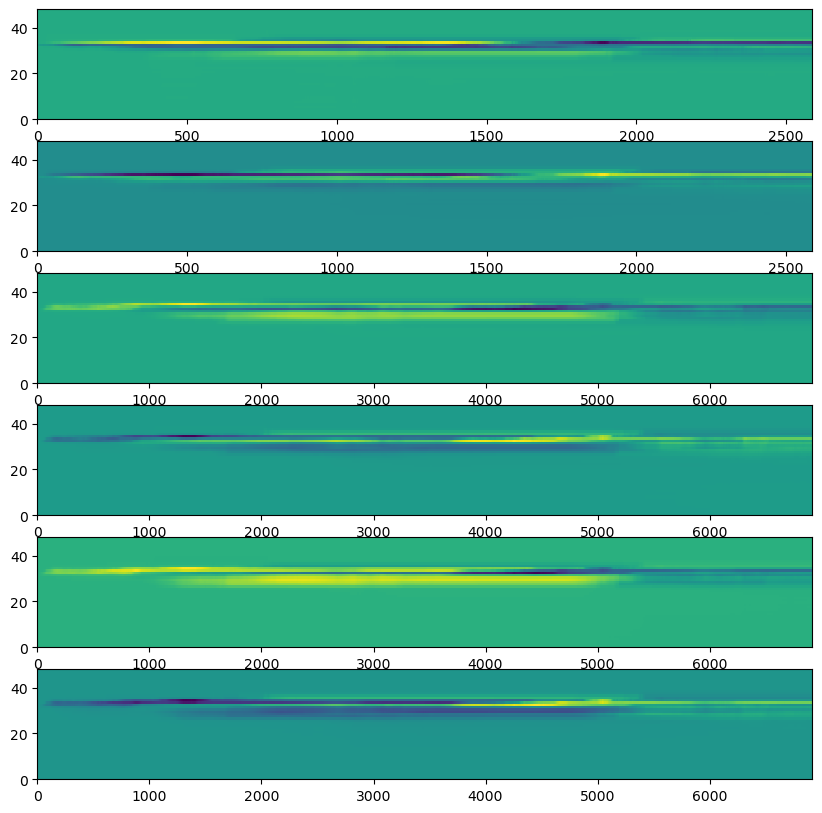

In [43]:
fig, ax = plt.subplots(nrows=6, figsize = (10, 10))
ax[0].pcolormesh(Cumsum_MeanHT_4km_sigma2, label='WAOM10')
ax[1].pcolormesh(Cumsum_EddyHT_4km_sigma2, label='WAOM10')

ax[2].pcolormesh(Cumsum_MeanHT_4km_sigma2, label='WAOM4')
ax[3].pcolormesh(Cumsum_EddyHT_4km_sigma2, label='WAOM10')

ax[4].pcolormesh(Cumsum_MeanHT_4kmNT_sigma2, label='WAOM4-NOTIDE')
ax[5].pcolormesh(Cumsum_EddyHT_4kmNT_sigma2, label='WAOM10')



NameError: name 'Cumsum_MeanHT_10km_sigma2' is not defined

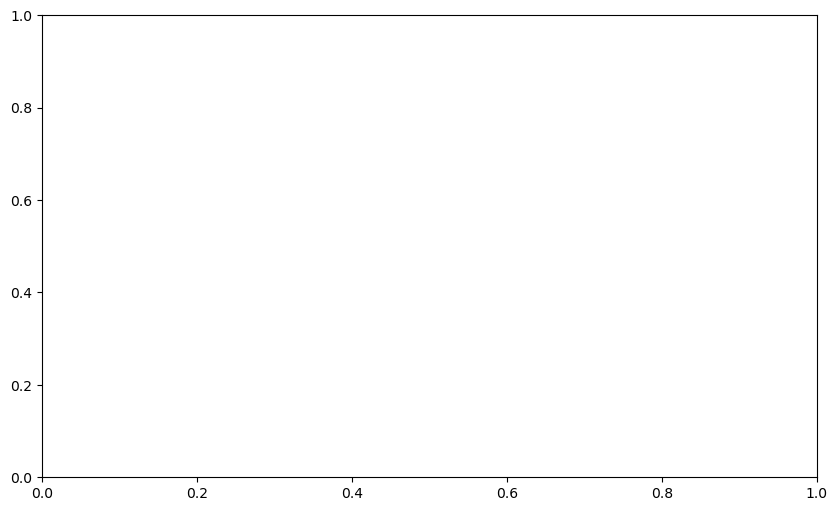

In [122]:
fig, ax = plt.subplots(figsize = (10, 6))
plt.plot(dist_along_4km,np.nansum(Cumsum_MeanHT_4km_sigma2,axis=0),'--r',label='WAOM10 Mean')       # 1. time-mean, 2. vertical integral
plt.plot(dist_along_4km,np.nansum(Cumsum_MeanHT_4km_sigma2,axis=0),'--b',label='WAOM4 Mean')       # 1. time-mean, 2. vertical integral
plt.plot(dist_along_4km,np.nansum(Cumsum_MeanHT_4kmNT_sigma2,axis=0),'--c',label='WAOM4-NOTIDE Mean')       # 1. time-mean, 2. vertical integral
plt.plot(dist_along_4km,np.nansum(Cumsum_EddyHT_4km_sigma2,axis=0),':r',label='WAOM10 Eddy')       # 1. time-mean, 2. vertical integral
plt.plot(dist_along_4km,np.nansum(Cumsum_EddyHT_4km_sigma2,axis=0),':b',label='WAOM4 Eddy')       # 1. time-mean, 2. vertical integral
plt.plot(dist_along_4km,np.nansum(Cumsum_EddyHT_4kmNT_sigma2,axis=0),':c',label='WAOM4-NOTIDE Eddy')       # 1. time-mean, 2. vertical integral
plt.legend()

### below need updates...

In [47]:
# print integrated values:

print('====================================================')
print('Sigma Net 2 - WAOM10 = ',np.nansum(Sum_4km_CF_sigma2)*1e-12,' TW')
print('Sigma Net 2 - WAOM4 = ',np.nansum(Sum_4km_CF_sigma2)*1e-12,' TW')
print('Sigma Net 2 - WAOM4-NOTIDE = ',np.nansum(Sum_4km_CFNT_sigma2)*1e-12,' TW')
print('====================================================')


NameError: name 'Sum_10km_sigma2' is not defined

In [47]:
print(Net_heat_transport_4km_CF_irho2.shape)

(365, 48, 31, 2588)


In [48]:
# # SANITY CHECK: plot intergrated over density layers:


# fig, ax = plt.subplots(nrows=3, figsize = (12, 14))

# ax[0].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,:,:,:], axis=1), axis=1),axis=0),'--',label='WAOM10')       # 1. time-mean, 2. vertical integral
# ax[1].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,:,:,:], axis=1), axis=1),axis=0),'--',label='WAOM4')       
# ax[2].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CFNT_irho2_cumsum[:,:,:,:], axis=1), axis=1),axis=0),'--',label='WAOM4-NOTIDE')

# for aa in range(0,3):
#     ax[aa].set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
#     ax[aa].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[aa].set_xlim(0, dist_along_4km_CF[-1])
#     # ax[aa].set_ylim(-4.5e14, 4.5e14)
#     ax[aa].set_ylim(-9e14, 9e14)
#     ax[aa].set_ylabel('Cumsum of cross-1500m heat \n transport per density class') #   'Cumulative heat transport \n across 1500m isobath (W)');
#     ax[aa].grid('on')
#     if aa==0:
#         ax[aa].legend(loc='best', bbox_to_anchor=(0.7, 0.35, 0.45, 0.5))
#     if aa==2:
#         ax[aa].set_xlabel('Longitude coordinates along contour')
    
# ax[0].set_title('WAOM10 - $\sigma_{2}$')
# ax[1].set_title('WAOM4 - $\sigma_{2}$')
# ax[2].set_title('WAOM4-NOTIDE - $\sigma_{2}$')

# name_fig='WAOM10x4x4NT_Cross-1500m_cumtransport_Sigma2bin_vint-total_annual_v2.png'
# plt.savefig(fig_path + name_fig, bbox_inches='tight', dpi=300)


In [49]:
# integrate for intervals of density based on WM definitions:

# 36.8 - 36.9 - CDW: rho_grid2[16:18]
# 36.95 - still CDW? Changes a lot b/w 10-4km_CF, specially West Antarct: rho_grid2[19]
# >37.0: DSW: rho_grid2[20:-1]




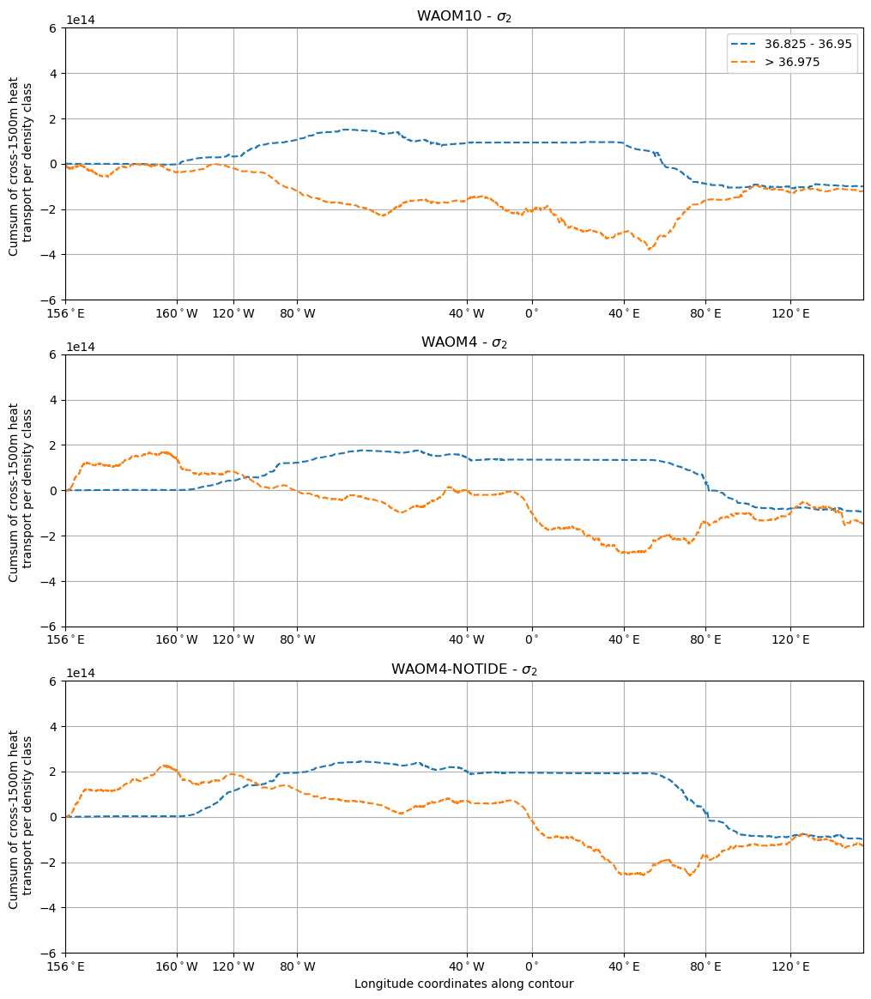

In [50]:
### -> used for dens (sig2) bins with 0.025 size:

fig, ax = plt.subplots(nrows=3, figsize = (12, 14))

ax[0].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,25:30,:,:], axis=1), axis=1),axis=0),'--',label='36.825 - 36.95')       # 1. time-mean, 2. vertical integral
ax[0].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,31:-1,:,:], axis=1), axis=1),axis=0),'--',label='> 36.975')       # 1. time-mean, 2. vertical integral

ax[1].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,25:30,:,:], axis=1), axis=1),axis=0),'--',label='36.825 - 36.95')       # 1. time-mean, 2. vertical integral
ax[1].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,31:-1,:,:], axis=1), axis=1),axis=0),'--',label='> 36.975')       # 1. time-mean, 2. vertical integral

ax[2].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CFNT_irho2_cumsum[:,25:30,:,:], axis=1), axis=1),axis=0),'--',label='36.825 - 36.95')       # 1. time-mean, 2. vertical integral
ax[2].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CFNT_irho2_cumsum[:,31:-1,:,:], axis=1), axis=1),axis=0),'--',label='> 36.975')       # 1. time-mean, 2. vertical integral

for aa in range(0,3):
    ax[aa].set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
    ax[aa].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
                              '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
    ax[aa].set_xlim(0, dist_along_4km_CF[-1])
    ax[aa].set_ylim(-6e14, 6e14)
    ax[aa].set_ylabel('Cumsum of cross-1500m heat \n transport per density class') #   'Cumulative heat transport \n across 1500m isobath (W)');
    ax[aa].grid('on')
    if aa==0:
        ax[aa].legend(loc='best')#, bbox_to_anchor=(0.7, 0.35, 0.45, 0.5))
    if aa==2:
        ax[aa].set_xlabel('Longitude coordinates along contour')
    
ax[0].set_title('WAOM10 - $\sigma_{2}$')
ax[1].set_title('WAOM4 - $\sigma_{2}$')
ax[2].set_title('WAOM4-NOTIDE - $\sigma_{2}$')

name_fig='WAOM10x4x4NT_Cross-1500m_cumtransport_Sigma2_perWMbins0.025_annual_v2.png'
plt.savefig(fig_path + name_fig, bbox_inches='tight', dpi=300)

In [51]:
### -> used for dens (sig2) bins with 0.05 size:

# fig, ax = plt.subplots(nrows=3, figsize = (12, 14))

# ax[0].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,16:18,:,:], axis=1), axis=1),axis=0),'--',label='36.8 - 36.9')       # 1. time-mean, 2. vertical integral
# ax[0].plot(dist_along_4km_CF,np.nanmean(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,19,:,:], axis=1),axis=0),'--',label='36.95')       # 1. time-mean, 2. vertical integral
# ax[0].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,20:21,:,:], axis=1), axis=1),axis=0),'--',label='37.0 - 37.05')       # 1. time-mean, 2. vertical integral
# ax[0].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,22:-1,:,:], axis=1), axis=1),axis=0),'--',label='> 37.1')       # 1. time-mean, 2. vertical integral

# ax[1].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,16:18,:,:], axis=1), axis=1),axis=0),'--',label='36.8 - 36.9')       # 1. time-mean, 2. vertical integral
# ax[1].plot(dist_along_4km_CF,np.nanmean(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,19,:,:], axis=1),axis=0),'--',label='36.95')       # 1. time-mean, 2. vertical integral
# ax[1].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,20:21,:,:], axis=1), axis=1),axis=0),'--',label='37.0 - 37.05')       # 1. time-mean, 2. vertical integral
# ax[1].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,22:-1,:,:], axis=1), axis=1),axis=0),'--',label='> 37.1')       # 1. time-mean, 2. vertical integral

# ax[2].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CFNT_irho2_cumsum[:,16:18,:,:], axis=1), axis=1),axis=0),'--',label='36.8 - 36.9')       # 1. time-mean, 2. vertical integral
# ax[2].plot(dist_along_4km_CF,np.nanmean(np.nansum(Net_heat_transport_4km_CFNT_irho2_cumsum[:,19,:,:], axis=1),axis=0),'--',label='36.95')       # 1. time-mean, 2. vertical integral
# ax[2].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CFNT_irho2_cumsum[:,20:21,:,:], axis=1), axis=1),axis=0),'--',label='37.0 - 37.05')       # 1. time-mean, 2. vertical integral
# ax[2].plot(dist_along_4km_CF,np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CFNT_irho2_cumsum[:,22:-1,:,:], axis=1), axis=1),axis=0),'--',label='> 37.1')       # 1. time-mean, 2. vertical integral

# for aa in range(0,3):
#     ax[aa].set_xticks(dist_along_4km_CF[distance_indices_4km_CF.astype(int)[:]])
#     ax[aa].set_xticklabels(('156$^\circ$E','160$^\circ$W', '120$^\circ$W','80$^\circ$W', '40$^\circ$W', '0$^\circ$', 
#                               '40$^\circ$E', '80$^\circ$E', '120$^\circ$E'))
#     ax[aa].set_xlim(0, dist_along_4km_CF[-1])
#     ax[aa].set_ylim(-2.5e14, 2.5e14)
#     ax[aa].set_ylabel('Cumsum of cross-1500m heat \n transport per density class') #   'Cumulative heat transport \n across 1500m isobath (W)');
#     ax[aa].grid('on')
#     if aa==0:
#         ax[aa].legend(loc='best', bbox_to_anchor=(0.7, 0.35, 0.45, 0.5))
#     if aa==2:
#         ax[aa].set_xlabel('Longitude coordinates along contour')
    
# ax[0].set_title('WAOM10 - $\sigma_{2}$')
# ax[1].set_title('WAOM4 - $\sigma_{2}$')
# ax[2].set_title('WAOM4-NOTIDE - $\sigma_{2}$')

# name_fig='WAOM10x4x4NT_Cross-1500m_cumtransport_Sigma2_perWMbins_annual_v2.png'
# plt.savefig(fig_path + name_fig, bbox_inches='tight', dpi=300)

In [52]:
# read model lon/lat grid:

dg = xr.open_dataset("/g/data/hh5/tmp/access-om/fbd581/ROMS/waom4_frc/waom4extend_grd.nc")

lat_rho = dg.variables["lat_rho"]
lon_rho = dg.variables["lon_rho"]
pm = dg.variables["pm"]
pn = dg.variables["pn"]

ds.coords['lat_rho']=lat_rho.transpose() # put lat_rho into ds dataset
ds.coords['lon_rho']=lon_rho.transpose() # put lon_rho into ds dataset

dg.close()

In [53]:
# mask per subregions following Dias et al (2023):

# create mask per longitude: Weddell, Maud Land, East Antarctica, Ross, West Antarctica
import matplotlib.path as mpath
import cartopy.feature as cfeature

# 1) Mask Weddell (90W : 25W, lat < -75, 65W : 25W, lat <= -75)
mask_Wed1lon = ma.masked_where(lon_rho <= -90, np.ones(lon_rho.shape)) # West limit for lat<-75
mask_Wed1lat = ma.masked_where(lat_rho > -75, np.ones(lat_rho.shape))
mask_Wed1 = mask_Wed1lon*mask_Wed1lat

mask_Wed2lon = ma.masked_where(lon_rho <= -65, np.ones(lon_rho.shape)) # West limit for lat<-75
mask_Wed2lat = ma.masked_where(lat_rho <= -75, np.ones(lat_rho.shape))
mask_Wed2 = mask_Wed2lon*mask_Wed2lat

mask_Wed12 = np.ma.array(mask_Wed1.filled(1) * mask_Wed2.filled(1), mask=(mask_Wed1.mask * mask_Wed2.mask))

mask_Wed3= ma.masked_where(lon_rho > -25, np.ones(lon_rho.shape)) # East limit for any latitude

mask_Wed = mask_Wed12*mask_Wed3

# 2) Mask Maud Land (25W : 60E, lat < -60)

mask_Mau1lon = ma.masked_where(lon_rho <= -25, np.ones(lon_rho.shape)) # East limit for any latitude
mask_Mau1lat = ma.masked_where(lat_rho > -60, np.ones(lat_rho.shape))
mask_Mau1 = mask_Mau1lon*mask_Mau1lat

mask_Mau2lon = ma.masked_where(lon_rho >= 60, np.ones(lon_rho.shape)) # East limit for any latitude
mask_Mau2lat = ma.masked_where(lat_rho > -60, np.ones(lat_rho.shape))
mask_Mau2 = mask_Mau2lon*mask_Mau2lat

mask_Mau = mask_Mau1*mask_Mau2

# 3) Mask East Antarctica (60E : 160E, lat < -60)

mask_EAnt1lon = ma.masked_where(lon_rho < 60, np.ones(lon_rho.shape)) # East limit for any latitude
mask_EAnt1lat = ma.masked_where(lat_rho > -60, np.ones(lat_rho.shape))
mask_EAnt1 = mask_EAnt1lon*mask_EAnt1lat

mask_EAnt2lon = ma.masked_where(lon_rho >= 160, np.ones(lon_rho.shape)) # East limit for any latitude
mask_EAnt2lat = ma.masked_where(lat_rho > -60, np.ones(lat_rho.shape))
mask_EAnt2 = mask_EAnt2lon*mask_EAnt2lat

mask_EAnt = mask_EAnt1*mask_EAnt2

# 4) Mask Ross (140W : 160E, lat < -60)

mask_Ros1lon = ma.masked_where(lon_rho < 160, np.ones(lon_rho.shape)) # East limit for any latitude
mask_Ros1lat = ma.masked_where(lat_rho > -60, np.ones(lat_rho.shape))
mask_Ros1 = mask_Ros1lon*mask_Ros1lat

mask_Ros2lon = ma.masked_where(lon_rho >= -149, np.ones(lon_rho.shape)) # East limit for any latitude
mask_Ros2lat = ma.masked_where(lat_rho > -60, np.ones(lat_rho.shape))
mask_Ros2 = mask_Ros2lon*mask_Ros2lat

mask_Ros = np.ma.array(mask_Ros1.filled(1) * mask_Ros2.filled(1), mask=(mask_Ros1.mask * mask_Ros2.mask))
# 5) Mask West Antarctica (150W : 90W, lat < -65)

mask_WAnt1 = ma.masked_where(lon_rho < -149, np.ones(lon_rho.shape)) # West limit for any latitude

mask_WAnt2lon = ma.masked_where(lon_rho > -90, np.ones(lon_rho.shape)) # East limit for lat <-73
mask_WAnt2lat = ma.masked_where(lat_rho > -75, np.ones(lat_rho.shape))
mask_WAnt2 = mask_WAnt2lon*mask_WAnt2lat

mask_WAnt3lon = ma.masked_where(lon_rho > -65, np.ones(lon_rho.shape)) # East limit for lat >-73
mask_WAnt3lat = ma.masked_where(lat_rho <= -75, np.ones(lat_rho.shape))
mask_WAnt3 = mask_WAnt3lon*mask_WAnt3lat

mask_WAnt23 = np.ma.array(mask_WAnt2.filled(1) * mask_WAnt3.filled(1), mask=(mask_WAnt2.mask * mask_WAnt3.mask))

mask_WAnt = mask_WAnt1*mask_WAnt23

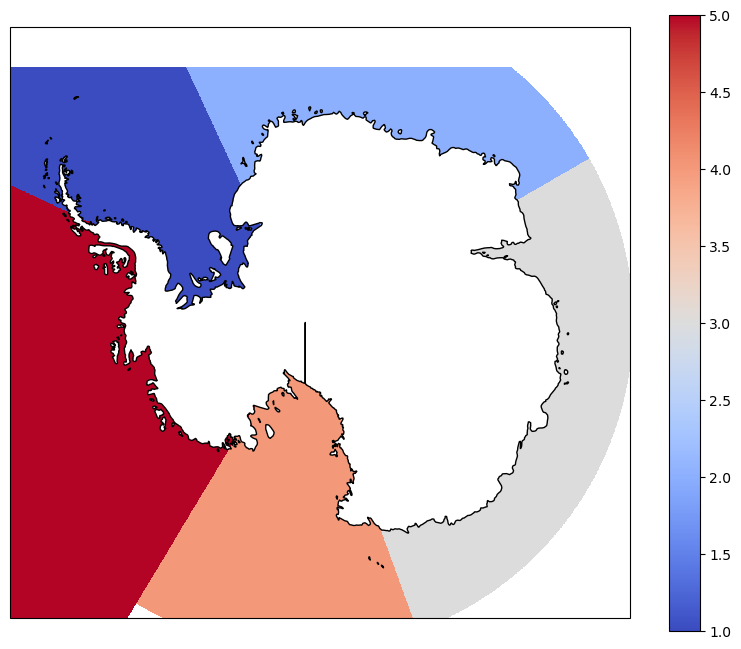

In [54]:
proj = ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10,8))
# 1) Mask Weddell (90W : 25W, lat < -73, 65W : 25W, lat <= -73)
ax1 = fig.add_subplot(111, projection=proj)
c1=plt.pcolormesh(lon_rho, lat_rho, 1*np.ones(lon_rho.shape)*mask_Wed, transform=ccrs.PlateCarree(), cmap=plt.cm.coolwarm, vmin=1, vmax=5)
# 2) Mask Maud Land (25W : 60E, lat < -60)
c2=plt.pcolormesh(lon_rho, lat_rho, 2*np.ones(lon_rho.shape)*mask_Mau, transform=ccrs.PlateCarree(), cmap=plt.cm.coolwarm, vmin=1, vmax=5)
# 3) Mask East Antarctica (60E : 160E, lat < -60)
c3=plt.pcolormesh(lon_rho, lat_rho, 3*np.ones(lon_rho.shape)*mask_EAnt, transform=ccrs.PlateCarree(), cmap=plt.cm.coolwarm, vmin=1, vmax=5)
# 4) Mask Ross (140W : 160E, lat < -65)
c4=plt.pcolormesh(lon_rho, lat_rho, 4*np.ones(lon_rho.shape)*mask_Ros, transform=ccrs.PlateCarree(), cmap=plt.cm.coolwarm, vmin=1, vmax=5)
# 5) Mask West Antarctica (140W : 90W, lat < -60)
c5=plt.pcolormesh(lon_rho, lat_rho, 5*np.ones(lon_rho.shape)*mask_WAnt, transform=ccrs.PlateCarree(), cmap=plt.cm.coolwarm, vmin=1, vmax=5)
# 6) add contour line:
# ax1.plot(lon_along_4km_CF[0:500], lat_along_4km_CF[0:500], transform=ccrs.PlateCarree())

ax1.add_feature(cfeature.LAND, zorder=1, edgecolor='black', facecolor='white')
plt.colorbar(c5)
# plt.clim([1,5])
plt.show()

# name_fig="waom10extend_subregion_masks.png"
# plt.savefig(fig_path + name_fig, bbox_inches='tight', dpi=300)

In [55]:
# define limits based on longitude along contour: WAOM10

ind_contour_Wed = np.where((np.round(lon_along_4km_CF)>=-90) & (np.round(lon_along_4km_CF)<-25)) # Weddell 90W-25W
ind_contour_Mau = np.where((np.round(lon_along_4km_CF)>=-25) & (np.round(lon_along_4km_CF)<60)) # Maud 25W-60E
ind_contour_EAnt = np.where((np.round(lon_along_4km_CF)>=60) & (np.round(lon_along_4km_CF)<160)) # East A 60E-160E
ind_contour_Ros = np.where((np.round(lon_along_4km_CF)>=160) | (np.round(lon_along_4km_CF)<-140)) # Ross 160E-140W
ind_contour_WAnt = np.where((np.round(lon_along_4km_CF)>=-140) & (np.round(lon_along_4km_CF)<-90)) # West A 140W-90W

# transform tuple from np.where to a labeled DataArray:
ind_Wed_4km_CF = xr.DataArray(np.asarray(ind_contour_Wed[0]), dims=['contour_index_array'])
ind_Mau_4km_CF = xr.DataArray(np.asarray(ind_contour_Mau[0]), dims=['contour_index_array'])
ind_EAnt_4km_CF = xr.DataArray(np.asarray(ind_contour_EAnt[0]), dims=['contour_index_array'])
ind_Ros_4km_CF = xr.DataArray(np.asarray(ind_contour_Ros[0]), dims=['contour_index_array'])
ind_WAnt_4km_CF = xr.DataArray(np.asarray(ind_contour_WAnt[0]), dims=['contour_index_array'])
del ind_contour_Wed, ind_contour_Mau, ind_contour_EAnt, ind_contour_Ros, ind_contour_WAnt

In [56]:
# define limits based on longitude along contour: WAOM4

ind_contour_Wed = np.where((np.round(lon_along_4km_CF)>=-90) & (np.round(lon_along_4km_CF)<-25)) # Weddell 90W-25W
ind_contour_Mau = np.where((np.round(lon_along_4km_CF)>=-25) & (np.round(lon_along_4km_CF)<60)) # Maud 25W-60E
ind_contour_EAnt = np.where((np.round(lon_along_4km_CF)>=60) & (np.round(lon_along_4km_CF)<160)) # East A 60E-160E
ind_contour_Ros = np.where((np.round(lon_along_4km_CF)>=160) | (np.round(lon_along_4km_CF)<-140)) # Ross 160E-140W
ind_contour_WAnt = np.where((np.round(lon_along_4km_CF)>=-140) & (np.round(lon_along_4km_CF)<-90)) # West A 140W-90W

# transform tuple from np.where to a labeled DataArray:
ind_Wed_4km_CF = xr.DataArray(np.asarray(ind_contour_Wed[0]), dims=['contour_index_array'])
ind_Mau_4km_CF = xr.DataArray(np.asarray(ind_contour_Mau[0]), dims=['contour_index_array'])
ind_EAnt_4km_CF = xr.DataArray(np.asarray(ind_contour_EAnt[0]), dims=['contour_index_array'])
ind_Ros_4km_CF = xr.DataArray(np.asarray(ind_contour_Ros[0]), dims=['contour_index_array'])
ind_WAnt_4km_CF = xr.DataArray(np.asarray(ind_contour_WAnt[0]), dims=['contour_index_array'])
del ind_contour_Wed, ind_contour_Mau, ind_contour_EAnt, ind_contour_Ros, ind_contour_WAnt

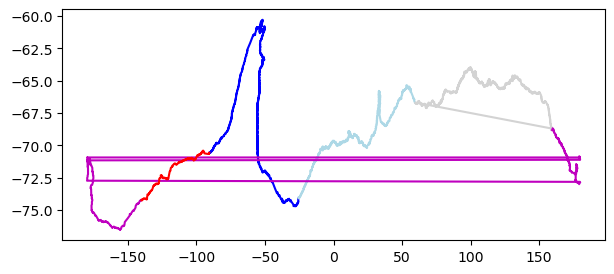

In [57]:

fig = plt.figure(figsize=(7,3))
# 1) Mask Weddell (90W : 25W, lat < -73, 65W : 25W, lat <= -73)
ax1 = fig.add_subplot(111)#, projection=proj)
# 6) add contour line:
ax1.plot(lon_along_4km_CF[ind_Wed_4km_CF], lat_along_4km_CF[ind_Wed_4km_CF],'b')#, transform=ccrs.PlateCarree())
ax1.plot(lon_along_4km_CF[ind_Mau_4km_CF], lat_along_4km_CF[ind_Mau_4km_CF],'lightblue')#, transform=ccrs.PlateCarree())
ax1.plot(lon_along_4km_CF[ind_EAnt_4km_CF], lat_along_4km_CF[ind_EAnt_4km_CF],'lightgray')#, transform=ccrs.PlateCarree())
ax1.plot(lon_along_4km_CF[ind_Ros_4km_CF], lat_along_4km_CF[ind_Ros_4km_CF],'m')#, transform=ccrs.PlateCarree())
ax1.plot(lon_along_4km_CF[ind_WAnt_4km_CF], lat_along_4km_CF[ind_WAnt_4km_CF],'r')#, transform=ccrs.PlateCarree())



# ax1.add_feature(cfeature.LAND, zorder=1, edgecolor='black', facecolor='white')
plt.colorbar(c5)
# plt.clim([1,5])
plt.show()


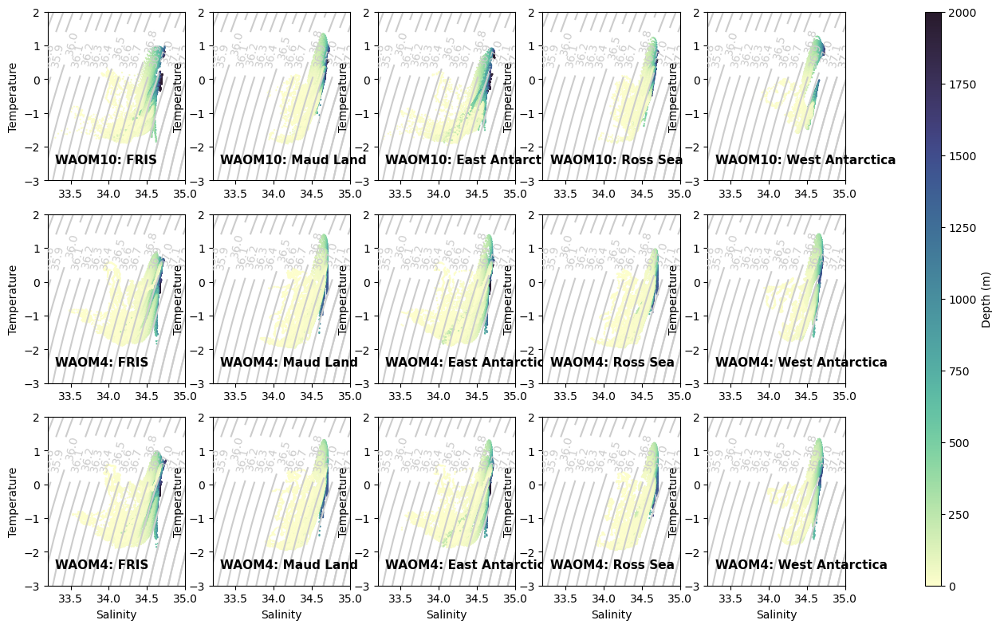

In [58]:
import cmocean

fig, ax = plt.subplots(nrows=3, ncols=5, figsize = (20, 12))
# normal isopycnals
for bb in range(0,5):
    for aa in range(0,3):
        CS1 = ax[aa,bb].contour(Si,Ti,dens.transpose(), levels=np.arange(35.5,38,.1),linestyles='solid', colors=[(.8,0.8,0.8)], linewidth=0.1)
        ax[aa,bb].clabel(CS1, CS1.levels, inline=True, fontsize=10)
        CS2 = ax[aa,bb].contour(Si,Ti,dens.transpose(), levels=np.arange(37.2,38,.1),linestyles='solid', colors=[(.8,0.8,0.8)], linewidth=0.1)
        ax[aa,bb].clabel(CS2, CS2.levels, inline=True, fontsize=10)
        ax[aa,bb].set_xlim([33.2,35])
        ax[aa,bb].set_ylim([-3,2])
        ax[aa,bb].set_ylabel('Temperature')
        if aa == 2:
            ax[aa,bb].set_xlabel('Salinity')

# FRIS
sc = ax[0,0].scatter(salt_4km_CF.isel(contour_index_array=ind_Wed_4km_CF).mean('ocean_time'),temp_4km_CF.isel(contour_index_array=ind_Wed_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_Wed_4km_CF).mean('ocean_time'),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[0,0].text(33.3,-2.5,'WAOM10: FRIS', fontsize=11, fontweight='bold')

sc = ax[1,0].scatter(salt_4km_CF.isel(contour_index_array=ind_Wed_4km_CF).mean('ocean_time'),temp_4km_CF.isel(contour_index_array=ind_Wed_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_Wed_4km_CF),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[1,0].text(33.3,-2.5,'WAOM4: FRIS', fontsize=11, fontweight='bold')

sc = ax[2,0].scatter(salt_4km_CFNT.isel(contour_index_array=ind_Wed_4km_CF).mean('ocean_time'),temp_4km_CFNT.isel(contour_index_array=ind_Wed_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_Wed_4km_CF),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[2,0].text(33.3,-2.5,'WAOM4: FRIS', fontsize=11, fontweight='bold')
# MAUD LAND
sc = ax[0,1].scatter(salt_4km_CF.isel(contour_index_array=ind_Mau_4km_CF).mean('ocean_time'),temp_4km_CF.isel(contour_index_array=ind_Mau_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_Mau_4km_CF).mean('ocean_time'),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[0,1].text(33.3,-2.5,'WAOM10: Maud Land', fontsize=11, fontweight='bold')

sc = ax[1,1].scatter(salt_4km_CF.isel(contour_index_array=ind_Mau_4km_CF).mean('ocean_time'),temp_4km_CF.isel(contour_index_array=ind_Mau_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_Mau_4km_CF),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[1,1].text(33.3,-2.5,'WAOM4: Maud Land', fontsize=11, fontweight='bold')

sc = ax[2,1].scatter(salt_4km_CFNT.isel(contour_index_array=ind_Mau_4km_CF).mean('ocean_time'),temp_4km_CFNT.isel(contour_index_array=ind_Mau_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_Mau_4km_CF),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[2,1].text(33.3,-2.5,'WAOM4: Maud Land', fontsize=11, fontweight='bold')
# East antarct.
sc = ax[0,2].scatter(salt_4km_CF.isel(contour_index_array=ind_EAnt_4km_CF).mean('ocean_time'),temp_4km_CF.isel(contour_index_array=ind_EAnt_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_EAnt_4km_CF).mean('ocean_time'),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[0,2].text(33.3,-2.5,'WAOM10: East Antarctica', fontsize=11, fontweight='bold')

sc = ax[1,2].scatter(salt_4km_CF.isel(contour_index_array=ind_EAnt_4km_CF).mean('ocean_time'),temp_4km_CF.isel(contour_index_array=ind_EAnt_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_EAnt_4km_CF),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[1,2].text(33.3,-2.5,'WAOM4: East Antarctica', fontsize=11, fontweight='bold')

sc = ax[2,2].scatter(salt_4km_CFNT.isel(contour_index_array=ind_EAnt_4km_CF).mean('ocean_time'),temp_4km_CFNT.isel(contour_index_array=ind_EAnt_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_EAnt_4km_CF),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[2,2].text(33.3,-2.5,'WAOM4: East Antarctica', fontsize=11, fontweight='bold')
# Ross.
sc = ax[0,3].scatter(salt_4km_CF.isel(contour_index_array=ind_Ros_4km_CF).mean('ocean_time'),temp_4km_CF.isel(contour_index_array=ind_Ros_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_Ros_4km_CF).mean('ocean_time'),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[0,3].text(33.3,-2.5,'WAOM10: Ross Sea', fontsize=11, fontweight='bold')

sc = ax[1,3].scatter(salt_4km_CF.isel(contour_index_array=ind_Ros_4km_CF).mean('ocean_time'),temp_4km_CF.isel(contour_index_array=ind_Ros_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_Ros_4km_CF),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[1,3].text(33.3,-2.5,'WAOM4: Ross Sea', fontsize=11, fontweight='bold')

sc = ax[2,3].scatter(salt_4km_CFNT.isel(contour_index_array=ind_Ros_4km_CF).mean('ocean_time'),temp_4km_CFNT.isel(contour_index_array=ind_Ros_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_Ros_4km_CF),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[2,3].text(33.3,-2.5,'WAOM4: Ross Sea', fontsize=11, fontweight='bold')
# West antarct.
sc = ax[0,4].scatter(salt_4km_CF.isel(contour_index_array=ind_WAnt_4km_CF).mean('ocean_time'),temp_4km_CF.isel(contour_index_array=ind_WAnt_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_WAnt_4km_CF).mean('ocean_time'),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[0,4].text(33.3,-2.5,'WAOM10: West Antarctica', fontsize=11, fontweight='bold')

sc = ax[1,4].scatter(salt_4km_CF.isel(contour_index_array=ind_WAnt_4km_CF).mean('ocean_time'),temp_4km_CF.isel(contour_index_array=ind_WAnt_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_WAnt_4km_CF),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[1,4].text(33.3,-2.5,'WAOM4: West Antarctica', fontsize=11, fontweight='bold')

sc = ax[2,4].scatter(salt_4km_CFNT.isel(contour_index_array=ind_WAnt_4km_CF).mean('ocean_time'),temp_4km_CFNT.isel(contour_index_array=ind_WAnt_4km_CF).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_WAnt_4km_CF),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[2,4].text(33.3,-2.5,'WAOM4: West Antarctica', fontsize=11, fontweight='bold')

# - cbar horiz
# cbar_ax1 = fig.add_axes([0.12, 0.005, 0.785, 0.01])
# fig.colorbar(sc, cax=cbar_ax1, orientation='horizontal')
# cbar_ax1.set_xlabel('Depth (m)')
# - cbar vert
cbar_ax1 = fig.add_axes([0.8, 0.3, 0.01, 0.6])
fig.colorbar(sc, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('Depth (m)')

plt.subplots_adjust(left=0.25, right=0.75, bottom=0.3, top=0.9)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom10x4x4NT_TSdiag_1500m_rho2_annnual_subregions.png"
plt.savefig(name_fig, bbox_inches='tight', dpi=300)

# Analyses for the region near Totten & Moscow Univ. Ice Shelves:

In [59]:
## getting index first:

ind_contour_TIS = np.where((np.round(lon_along_4km_CF)>=95) & (np.round(lon_along_4km_CF)<140))
# transform tuple from np.where to a labeled DataArray:
ind_TIS_4km_CF = xr.DataArray(np.asarray(ind_contour_TIS[0]), dims=['contour_index_array'])

ind_contour_TIS = np.where((np.round(lon_along_4km_CF)>=95) & (np.round(lon_along_4km_CF)<140))
# transform tuple from np.where to a labeled DataArray:
ind_TIS_4km_CF = xr.DataArray(np.asarray(ind_contour_TIS[0]), dims=['contour_index_array'])

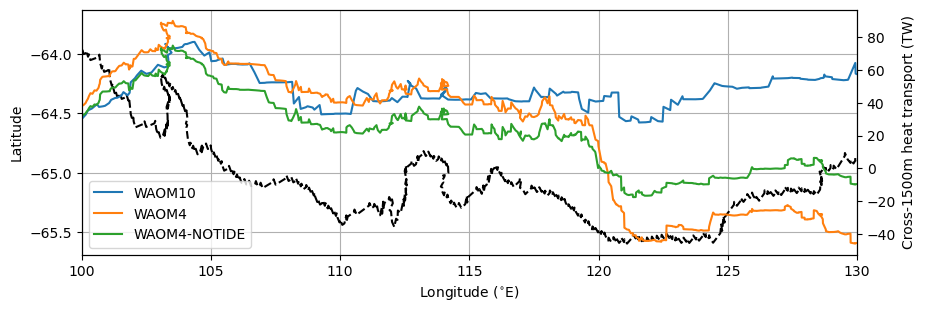

In [60]:
# plot cumsum HT only for the East Antarctica sector:

# var = Net_heat_transport_4km_CF_irho2
# var = np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,:,:,ind_TIS_4km_CF[:]], axis=1), axis=1),axis=0)
var_4km_CF = Net_heat_transport_4km_CF_irho2[:,:,:,ind_TIS_4km_CF[:]]
var_4km_CF = Net_heat_transport_4km_CF_irho2[:,:,:,ind_TIS_4km_CF[:]]
var_4km_CFNT = Net_heat_transport_4km_CFNT_irho2[:,:,:,ind_TIS_4km_CF[:]]

vplot_4km_CF = np.nanmean(np.cumsum(np.nansum(np.nansum(var_4km_CF, axis=1), axis=1), axis=1), axis=0)
vplot_4km_CF = np.nanmean(np.cumsum(np.nansum(np.nansum(var_4km_CF, axis=1), axis=1), axis=1), axis=0)
vplot_4km_CFNT = np.nanmean(np.cumsum(np.nansum(np.nansum(var_4km_CFNT, axis=1), axis=1), axis=1), axis=0)


fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(211)#, projection=proj)
# ax1.plot(lon_along_4km_CF[ind_TIS_4km_CF[:]], lat_along_4km_CF[ind_TIS_4km_CF[:]],'lightgray')#, transform=ccrs.PlateCarree())
ax1.plot(lon_along_4km_CF[ind_TIS_4km_CF[:]], lat_along_4km_CF[ind_TIS_4km_CF[:]],linestyle='dashed',color='k',label='1500m isobath')#, transform=ccrs.PlateCarree())
# ax1.legend()

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.plot(lon_along_4km_CF[ind_TIS_4km_CF[:]], vplot_4km_CF*1e-12,label='WAOM10')#, transform=ccrs.PlateCarree())
ax2.plot(lon_along_4km_CF[ind_TIS_4km_CF[:]], vplot_4km_CF*1e-12,label='WAOM4')#, transform=ccrs.PlateCarree())
ax2.plot(lon_along_4km_CF[ind_TIS_4km_CF[:]], vplot_4km_CFNT*1e-12,label='WAOM4-NOTIDE')#, transform=ccrs.PlateCarree())
ax2.legend()

ax1.set_ylabel('Latitude')
ax1.set_xlabel('Longitude ($^{\circ}$E)')
ax2.set_ylabel('Cross-1500m heat transport (TW)')
ax1.grid()

ax1.set_xlim(100,130)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom10x4x4NT_Cross-1500m_HT_vint_annnual_EAntTIS.png"
plt.savefig(name_fig, dpi=300)

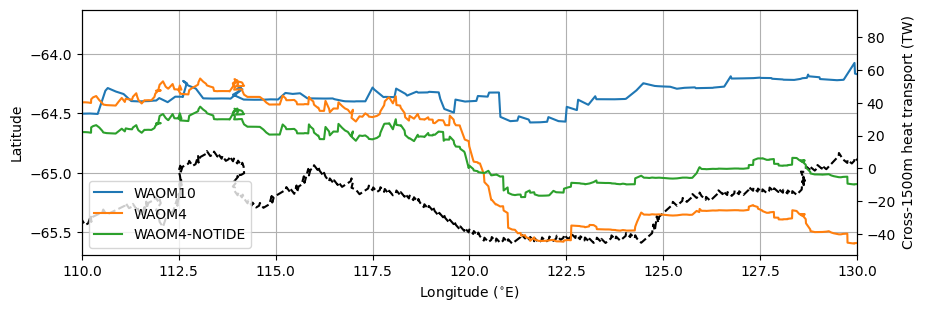

In [77]:
# plot cumsum HT only for the East Antarctica sector:

# var = Net_heat_transport_4km_CF_irho2
# var = np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,:,:,ind_TIS_4km_CF[:]], axis=1), axis=1),axis=0)
var_4km_CF = Net_heat_transport_4km_CF_irho2[:,:,:,ind_TIS_4km_CF[:]]
var_4km_CF = Net_heat_transport_4km_CF_irho2[:,:,:,ind_TIS_4km_CF[:]]
var_4km_CFNT = Net_heat_transport_4km_CFNT_irho2[:,:,:,ind_TIS_4km_CF[:]]

vplot_4km_CF = np.nanmean(np.cumsum(np.nansum(np.nansum(var_4km_CF, axis=1), axis=1), axis=1), axis=0)
vplot_4km_CF = np.nanmean(np.cumsum(np.nansum(np.nansum(var_4km_CF, axis=1), axis=1), axis=1), axis=0)
vplot_4km_CFNT = np.nanmean(np.cumsum(np.nansum(np.nansum(var_4km_CFNT, axis=1), axis=1), axis=1), axis=0)


fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(211)#, projection=proj)
# ax1.plot(lon_along_4km_CF[ind_TIS_4km_CF[:]], lat_along_4km_CF[ind_TIS_4km_CF[:]],'lightgray')#, transform=ccrs.PlateCarree())
ax1.plot(lon_along_4km_CF[ind_TIS_4km_CF[:]], lat_along_4km_CF[ind_TIS_4km_CF[:]],linestyle='dashed',color='k',label='1500m isobath')#, transform=ccrs.PlateCarree())
# ax1.legend()

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.plot(lon_along_4km_CF[ind_TIS_4km_CF[:]], vplot_4km_CF*1e-12,label='WAOM10')#, transform=ccrs.PlateCarree())
ax2.plot(lon_along_4km_CF[ind_TIS_4km_CF[:]], vplot_4km_CF*1e-12,label='WAOM4')#, transform=ccrs.PlateCarree())
ax2.plot(lon_along_4km_CF[ind_TIS_4km_CF[:]], vplot_4km_CFNT*1e-12,label='WAOM4-NOTIDE')#, transform=ccrs.PlateCarree())
ax2.legend()

ax1.set_ylabel('Latitude')
ax1.set_xlabel('Longitude ($^{\circ}$E)')
ax2.set_ylabel('Cross-1500m heat transport (TW)')
ax1.grid()

ax1.set_xlim(110,130)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom10x4x4NT_Cross-1500m_HT_vint_annnual_EAntTIS_2.png"
plt.savefig(name_fig, dpi=300)

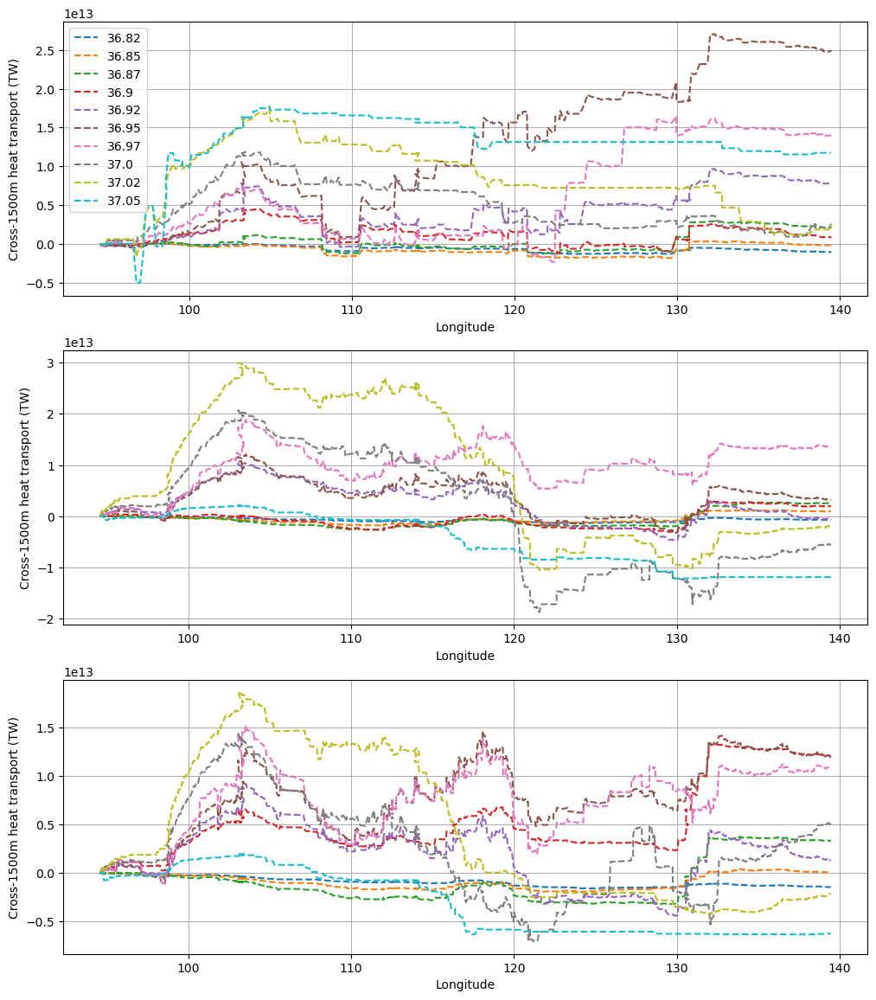

In [61]:
# fig2: per density bin:

# plot cumsum HT only for the East Antarctica sector:

# var = Net_heat_transport_4km_CF_irho2
# var = np.nanmean(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2_cumsum[:,:,:,ind_TIS_4km_CF[:]], axis=1), axis=1),axis=0)
var_4km_CF = Net_heat_transport_4km_CF_irho2[:,:,:,ind_TIS_4km_CF[:]]
var_4km_CF = Net_heat_transport_4km_CF_irho2[:,:,:,ind_TIS_4km_CF[:]]
var_4km_CFNT = Net_heat_transport_4km_CFNT_irho2[:,:,:,ind_TIS_4km_CF[:]]

vplot_4km_CF = np.nanmean(np.cumsum(np.nansum(np.nansum(var_4km_CF, axis=1), axis=2), axis=0), axis=1)
vplot_4km_CF = np.nanmean(np.cumsum(np.nansum(np.nansum(var_4km_CF, axis=1), axis=2), axis=0), axis=1)
vplot_4km_CFNT = np.nanmean(np.cumsum(np.nansum(np.nansum(var_4km_CFNT, axis=1), axis=2), axis=0), axis=1)


fig, ax = plt.subplots(nrows=3, figsize = (12, 14))
# ax[0].plot(lon_along_4km_CF[ind_TIS_4km_CF[:]], lat_along_4km_CF[ind_TIS_4km_CF[:]],linestyle='dashed',color='k',label='1500m isobath')#, transform=ccrs.PlateCarree())
# ax[0].legend()

for ll in np.arange(25,35,1):
    ax[0].plot(lon_along_4km_CF[ind_TIS_4km_CF[:]],np.nanmean(np.cumsum(np.nansum(Net_heat_transport_4km_CF_irho2[:,ll,:,ind_TIS_4km_CF[:]], axis=2), axis=0), axis=1),'--',label=str(round(rho_grid2[ll],2)))  
    ax[1].plot(lon_along_4km_CF[ind_TIS_4km_CF[:]],np.nanmean(np.cumsum(np.nansum(Net_heat_transport_4km_CF_irho2[:,ll,:,ind_TIS_4km_CF[:]], axis=2), axis=0), axis=1),'--',label=str(round(rho_grid2[ll],2)))       # 1. time-mean, 2. vertical integral
    ax[2].plot(lon_along_4km_CF[ind_TIS_4km_CF[:]],np.nanmean(np.cumsum(np.nansum(Net_heat_transport_4km_CFNT_irho2[:,ll,:,ind_TIS_4km_CF[:]], axis=2), axis=0), axis=1),'--',label=str(round(rho_grid2[ll],2)))       # 1. time-mean, 2. vertical integral
# for ll in np.arange(35,45,1):
#     ax[0].plot(lon_along_4km_CF[ind_TIS_4km_CF[:]],np.nanmean(np.cumsum(np.nansum(Net_heat_transport_4km_CF_irho2[:,ll,:,ind_TIS_4km_CF[:]], axis=2), axis=0), axis=1),'-',label=str(round(rho_grid2[ll],2)))  
#     ax[1].plot(lon_along_4km_CF[ind_TIS_4km_CF[:]],np.nanmean(np.cumsum(np.nansum(Net_heat_transport_4km_CF_irho2[:,ll,:,ind_TIS_4km_CF[:]], axis=2), axis=0), axis=1),'-',label=str(round(rho_grid2[ll],2)))       # 1. time-mean, 2. vertical integral
#     ax[2].plot(lon_along_4km_CF[ind_TIS_4km_CF[:]],np.nanmean(np.cumsum(np.nansum(Net_heat_transport_4km_CFNT_irho2[:,ll,:,ind_TIS_4km_CF[:]], axis=2), axis=0), axis=1),'-',label=str(round(rho_grid2[ll],2)))       # 1. time-mean, 2. vertical integral
# MCDW = rho2[28:32]
# DSW = rho2[32:35]

ax[0].legend()
for aa in np.arange(0,3):
    ax[aa].set_ylabel('Latitude')
    ax[aa].set_xlabel('Longitude')
    ax[aa].set_ylabel('Cross-1500m heat transport (TW)')
    ax[aa].grid()

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom10x4x4NT_Cross-1500m_HT_sig2_annnual_subregions.png"
plt.savefig(name_fig, dpi=300)

In [62]:
print(Net_heat_transport_4km_CF_irho2[:,ll,:,ind_TIS_4km_CF[:]].shape, lon_along_4km_CF[ind_TIS_4km_CF[:]].shape)
print(np.nansum(Net_heat_transport_4km_CF_irho2[:,28:32,:,ind_TIS_4km_CF[:]], axis=1).shape)
# print(np.cumsum(np.nansum(Net_heat_transport_4km_CF_irho2[:,ll,:,ind_TIS_4km_CF[:]], axis=2), axis=0).shape)
# print(np.nanmean(np.cumsum(np.nansum(Net_heat_transport_4km_CF_irho2[:,ll,:,ind_TIS_4km_CF[:]], axis=2), axis=0), axis=1).shape)

(329, 365, 31) (329,)
(365, 31, 329)


In [63]:
Net_heat_transport_4km_CF_irho2[:,28:32,:,ind_TIS_4km_CF[:]].shape

(365, 4, 31, 329)

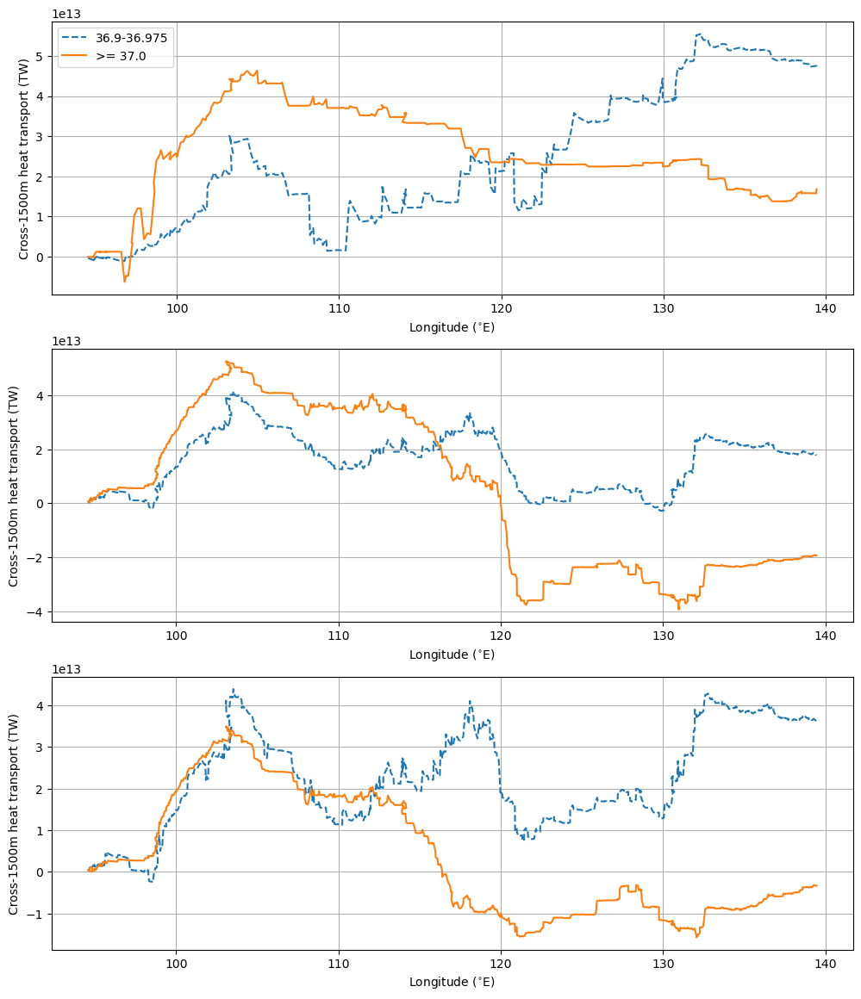

In [64]:
# fig2: per density bin:

# plot cumsum HT only for the East Antarctica sector:

fig, ax = plt.subplots(nrows=3, figsize = (12, 14))
# ax[0].plot(lon_along_4km_CF[ind_TIS_4km_CF[:]], lat_along_4km_CF[ind_TIS_4km_CF[:]],linestyle='dashed',color='k',label='1500m isobath')#, transform=ccrs.PlateCarree())
# ax[0].legend()
ax[0].plot(lon_along_4km_CF[ind_TIS_4km_CF[:]],np.nanmean(np.cumsum(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2[:,28:32,:,ind_TIS_4km_CF[:]], axis=1), axis=1), axis=1), axis=0),'--',label='36.9-36.975')
ax[1].plot(lon_along_4km_CF[ind_TIS_4km_CF[:]],np.nanmean(np.cumsum(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2[:,28:32,:,ind_TIS_4km_CF[:]], axis=1), axis=1), axis=1), axis=0),'--',label='36.9-36.975')
ax[2].plot(lon_along_4km_CF[ind_TIS_4km_CF[:]],np.nanmean(np.cumsum(np.nansum(np.nansum(Net_heat_transport_4km_CFNT_irho2[:,28:32,:,ind_TIS_4km_CF[:]], axis=1), axis=1), axis=1), axis=0),'--',label='36.9-36.975')
# MCDW = rho2[28:32]
ax[0].plot(lon_along_4km_CF[ind_TIS_4km_CF[:]],np.nanmean(np.cumsum(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2[:,32:35,:,ind_TIS_4km_CF[:]], axis=1), axis=1), axis=1), axis=0),'-',label='>= 37.0')
ax[1].plot(lon_along_4km_CF[ind_TIS_4km_CF[:]],np.nanmean(np.cumsum(np.nansum(np.nansum(Net_heat_transport_4km_CF_irho2[:,32:35,:,ind_TIS_4km_CF[:]], axis=1), axis=1), axis=1), axis=0),'-',label='>= 37.0')
ax[2].plot(lon_along_4km_CF[ind_TIS_4km_CF[:]],np.nanmean(np.cumsum(np.nansum(np.nansum(Net_heat_transport_4km_CFNT_irho2[:,32:35,:,ind_TIS_4km_CF[:]], axis=1), axis=1), axis=1), axis=0),'-',label='>= 37.0')
# DSW = rho2[32:35]

ax[0].legend()
for aa in np.arange(0,3):
    ax[aa].set_ylabel('Latitude')
    ax[aa].set_xlabel('Longitude ($^{\circ}$E)')
    ax[aa].set_ylabel('Cross-1500m heat transport (TW)')
    ax[aa].grid()

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom10x4x4NT_Cross-1500m_HT_MCDWxDSW_annnual_subregions.png"
plt.savefig(name_fig, dpi=300)

In [65]:
# Net_heat_transport_4km_CF_irho2[:,25:28,:,ind_TIS_4km_CF].shape
# np.nanmean(np.nansum(Net_heat_transport_4km_CF_irho2[:,25:28,:,ind_TIS_4km_CF], axis=1), axis=0).shape

In [66]:
# rho_grid2[32:35]

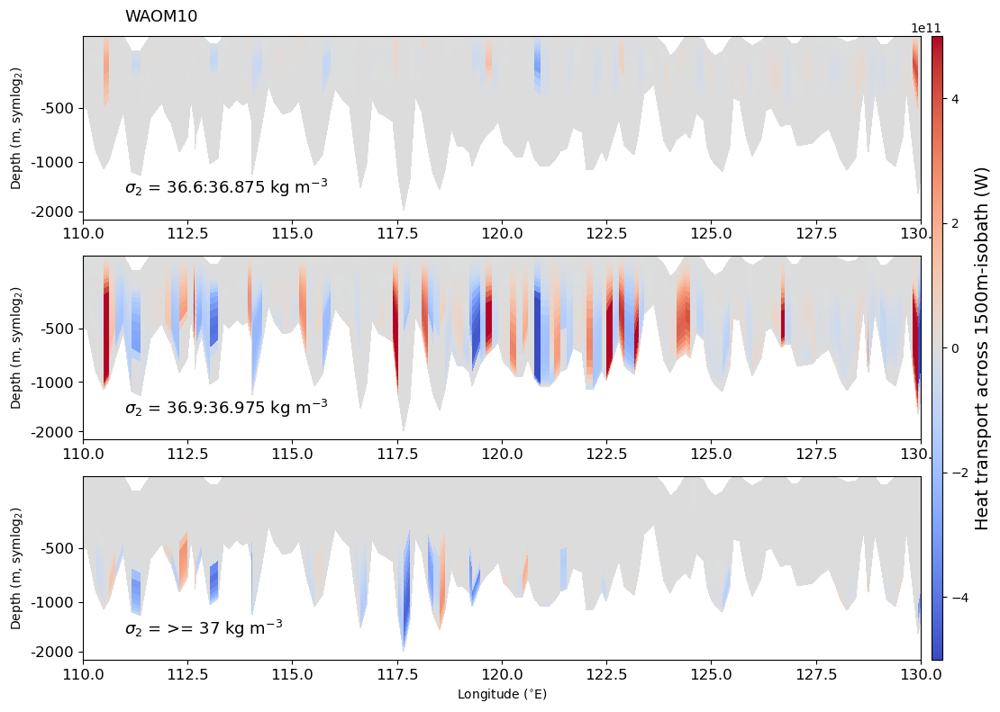

In [67]:
fig, ax = plt.subplots(nrows=3, figsize = (12, 9))
ax[0].text(111,100,'WAOM10',fontsize=13)
aa = ax[0].pcolormesh(lon_along_4km_CF[ind_TIS_4km_CF],np.nanmean(z_rho_4km_CF.fillna(0)[:,:,ind_TIS_4km_CF], axis=0),np.nanmean(np.nansum(Net_heat_transport_4km_CF_irho2[:,20:28,:,ind_TIS_4km_CF], axis=1), axis=0), vmin=-5e11, vmax=5e11, cmap='coolwarm')
ax[0].text(111,-1600,'$\sigma_{2}$ = 36.6:36.875 kg m$^{-3}$',fontsize=13)
ax[0].set_xlim(110,130)

ax[1].pcolormesh(lon_along_4km_CF[ind_TIS_4km_CF],np.nanmean(z_rho_4km_CF.fillna(0)[:,:,ind_TIS_4km_CF], axis=0),np.nanmean(np.nansum(Net_heat_transport_4km_CF_irho2[:,28:32,:,ind_TIS_4km_CF], axis=1), axis=0), vmin=-5e11, vmax=5e11, cmap='coolwarm')
ax[1].text(111,-1600,'$\sigma_{2}$ = 36.9:36.975 kg m$^{-3}$',fontsize=13)
ax[1].set_xlim(110,130)

ax[2].pcolormesh(lon_along_4km_CF[ind_TIS_4km_CF],np.nanmean(z_rho_4km_CF.fillna(0)[:,:,ind_TIS_4km_CF], axis=0),np.nanmean(np.nansum(Net_heat_transport_4km_CF_irho2[:,32:35,:,ind_TIS_4km_CF], axis=1), axis=0), vmin=-5e11, vmax=5e11, cmap='coolwarm')
ax[2].text(111,-1600,'$\sigma_{2}$ = >= 37 kg m$^{-3}$',fontsize=13)
ax[2].set_xlim(110,130)

for bb in range(0,3):
    # ax[bb].text(1,-2500,'$\sigma_{2}$ = 37.1:37.125 kg m$^{-3}$',fontsize=14)
    ax[bb].set_yscale('symlog',base = 2, linthresh=700)
    ax[bb].set_ylabel('Depth (m, symlog$_2$)')
    ax[bb].set_yticklabels(['-2000','-1000','-500'])
    ax[bb].set_aspect('auto')
    ax[bb].tick_params(labelsize=12)
ax[2].set_xlabel('Longitude ($^{\circ}$E)')

cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
cb = plt.colorbar(aa, cax=cax1, orientation='vertical')
cb.ax.set_ylabel('Heat transport across 1500m-isobath (W)', fontsize=14)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom10_Net_heat_transp_1500m_rho2_annual_EAntTIS.png"
plt.savefig(name_fig, dpi=300)

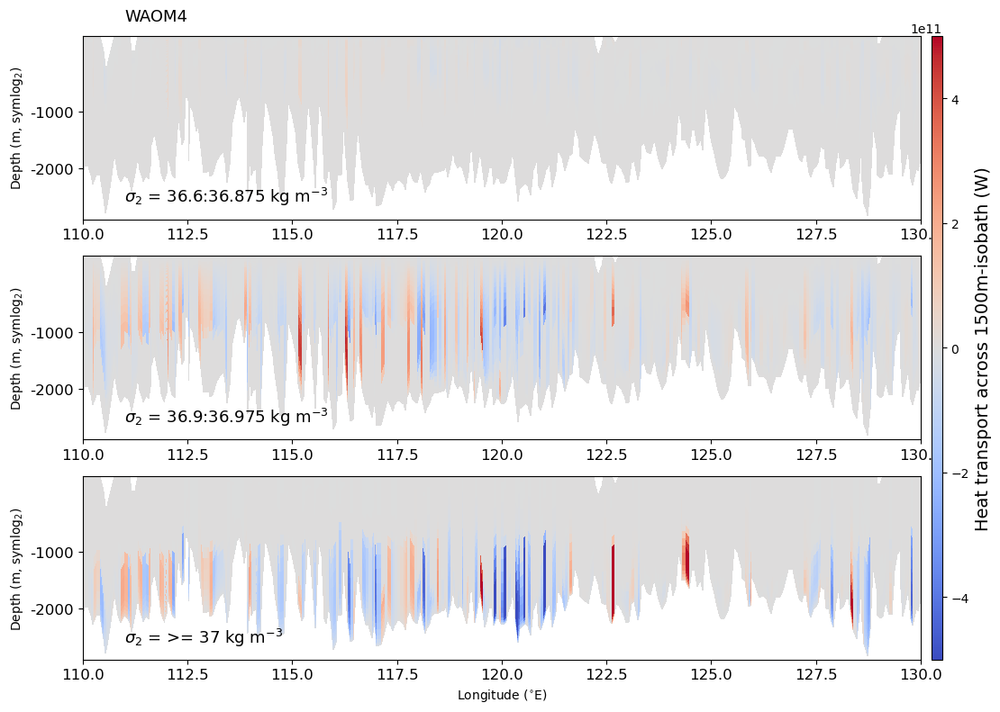

In [68]:
fig, ax = plt.subplots(nrows=3, figsize = (12, 9))
ax[0].text(111,100,'WAOM4',fontsize=13)
aa = ax[0].pcolormesh(lon_along_4km_CF[ind_TIS_4km_CF],z_rho_4km_CF.fillna(0)[:,ind_TIS_4km_CF],np.nanmean(np.nansum(Net_heat_transport_4km_CF_irho2[:,20:28,:,ind_TIS_4km_CF], axis=1), axis=0), vmin=-5e11, vmax=5e11, cmap='coolwarm')
ax[0].text(111,-1600,'$\sigma_{2}$ = 36.6:36.875 kg m$^{-3}$',fontsize=13)
ax[0].set_xlim(110,130)

ax[1].pcolormesh(lon_along_4km_CF[ind_TIS_4km_CF],z_rho_4km_CF.fillna(0)[:,ind_TIS_4km_CF],np.nanmean(np.nansum(Net_heat_transport_4km_CF_irho2[:,28:32,:,ind_TIS_4km_CF], axis=1), axis=0), vmin=-5e11, vmax=5e11, cmap='coolwarm')
ax[1].text(111,-1600,'$\sigma_{2}$ = 36.9:36.975 kg m$^{-3}$',fontsize=13)
ax[1].set_xlim(110,130)

ax[2].pcolormesh(lon_along_4km_CF[ind_TIS_4km_CF],z_rho_4km_CF.fillna(0)[:,ind_TIS_4km_CF],np.nanmean(np.nansum(Net_heat_transport_4km_CF_irho2[:,32:35,:,ind_TIS_4km_CF], axis=1), axis=0), vmin=-5e11, vmax=5e11, cmap='coolwarm')
ax[2].text(111,-1600,'$\sigma_{2}$ = >= 37 kg m$^{-3}$',fontsize=13)
ax[2].set_xlim(110,130)

for bb in range(0,3):
    # ax[bb].text(1,-2500,'$\sigma_{2}$ = 37.1:37.125 kg m$^{-3}$',fontsize=14)
    ax[bb].set_yscale('symlog',base = 2, linthresh=700)
    ax[bb].set_ylabel('Depth (m, symlog$_2$)')
    ax[bb].set_yticklabels(['-2000','-1000','-500'])
    ax[bb].set_aspect('auto')
    ax[bb].tick_params(labelsize=12)
ax[2].set_xlabel('Longitude ($^{\circ}$E)')

cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
cb = plt.colorbar(aa, cax=cax1, orientation='vertical')
cb.ax.set_ylabel('Heat transport across 1500m-isobath (W)', fontsize=14)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom4_Net_heat_transp_1500m_rho2_annual_EAntTIS.png"
plt.savefig(name_fig, dpi=300)

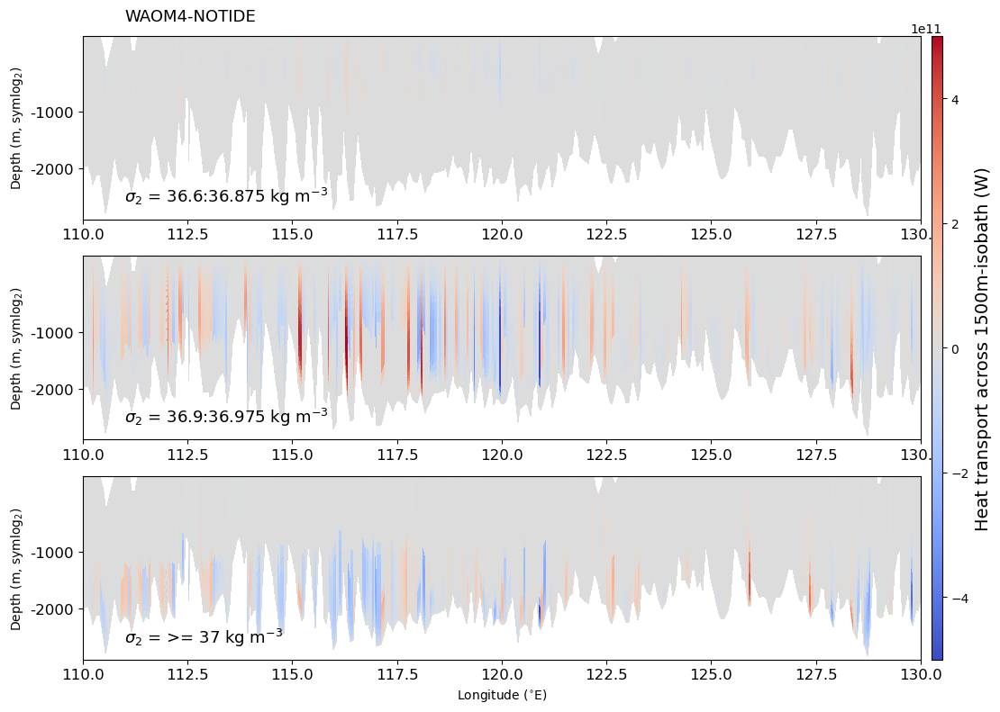

In [69]:
fig, ax = plt.subplots(nrows=3, figsize = (12, 9))
ax[0].text(111,100,'WAOM4-NOTIDE',fontsize=13)
aa = ax[0].pcolormesh(lon_along_4km_CF[ind_TIS_4km_CF],z_rho_4km_CF.fillna(0)[:,ind_TIS_4km_CF],np.nanmean(np.nansum(Net_heat_transport_4km_CFNT_irho2[:,20:28,:,ind_TIS_4km_CF], axis=1), axis=0), vmin=-5e11, vmax=5e11, cmap='coolwarm')
ax[0].text(111,-1600,'$\sigma_{2}$ = 36.6:36.875 kg m$^{-3}$',fontsize=13)
ax[0].set_xlim(110,130)

ax[1].pcolormesh(lon_along_4km_CF[ind_TIS_4km_CF],z_rho_4km_CF.fillna(0)[:,ind_TIS_4km_CF],np.nanmean(np.nansum(Net_heat_transport_4km_CFNT_irho2[:,28:32,:,ind_TIS_4km_CF], axis=1), axis=0), vmin=-5e11, vmax=5e11, cmap='coolwarm')
ax[1].text(111,-1600,'$\sigma_{2}$ = 36.9:36.975 kg m$^{-3}$',fontsize=13)
ax[1].set_xlim(110,130)

ax[2].pcolormesh(lon_along_4km_CF[ind_TIS_4km_CF],z_rho_4km_CF.fillna(0)[:,ind_TIS_4km_CF],np.nanmean(np.nansum(Net_heat_transport_4km_CFNT_irho2[:,32:35,:,ind_TIS_4km_CF], axis=1), axis=0), vmin=-5e11, vmax=5e11, cmap='coolwarm')
ax[2].text(111,-1600,'$\sigma_{2}$ = >= 37 kg m$^{-3}$',fontsize=13)
ax[2].set_xlim(110,130)

for bb in range(0,3):
    # ax[bb].text(1,-2500,'$\sigma_{2}$ = 37.1:37.125 kg m$^{-3}$',fontsize=14)
    ax[bb].set_yscale('symlog',base = 2, linthresh=700)
    ax[bb].set_ylabel('Depth (m, symlog$_2$)')
    ax[bb].set_yticklabels(['-2000','-1000','-500'])
    ax[bb].set_aspect('auto')
    ax[bb].tick_params(labelsize=12)
ax[2].set_xlabel('Longitude ($^{\circ}$E)')

cax1 = plt.axes([0.91, 0.11, 0.01, 0.77])
cb = plt.colorbar(aa, cax=cax1, orientation='vertical')
cb.ax.set_ylabel('Heat transport across 1500m-isobath (W)', fontsize=14)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom4-notides_Net_heat_transp_1500m_rho2_annual_EAntTIS.png"
plt.savefig(name_fig, dpi=300)

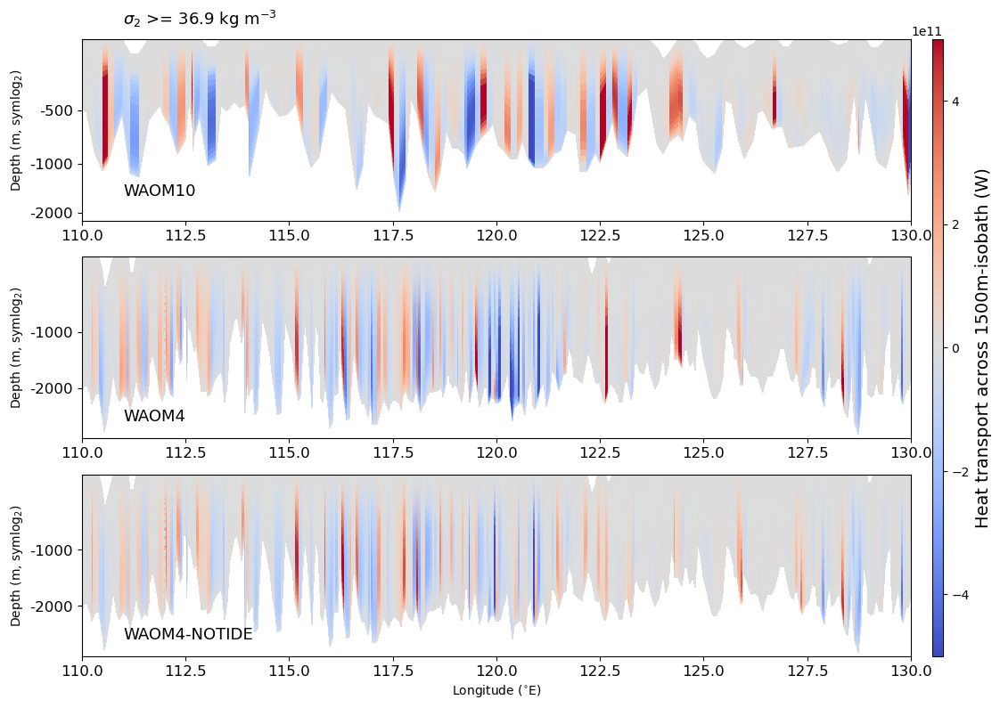

In [76]:
# 1 figure for sig2>=36.9 for WAOM10x4x4NT

fig, ax = plt.subplots(nrows=3, figsize = (12, 9))
ax[0].text(111,100,'$\sigma_{2}$ >= 36.9 kg m$^{-3}$',fontsize=13)
aa=ax[0].pcolormesh(lon_along_4km_CF[ind_TIS_4km_CF],np.nanmean(z_rho_4km_CF.fillna(0)[:,:,ind_TIS_4km_CF], axis=0),np.nanmean(np.nansum(Net_heat_transport_4km_CF_irho2[:,28:35,:,ind_TIS_4km_CF], axis=1), axis=0), vmin=-5e11, vmax=5e11, cmap='coolwarm')
ax[0].text(111,-1600,'WAOM10',fontsize=13)
ax[0].set_xlim(110,130)

aa=ax[1].pcolormesh(lon_along_4km_CF[ind_TIS_4km_CF],z_rho_4km_CF.fillna(0)[:,ind_TIS_4km_CF],np.nanmean(np.nansum(Net_heat_transport_4km_CF_irho2[:,28:35,:,ind_TIS_4km_CF], axis=1), axis=0), vmin=-5e11, vmax=5e11, cmap='coolwarm')
ax[1].text(111,-1600,'WAOM4',fontsize=13)
ax[1].set_xlim(110,130)

aa=ax[2].pcolormesh(lon_along_4km_CF[ind_TIS_4km_CF],z_rho_4km_CF.fillna(0)[:,ind_TIS_4km_CF],np.nanmean(np.nansum(Net_heat_transport_4km_CFNT_irho2[:,28:35,:,ind_TIS_4km_CF], axis=1), axis=0), vmin=-5e11, vmax=5e11, cmap='coolwarm')
ax[2].text(111,-1600,'WAOM4-NOTIDE',fontsize=13)
ax[2].set_xlim(110,130)

for bb in range(0,3):
    # ax[bb].text(1,-2500,'$\sigma_{2}$ = 37.1:37.125 kg m$^{-3}$',fontsize=14)
    ax[bb].set_yscale('symlog',base = 2, linthresh=700)
    ax[bb].set_ylabel('Depth (m, symlog$_2$)')
    ax[bb].set_yticklabels(['-2000','-1000','-500'])
    ax[bb].set_aspect('auto')
    ax[bb].tick_params(labelsize=12)
ax[2].set_xlabel('Longitude ($^{\circ}$E)')

cax1 = plt.axes([0.92, 0.11, 0.01, 0.77])
cb = plt.colorbar(aa, cax=cax1, orientation='vertical')
cb.ax.set_ylabel('Heat transport across 1500m-isobath (W)', fontsize=14)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom10x4x4NT_Net_heat_transp_1500m_rho2_annual_EAntTIS.png"
plt.savefig(name_fig, dpi=300)

In [70]:
print(lon_along_4km_CF[int(ind_EAnt_4km_CF[35])])
# print(lon_along_4km_CF.shape, int(ind_EAnt_4km_CF[35]))

<xarray.Variable ()>
array(60.089004)
Attributes:
    long_name:      longitude of u-points
    standard_name:  longitude
    units:          degree_east


In [71]:
# plt.plot(ind_EAnt_4km_CF[35:-1]) # remove jumping in indexes, 10km_CF
# plt.plot(ind_EAnt_4km_CF[111:-1]) # remove jumping in indexes, 4km_CF


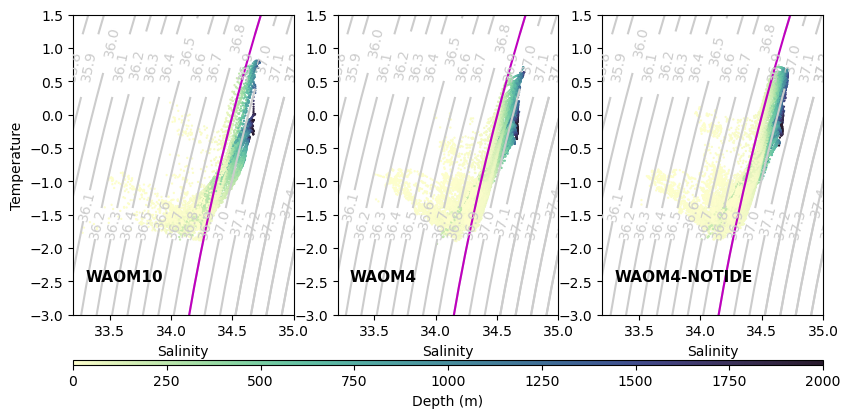

2023-10-10 17:56:54,950 - distributed.nanny - WARNING - Restarting worker
2023-10-10 17:56:54,954 - distributed.nanny - WARNING - Restarting worker
2023-10-10 17:56:54,959 - distributed.nanny - WARNING - Restarting worker
2023-10-10 17:56:54,990 - distributed.nanny - WARNING - Restarting worker
2023-10-10 17:56:54,999 - distributed.nanny - WARNING - Restarting worker
2023-10-10 17:56:55,009 - distributed.nanny - WARNING - Restarting worker
2023-10-10 17:56:55,019 - distributed.nanny - WARNING - Restarting worker
2023-10-10 17:56:55,059 - distributed.nanny - WARNING - Restarting worker
2023-10-10 17:56:55,062 - distributed.nanny - WARNING - Restarting worker
2023-10-10 17:56:55,066 - distributed.nanny - WARNING - Restarting worker
2023-10-10 17:56:55,072 - distributed.nanny - WARNING - Restarting worker
2023-10-10 17:56:55,079 - distributed.nanny - WARNING - Restarting worker
2023-10-10 17:56:55,092 - distributed.nanny - WARNING - Restarting worker
2023-10-10 17:56:55,101 - distributed.

In [80]:
import cmocean

fig, ax = plt.subplots(nrows=1, ncols=3, figsize = (15, 5))
# normal isopycnals
for bb in range(0,3):
    CS1 = ax[bb].contour(Si,Ti,dens.transpose(), levels=np.arange(35.5,38,.1),linestyles='solid', colors=[(.8,0.8,0.8)], linewidth=0.1)
    ax[bb].clabel(CS1, CS1.levels, inline=True, fontsize=10)
    CS2 = ax[bb].contour(Si,Ti,dens.transpose(), levels=np.arange(37.2,38,.1),linestyles='solid', colors=[(.8,0.8,0.8)], linewidth=0.1)
    ax[bb].clabel(CS2, CS2.levels, inline=True, fontsize=10)
    ax[bb].set_xlim([33.2,35])
    ax[bb].set_ylim([-3,1.5])
    ax[0].set_ylabel('Temperature')
    ax[bb].set_xlabel('Salinity')# East antarct.

    c369 = ax[bb].contour(Si,Ti,dens.transpose(), levels=[36.9, 37.9],linestyles='solid', colors='m', linewidth=0.1)
    ax[bb].clabel(CS1, CS1.levels, inline=True, fontsize=10)
            
sc = ax[0].scatter(salt_4km_CF.isel(contour_index_array=ind_TIS_4km_CF[:]).mean('ocean_time'),temp_4km_CF.isel(contour_index_array=ind_TIS_4km_CF[:]).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_TIS_4km_CF[:]).mean('ocean_time'),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[0].text(33.3,-2.5,'WAOM10', fontsize=11, fontweight='bold')

sc = ax[1].scatter(salt_4km_CF.isel(contour_index_array=ind_TIS_4km_CF[:]).mean('ocean_time'),temp_4km_CF.isel(contour_index_array=ind_TIS_4km_CF[:]).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_TIS_4km_CF[:]),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[1].text(33.3,-2.5,'WAOM4', fontsize=11, fontweight='bold')

sc = ax[2].scatter(salt_4km_CFNT.isel(contour_index_array=ind_TIS_4km_CF[:]).mean('ocean_time'),temp_4km_CFNT.isel(contour_index_array=ind_TIS_4km_CF[:]).mean('ocean_time'),
                 c=-z_rho_4km_CF.isel(contour_index_array=ind_TIS_4km_CF[:]),marker="p", s=(72./fig.dpi)**2, 
                 label='Annual avg', cmap=cmocean.cm.deep, vmin=0, vmax=2000)
ax[2].text(33.3,-2.5,'WAOM4-NOTIDE', fontsize=11, fontweight='bold')

# - cbar horiz
cbar_ax1 = fig.add_axes([0.25, 0.2, 0.5, 0.01])
fig.colorbar(sc, cax=cbar_ax1, orientation='horizontal')
cbar_ax1.set_xlabel('Depth (m)')

plt.subplots_adjust(left=0.25, right=0.75, bottom=0.3, top=0.9)

name_fig="/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/sigma_2/waom10x4x4NT_TSdiag_1500m_rho2_annnual_EastAnt.png"
plt.savefig(name_fig, dpi=300)